# Codon analyis Ribo-srq and Total RNA-seq Up/Down

## Unt Vs. TGFb Up/Down

In [2]:
import pandas as pd
import numpy as np
from Bio import SeqIO
import logging
import os

# Set random seed
np.random.seed(42)

# Set up logging
logging.basicConfig(filename='fasta_generation.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# File paths
deg_file = 'Riboseq_Total_RNAseq_Davide_Like_topTable_Unt_Vs_TGFb.txt'
counts_file = 'blancgrp_161021_Riboseq.counts.raw.txt'
mapping_file = 'm39_canonicalTranscriptsGeneName.txt'
fasta_file = '../m39_transcript_region_fasta/protein_coding_CDS.fasta'
up_fasta_output = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_fasta_output = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'

# rRNA genes to exclude
rRNA_genes = [
    '5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS',
    'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s',
    'rDNA_promoter', 'rDNA_promoter1'
]

# Additional genes to exclude
exclude_genes = ['mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846']

# Step 1: Load DEGs data
print("\nLoading DEGs data...")
logging.info("Loading DEGs data...")
try:
    df = pd.read_csv(deg_file, sep='\t', index_col=0)
    print(f"Loaded DEGs: {df.shape}")
    logging.info(f"Loaded DEGs: {df.shape}")
except Exception as e:
    print(f"Error loading DEGs file: {e}")
    logging.error(f"Error loading DEGs file: {e}")
    exit(1)

# Verify required columns
required_cols = ['logFC', 'adj.P.Val']
if not all(col in df.columns for col in required_cols):
    print(f"Error: Missing required columns: {required_cols}")
    logging.error(f"Missing required columns: {required_cols}")
    exit(1)

# Filter DE genes with |logFC| >= 0.5 and adj.P.Val < 0.05
de_genes = df[(df['logFC'].abs() >= 0.5) & (df['adj.P.Val'] < 0.05)]
up_genes = de_genes[de_genes['logFC'] >= 0.5]
down_genes = de_genes[de_genes['logFC'] <= -0.5]
print(f"Up-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(up_genes)}")
print(f"Down-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(down_genes)}")
logging.info(f"Up-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(up_genes)}")
logging.info(f"Down-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(down_genes)}")

# Remove excluded genes
up_genes = up_genes[~up_genes.index.isin(rRNA_genes + exclude_genes)]
down_genes = down_genes[~down_genes.index.isin(rRNA_genes + exclude_genes)]
print(f"Up-regulated genes after exclusions: {len(up_genes)}")
print(f"Down-regulated genes after exclusions: {len(down_genes)}")
logging.info(f"Up-regulated genes after exclusions: {len(up_genes)}")
logging.info(f"Down-regulated genes after exclusions: {len(down_genes)}")

# Step 2: Load counts for control CPM
print("\nLoading counts data...")
logging.info("Loading counts data...")
try:
    counts_df = pd.read_csv(counts_file, sep='\t', index_col=0)
    print(f"Loaded counts: {counts_df.shape}")
    logging.info(f"Loaded counts: {counts_df.shape}")
    print(f"Counts columns: {counts_df.columns.tolist()}")
    logging.info(f"Counts columns: {counts_df.columns.tolist()}")
except FileNotFoundError:
    print(f"Error: {counts_file} not found.")
    logging.error(f"Error: {counts_file} not found.")
    exit(1)

# Validate control columns
control_cols = ['RD0175', 'RD0176', 'RD0177']
if not all(c in counts_df.columns for c in control_cols):
    print(f"Error: Control columns {control_cols} not in counts_df.columns: {counts_df.columns.tolist()}")
    logging.error(f"Control columns {control_cols} not in counts_df.columns: {counts_df.columns.tolist()}")
    exit(1)

# Check for non-numeric data
if not counts_df[control_cols].apply(pd.to_numeric, errors='coerce').notnull().all().all():
    print("Warning: Non-numeric values in counts. Converting to numeric.")
    logging.warning("Non-numeric values in counts. Converting to numeric.")
    counts_df[control_cols] = counts_df[control_cols].apply(pd.to_numeric, errors='coerce').fillna(0)

# Remove rRNA and excluded genes before CPM calculation
counts_df = counts_df[~counts_df.index.isin(rRNA_genes + exclude_genes)]
print(f"Counts after removing rRNA and excluded genes: {counts_df.shape}")
logging.info(f"Counts after removing rRNA and excluded genes: {counts_df.shape}")

# Calculate CPM
counts_control = counts_df[control_cols]
cpm_control = counts_control.div(counts_control.sum(), axis=1) * 1e6
mean_cpm = cpm_control.mean(axis=1)
print(f"Mean CPM stats:\n{mean_cpm.describe()}")
logging.info(f"Mean CPM stats:\n{mean_cpm.describe()}")

# Step 3: Load mapping file
print("\nLoading mapping file...")
logging.info("Loading mapping file...")
try:
    mapping = pd.read_csv(mapping_file, sep='\t', skiprows=1, 
                         names=['transcript_id', 'gene_name', 'gene_id'])
    print(f"Loaded mapping: {len(mapping)} entries")
    logging.info(f"Loaded mapping: {len(mapping)} entries")
except Exception as e:
    print(f"Error loading mapping: {e}")
    logging.error(f"Error loading mapping: {e}")
    exit(1)

# Create mapping dictionary
mapping_dict = mapping.set_index('gene_name')['transcript_id'].to_dict()
reverse_mapping_dict = mapping.set_index('transcript_id')['gene_name'].to_dict()
print(f"Sample mapping gene names: {list(mapping_dict.keys())[:5]}")
logging.info(f"Sample mapping gene names: {list(mapping_dict.keys())[:5]}")

# Step 4: Validate and generate FASTA files
print("\nGenerating FASTA files...")
logging.info("Generating FASTA files...")
up_sequences = []
down_sequences = []

try:
    fasta_records = list(SeqIO.parse(fasta_file, 'fasta'))
    print(f"Loaded {len(fasta_records)} sequences from {fasta_file}")
    logging.info(f"Loaded {len(fasta_records)} sequences from {fasta_file}")
except Exception as e:
    print(f"Error loading FASTA file: {e}")
    logging.error(f"Error loading FASTA file: {e}")
    exit(1)

# Process up-regulated genes
for gene in up_genes.index:
    transcript_id = mapping_dict.get(gene)
    if transcript_id:
        for record in fasta_records:
            if record.id == transcript_id:
                seq = str(record.seq).upper()
                # Validate sequence
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    print(f"Warning: Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    logging.warning(f"Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    continue
                up_sequences.append((transcript_id, gene, seq))
                break
    else:
        print(f"Warning: No transcript ID found for up-regulated gene {gene}")
        logging.warning(f"No transcript ID found for up-regulated gene {gene}")

# Process down-regulated genes
for gene in down_genes.index:
    transcript_id = mapping_dict.get(gene)
    if transcript_id:
        for record in fasta_records:
            if record.id == transcript_id:
                seq = str(record.seq).upper()
                # Validate sequence
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    print(f"Warning: Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    logging.warning(f"Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    continue
                down_sequences.append((transcript_id, gene, seq))
                break
    else:
        print(f"Warning: No transcript ID found for down-regulated gene {gene}")
        logging.warning(f"No transcript ID found for down-regulated gene {gene}")

# Write FASTA files
try:
    with open(up_fasta_output, 'w') as f:
        for transcript_id, gene, seq in up_sequences:
            f.write(f">{transcript_id}|{gene}\n{seq}\n")
    print(f"Saved {len(up_sequences)} sequences to {up_fasta_output}")
    logging.info(f"Saved {len(up_sequences)} sequences to {up_fasta_output}")
except Exception as e:
    print(f"Error writing up-regulated FASTA: {e}")
    logging.error(f"Error writing up-regulated FASTA: {e}")
    exit(1)

try:
    with open(down_fasta_output, 'w') as f:
        for transcript_id, gene, seq in down_sequences:
            f.write(f">{transcript_id}|{gene}\n{seq}\n")
    print(f"Saved {len(down_sequences)} sequences to {down_fasta_output}")
    logging.info(f"Saved {len(down_sequences)} sequences to {down_fasta_output}")
except Exception as e:
    print(f"Error writing down-regulated FASTA: {e}")
    logging.error(f"Error writing down-regulated FASTA: {e}")
    exit(1)

# Debug: Check sequences
print(f"\nSample up-regulated sequences (first 3):")
logging.info("Sample up-regulated sequences (first 3):")
for i, (tid, gene, seq) in enumerate(up_sequences[:3]):
    print(f"{i+1}. {gene} ({tid}): {seq[:30]}...")
    logging.info(f"{i+1}. {gene} ({tid}): {seq[:30]}...")
print(f"Sample down-regulated sequences (first 3):")
logging.info("Sample down-regulated sequences (first 3):")
for i, (tid, gene, seq) in enumerate(down_sequences[:3]):
    print(f"{i+1}. {gene} ({tid}): {seq[:30]}...")
    logging.info(f"{i+1}. {gene} ({tid}): {seq[:30]}...")


Loading DEGs data...
Loaded DEGs: (10293, 6)
Up-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): 289
Down-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): 3189
Up-regulated genes after exclusions: 289
Down-regulated genes after exclusions: 3189

Loading counts data...
Loaded counts: (52337, 9)
Counts columns: ['RD0175', 'RD0176', 'RD0177', 'RD0178', 'RD0179', 'RD0180', 'RD0184', 'RD0185', 'RD0186']
Counts after removing rRNA and excluded genes: (52318, 9)
Mean CPM stats:
count    52318.000000
mean        19.113881
std        188.310705
min          0.000000
25%          0.000000
50%          0.000000
75%          1.663928
max      28638.240130
dtype: float64

Loading mapping file...
Loaded mapping: 22383 entries
Sample mapping gene names: ['Rpp14', 'Tas2r116', 'Tas2r103', 'Magea4', 'Mdga2']

Generating FASTA files...
Loaded 20974 sequences from ../m39_transcript_region_fasta/protein_coding_CDS.fasta
Saved 278 sequences to Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_

## TGFb Vs. CX5461 Up/Down

In [3]:
import pandas as pd
import numpy as np
from Bio import SeqIO
import logging
import os

# Set random seed
np.random.seed(42)

# Set up logging
logging.basicConfig(filename='fasta_generation.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# File paths
deg_file = 'Riboseq_Total_RNAseq_Davide_Like_topTable_CX5461_Vs_TGFb.txt'
counts_file = 'blancgrp_161021_Riboseq.counts.raw.txt'
mapping_file = 'm39_canonicalTranscriptsGeneName.txt'
fasta_file = '../m39_transcript_region_fasta/protein_coding_CDS.fasta'
up_fasta_output = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
down_fasta_output = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# rRNA genes to exclude
rRNA_genes = [
    '5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS',
    'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s',
    'rDNA_promoter', 'rDNA_promoter1'
]

# Additional genes to exclude
exclude_genes = ['mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846']

# Step 1: Load DEGs data
print("\nLoading DEGs data...")
logging.info("Loading DEGs data...")
try:
    df = pd.read_csv(deg_file, sep='\t', index_col=0)
    print(f"Loaded DEGs: {df.shape}")
    logging.info(f"Loaded DEGs: {df.shape}")
except Exception as e:
    print(f"Error loading DEGs file: {e}")
    logging.error(f"Error loading DEGs file: {e}")
    exit(1)

# Verify required columns
required_cols = ['logFC', 'adj.P.Val']
if not all(col in df.columns for col in required_cols):
    print(f"Error: Missing required columns: {required_cols}")
    logging.error(f"Missing required columns: {required_cols}")
    exit(1)

# Filter DE genes with |logFC| >= 0.5 and adj.P.Val < 0.05
de_genes = df[(df['logFC'].abs() >= 0.5) & (df['adj.P.Val'] < 0.05)]
up_genes = de_genes[de_genes['logFC'] >= 0.5]
down_genes = de_genes[de_genes['logFC'] <= -0.5]
print(f"Up-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(up_genes)}")
print(f"Down-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(down_genes)}")
logging.info(f"Up-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(up_genes)}")
logging.info(f"Down-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): {len(down_genes)}")

# Remove excluded genes
up_genes = up_genes[~up_genes.index.isin(rRNA_genes + exclude_genes)]
down_genes = down_genes[~down_genes.index.isin(rRNA_genes + exclude_genes)]
print(f"Up-regulated genes after exclusions: {len(up_genes)}")
print(f"Down-regulated genes after exclusions: {len(down_genes)}")
logging.info(f"Up-regulated genes after exclusions: {len(up_genes)}")
logging.info(f"Down-regulated genes after exclusions: {len(down_genes)}")

# Step 2: Load counts for control CPM
print("\nLoading counts data...")
logging.info("Loading counts data...")
try:
    counts_df = pd.read_csv(counts_file, sep='\t', index_col=0)
    print(f"Loaded counts: {counts_df.shape}")
    logging.info(f"Loaded counts: {counts_df.shape}")
    print(f"Counts columns: {counts_df.columns.tolist()}")
    logging.info(f"Counts columns: {counts_df.columns.tolist()}")
except FileNotFoundError:
    print(f"Error: {counts_file} not found.")
    logging.error(f"Error: {counts_file} not found.")
    exit(1)

# Validate control columns
control_cols = ['RD0175', 'RD0176', 'RD0177']
if not all(c in counts_df.columns for c in control_cols):
    print(f"Error: Control columns {control_cols} not in counts_df.columns: {counts_df.columns.tolist()}")
    logging.error(f"Control columns {control_cols} not in counts_df.columns: {counts_df.columns.tolist()}")
    exit(1)

# Check for non-numeric data
if not counts_df[control_cols].apply(pd.to_numeric, errors='coerce').notnull().all().all():
    print("Warning: Non-numeric values in counts. Converting to numeric.")
    logging.warning("Non-numeric values in counts. Converting to numeric.")
    counts_df[control_cols] = counts_df[control_cols].apply(pd.to_numeric, errors='coerce').fillna(0)

# Remove rRNA and excluded genes before CPM calculation
counts_df = counts_df[~counts_df.index.isin(rRNA_genes + exclude_genes)]
print(f"Counts after removing rRNA and excluded genes: {counts_df.shape}")
logging.info(f"Counts after removing rRNA and excluded genes: {counts_df.shape}")

# Calculate CPM
counts_control = counts_df[control_cols]
cpm_control = counts_control.div(counts_control.sum(), axis=1) * 1e6
mean_cpm = cpm_control.mean(axis=1)
print(f"Mean CPM stats:\n{mean_cpm.describe()}")
logging.info(f"Mean CPM stats:\n{mean_cpm.describe()}")

# Step 3: Load mapping file
print("\nLoading mapping file...")
logging.info("Loading mapping file...")
try:
    mapping = pd.read_csv(mapping_file, sep='\t', skiprows=1, 
                         names=['transcript_id', 'gene_name', 'gene_id'])
    print(f"Loaded mapping: {len(mapping)} entries")
    logging.info(f"Loaded mapping: {len(mapping)} entries")
except Exception as e:
    print(f"Error loading mapping: {e}")
    logging.error(f"Error loading mapping: {e}")
    exit(1)

# Create mapping dictionary
mapping_dict = mapping.set_index('gene_name')['transcript_id'].to_dict()
reverse_mapping_dict = mapping.set_index('transcript_id')['gene_name'].to_dict()
print(f"Sample mapping gene names: {list(mapping_dict.keys())[:5]}")
logging.info(f"Sample mapping gene names: {list(mapping_dict.keys())[:5]}")

# Step 4: Validate and generate FASTA files
print("\nGenerating FASTA files...")
logging.info("Generating FASTA files...")
up_sequences = []
down_sequences = []

try:
    fasta_records = list(SeqIO.parse(fasta_file, 'fasta'))
    print(f"Loaded {len(fasta_records)} sequences from {fasta_file}")
    logging.info(f"Loaded {len(fasta_records)} sequences from {fasta_file}")
except Exception as e:
    print(f"Error loading FASTA file: {e}")
    logging.error(f"Error loading FASTA file: {e}")
    exit(1)

# Process up-regulated genes
for gene in up_genes.index:
    transcript_id = mapping_dict.get(gene)
    if transcript_id:
        for record in fasta_records:
            if record.id == transcript_id:
                seq = str(record.seq).upper()
                # Validate sequence
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    print(f"Warning: Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    logging.warning(f"Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    continue
                up_sequences.append((transcript_id, gene, seq))
                break
    else:
        print(f"Warning: No transcript ID found for up-regulated gene {gene}")
        logging.warning(f"No transcript ID found for up-regulated gene {gene}")

# Process down-regulated genes
for gene in down_genes.index:
    transcript_id = mapping_dict.get(gene)
    if transcript_id:
        for record in fasta_records:
            if record.id == transcript_id:
                seq = str(record.seq).upper()
                # Validate sequence
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    print(f"Warning: Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    logging.warning(f"Skipping {gene} ({transcript_id}): Invalid sequence (length {len(seq)} not divisible by 3 or contains ambiguous bases)")
                    continue
                down_sequences.append((transcript_id, gene, seq))
                break
    else:
        print(f"Warning: No transcript ID found for down-regulated gene {gene}")
        logging.warning(f"No transcript ID found for down-regulated gene {gene}")

# Write FASTA files
try:
    with open(up_fasta_output, 'w') as f:
        for transcript_id, gene, seq in up_sequences:
            f.write(f">{transcript_id}|{gene}\n{seq}\n")
    print(f"Saved {len(up_sequences)} sequences to {up_fasta_output}")
    logging.info(f"Saved {len(up_sequences)} sequences to {up_fasta_output}")
except Exception as e:
    print(f"Error writing up-regulated FASTA: {e}")
    logging.error(f"Error writing up-regulated FASTA: {e}")
    exit(1)

try:
    with open(down_fasta_output, 'w') as f:
        for transcript_id, gene, seq in down_sequences:
            f.write(f">{transcript_id}|{gene}\n{seq}\n")
    print(f"Saved {len(down_sequences)} sequences to {down_fasta_output}")
    logging.info(f"Saved {len(down_sequences)} sequences to {down_fasta_output}")
except Exception as e:
    print(f"Error writing down-regulated FASTA: {e}")
    logging.error(f"Error writing down-regulated FASTA: {e}")
    exit(1)

# Debug: Check sequences
print(f"\nSample up-regulated sequences (first 3):")
logging.info("Sample up-regulated sequences (first 3):")
for i, (tid, gene, seq) in enumerate(up_sequences[:3]):
    print(f"{i+1}. {gene} ({tid}): {seq[:30]}...")
    logging.info(f"{i+1}. {gene} ({tid}): {seq[:30]}...")
print(f"Sample down-regulated sequences (first 3):")
logging.info("Sample down-regulated sequences (first 3):")
for i, (tid, gene, seq) in enumerate(down_sequences[:3]):
    print(f"{i+1}. {gene} ({tid}): {seq[:30]}...")
    logging.info(f"{i+1}. {gene} ({tid}): {seq[:30]}...")


Loading DEGs data...
Loaded DEGs: (10293, 6)
Up-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): 815
Down-regulated genes (|logFC| >= 0.5, adj.P.Val < 0.05): 170
Up-regulated genes after exclusions: 814
Down-regulated genes after exclusions: 170

Loading counts data...
Loaded counts: (52337, 9)
Counts columns: ['RD0175', 'RD0176', 'RD0177', 'RD0178', 'RD0179', 'RD0180', 'RD0184', 'RD0185', 'RD0186']
Counts after removing rRNA and excluded genes: (52318, 9)
Mean CPM stats:
count    52318.000000
mean        19.113881
std        188.310705
min          0.000000
25%          0.000000
50%          0.000000
75%          1.663928
max      28638.240130
dtype: float64

Loading mapping file...
Loaded mapping: 22383 entries
Sample mapping gene names: ['Rpp14', 'Tas2r116', 'Tas2r103', 'Magea4', 'Mdga2']

Generating FASTA files...
Loaded 20974 sequences from ../m39_transcript_region_fasta/protein_coding_CDS.fasta
Saved 771 sequences to Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_lo

## TGFb Up only codon

### All codons (clustering)

Loaded 278 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta (TGFb_Up) with label 1
Loaded 3051 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta (TGFb_Down) with label 0
Loaded 771 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta (TGFbCX5461_Up) with label 3
Loaded 162 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta (TGFbCX5461_Down) with label 2
Label distribution: [3051  278  162  771] (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)
Loaded 4262 sequences: 278 TGFb_Up, 3051 TGFb_Down, 771 TGFbCX5461_Up, 162 TGFbCX5461_Down
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
X_codon type: <class 'scipy.sparse._csr.csr_matrix'>, X_codon_normalized type: <class 'scipy.sparse._coo.coo_matrix'>, X_codon_scaled type: <class 'nump

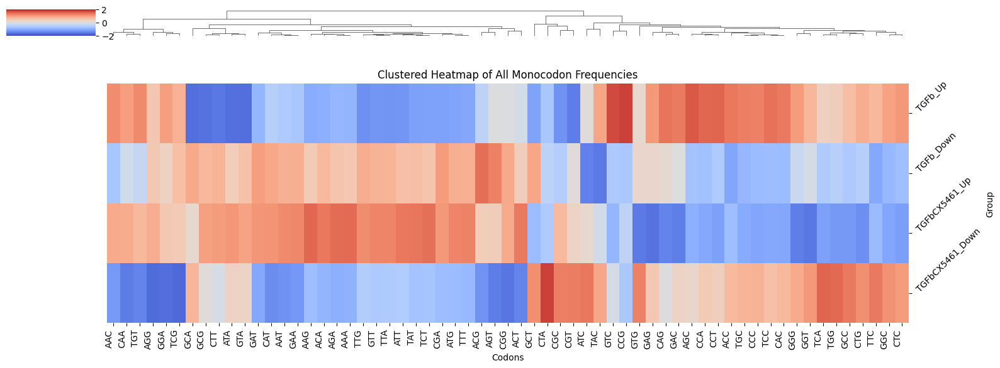

Generated clustered heatmap with shape (4, 61) for heatmap_all_monocodon_clustered
Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt
Total runtime: 0.05 minutes


In [7]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
import time
import os

# Set up logging
logging.basicConfig(filename='heatmap_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Start timing
start_time = time.time()

# Combined heatmap plotting function with enhanced color gradient, no annotations
def plot_combined_heatmap(X, feature_names, labels, filename='heatmap_all_monocodon_clustered'):
    try:
        # Ensure labels is a NumPy array
        labels = np.array(labels, dtype=int)
        group_masks = {
            'TGFb_Up': labels == 1,
            'TGFb_Down': labels == 0,
            'TGFbCX5461_Up': labels == 3,
            'TGFbCX5461_Down': labels == 2
        }
        # Require all groups to have sequences
        missing_groups = [name for name, mask in group_masks.items() if mask.sum() == 0]
        if missing_groups:
            print(f"Error: No sequences for groups {missing_groups}. All groups required for heatmap.")
            logging.error(f"No sequences for groups {missing_groups}. All groups required for heatmap.")
            exit(1)
        for group_name, mask in group_masks.items():
            print(f"{group_name} mask sum: {mask.sum()} sequences")
            logging.info(f"{group_name} mask sum: {mask.sum()} sequences")
        
        # Compute mean feature values for each group
        X_means = []
        for mask in group_masks.values():
            if mask.sum() > 0:
                mean_values = np.mean(X[mask], axis=0)
                mean_values = np.nan_to_num(mean_values, nan=0.0, posinf=0.0, neginf=0.0)
                X_means.append(mean_values)
            else:
                print(f"Warning: Empty group detected after validation.")
                logging.warning(f"Empty group detected after validation.")
                exit(1)
        X_combined = np.vstack(X_means)
        print(f"Combined heatmap data shape: {X_combined.shape}")
        logging.info(f"Combined heatmap data shape: {X_combined.shape}")
        
        # Verify no NaN or Inf values
        if np.any(np.isnan(X_combined)) or np.any(np.isinf(X_combined)):
            print(f"Error: X_combined contains NaN or Inf values: {X_combined}")
            logging.error(f"X_combined contains NaN or Inf values: {X_combined}")
            exit(1)
        
        # Z-score normalization to emphasize small differences
        scaler = StandardScaler()
        X_combined = scaler.fit_transform(X_combined)
        X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Create DataFrame for clustering
        heatmap_df = pd.DataFrame(X_combined, index=list(group_masks.keys()), 
                                columns=feature_names)
        
        # Set color scale to highlight small differences
        data_std = np.std(X_combined)
        vmin, vmax = -2 * data_std, 2 * data_std  # ±2 standard deviations
        center = 0  # Center at zero for standardized data
        
        # Plot clustered heatmap with enhanced gradient, no annotations
        g = sns.clustermap(heatmap_df, col_cluster=True, row_cluster=False, cmap='coolwarm',
                          vmin=vmin, vmax=vmax, center=center, robust=True,
                          figsize=(16, 6), dendrogram_ratio=0.1, cbar_pos=(0.02, 0.8, 0.05, 0.18),
                          annot=False)
        g.ax_heatmap.set_title('Clustered Heatmap of All Monocodon Frequencies')
        g.ax_heatmap.set_xlabel('Codons')
        g.ax_heatmap.set_ylabel('Group')
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='right')
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=45, va='bottom')
        plt.tight_layout()
        g.savefig(f'{filename}.png', bbox_inches='tight')
        g.savefig(f'{filename}.svg', bbox_inches='tight')
        plt.show()
        plt.close()
        print(f"Generated clustered heatmap with shape {X_combined.shape} for {filename}")
        logging.info(f"Generated clustered heatmap with shape {X_combined.shape} for {filename}")
    except Exception as e:
        print(f"Clustered heatmap generation failed for {filename}: {e}")
        logging.error(f"Clustered heatmap generation failed for {filename}: {e}")
        raise e

# Codon table
STOP_CODONS = ['TAA', 'TAG', 'TGA']

def load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file):
    sequences, labels, gene_ids = [], [], []
    files_to_load = [
        (tgfb_up_file, 1, 'TGFb_Up'),
        (tgfb_down_file, 0, 'TGFb_Down'),
        (treated_up_file, 3, 'TGFbCX5461_Up'),
        (treated_down_file, 2, 'TGFbCX5461_Down')
    ]
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label, group_name in files_to_load:
            if not os.path.exists(file_path):
                print(f"Error: File {file_path} ({group_name}) not found. All FASTA files are required.")
                logging.error(f"File {file_path} ({group_name}) not found. All FASTA files are required.")
                exit(1)
            try:
                seq_count = 0
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} in {group_name} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id} in {group_name}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(int(label))
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
                    seq_count += 1
                print(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
                logging.info(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
            except Exception as e:
                print(f"Error reading {file_path} ({group_name}): {e}")
                logging.error(f"Error reading {file_path} ({group_name}): {e}")
                exit(1)
    if not sequences:
        print("No sequences loaded from any FASTA files. Exiting.")
        logging.error("No sequences loaded from any FASTA files. Exiting.")
        exit(1)
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    labels = np.array(labels, dtype=int)
    print(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    logging.info(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    # Verify all groups have sequences
    required_labels = [0, 1, 2, 3]
    missing_labels = [lbl for lbl in required_labels if np.sum(labels == lbl) == 0]
    if missing_labels:
        print(f"Error: No sequences for labels {missing_labels}. All groups required.")
        logging.error(f"No sequences for labels {missing_labels}. All groups required.")
        exit(1)
    return sequences, labels, gene_ids

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file)
print(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (61 codons, excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out() if codon.upper() not in STOP_CODONS]
# Filter stop codons from X_codon
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))
# Scale with StandardScaler
scaler = StandardScaler()
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")

# Debug codon features
print("NaNs in X_codon_scaled:", np.any(np.isnan(X_codon_scaled)))
print("Infs in X_codon_scaled:", np.any(np.isinf(X_codon_scaled)))
print("Monocodon features non-zero counts:", (X_codon_scaled != 0).sum())
logging.info(f"NaNs in X_codon_scaled: {np.any(np.isnan(X_codon_scaled))}")
logging.info(f"Infs in X_codon_scaled: {np.any(np.isinf(X_codon_scaled))}")
logging.info(f"Monocodon features non-zero counts: {(X_codon_scaled != 0).sum()}")

# Feature selection with LogisticRegression for TGFb Up vs. Down
try:
    k_features = 61
    print("Starting LogisticRegression feature selection on TGFb data...")
    logging.info("Starting LogisticRegression feature selection on TGFb data...")
    tgfb_mask = np.isin(labels, [0, 1])
    X_tgfb = X_codon_scaled[tgfb_mask]
    labels_tgfb = labels[tgfb_mask]
    print(f"TGFb data shape: {X_tgfb.shape}, Labels: {np.bincount(labels_tgfb)}")
    logging.info(f"TGFb data shape: {X_tgfb.shape}, Labels: {np.bincount(labels_tgfb)}")
    if X_tgfb.shape[0] == 0:
        raise ValueError("No TGFb data available for LogisticRegression")
    lr_tgfb = LogisticRegression(penalty='l1', solver='liblinear', C=1.0, random_state=42, max_iter=1000)
    lr_tgfb.fit(X_tgfb, labels_tgfb)
    tgfb_coefs = np.abs(lr_tgfb.coef_[0])
    non_zero_coefs = np.sum(tgfb_coefs != 0)
    print(f"TGFb LogisticRegression non-zero coefficients: {non_zero_coefs}")
    logging.info(f"TGFb LogisticRegression non-zero coefficients: {non_zero_coefs}")
    tgfb_indices = np.argsort(tgfb_coefs)[::-1][:k_features]
    tgfb_selected_features = [codon_feature_names[i] for i in tgfb_indices]
    X_tgfb_selected = X_codon_scaled[:, tgfb_indices]
    print(f"TGFb LogisticRegression selected {len(tgfb_selected_features)} features: {tgfb_selected_features}")
    logging.info(f"TGFb LogisticRegression selected {len(tgfb_selected_features)} features: {tgfb_selected_features}")
    print(f"TGFb LogisticRegression coefficients (top 5): {list(zip(tgfb_selected_features[:5], tgfb_coefs[tgfb_indices][:5]))}")
    logging.info(f"TGFb LogisticRegression coefficients (top 5): {list(zip(tgfb_selected_features[:5], tgfb_coefs[tgfb_indices][:5]))}")
except Exception as e:
    print(f"Error in LogisticRegression feature selection: {e}")
    logging.error(f"Error in LogisticRegression feature selection: {e}")
    exit(1)

# Generate clustered heatmap
try:
    plot_combined_heatmap(X_tgfb_selected, tgfb_selected_features, labels, 'heatmap_all_monocodon_clustered')
except Exception as e:
    print(f"Heatmap generation failed: {e}")
    logging.error(f"Heatmap generation failed: {e}")
    raise e

# Save feature matrices
try:
    X_codon_df = pd.DataFrame(X_codon_scaled, columns=codon_feature_names, index=gene_ids)
    X_codon_df.to_csv('monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    X_tgfb_selected_df = pd.DataFrame(X_tgfb_selected, columns=tgfb_selected_features, index=gene_ids)
    X_tgfb_selected_df.to_csv('tgfb_selected_monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
    logging.info("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrices: {e}")
    logging.error(f"Error saving feature matrices: {e}")

# Print total runtime
print(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")
logging.info(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")

### All codon (no clustering)

Loaded 278 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta (TGFb_Up) with label 1
Loaded 3051 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta (TGFb_Down) with label 0
Loaded 771 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta (TGFbCX5461_Up) with label 3
Loaded 162 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta (TGFbCX5461_Down) with label 2
Label distribution: [3051  278  162  771] (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)
Loaded 4262 sequences: 278 TGFb_Up, 3051 TGFb_Down, 771 TGFbCX5461_Up, 162 TGFbCX5461_Down
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
X_codon type: <class 'scipy.sparse._csr.csr_matrix'>, X_codon_normalized type: <class 'scipy.sparse._coo.coo_matrix'>, X_codon_scaled type: <class 'nump

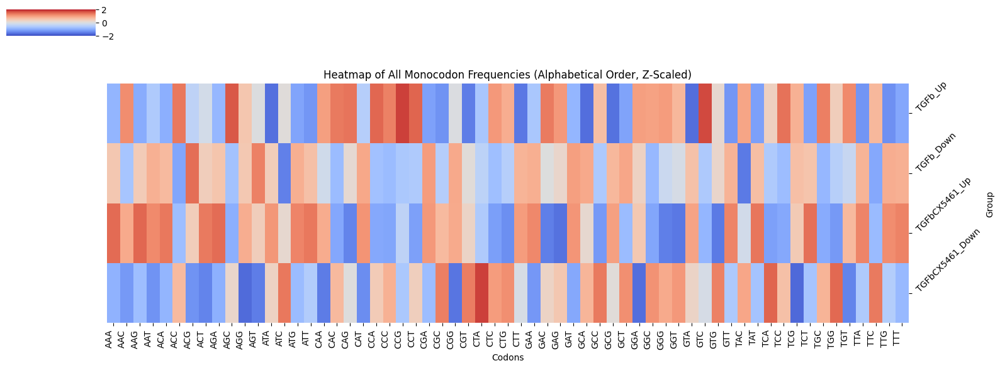

Generated heatmap with shape (4, 61) for heatmap_all_monocodon
Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt
Total runtime: 0.04 minutes


In [3]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
import time
import os

# Set up logging
logging.basicConfig(filename='heatmap_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Start timing
start_time = time.time()

# Combined heatmap plotting function with no clustering, alphabetical codon sorting, z-scaling
def plot_combined_heatmap(X, feature_names, labels, filename='heatmap_all_monocodon'):
    try:
        # Ensure labels is a NumPy array
        labels = np.array(labels, dtype=int)
        group_masks = {
            'TGFb_Up': labels == 1,
            'TGFb_Down': labels == 0,
            'TGFbCX5461_Up': labels == 3,
            'TGFbCX5461_Down': labels == 2
        }
        # Require all groups to have sequences
        missing_groups = [name for name, mask in group_masks.items() if mask.sum() == 0]
        if missing_groups:
            print(f"Error: No sequences for groups {missing_groups}. All groups required for heatmap.")
            logging.error(f"No sequences for groups {missing_groups}. All groups required for heatmap.")
            exit(1)
        for group_name, mask in group_masks.items():
            print(f"{group_name} mask sum: {mask.sum()} sequences")
            logging.info(f"{group_name} mask sum: {mask.sum()} sequences")
        
        # Compute mean feature values for each group
        X_means = []
        for mask in group_masks.values():
            if mask.sum() > 0:
                mean_values = np.mean(X[mask], axis=0)
                mean_values = np.nan_to_num(mean_values, nan=0.0, posinf=0.0, neginf=0.0)
                X_means.append(mean_values)
            else:
                print(f"Warning: Empty group detected after validation.")
                logging.warning(f"Empty group detected after validation.")
                exit(1)
        X_combined = np.vstack(X_means)
        print(f"Combined heatmap data shape: {X_combined.shape}")
        logging.info(f"Combined heatmap data shape: {X_combined.shape}")
        
        # Verify no NaN or Inf values
        if np.any(np.isnan(X_combined)) or np.any(np.isinf(X_combined)):
            print(f"Error: X_combined contains NaN or Inf values: {X_combined}")
            logging.error(f"X_combined contains NaN or Inf values: {X_combined}")
            exit(1)
        
        # Z-score normalization to emphasize small differences
        scaler = StandardScaler()
        X_combined = scaler.fit_transform(X_combined)
        X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Sort codons alphabetically
        sorted_indices = np.argsort(feature_names)
        feature_names_sorted = [feature_names[i] for i in sorted_indices]
        X_combined = X_combined[:, sorted_indices]
        
        # Create DataFrame for heatmap
        heatmap_df = pd.DataFrame(X_combined, index=list(group_masks.keys()), 
                                columns=feature_names_sorted)
        
        # Set color scale to highlight small differences
        data_std = np.std(X_combined)
        vmin, vmax = -2 * data_std, 2 * data_std  # ±2 standard deviations
        center = 0  # Center at zero for standardized data
        
        # Plot heatmap with no clustering, alphabetical codon order
        g = sns.clustermap(heatmap_df, col_cluster=False, row_cluster=False, cmap='coolwarm',
                          vmin=vmin, vmax=vmax, center=center, robust=True,
                          figsize=(16, 6), dendrogram_ratio=0.1, cbar_pos=(0.02, 0.8, 0.05, 0.18),
                          annot=False)
        g.ax_heatmap.set_title('Heatmap of All Monocodon Frequencies (Alphabetical Order, Z-Scaled)')
        g.ax_heatmap.set_xlabel('Codons')
        g.ax_heatmap.set_ylabel('Group')
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='right')
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=45, va='bottom')
        plt.tight_layout()
        g.savefig(f'{filename}.png', bbox_inches='tight')
        g.savefig(f'{filename}.svg', bbox_inches='tight')
        plt.show()
        plt.close()
        print(f"Generated heatmap with shape {X_combined.shape} for {filename}")
        logging.info(f"Generated heatmap with shape {X_combined.shape} for {filename}")
    except Exception as e:
        print(f"Heatmap generation failed for {filename}: {e}")
        logging.error(f"Heatmap generation failed for {filename}: {e}")
        raise e

# Codon table
STOP_CODONS = ['TAA', 'TAG', 'TGA']

def load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file):
    sequences, labels, gene_ids = [], [], []
    files_to_load = [
        (tgfb_up_file, 1, 'TGFb_Up'),
        (tgfb_down_file, 0, 'TGFb_Down'),
        (treated_up_file, 3, 'TGFbCX5461_Up'),
        (treated_down_file, 2, 'TGFbCX5461_Down')
    ]
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label, group_name in files_to_load:
            if not os.path.exists(file_path):
                print(f"Error: File {file_path} ({group_name}) not found. All FASTA files are required.")
                logging.error(f"File {file_path} ({group_name}) not found. All FASTA files are required.")
                exit(1)
            try:
                seq_count = 0
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} in {group_name} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id} in {group_name}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(int(label))
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
                    seq_count += 1
                print(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
                logging.info(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
            except Exception as e:
                print(f"Error reading {file_path} ({group_name}): {e}")
                logging.error(f"Error reading {file_path} ({group_name}): {e}")
                exit(1)
    if not sequences:
        print("No sequences loaded from any FASTA files. Exiting.")
        logging.error("No sequences loaded from any FASTA files. Exiting.")
        exit(1)
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    labels = np.array(labels, dtype=int)
    print(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    logging.info(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    # Verify all groups have sequences
    required_labels = [0, 1, 2, 3]
    missing_labels = [lbl for lbl in required_labels if np.sum(labels == lbl) == 0]
    if missing_labels:
        print(f"Error: No sequences for labels {missing_labels}. All groups required.")
        logging.error(f"No sequences for labels {missing_labels}. All groups required.")
        exit(1)
    return sequences, labels, gene_ids

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
# Input file paths
tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'


# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file)
print(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (61 codons, excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out() if codon.upper() not in STOP_CODONS]
# Filter stop codons from X_codon
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))
# Scale with StandardScaler
scaler = StandardScaler()
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")

# Debug codon features
print("NaNs in X_codon_scaled:", np.any(np.isnan(X_codon_scaled)))
print("Infs in X_codon_scaled:", np.any(np.isinf(X_codon_scaled)))
print("Monocodon features non-zero counts:", (X_codon_scaled != 0).sum())
logging.info(f"NaNs in X_codon_scaled: {np.any(np.isnan(X_codon_scaled))}")
logging.info(f"Infs in X_codon_scaled: {np.any(np.isinf(X_codon_scaled))}")
logging.info(f"Monocodon features non-zero counts: {(X_codon_scaled != 0).sum()}")

# Use all 61 codons, no feature selection
tgfb_selected_features = codon_feature_names
X_tgfb_selected = X_codon_scaled
print(f"Using all {len(tgfb_selected_features)} codon features (alphabetically sorted)")
logging.info(f"Using all {len(tgfb_selected_features)} codon features (alphabetically sorted)")

# Generate heatmap
try:
    plot_combined_heatmap(X_tgfb_selected, tgfb_selected_features, labels, 'heatmap_all_monocodon')
except Exception as e:
    print(f"Heatmap generation failed: {e}")
    logging.error(f"Heatmap generation failed: {e}")
    raise e

# Save feature matrices
try:
    X_codon_df = pd.DataFrame(X_codon_scaled, columns=codon_feature_names, index=gene_ids)
    X_codon_df = X_codon_df[sorted(codon_feature_names)]  # Sort columns alphabetically
    X_codon_df.to_csv('monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    X_tgfb_selected_df = pd.DataFrame(X_tgfb_selected, columns=tgfb_selected_features, index=gene_ids)
    X_tgfb_selected_df = X_tgfb_selected_df[sorted(tgfb_selected_features)]  # Sort columns alphabetically
    X_tgfb_selected_df.to_csv('tgfb_selected_monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
    logging.info("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrices: {e}")
    logging.error(f"Error saving feature matrices: {e}")

# Print total runtime
print(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")
logging.info(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")

### Top40 codons

Loaded 278 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta (TGFb_Up) with label 1
Loaded 3051 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta (TGFb_Down) with label 0
Loaded 771 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta (TGFbCX5461_Up) with label 3
Loaded 162 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta (TGFbCX5461_Down) with label 2
Label distribution: [3051  278  162  771] (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)
Loaded 4262 sequences: 278 TGFb_Up, 3051 TGFb_Down, 771 TGFbCX5461_Up, 162 TGFbCX5461_Down
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
X_codon type: <class 'scipy.sparse._csr.csr_matrix'>, X_codon_normalized type: <class 'scipy.sparse._coo.coo_matrix'>, X_codon_scaled type: <class 'nump

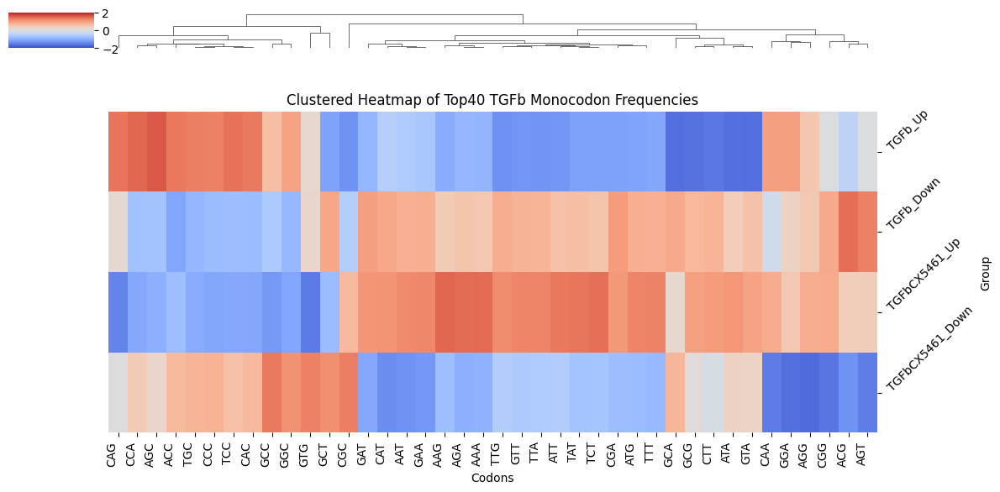

Generated clustered heatmap with shape (4, 40) for heatmap_monocodon_top40_tgfb_selected_clustered
Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt
Total runtime: 0.04 minutes


In [6]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
import time
import os

# Set up logging
logging.basicConfig(filename='heatmap_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Start timing
start_time = time.time()

# Combined heatmap plotting function with enhanced color gradient, no annotations
def plot_combined_heatmap(X, feature_names, labels, filename='heatmap_monocodon_top40_tgfb_selected_clustered'):
    try:
        # Ensure labels is a NumPy array
        labels = np.array(labels, dtype=int)
        group_masks = {
            'TGFb_Up': labels == 1,
            'TGFb_Down': labels == 0,
            'TGFbCX5461_Up': labels == 3,
            'TGFbCX5461_Down': labels == 2
        }
        # Require all groups to have sequences
        missing_groups = [name for name, mask in group_masks.items() if mask.sum() == 0]
        if missing_groups:
            print(f"Error: No sequences for groups {missing_groups}. All groups required for heatmap.")
            logging.error(f"No sequences for groups {missing_groups}. All groups required for heatmap.")
            exit(1)
        for group_name, mask in group_masks.items():
            print(f"{group_name} mask sum: {mask.sum()} sequences")
            logging.info(f"{group_name} mask sum: {mask.sum()} sequences")
        
        # Compute mean feature values for each group
        X_means = []
        for mask in group_masks.values():
            if mask.sum() > 0:
                mean_values = np.mean(X[mask], axis=0)
                mean_values = np.nan_to_num(mean_values, nan=0.0, posinf=0.0, neginf=0.0)
                X_means.append(mean_values)
            else:
                print(f"Warning: Empty group detected after validation.")
                logging.warning(f"Empty group detected after validation.")
                exit(1)
        X_combined = np.vstack(X_means)
        print(f"Combined heatmap data shape: {X_combined.shape}")
        logging.info(f"Combined heatmap data shape: {X_combined.shape}")
        
        # Verify no NaN or Inf values
        if np.any(np.isnan(X_combined)) or np.any(np.isinf(X_combined)):
            print(f"Error: X_combined contains NaN or Inf values: {X_combined}")
            logging.error(f"X_combined contains NaN or Inf values: {X_combined}")
            exit(1)
        
        # Z-score normalization to emphasize small differences
        scaler = StandardScaler()
        X_combined = scaler.fit_transform(X_combined)
        X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Create DataFrame for clustering
        heatmap_df = pd.DataFrame(X_combined, index=list(group_masks.keys()), 
                                columns=feature_names)
        
        # Set color scale to highlight small differences
        data_std = np.std(X_combined)
        vmin, vmax = -2 * data_std, 2 * data_std  # ±2 standard deviations
        center = 0  # Center at zero for standardized data
        
        # Plot clustered heatmap with enhanced gradient, no annotations
        g = sns.clustermap(heatmap_df, col_cluster=True, row_cluster=False, cmap='coolwarm',
                          vmin=vmin, vmax=vmax, center=center, robust=True,
                          figsize=(12, 6), dendrogram_ratio=0.1, cbar_pos=(0.02, 0.8, 0.05, 0.18),
                          annot=False)
        g.ax_heatmap.set_title('Clustered Heatmap of Top40 TGFb Monocodon Frequencies')
        g.ax_heatmap.set_xlabel('Codons')
        g.ax_heatmap.set_ylabel('Group')
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='right')
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=45, va='bottom')
        plt.tight_layout()
        g.savefig(f'{filename}.png', bbox_inches='tight')
        g.savefig(f'{filename}.svg', bbox_inches='tight')
        plt.show()
        plt.close()
        print(f"Generated clustered heatmap with shape {X_combined.shape} for {filename}")
        logging.info(f"Generated clustered heatmap with shape {X_combined.shape} for {filename}")
    except Exception as e:
        print(f"Clustered heatmap generation failed for {filename}: {e}")
        logging.error(f"Clustered heatmap generation failed for {filename}: {e}")
        raise e

# Codon table
STOP_CODONS = ['TAA', 'TAG', 'TGA']

def load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file):
    sequences, labels, gene_ids = [], [], []
    files_to_load = [
        (tgfb_up_file, 1, 'TGFb_Up'),
        (tgfb_down_file, 0, 'TGFb_Down'),
        (treated_up_file, 3, 'TGFbCX5461_Up'),
        (treated_down_file, 2, 'TGFbCX5461_Down')
    ]
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label, group_name in files_to_load:
            if not os.path.exists(file_path):
                print(f"Error: File {file_path} ({group_name}) not found. All FASTA files are required.")
                logging.error(f"File {file_path} ({group_name}) not found. All FASTA files are required.")
                exit(1)
            try:
                seq_count = 0
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} in {group_name} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id} in {group_name}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(int(label))
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
                    seq_count += 1
                print(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
                logging.info(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
            except Exception as e:
                print(f"Error reading {file_path} ({group_name}): {e}")
                logging.error(f"Error reading {file_path} ({group_name}): {e}")
                exit(1)
    if not sequences:
        print("No sequences loaded from any FASTA files. Exiting.")
        logging.error("No sequences loaded from any FASTA files. Exiting.")
        exit(1)
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    labels = np.array(labels, dtype=int)
    print(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    logging.info(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    # Verify all groups have sequences
    required_labels = [0, 1, 2, 3]
    missing_labels = [lbl for lbl in required_labels if np.sum(labels == lbl) == 0]
    if missing_labels:
        print(f"Error: No sequences for labels {missing_labels}. All groups required.")
        logging.error(f"No sequences for labels {missing_labels}. All groups required.")
        exit(1)
    return sequences, labels, gene_ids

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file)
print(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (61 codons, excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out() if codon.upper() not in STOP_CODONS]
# Filter stop codons from X_codon
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))
# Scale with StandardScaler
scaler = StandardScaler()
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")

# Debug codon features
print("NaNs in X_codon_scaled:", np.any(np.isnan(X_codon_scaled)))
print("Infs in X_codon_scaled:", np.any(np.isinf(X_codon_scaled)))
print("Monocodon features non-zero counts:", (X_codon_scaled != 0).sum())
logging.info(f"NaNs in X_codon_scaled: {np.any(np.isnan(X_codon_scaled))}")
logging.info(f"Infs in X_codon_scaled: {np.any(np.isinf(X_codon_scaled))}")
logging.info(f"Monocodon features non-zero counts: {(X_codon_scaled != 0).sum()}")

# Feature selection with LogisticRegression for TGFb Up vs. Down
try:
    k_features = 40
    print("Starting LogisticRegression feature selection on TGFb data...")
    logging.info("Starting LogisticRegression feature selection on TGFb data...")
    tgfb_mask = np.isin(labels, [0, 1])
    X_tgfb = X_codon_scaled[tgfb_mask]
    labels_tgfb = labels[tgfb_mask]
    print(f"TGFb data shape: {X_tgfb.shape}, Labels: {np.bincount(labels_tgfb)}")
    logging.info(f"TGFb data shape: {X_tgfb.shape}, Labels: {np.bincount(labels_tgfb)}")
    if X_tgfb.shape[0] == 0:
        raise ValueError("No TGFb data available for LogisticRegression")
    lr_tgfb = LogisticRegression(penalty='l1', solver='liblinear', C=1.0, random_state=42, max_iter=1000)
    lr_tgfb.fit(X_tgfb, labels_tgfb)
    tgfb_coefs = np.abs(lr_tgfb.coef_[0])
    non_zero_coefs = np.sum(tgfb_coefs != 0)
    print(f"TGFb LogisticRegression non-zero coefficients: {non_zero_coefs}")
    logging.info(f"TGFb LogisticRegression non-zero coefficients: {non_zero_coefs}")
    tgfb_indices = np.argsort(tgfb_coefs)[::-1][:k_features]
    tgfb_selected_features = [codon_feature_names[i] for i in tgfb_indices]
    X_tgfb_selected = X_codon_scaled[:, tgfb_indices]
    print(f"TGFb LogisticRegression selected {len(tgfb_selected_features)} features: {tgfb_selected_features}")
    logging.info(f"TGFb LogisticRegression selected {len(tgfb_selected_features)} features: {tgfb_selected_features}")
    print(f"TGFb LogisticRegression coefficients (top 5): {list(zip(tgfb_selected_features[:5], tgfb_coefs[tgfb_indices][:5]))}")
    logging.info(f"TGFb LogisticRegression coefficients (top 5): {list(zip(tgfb_selected_features[:5], tgfb_coefs[tgfb_indices][:5]))}")
except Exception as e:
    print(f"Error in LogisticRegression feature selection: {e}")
    logging.error(f"Error in LogisticRegression feature selection: {e}")
    exit(1)

# Generate clustered heatmap
try:
    plot_combined_heatmap(X_tgfb_selected, tgfb_selected_features, labels, 'heatmap_monocodon_top40_tgfb_selected_clustered')
except Exception as e:
    print(f"Heatmap generation failed: {e}")
    logging.error(f"Heatmap generation failed: {e}")
    raise e

# Save feature matrices
try:
    X_codon_df = pd.DataFrame(X_codon_scaled, columns=codon_feature_names, index=gene_ids)
    X_codon_df.to_csv('monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    X_tgfb_selected_df = pd.DataFrame(X_tgfb_selected, columns=tgfb_selected_features, index=gene_ids)
    X_tgfb_selected_df.to_csv('tgfb_selected_monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
    logging.info("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrices: {e}")
    logging.error(f"Error saving feature matrices: {e}")

# Print total runtime
print(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")
logging.info(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")

## ML based on monocodon features

### Monocodon model

Loaded 100 reference sequences from tgfb_top100_highly_expressed_cds.fasta
Reference weights (sample): {'TTT': 0.4787175234936429, 'TTC': 0.6904367053620785, 'TTA': 0.14870093974571585, 'TTG': 0.38142620232172475, 'CTT': 0.37202874516307355}
Loaded 3329 sequences: 278 upregulated, 3051 downregulated
CAI values shape: (3329,)
CAI values (first 5): [0.59346158 0.66416306 0.65829992 0.67054208 0.73937651]


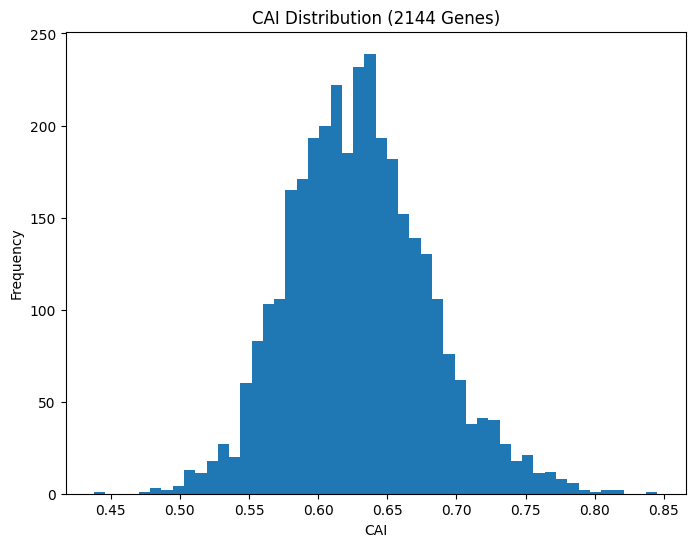

CII values shape: (3329,)
CII values (first 5): [0.30653266 0.28351836 0.22371968 0.24336283 0.22680412]


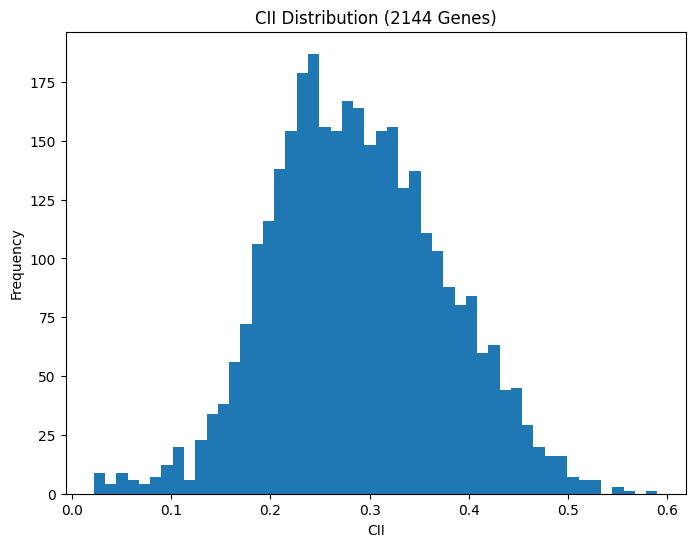

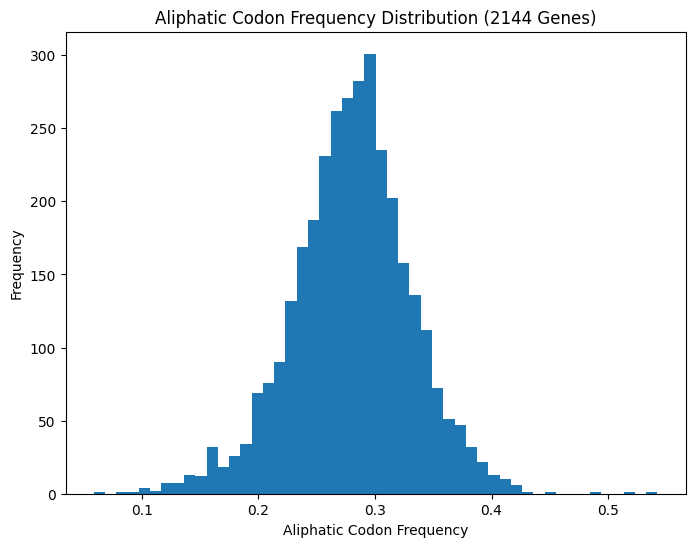

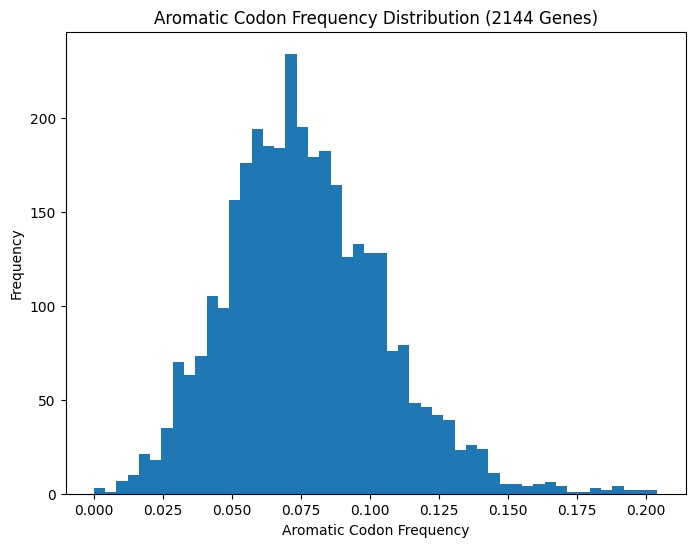

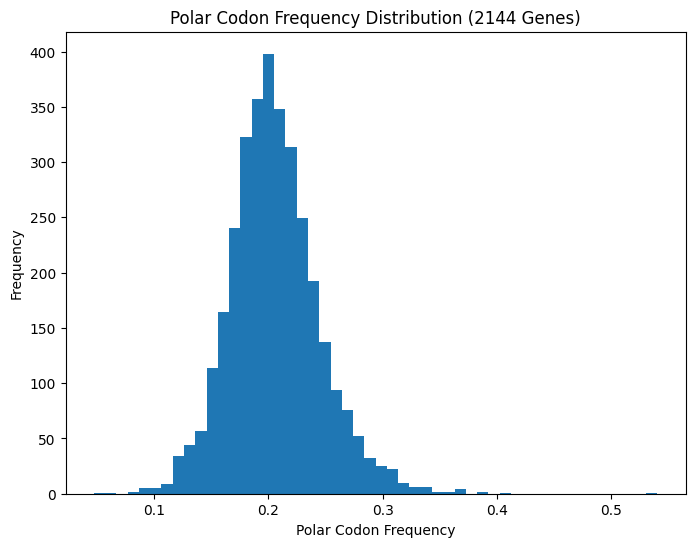

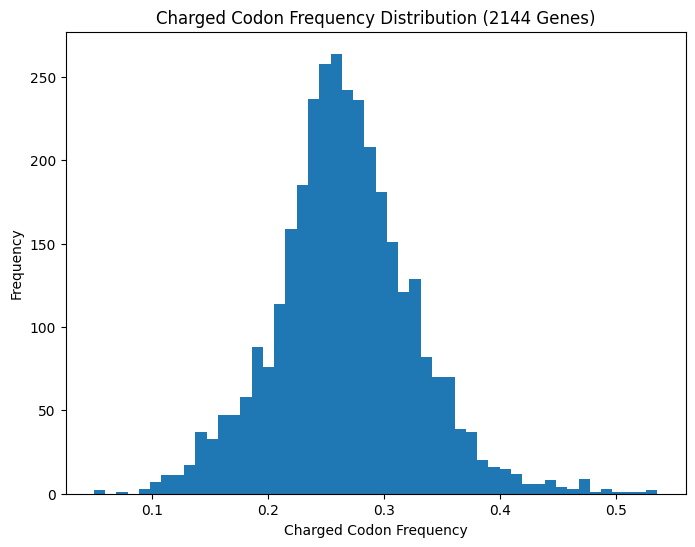

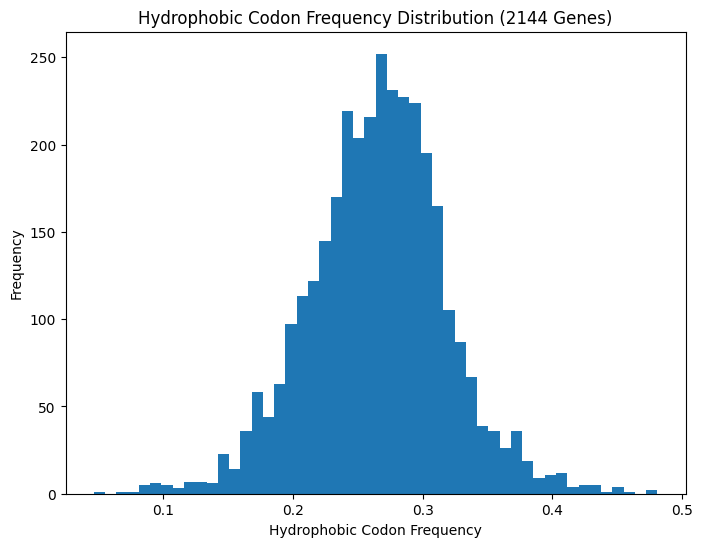

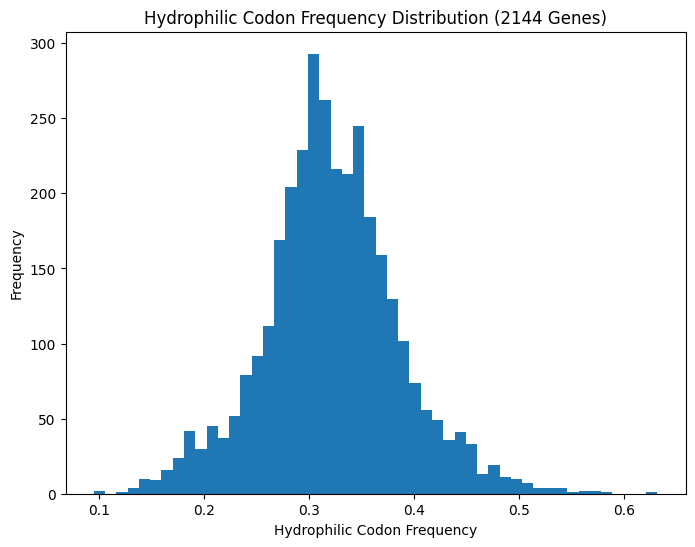

Feature names (RNA codons): ['AAA', 'AAC', 'AAG', 'AAU', 'ACA', 'ACC', 'ACG', 'ACU', 'AGA', 'AGC', 'AGG', 'AGU', 'AUA', 'AUC', 'AUG', 'AUU', 'CAA', 'CAC', 'CAG', 'CAU', 'CCA', 'CCC', 'CCG', 'CCU', 'CGA', 'CGC', 'CGG', 'CGU', 'CUA', 'CUC', 'CUG', 'CUU', 'GAA', 'GAC', 'GAG', 'GAU', 'GCA', 'GCC', 'GCG', 'GCU', 'GGA', 'GGC', 'GGG', 'GGU', 'GUA', 'GUC', 'GUG', 'GUU', 'UAC', 'UAU', 'UCA', 'UCC', 'UCG', 'UCU', 'UGA', 'UGC', 'UGG', 'UGU', 'UUA', 'UUC', 'UUG', 'UUU']
Number of codon features: 62
NaNs in X_scaled: False
Infs in X_scaled: False
Excluded 19 rRNA genes: ['5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS', 'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s', 'rDNA_promoter', 'rDNA_promoter1', 'mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846']
Remaining genes: 52318
Aligned 3329 genes for CPM data
NaNs in cpm_tgfb_scaled: False
Infs in cpm_tgfb_scaled: False
NaNs in cai_scaled: False
Infs in cai_scaled: False
NaNs in cii_scaled: False
Infs

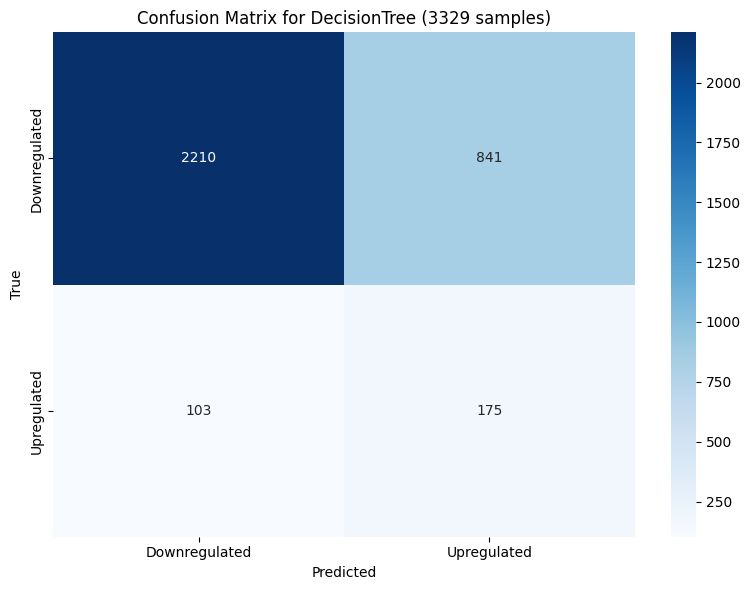

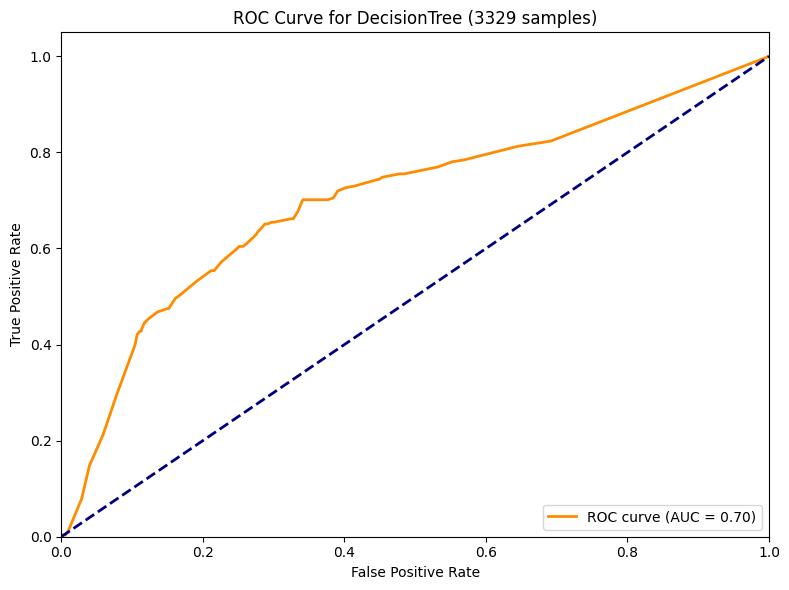

Saved predictions to predictions_DecisionTree.csv
Final Model Best Parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Final Model Best Cross-Validation Recall: 0.6016194331983805
Processing SHAP for model: DecisionTree
Using TreeExplainer


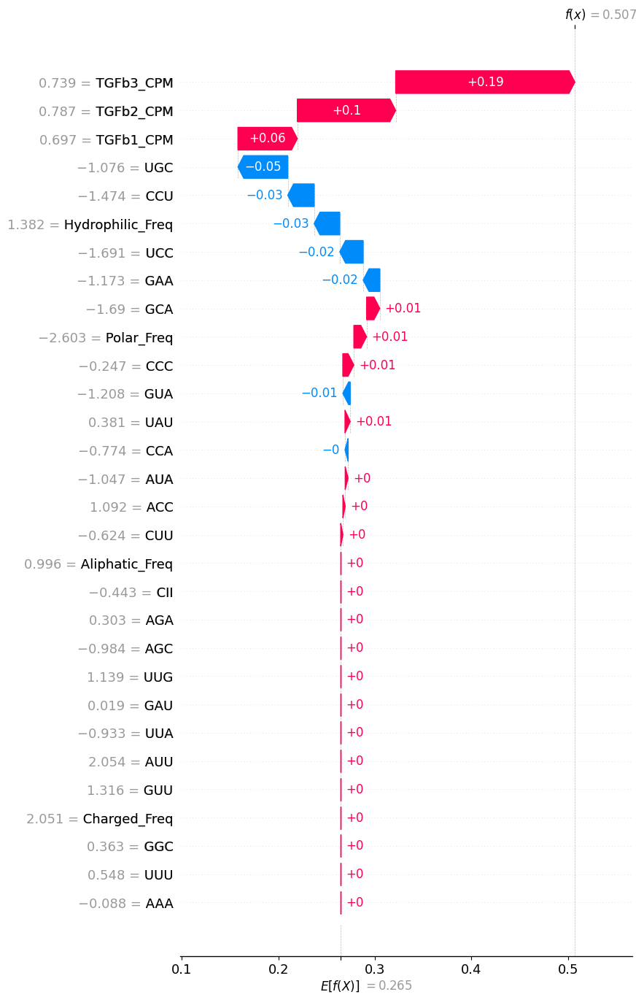

<Figure size 640x480 with 0 Axes>

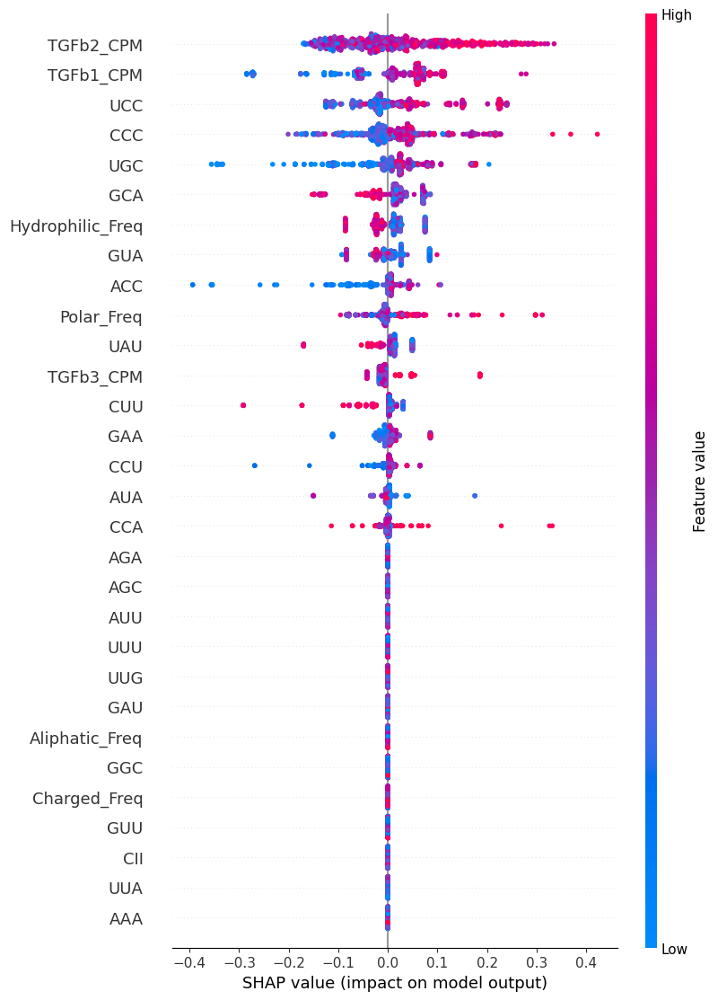

<Figure size 640x480 with 0 Axes>

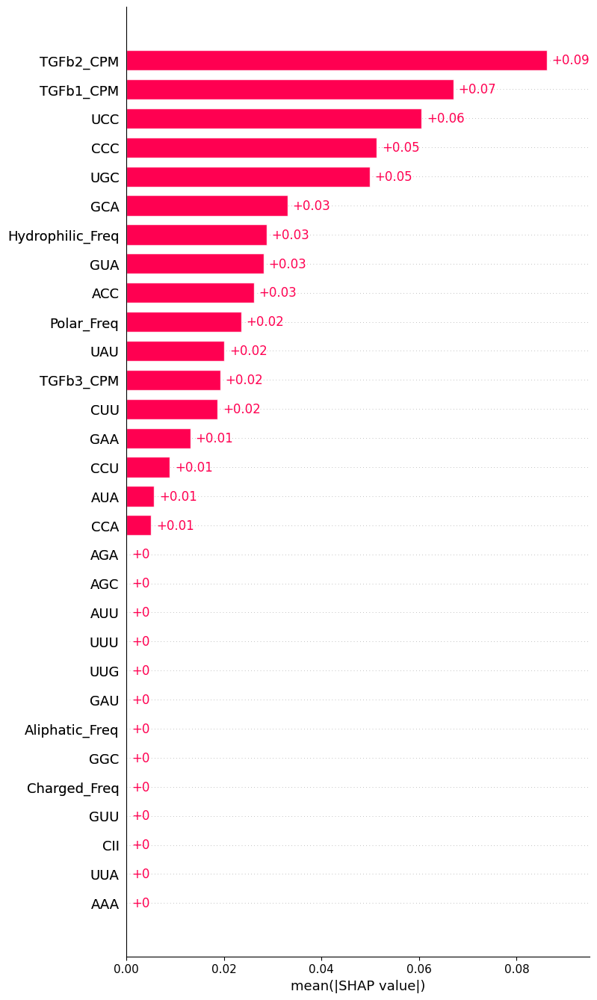

<Figure size 640x480 with 0 Axes>


=== Processing RandomForest ===
Processing fold 1/5
Fitting RandomForest on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Fold 1 Best Cross-Validation Recall: 0.30180180180180183
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting RandomForest on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Fold 2 Best Cross-Validation Recall: 0.27027027027027023
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting RandomForest on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Fold 3 Best Cross-Validation Recall: 0.28378378378378377
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting RandomForest on fold 4 with X_tra

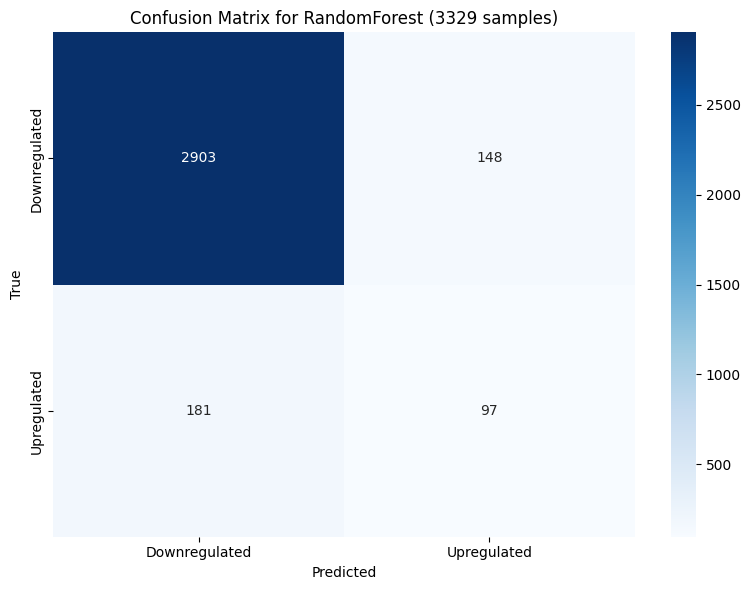

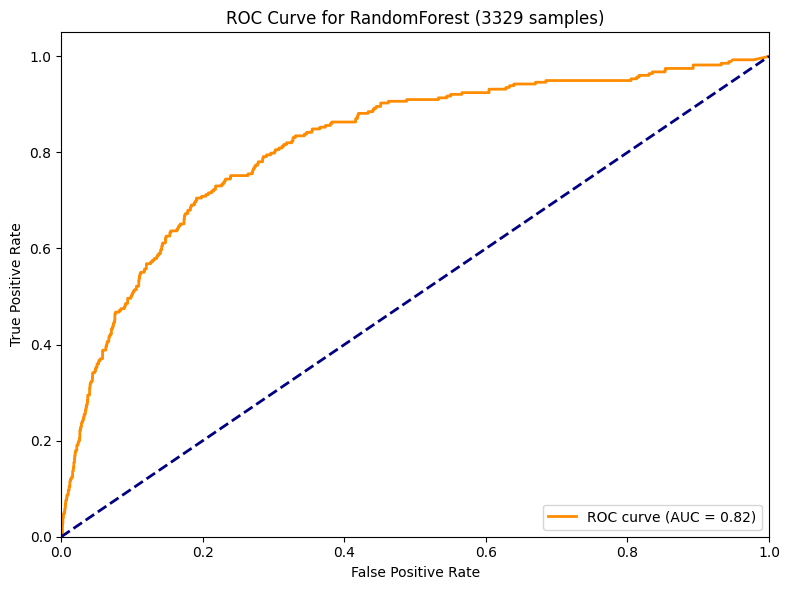

Saved predictions to predictions_RandomForest.csv
Final Model Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Final Model Best Cross-Validation Recall: 0.3010796221322537
Processing SHAP for model: RandomForest
Using TreeExplainer


 97%|=================== | 1620/1666 [00:28<00:00]       

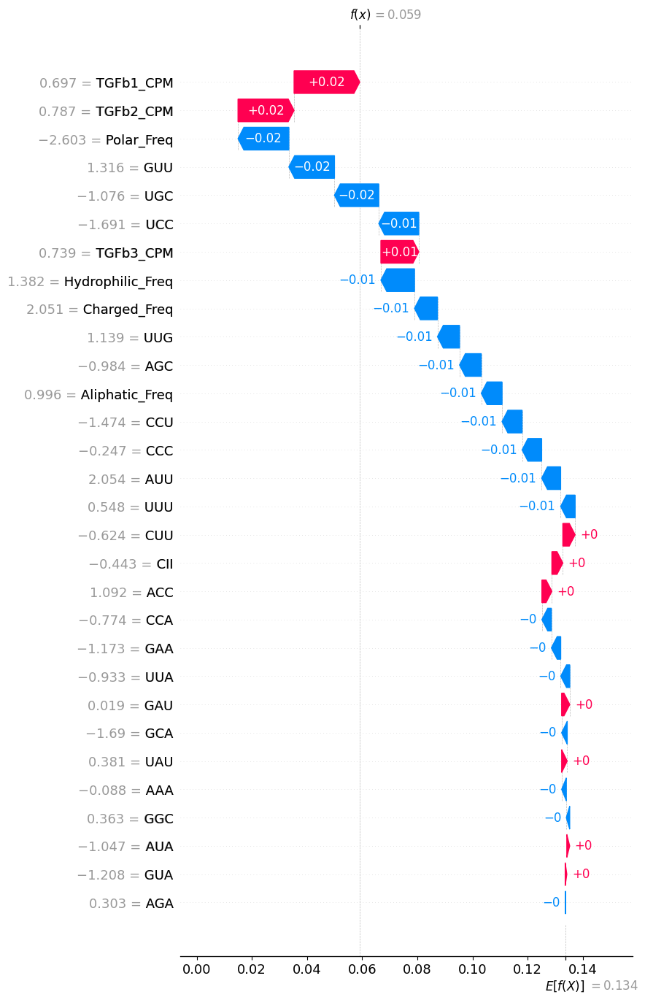

<Figure size 640x480 with 0 Axes>

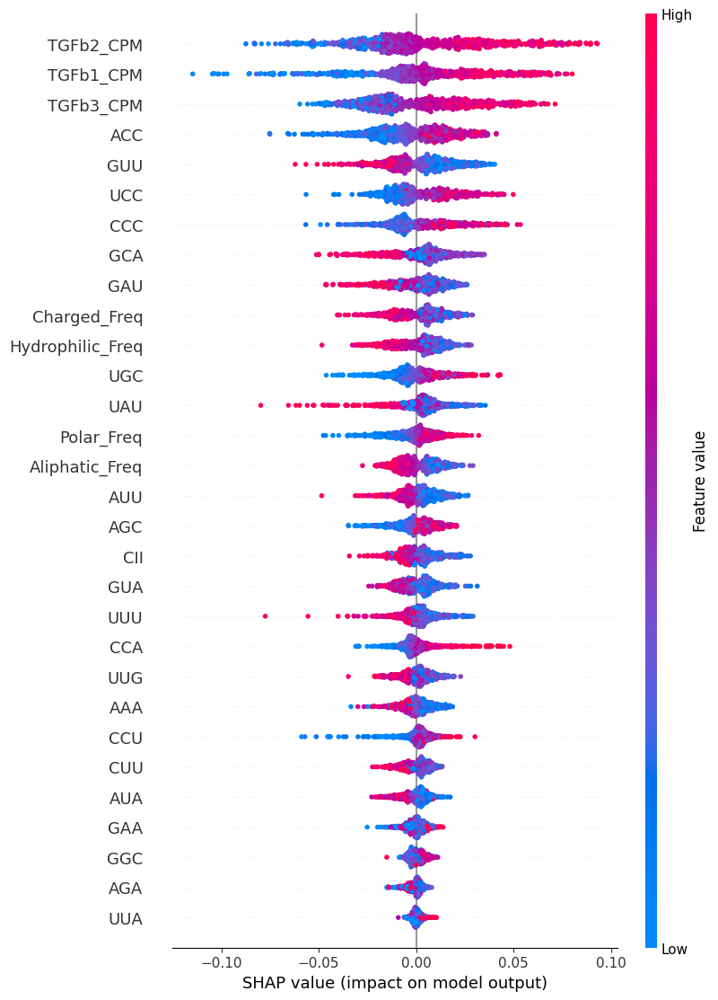

<Figure size 640x480 with 0 Axes>

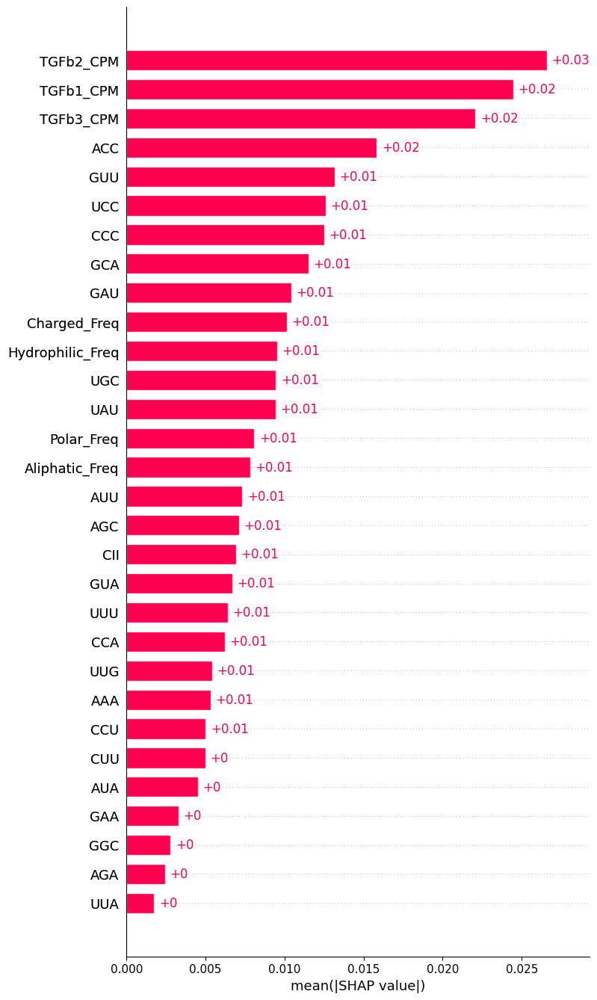

<Figure size 640x480 with 0 Axes>


=== Processing LogisticRegression ===
Processing fold 1/5
Fitting LogisticRegression on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Fold 1 Best Cross-Validation Recall: 0.0990990990990991
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting LogisticRegression on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Fold 2 Best Cross-Validation Recall: 0.0900900900900901
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting LogisticRegression on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Fold 3 Best Cross-Validation Recall: 0.0900900900900901
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting LogisticRegression on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'

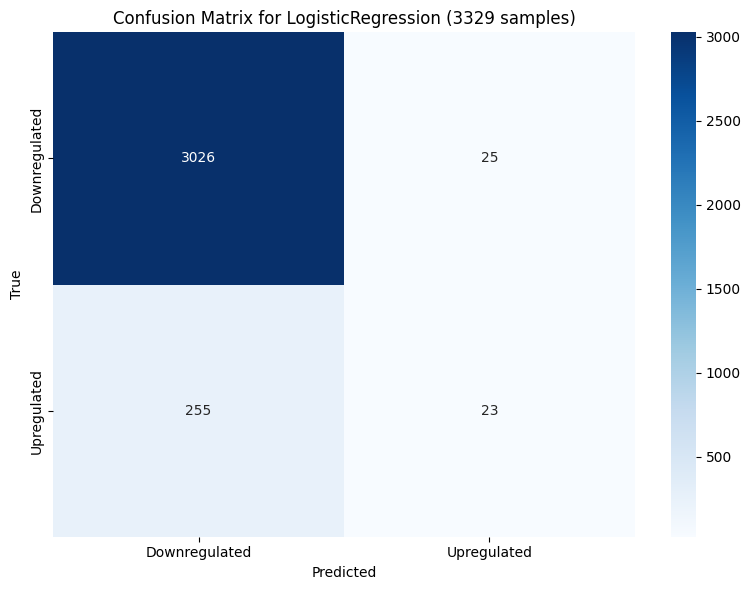

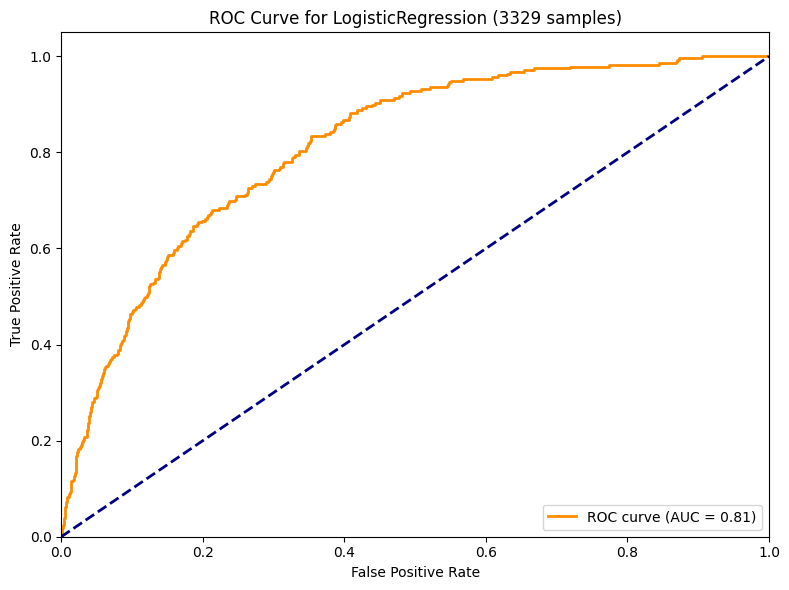

Saved predictions to predictions_LogisticRegression.csv
Final Model Best Parameters: {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}
Final Model Best Cross-Validation Recall: 0.06747638326585695
Processing SHAP for model: LogisticRegression
Using LinearExplainer


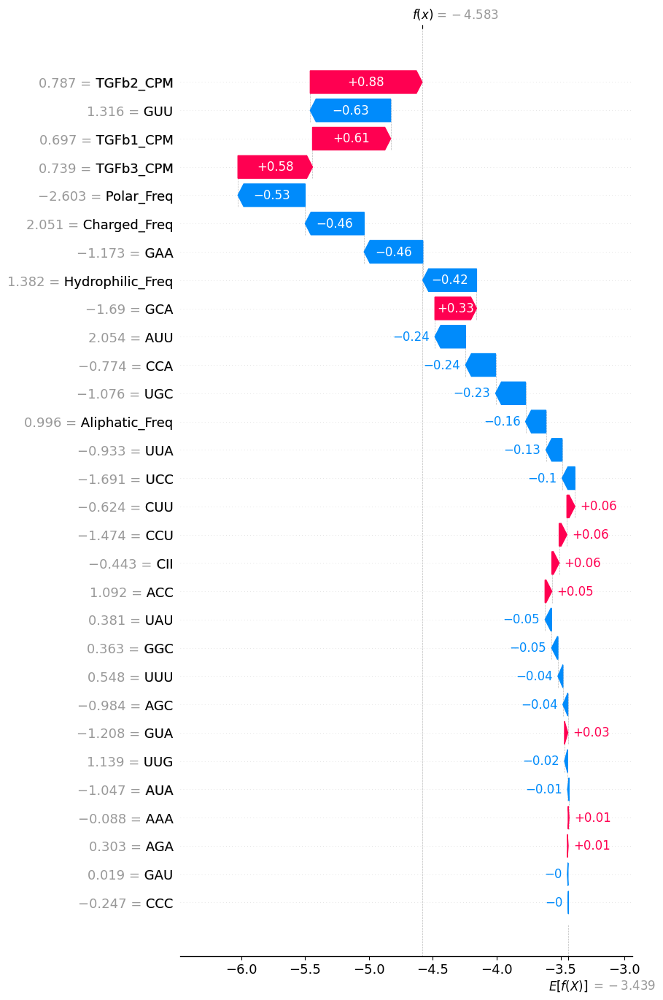

<Figure size 640x480 with 0 Axes>

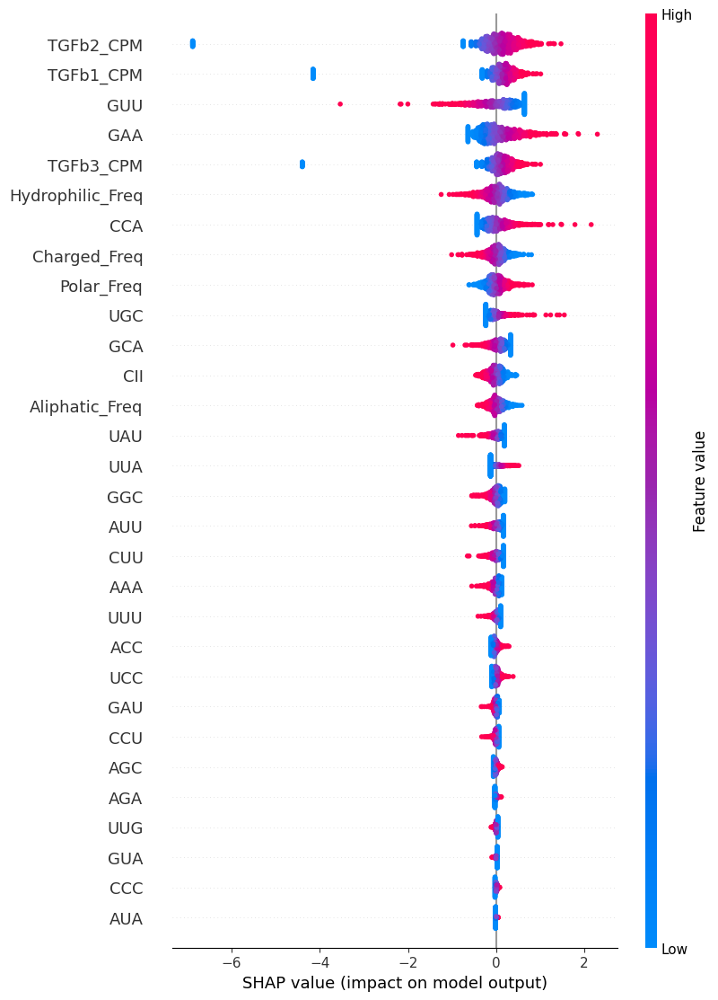

<Figure size 640x480 with 0 Axes>

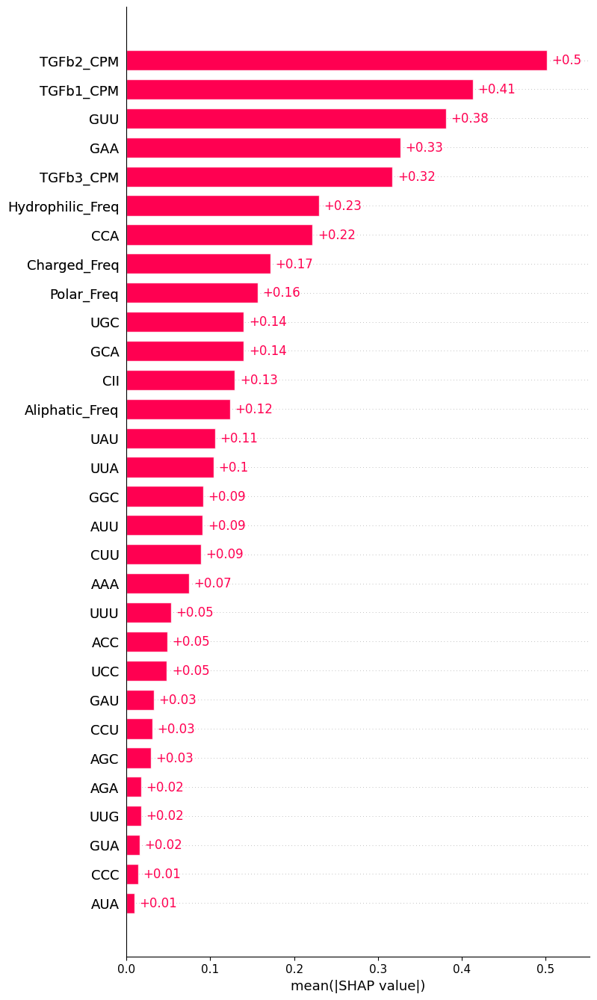

<Figure size 640x480 with 0 Axes>


=== Processing SVM_Linear ===
Processing fold 1/5
Fitting SVM_Linear on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 0.01}
Fold 1 Best Cross-Validation Recall: 0.7432432432432433
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting SVM_Linear on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 0.01}
Fold 2 Best Cross-Validation Recall: 0.6846846846846847
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting SVM_Linear on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 0.01}
Fold 3 Best Cross-Validation Recall: 0.7297297297297298
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting SVM_Linear on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 0.1}
Fold 4 Best Cross-Validation Recall: 0.7443843843843844
Training fold 4: X_train_fold shape: (2663, 30)
Processing fold 5/5
Fitting SVM_Linear on fold 5 with X_train_fold sha

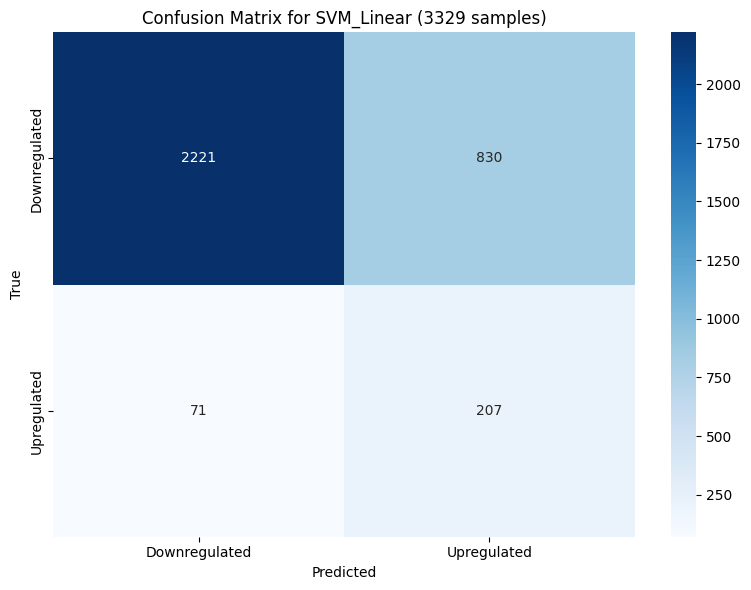

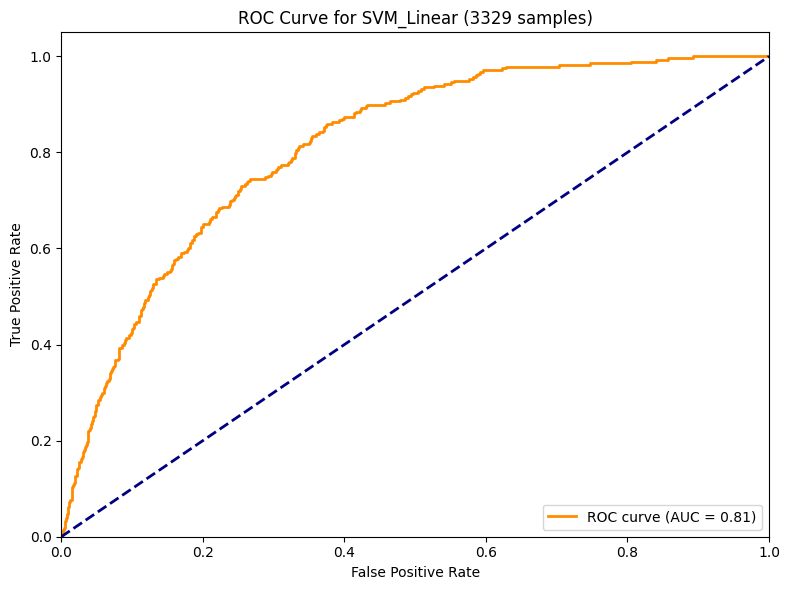

Saved predictions to predictions_SVM_Linear.csv
Final Model Best Parameters: {'C': 0.01}
Final Model Best Cross-Validation Recall: 0.716059379217274
Processing SHAP for model: SVM_Linear
Using LinearExplainer


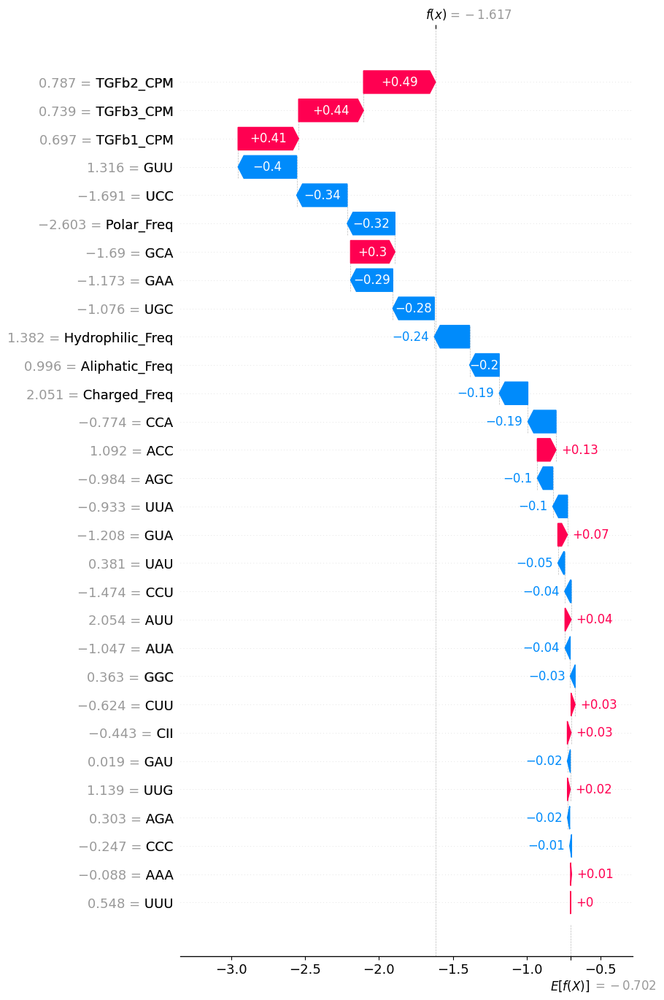

<Figure size 640x480 with 0 Axes>

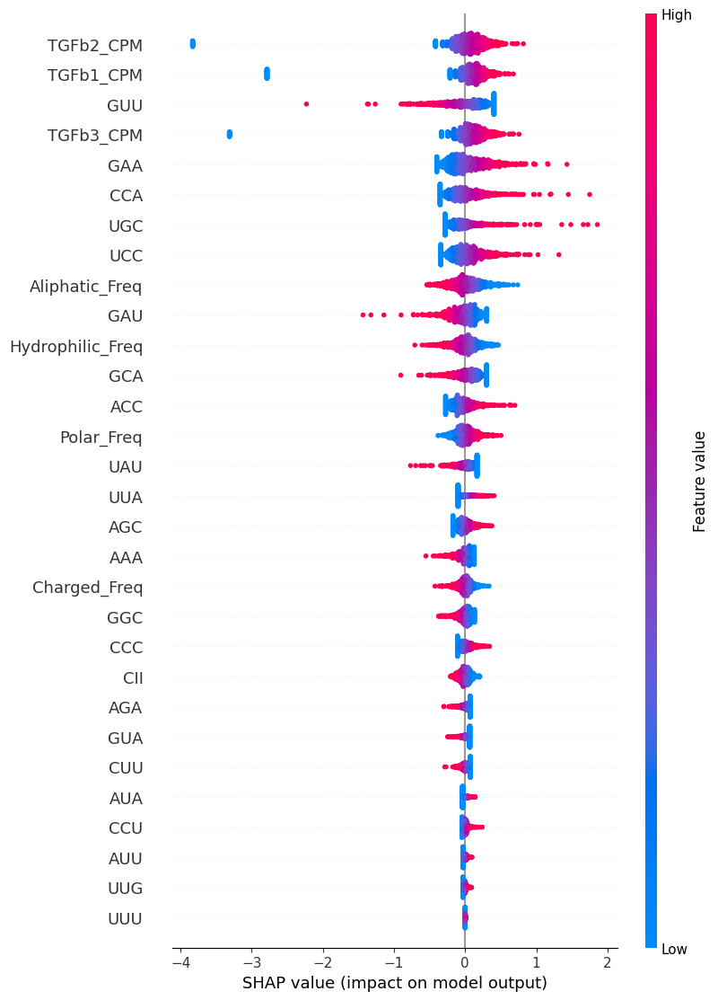

<Figure size 640x480 with 0 Axes>

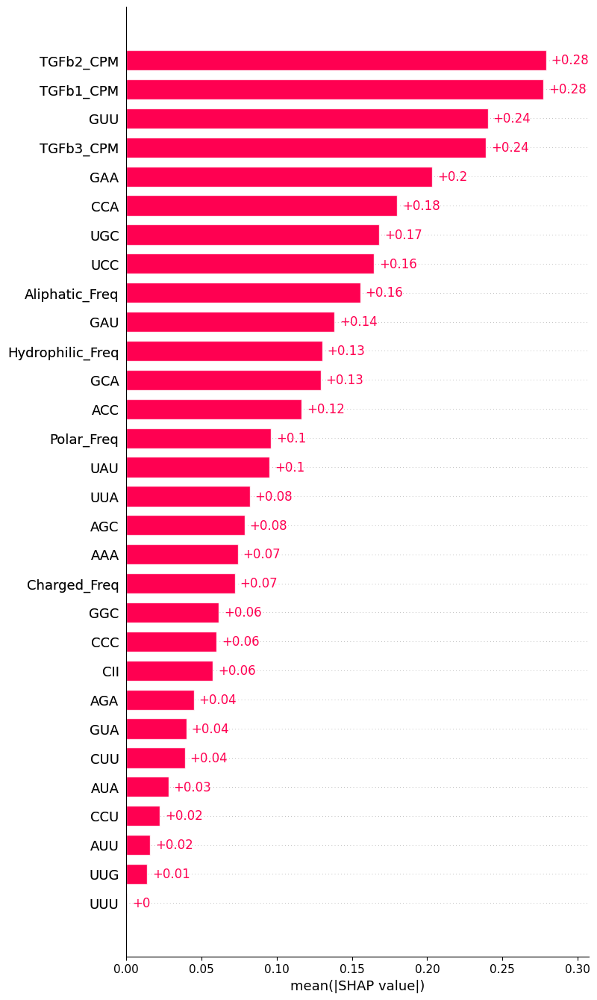

<Figure size 640x480 with 0 Axes>


=== Processing SVM_Polynomial ===
Processing fold 1/5
Fitting SVM_Polynomial on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 0.1, 'degree': 2}
Fold 1 Best Cross-Validation Recall: 0.7387387387387387
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting SVM_Polynomial on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 0.1, 'degree': 2}
Fold 2 Best Cross-Validation Recall: 0.8108108108108109
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting SVM_Polynomial on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 0.1, 'degree': 2}
Fold 3 Best Cross-Validation Recall: 0.8288288288288288
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting SVM_Polynomial on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 0.01, 'degree': 3}
Fold 4 Best Cross-Validation Recall: 0.9061261261261261
Training fold 4: X_train_fold shape: (2663, 30)


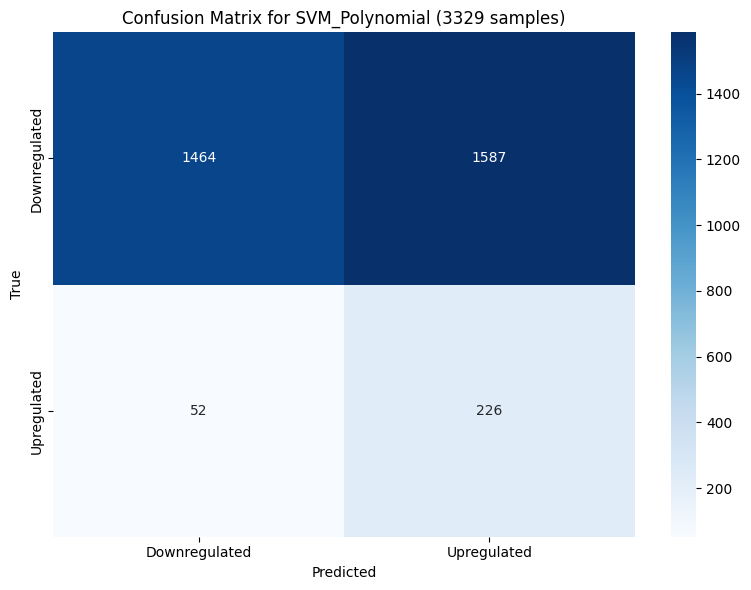

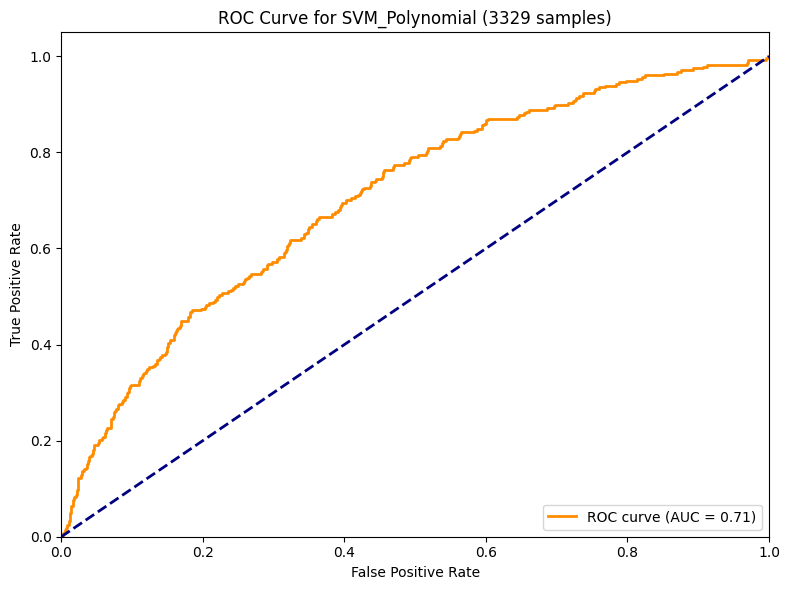

Saved predictions to predictions_SVM_Polynomial.csv
Final Model Best Parameters: {'C': 0.01, 'degree': 2}
Final Model Best Cross-Validation Recall: 0.8224021592442645
Processing SHAP for model: SVM_Polynomial
Using KernelExplainer


  0%|          | 0/833 [00:00<?, ?it/s]

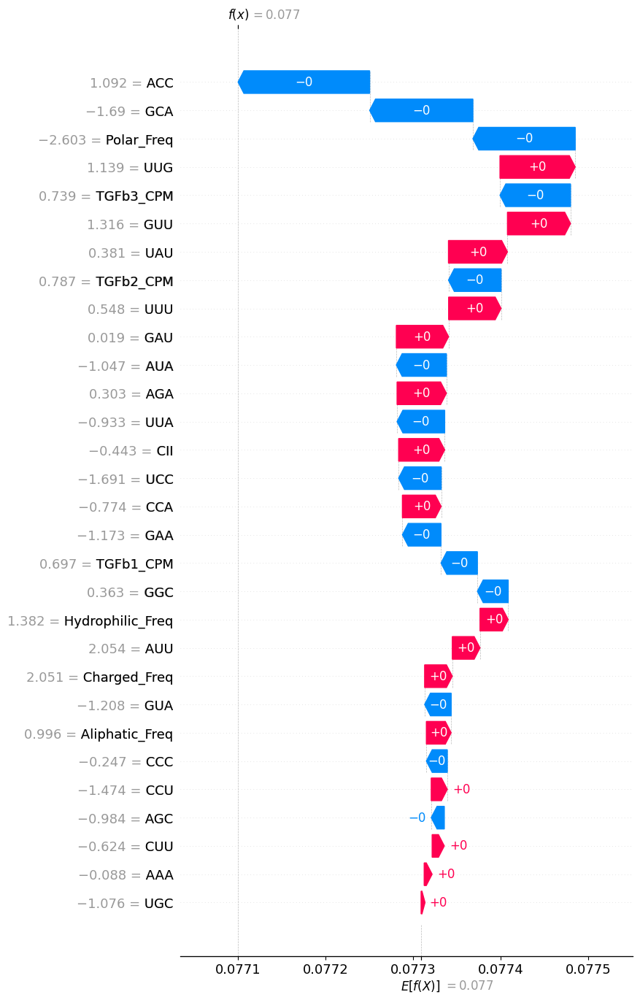

<Figure size 640x480 with 0 Axes>

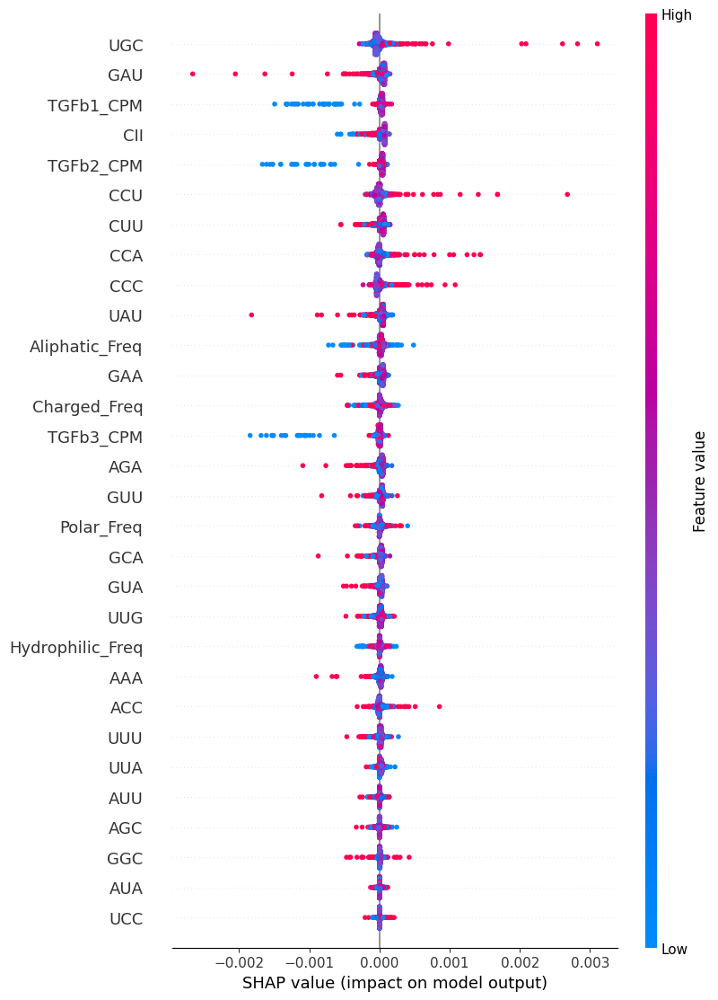

<Figure size 640x480 with 0 Axes>

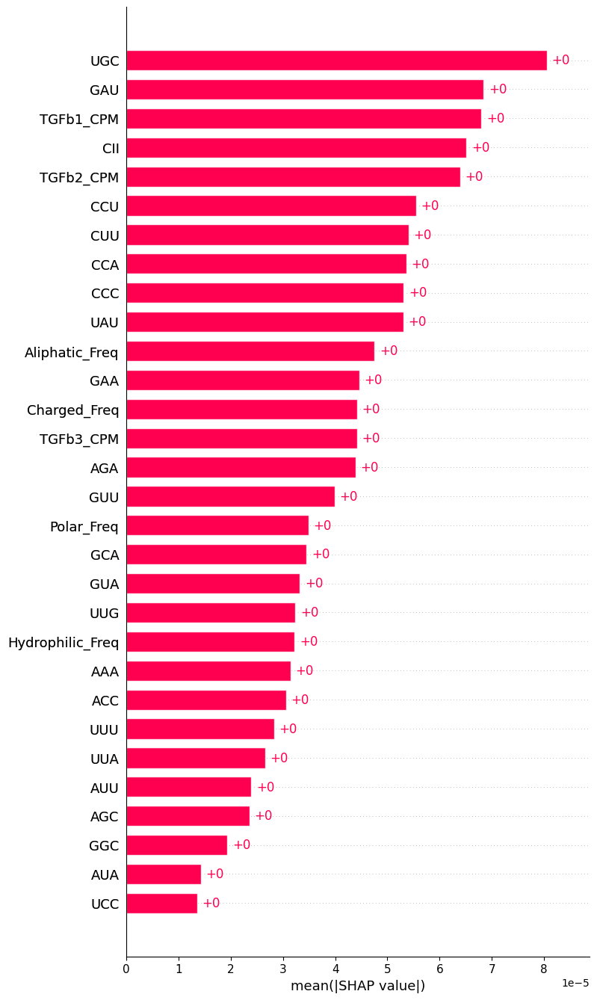

<Figure size 640x480 with 0 Axes>


=== Processing SVM_RBF ===
Processing fold 1/5
Fitting SVM_RBF on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Fold 1 Best Cross-Validation Recall: 0.7432432432432433
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting SVM_RBF on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 0.01, 'gamma': 'auto'}
Fold 2 Best Cross-Validation Recall: 0.7387387387387386
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting SVM_RBF on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Fold 3 Best Cross-Validation Recall: 0.7522522522522522
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting SVM_RBF on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Fold 4 Best Cross-Validation Recall: 0.7308108108108108
Training fold 4: X_train_fold shape: (2663, 30)
Processing fo

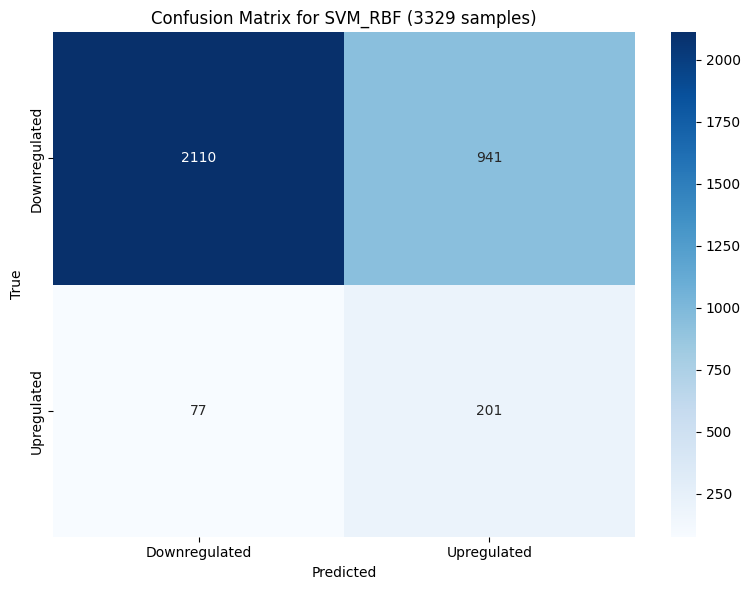

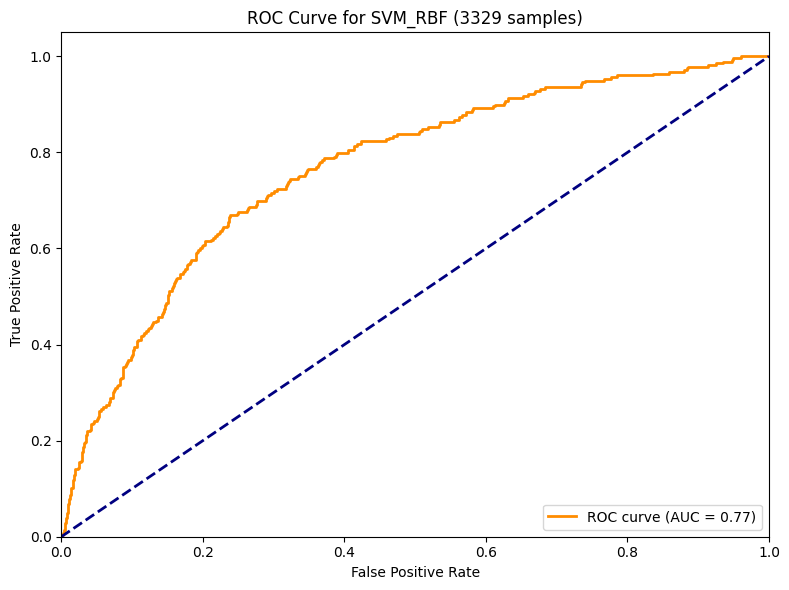

Saved predictions to predictions_SVM_RBF.csv
Final Model Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Final Model Best Cross-Validation Recall: 0.7516869095816464
Processing SHAP for model: SVM_RBF
Using KernelExplainer


  0%|          | 0/833 [00:00<?, ?it/s]

In [ ]:
"""
Machine learning pipeline for classifying upregulated vs. downregulated genes in TGF-β Ribo-seq study.
Computes CAI, CII, codon group frequencies, and TGF-β CPM features, trains multiple models, and generates SHAP plots.
"""
import warnings
from sklearn.exceptions import ConvergenceWarning
# Apply individual filters for each warning category
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from scikeras.wrappers import KerasClassifier
import torch
import torch.nn as nn
import torch.optim as optim
from skorch import NeuralNetClassifier
from collections import Counter
from itertools import chain
import logging
logging.getLogger('skorch').setLevel(logging.ERROR)

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
# Define codon groups for new features
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}  # Alanine, Isoleucine, Leucine, Valine
AROMATIC_AAS = {'F', 'Y', 'W'}  # Phenylalanine, Tyrosine, Tryptophan
POLAR_AAS = {'N', 'Q', 'S', 'T'}  # Asparagine, Glutamine, Serine, Threonine
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}  # Aspartic acid, Glutamic acid, Lysine, Arginine, Histidine
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}  # Phenylalanine, Isoleucine, Leucine, Methionine, Valine
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}  # Asparagine, Aspartic acid, Glutamine, Glutamic acid, Lysine, Arginine
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def CAI(sequence, weights):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    sequence_weights = []
    for codon in codons:
        if codon in STOP_CODONS:
            continue
        if codon not in NON_SYNONYMOUS_CODONS:
            if codon not in weights:
                raise KeyError(f"Missing weight for codon {codon}.")
            sequence_weights.append(weights[codon])
    return geometric_mean(sequence_weights) if sequence_weights else 0.0

def CII(sequence):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    total_codons = len(codons)
    if total_codons == 0:
        return 0.0
    destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
    return destabilizing_count / total_codons

def compute_codon_group_freq(sequence, codon_group):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    total_codons = len([c for c in codons if c not in STOP_CODONS])
    if total_codons == 0:
        return 0.0
    group_count = sum(1 for codon in codons if codon in codon_group and codon not in STOP_CODONS)
    return group_count / total_codons

def load_fasta_sequences(up_file, down_file):
    sequences = []
    labels = []
    gene_ids = []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                with open(file_path, 'r') as f:
                    for record in SeqIO.parse(file_path, 'fasta'):
                        seq = str(record.seq).upper()
                        if len(seq) >= 3:
                            seq = seq[:-3]
                        if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                            log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                            continue
                        sequences.append(seq)
                        labels.append(label)
                        gene_ids.append(record.id.split('|')[1])
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                return None, None, None
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            with open(ref_file, 'r') as f:
                for record in SeqIO.parse(f, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        continue
                    ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
#up_file = 'unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
#down_file = 'unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
ref_file = "tgfb_top100_highly_expressed_cds.fasta"

# Input file paths
#tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
#tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
#treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
#treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights)[:5]})
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    exit(1)

print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")
if len(sequences) != 2144:
    print(f"Warning: Expected 2144 sequences, got {len(sequences)}")

# Compute CAI
cai_values = []
for seq in sequences:
    try:
        cai = CAI(seq, ref_weights)
        cai_values.append(cai)
    except (ValueError, KeyError) as e:
        print(f"Error computing CAI for sequence {seq[:30]}...: {e}")
        cai_values.append(0.0)
cai_values = np.array(cai_values)
print("CAI values shape:", cai_values.shape)
print("CAI values (first 5):", cai_values[:5])

# Visualize CAI distribution
plt.figure(figsize=(8, 6))
plt.hist(cai_values, bins=50)
plt.title("CAI Distribution (2144 Genes)")
plt.xlabel("CAI")
plt.ylabel("Frequency")
plt.show()

# Compute CII
cii_values = []
for seq in sequences:
    try:
        cii = CII(seq)
        cii_values.append(cii)
    except ValueError as e:
        print(f"Error computing CII for sequence {seq[:30]}...: {e}")
        cii_values.append(0.0)
cii_values = np.array(cii_values)
print("CII values shape:", cii_values.shape)
print("CII values (first 5):", cii_values[:5])

# Visualize CII distribution
plt.figure(figsize=(8, 6))
plt.hist(cii_values, bins=50)
plt.title("CII Distribution (2144 Genes)")
plt.xlabel("CII")
plt.ylabel("Frequency")
plt.show()

# Compute new codon group frequencies
aliphatic_freq = []
aromatic_freq = []
polar_freq = []
charged_freq = []
hydrophobic_freq = []
hydrophilic_freq = []
for seq in sequences:
    try:
        aliphatic_freq.append(compute_codon_group_freq(seq, ALIPHATIC_CODONS))
        aromatic_freq.append(compute_codon_group_freq(seq, AROMATIC_CODONS))
        polar_freq.append(compute_codon_group_freq(seq, POLAR_CODONS))
        charged_freq.append(compute_codon_group_freq(seq, CHARGED_CODONS))
        hydrophobic_freq.append(compute_codon_group_freq(seq, HYDROPHOBIC_CODONS))
        hydrophilic_freq.append(compute_codon_group_freq(seq, HYDROPHILIC_CODONS))
    except ValueError as e:
        print(f"Error computing codon group frequencies for sequence {seq[:30]}...: {e}")
        aliphatic_freq.append(0.0)
        aromatic_freq.append(0.0)
        polar_freq.append(0.0)
        charged_freq.append(0.0)
        hydrophobic_freq.append(0.0)
        hydrophilic_freq.append(0.0)
aliphatic_freq = np.array(aliphatic_freq)
aromatic_freq = np.array(aromatic_freq)
polar_freq = np.array(polar_freq)
charged_freq = np.array(charged_freq)
hydrophobic_freq = np.array(hydrophobic_freq)
hydrophilic_freq = np.array(hydrophilic_freq)

# Visualize new codon group frequencies
plt.figure(figsize=(8, 6))
plt.hist(aliphatic_freq, bins=50)
plt.title("Aliphatic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Aliphatic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(aromatic_freq, bins=50)
plt.title("Aromatic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Aromatic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(polar_freq, bins=50)
plt.title("Polar Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Polar Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(charged_freq, bins=50)
plt.title("Charged Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Charged Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(hydrophobic_freq, bins=50)
plt.title("Hydrophobic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Hydrophobic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(hydrophilic_freq, bins=50)
plt.title("Hydrophilic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Hydrophilic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Extract codon frequencies
vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+')
X = vectorizer.fit_transform(codon_sequences).toarray()

# Format feature names as RNA codons
feature_names = vectorizer.get_feature_names_out()
feature_names = [codon.replace('t', 'u').replace('T', 'U').upper() for codon in feature_names]
print("Feature names (RNA codons):", feature_names)
print("Number of codon features:", len(feature_names))

# Normalize codon counts
total_codons = np.array([len(seq) // 3 for seq in sequences])[:, np.newaxis]
X_normalized = X / total_codons

# Scale codon features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_normalized)

# Handle NaNs/Infs
print("NaNs in X_scaled:", np.any(np.isnan(X_scaled)))
print("Infs in X_scaled:", np.any(np.isinf(X_scaled)))
X_scaled = np.nan_to_num(X_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Convert to DataFrame
X_df = pd.DataFrame(X_scaled, columns=feature_names)

# Load raw count data
try:
    raw_counts_df = pd.read_csv("blancgrp_161021_Riboseq.counts.raw.txt", sep="\t", index_col=0)
    if not raw_counts_df.apply(lambda x: pd.to_numeric(x, errors='coerce').notnull().all()).all():
        print("Error: Non-numeric values in matrix")
        exit(1)
except Exception as e:
    print(f"Error reading raw counts: {e}")
    exit(1)

# Exclude rRNA genes
rRNA_genes = [
    '5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS',
    'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s',
    'rDNA_promoter', 'rDNA_promoter1', 'mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846'
]
excluded_genes = [g for g in rRNA_genes if g in raw_counts_df.index]
raw_counts_df = raw_counts_df.drop(index=excluded_genes, errors='ignore')
print(f"Excluded {len(excluded_genes)} rRNA genes: {excluded_genes}")
print(f"Remaining genes: {len(raw_counts_df)}")

# Convert to CPM
raw_counts = raw_counts_df.values
library_sizes = raw_counts.sum(axis=0)
cpm_data = (raw_counts / library_sizes) * 1e6

# Align CPM data with gene IDs
try:
    cpm_df = pd.DataFrame(cpm_data, index=raw_counts_df.index, columns=raw_counts_df.columns.tolist())
    valid_gene_ids = [g for g in gene_ids if g in cpm_df.index]
    if len(valid_gene_ids) < len(gene_ids):
        missing_genes = set(gene_ids) - set(valid_gene_ids)
        print(f"Warning: {len(missing_genes)} genes missing in CPM data: {missing_genes}")
        if len(valid_gene_ids) < len(gene_ids) * 0.9:
            print(f"Error: Too many missing genes ({len(missing_genes)}/{len(gene_ids)}). Check FASTA or counts data")
            exit(1)
    cpm_df = cpm_df.loc[valid_gene_ids]
    valid_indices = [i for i in range(len(gene_ids)) if gene_ids[i] in valid_gene_ids]
    sequences = [sequences[i] for i in valid_indices]
    labels = [labels[i] for i in valid_indices]
    gene_ids = [gene_ids[i] for i in valid_indices]
    print(f"Aligned {len(valid_gene_ids)} genes for CPM data")
    extra_genes = set(cpm_df.index) - set(valid_gene_ids)
    if extra_genes:
        print(f"Note: {len(extra_genes)} extra genes in CPM data not in FASTA (sample): {list(extra_genes)[:5]}")
except Exception as e:
    print(f"Error aligning CPM data: {e}")
    exit(1)

cpm_data = cpm_df.values

# Preprocess TGF-β CPM
cpm_tgfb = cpm_data[:, 3:6]
cpm_tgfb = np.log2(np.maximum(cpm_tgfb, 1e-10))
cpm_scaler = StandardScaler()
cpm_tgfb_scaled = cpm_scaler.fit_transform(cpm_tgfb)

# Handle NaNs/Infs
print("NaNs in cpm_tgfb_scaled:", np.any(np.isnan(cpm_tgfb_scaled)))
print("Infs in cpm_tgfb_scaled:", np.any(np.isinf(cpm_tgfb_scaled)))
cpm_tgfb_scaled = np.nan_to_num(cpm_tgfb_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale CAI
cai_scaler = StandardScaler()
cai_scaled = cai_scaler.fit_transform(cai_values[:len(valid_indices)][:, np.newaxis])
print("NaNs in cai_scaled:", np.any(np.isnan(cai_scaled)))
print("Infs in cai_scaled:", np.any(np.isinf(cai_scaled)))
cai_scaled = np.nan_to_num(cai_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale CII
cii_scaler = StandardScaler()
cii_scaled = cii_scaler.fit_transform(cii_values[:len(valid_indices)][:, np.newaxis])
print("NaNs in cii_scaled:", np.any(np.isnan(cii_scaled)))
print("Infs in cii_scaled:", np.any(np.isinf(cii_scaled)))
cii_scaled = np.nan_to_num(cii_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale new codon group frequencies
aliphatic_scaler = StandardScaler()
aliphatic_scaled = aliphatic_scaler.fit_transform(aliphatic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in aliphatic_scaled:", np.any(np.isnan(aliphatic_scaled)))
print("Infs in aliphatic_scaled:", np.any(np.isinf(aliphatic_scaled)))
aliphatic_scaled = np.nan_to_num(aliphatic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

aromatic_scaler = StandardScaler()
aromatic_scaled = aromatic_scaler.fit_transform(aromatic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in aromatic_scaled:", np.any(np.isnan(aromatic_scaled)))
print("Infs in aromatic_scaled:", np.any(np.isinf(aromatic_scaled)))
aromatic_scaled = np.nan_to_num(aromatic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

polar_scaler = StandardScaler()
polar_scaled = polar_scaler.fit_transform(polar_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in polar_scaled:", np.any(np.isnan(polar_scaled)))
print("Infs in polar_scaled:", np.any(np.isinf(polar_scaled)))
polar_scaled = np.nan_to_num(polar_scaled, nan=0.0, posinf=0.0, neginf=0.0)

charged_scaler = StandardScaler()
charged_scaled = charged_scaler.fit_transform(charged_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in charged_scaled:", np.any(np.isnan(charged_scaled)))
print("Infs in charged_scaled:", np.any(np.isinf(charged_scaled)))
charged_scaled = np.nan_to_num(charged_scaled, nan=0.0, posinf=0.0, neginf=0.0)

hydrophobic_scaler = StandardScaler()
hydrophobic_scaled = hydrophobic_scaler.fit_transform(hydrophobic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in hydrophobic_scaled:", np.any(np.isnan(hydrophobic_scaled)))
print("Infs in hydrophobic_scaled:", np.any(np.isinf(hydrophobic_scaled)))
hydrophobic_scaled = np.nan_to_num(hydrophobic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

hydrophilic_scaler = StandardScaler()
hydrophilic_scaled = hydrophilic_scaler.fit_transform(hydrophilic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in hydrophilic_scaled:", np.any(np.isnan(hydrophilic_scaled)))
print("Infs in hydrophilic_scaled:", np.any(np.isinf(hydrophilic_scaled)))
hydrophilic_scaled = np.nan_to_num(hydrophilic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Combine features
X_combined = np.hstack([
    X_df.values[:len(valid_indices)],
    cpm_tgfb_scaled,
    cai_scaled,
    cii_scaled,
    aliphatic_scaled,
    aromatic_scaled,
    polar_scaled,
    charged_scaled,
    hydrophobic_scaled,
    hydrophilic_scaled
])
feature_names_combined = list(feature_names) + [
    'TGFb1_CPM', 'TGFb2_CPM', 'TGFb3_CPM', 'CAI', 'CII',
    'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq',
    'Hydrophobic_Freq', 'Hydrophilic_Freq'
]
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined)

# Handle NaNs/Infs
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)

# Debug feature shapes
print("X_combined shape:", X_combined.shape)
print("X_combined_df shape:", X_combined_df.shape)
print("Feature names:", feature_names_combined)
print("Number of combined features:", len(feature_names_combined))

# Check CAI/CII/codon group variance
print("CAI variance:", np.var(cai_values[:len(valid_indices)]))
print("CII variance:", np.var(cii_values[:len(valid_indices)]))
print("Aliphatic_Freq variance:", np.var(aliphatic_freq[:len(valid_indices)]))
print("Aromatic_Freq variance:", np.var(aromatic_freq[:len(valid_indices)]))
print("Polar_Freq variance:", np.var(polar_freq[:len(valid_indices)]))
print("Charged_Freq variance:", np.var(charged_freq[:len(valid_indices)]))
print("Hydrophobic_Freq variance:", np.var(hydrophobic_freq[:len(valid_indices)]))
print("Hydrophilic_Freq variance:", np.var(hydrophilic_freq[:len(valid_indices)]))
print("CAI all zeros:", np.all(cai_values[:len(valid_indices)] == 0.0))
print("CII all zeros:", np.all(cii_values[:len(valid_indices)] == 0.0))
print("Aliphatic_Freq all zeros:", np.all(aliphatic_freq[:len(valid_indices)] == 0.0))
print("Aromatic_Freq all zeros:", np.all(aromatic_freq[:len(valid_indices)] == 0.0))
print("Polar_Freq all zeros:", np.all(polar_freq[:len(valid_indices)] == 0.0))
print("Charged_Freq all zeros:", np.all(charged_freq[:len(valid_indices)] == 0.0))
print("Hydrophobic_Freq all zeros:", np.all(hydrophobic_freq[:len(valid_indices)] == 0.0))
print("Hydrophilic_Freq all zeros:", np.all(hydrophilic_freq[:len(valid_indices)] == 0.0))

# Select top 30 features
try:
    selector = SelectKBest(score_func=f_classif, k=30)
    X_selected = selector.fit_transform(X_combined, labels)
    selected_indices = selector.get_support()
    selected_features = [feature_names_combined[i] for i, selected in enumerate(selected_indices) if selected]
    print("Selected top 30 features:", selected_features)
    print("Feature scores:", selector.scores_[selected_indices])
except Exception as e:
    print(f"Error selecting features with SelectKBest: {e}")
    classifier = RandomForestClassifier(random_state=42)
    classifier.fit(X_combined, labels)
    feature_importance = pd.Series(classifier.feature_importances_, index=feature_names_combined)
    selected_features = feature_importance.nlargest(30).index.tolist()
    selected_indices = [feature_names_combined.index(feature) for feature in selected_features]
    X_selected = X_combined[:, selected_indices]
    print("Fallback: Selected top 30 features using Random Forest:", selected_features)

# Update X_combined_df
X_combined_df = pd.DataFrame(X_selected, columns=selected_features)

# Validate
if X_combined_df.shape[0] != len(labels):
    print(f"Mismatch: X_combined_df rows ({X_combined_df.shape[0]}) != labels ({len(labels)})")
    raise ValueError

# Convert labels
labels = np.array(labels, dtype=np.float32)

# Split data for SHAP
X_train, X_test, y_train, y_test = train_test_split(X_combined_df, labels, test_size=0.25, random_state=42)

# Preprocess data
X_train = np.array(X_train, dtype=np.float32)
X_test = np.array(X_test, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Validate inputs
if np.any(np.isnan(X_train)) or np.any(np.isinf(X_train)):
    X_train = np.nan_to_num(X_train, nan=0.0, posinf=0.0, neginf=0.0)
if np.any(np.isnan(X_test)) or np.any(np.isinf(X_test)):
    X_test = np.nan_to_num(X_test, nan=0.0, posinf=0.0, neginf=0.0)
if np.any(np.isnan(y_train)) or np.any(np.isinf(y_train)):
    print("y_train contains NaN or Inf values")
    raise ValueError
if np.any(np.isnan(y_test)) or np.any(np.isinf(y_test)):
    print("y_test contains NaN or Inf values")
    raise ValueError
if not np.all(np.isin(y_train, [0, 1])):
    print("y_train contains invalid labels")
    raise ValueError
if not np.all(np.isin(y_test, [0, 1])):
    print("y_test contains invalid labels")
    raise ValueError

# Debug shapes
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape, "unique values:", np.unique(y_train))
print("y_test shape:", y_test.shape, "unique values:", np.unique(y_test))
print("X_combined_df shape:", X_combined_df.shape)
print("labels shape:", labels.shape)

# Define PyTorch model
class PyTorchNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout_rate):
        super(PyTorchNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.sigmoid(self.fc2(x))
        return x.squeeze(-1)

# Define TensorFlow model
def create_tf_model(input_dim, hidden_dim=50, dropout_rate=0.3):
    model = Sequential([
        Dense(hidden_dim, activation='relu', input_dim=input_dim),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define models and hyperparameter grids
models = {
    'DecisionTree': {
        'model': DecisionTreeClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'max_depth': [5, 10, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2]
        },
        'explainer_type': 'tree'
    },
    'RandomForest': {
        'model': RandomForestClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'n_estimators': [100, 200],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2]
        },
        'explainer_type': 'tree'
    },
    'LogisticRegression': {
        'model': LogisticRegression(random_state=42, max_iter=1000),
        'param_grid': {
            'C': [0.1, 1, 10],
            'solver': ['lbfgs', 'liblinear'],
            'penalty': ['l2']
        },
        'explainer_type': 'linear'
    },
    'SVM_Linear': {
        'model': SVC(kernel='linear', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10]
        },
        'explainer_type': 'linear'
    },
    'SVM_Polynomial': {
        'model': SVC(kernel='poly', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10],
            'degree': [2, 3]
        },
        'explainer_type': 'kernel'
    },
    'SVM_RBF': {
        'model': SVC(kernel='rbf', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10],
            'gamma': ['scale', 'auto']
        },
        'explainer_type': 'kernel'
    },
    'TensorFlow': {
        'model': KerasClassifier(
            model=create_tf_model,
            input_dim=30,
            hidden_dim=50,
            dropout_rate=0.3,
            verbose=0
        ),
        'param_grid': {
            'model__hidden_dim': [50, 100],
            'model__dropout_rate': [0.3, 0.5],
            'batch_size': [32, 64],
            'epochs': [50, 100]
        },
        'explainer_type': 'deep'
    },
    'PyTorch': {
        'model': NeuralNetClassifier(
            module=PyTorchNN,
            module__input_dim=30,
            module__hidden_dim=50,
            module__dropout_rate=0.3,
            criterion=nn.BCELoss,
            optimizer=optim.Adam,
            max_epochs=50,
            train_split=None,
            verbose=0
        ),
        'param_grid': {
            'module__hidden_dim': [50, 100],
            'module__dropout_rate': [0.3, 0.5],
            'batch_size': [32, 64],
            'max_epochs': [50, 100]
        },
        'explainer_type': 'kernel'
    }
}

# Train and evaluate models
for model_name, config in models.items():
    print(f"\n=== Processing {model_name} ===")
    
    y_true_all = np.zeros(len(labels))
    y_pred_all = np.zeros(len(labels))
    y_proba_all = np.zeros(len(labels))
    
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_combined_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_combined_df.iloc[train_idx].values
        y_train_fold = labels[train_idx]
        X_test_fold = X_combined_df.iloc[test_idx].values
        y_test_fold = labels[test_idx]
        
        X_train_fold = np.array(X_train_fold, dtype=np.float32)
        X_test_fold = np.array(X_test_fold, dtype=np.float32)
        y_train_fold = np.array(y_train_fold, dtype=np.float32)
        y_test_fold = np.array(y_test_fold, dtype=np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            warnings.filterwarnings("ignore", category=ConvergenceWarning)
            grid_search = GridSearchCV(
                estimator=config['model'],
                param_grid=config['param_grid'],
                cv=3,
                scoring='recall',
                n_jobs=-1,
                error_score='raise'
            )
            try:
                print(f"Fitting {model_name} on fold {fold} with X_train_fold shape: {X_train_fold.shape}")
                grid_search.fit(X_train_fold, y_train_fold)
            except Exception as e:
                print(f"GridSearchCV failed for {model_name} on fold {fold}: {e}")
                import traceback
                traceback.print_exc()
                continue
        
        print(f"Fold {fold} Best Parameters:", grid_search.best_params_)
        print(f"Fold {fold} Best Cross-Validation Recall:", grid_search.best_score_)
        
        if model_name == 'TensorFlow':
            model = KerasClassifier(
                model=create_tf_model,
                input_dim=X_train_fold.shape[1],
                hidden_dim=grid_search.best_params_['model__hidden_dim'],
                dropout_rate=grid_search.best_params_['model__dropout_rate'],
                batch_size=grid_search.best_params_['batch_size'],
                epochs=grid_search.best_params_['epochs'],
                verbose=0
            )
        elif model_name == 'PyTorch':
            model = NeuralNetClassifier(
                module=PyTorchNN,
                module__input_dim=X_train_fold.shape[1],
                module__hidden_dim=grid_search.best_params_['module__hidden_dim'],
                module__dropout_rate=grid_search.best_params_['module__dropout_rate'],
                criterion=nn.BCELoss,
                optimizer=optim.Adam,
                batch_size=grid_search.best_params_['batch_size'],
                max_epochs=grid_search.best_params_['max_epochs'],
                train_split=None,
                verbose=0
            )
        else:
            model = grid_search.best_estimator_
        
        try:
            print(f"Training fold {fold}: X_train_fold shape: {X_train_fold.shape}")
            model.fit(X_train_fold, y_train_fold)
        except Exception as e:
            print(f"Training failed for {model_name} on fold {fold}: {e}")
            continue
        
        y_pred_fold = model.predict(X_test_fold)
        try:
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
        except AttributeError:
            y_proba_fold = model.predict(X_test_fold).astype(float)
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold
    
    if len(y_true_all) != len(labels):
        print(f"Error: Incomplete predictions for {model_name}. Got {len(y_pred_all)} predictions, expected {len(labels)}.")
        continue
    
    print(f"\nCombined Classification Report for {model_name} (all {len(labels)} samples):")
    print(classification_report(y_true_all, y_pred_all, target_names=['Downregulated', 'Upregulated']))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_true_all, y_pred_all)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"Confusion Matrix for {model_name} ({len(labels)} samples)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()
    
    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_true_all, y_proba_all)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name} ({len(labels)} samples)')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()
    
    pd.DataFrame({"true": y_true_all, "pred": y_pred_all, "proba": y_proba_all}).to_csv(f"predictions_{model_name}.csv")
    print(f"Saved predictions to predictions_{model_name}.csv")
    
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning)
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        grid_search = GridSearchCV(
            estimator=config['model'],
            param_grid=config['param_grid'],
            cv=5,
            scoring='recall',
            n_jobs=-1,
            error_score='raise'
        )
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print("Final Model Best Parameters:", grid_search.best_params_)
        print("Final Model Best Cross-Validation Recall:", grid_search.best_score_)
        final_model.fit(X_train, y_train)
    
    print(f"Processing SHAP for model: {model_name}")
    X_test_shap = pd.DataFrame(X_test, columns=selected_features)
    try:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            warnings.filterwarnings("ignore", category=RuntimeWarning)
            if model_name == 'TensorFlow':
                print("Using DeepExplainer for TensorFlow")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_test_np = np.array(X_test, dtype=np.float32)
                explainer = shap.DeepExplainer(final_model.model_, X_train_np)
                shap_values = explainer.shap_values(X_test_np)
                shap_values_class1 = shap_values[0]
            elif model_name == 'PyTorch':
                print("Using KernelExplainer for PyTorch")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]
            elif config['explainer_type'] == 'tree':
                print("Using TreeExplainer")
                explainer = shap.TreeExplainer(final_model, X_train)
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
            elif config['explainer_type'] == 'linear':
                print("Using LinearExplainer")
                explainer = shap.LinearExplainer(final_model, X_train, feature_perturbation="interventional")
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values
            else:
                print("Using KernelExplainer")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]

            base_value = explainer.expected_value[1] if isinstance(explainer.expected_value, (np.ndarray, list)) else explainer.expected_value
            shap_explanation = shap.Explanation(
                values=shap_values_class1,
                base_values=np.full(X_test_shap.shape[0], base_value),
                data=X_test_shap.values,
                feature_names=selected_features
            )
            
            plt.figure(figsize=(6, 5))
            shap.plots.waterfall(shap_explanation[0], max_display=30)
            plt.tight_layout()
            plt.show()
            
            plt.figure(figsize=(6, 5))
            shap.plots.beeswarm(shap_explanation, max_display=30)
            plt.tight_layout()
            plt.show()
            
            plt.figure(figsize=(6, 5))
            shap.plots.bar(shap_explanation, max_display=30)
            plt.tight_layout()
            plt.show()
        
    except Exception as e:
        print(f"SHAP explanation failed for {model_name}: {e}")
        if model_name == 'TensorFlow':
            print("Falling back to KernelExplainer for TensorFlow")
            try:
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]
                
                base_value = explainer.expected_value[1]
                shap_explanation = shap.Explanation(
                    values=shap_values_class1,
                    base_values=np.full(X_test_shap.shape[0], base_value),
                    data=X_test_shap.values,
                    feature_names=selected_features
                )
                
                plt.figure(figsize=(6, 5))
                shap.plots.waterfall(shap_explanation[0], max_display=30)
                plt.tight_layout()
                plt.show()
                
                plt.figure(figsize=(6, 5))
                shap.plots.beeswarm(shap_explanation, max_display=30)
                plt.tight_layout()
                plt.show()
                
                plt.figure(figsize=(6, 5))
                shap.plots.bar(shap_explanation, max_display=30)
                plt.tight_layout()
                plt.show()
            except Exception as e2:
                print(f"KernelExplainer fallback failed for {model_name}: {e2}")
                import traceback
                traceback.print_exc()
        else:
            print(f"Non-TensorFlow SHAP failure for {model_name}. Skipping.")
            import traceback
            traceback.print_exc()
        continue

#### Save plots in SVG format

Loaded 100 reference sequences from tgfb_top100_highly_expressed_cds.fasta
Reference weights (sample): {'TTT': 0.4787175234936429, 'TTC': 0.6904367053620785, 'TTA': 0.14870093974571585, 'TTG': 0.38142620232172475, 'CTT': 0.37202874516307355}
Loaded 3329 sequences: 278 upregulated, 3051 downregulated
CAI values shape: (3329,)
CAI values (first 5): [0.59346158 0.66416306 0.65829992 0.67054208 0.73937651]


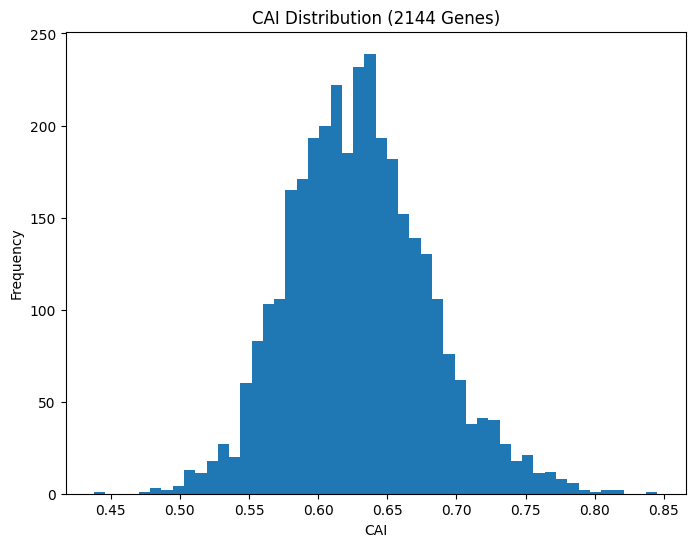

CII values shape: (3329,)
CII values (first 5): [0.30653266 0.28351836 0.22371968 0.24336283 0.22680412]


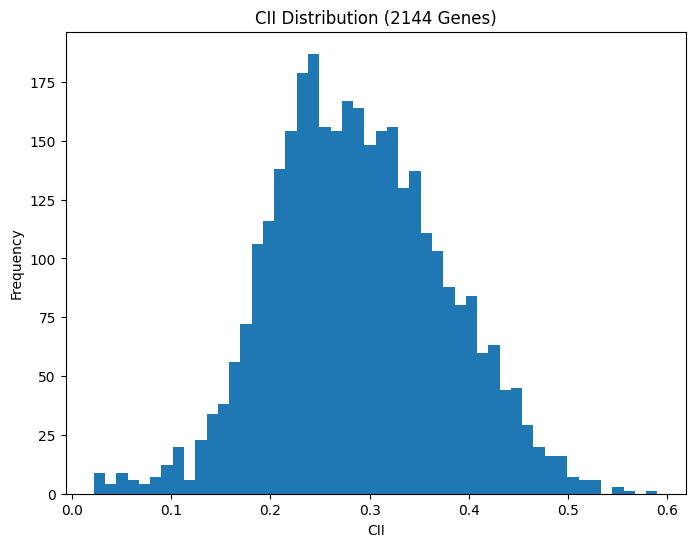

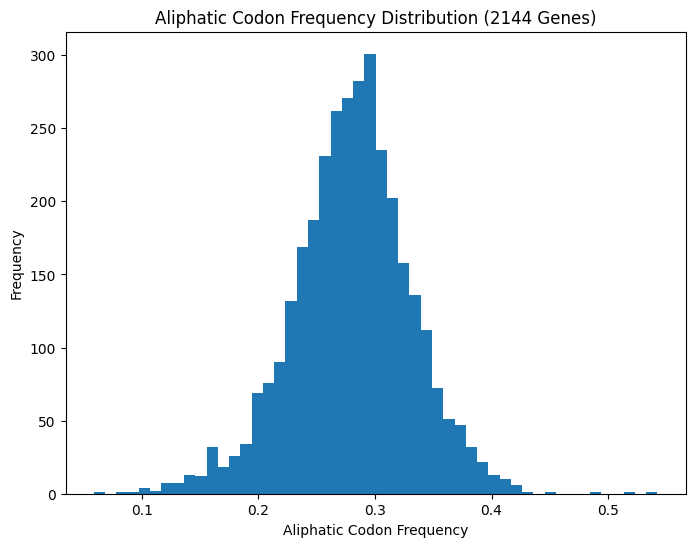

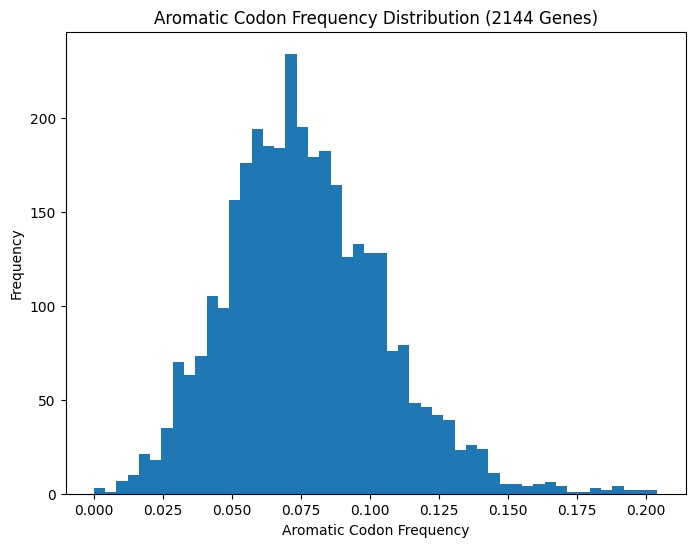

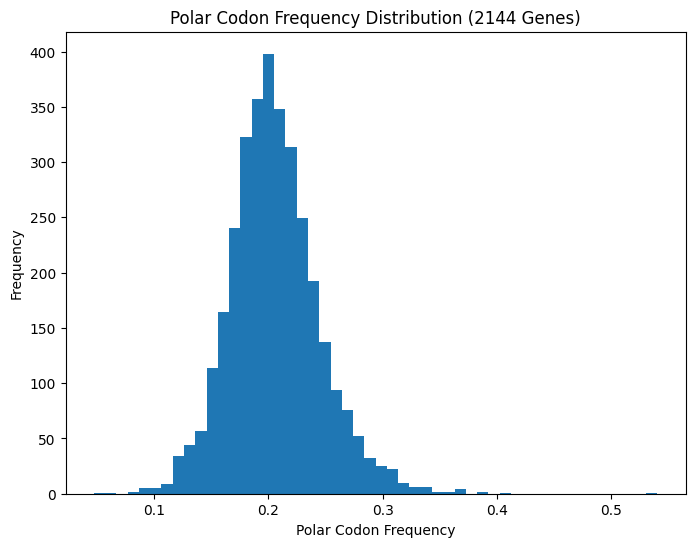

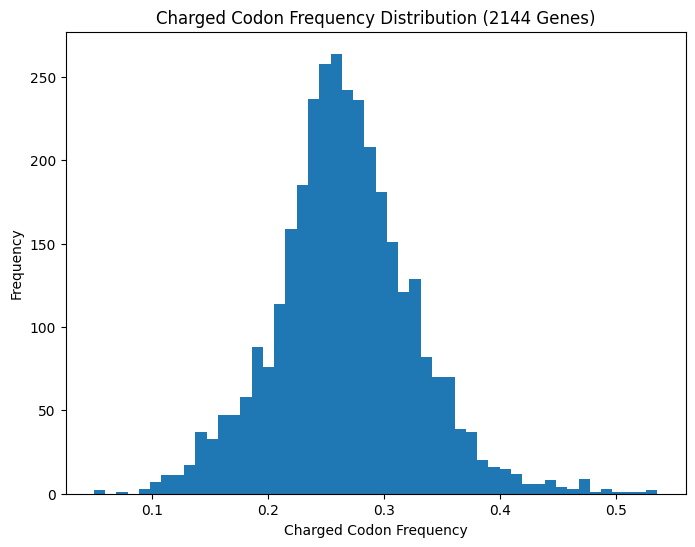

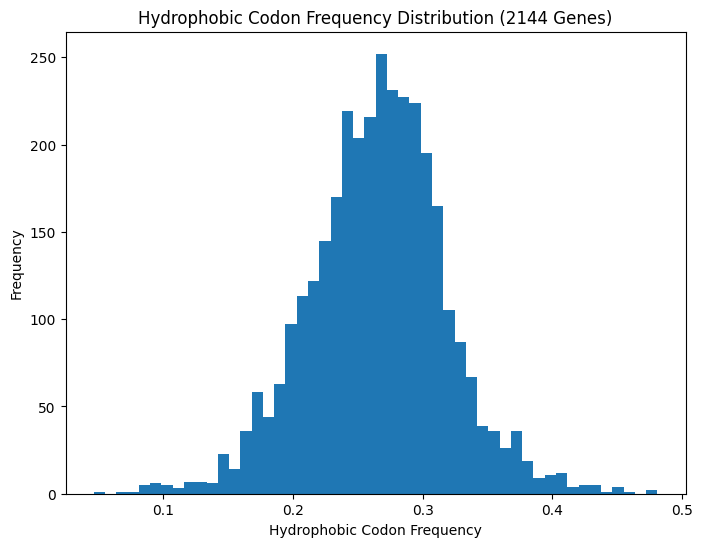

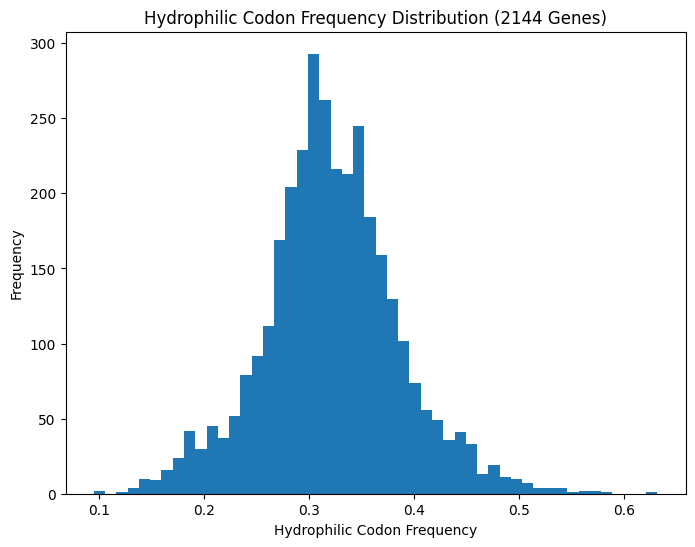

Feature names (RNA codons): ['AAA', 'AAC', 'AAG', 'AAU', 'ACA', 'ACC', 'ACG', 'ACU', 'AGA', 'AGC', 'AGG', 'AGU', 'AUA', 'AUC', 'AUG', 'AUU', 'CAA', 'CAC', 'CAG', 'CAU', 'CCA', 'CCC', 'CCG', 'CCU', 'CGA', 'CGC', 'CGG', 'CGU', 'CUA', 'CUC', 'CUG', 'CUU', 'GAA', 'GAC', 'GAG', 'GAU', 'GCA', 'GCC', 'GCG', 'GCU', 'GGA', 'GGC', 'GGG', 'GGU', 'GUA', 'GUC', 'GUG', 'GUU', 'UAC', 'UAU', 'UCA', 'UCC', 'UCG', 'UCU', 'UGA', 'UGC', 'UGG', 'UGU', 'UUA', 'UUC', 'UUG', 'UUU']
Number of codon features: 62
NaNs in X_scaled: False
Infs in X_scaled: False
Excluded 19 rRNA genes: ['5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS', 'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s', 'rDNA_promoter', 'rDNA_promoter1', 'mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846']
Remaining genes: 52318
Aligned 3329 genes for CPM data
NaNs in cpm_tgfb_scaled: False
Infs in cpm_tgfb_scaled: False
NaNs in cai_scaled: False
Infs in cai_scaled: False
NaNs in cii_scaled: False
Infs

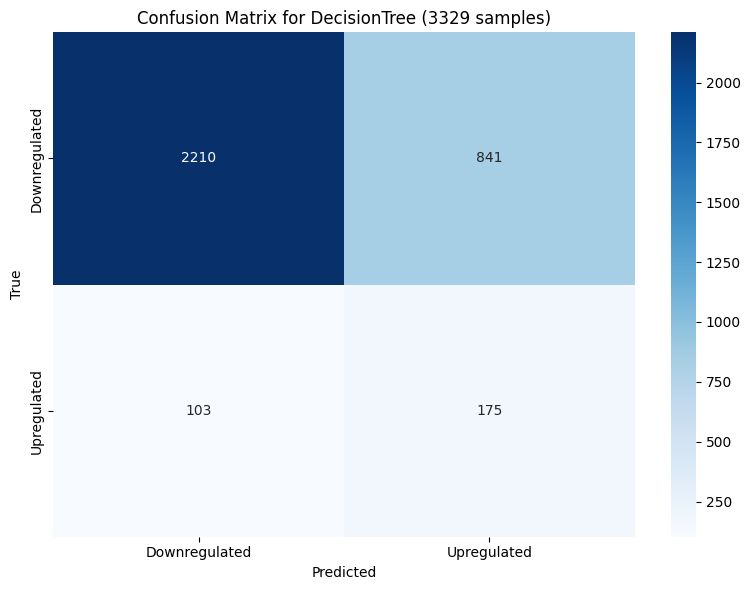

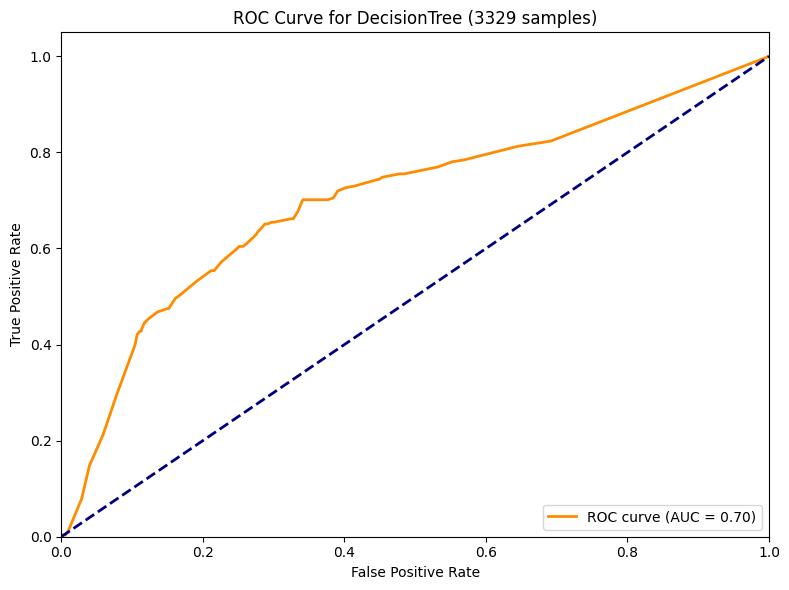

Saved predictions to predictions_DecisionTree.csv
Final Model Best Parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Final Model Best Cross-Validation Recall: 0.6016194331983805
Processing SHAP for model: DecisionTree
Using TreeExplainer


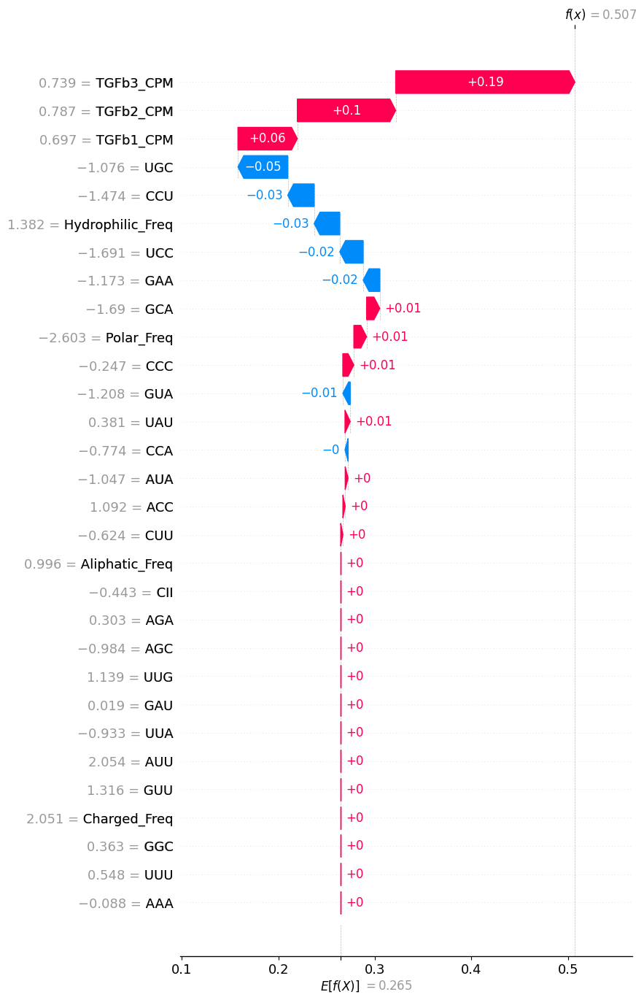

<Figure size 640x480 with 0 Axes>

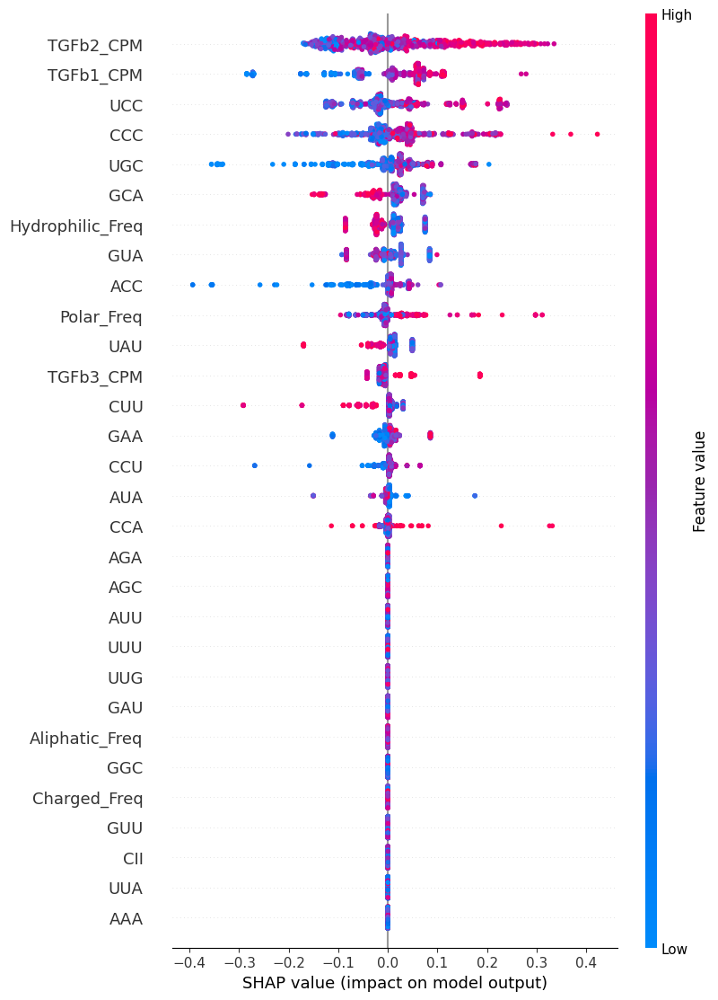

<Figure size 640x480 with 0 Axes>

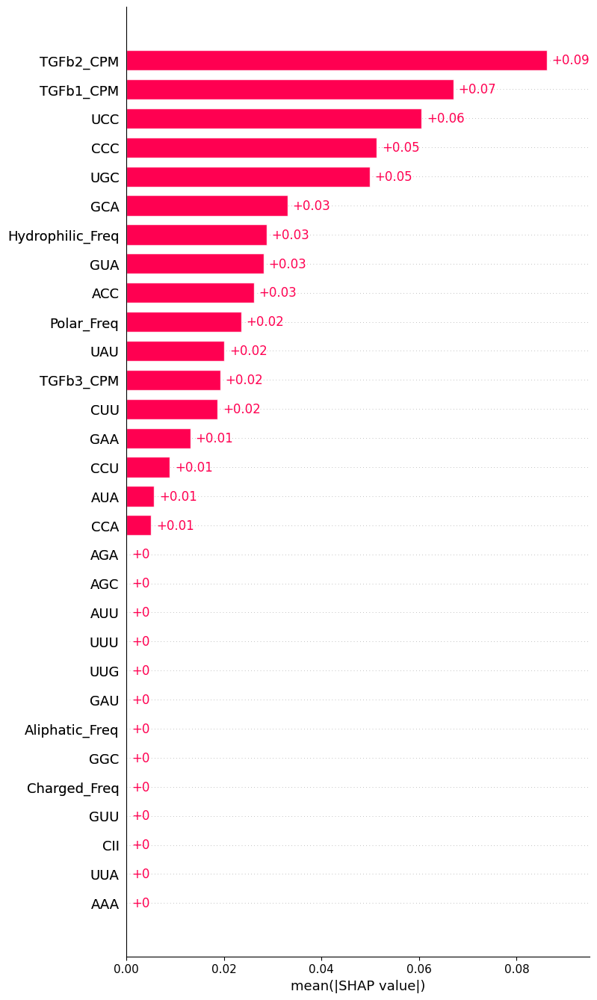

<Figure size 640x480 with 0 Axes>


=== Processing RandomForest ===
Processing fold 1/5
Fitting RandomForest on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Fold 1 Best Cross-Validation Recall: 0.30180180180180183
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting RandomForest on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Fold 2 Best Cross-Validation Recall: 0.27027027027027023
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting RandomForest on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
Fold 3 Best Cross-Validation Recall: 0.28378378378378377
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting RandomForest on fold 4 with X_tra

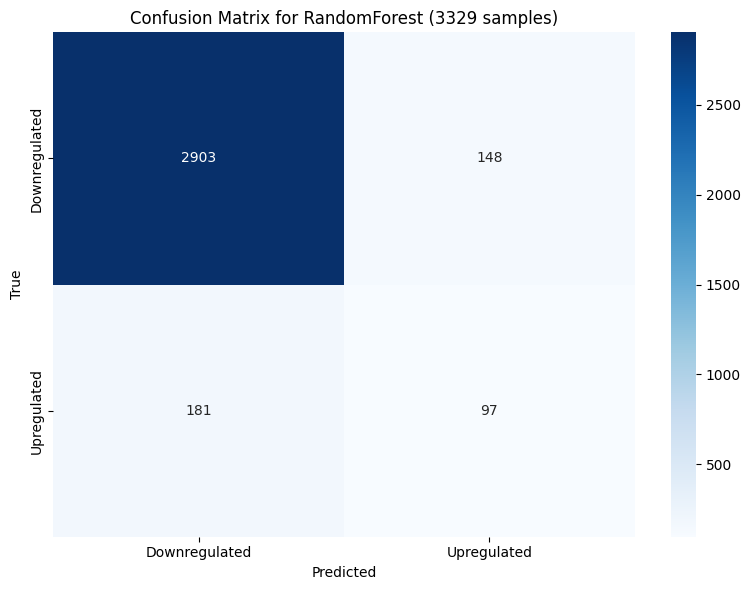

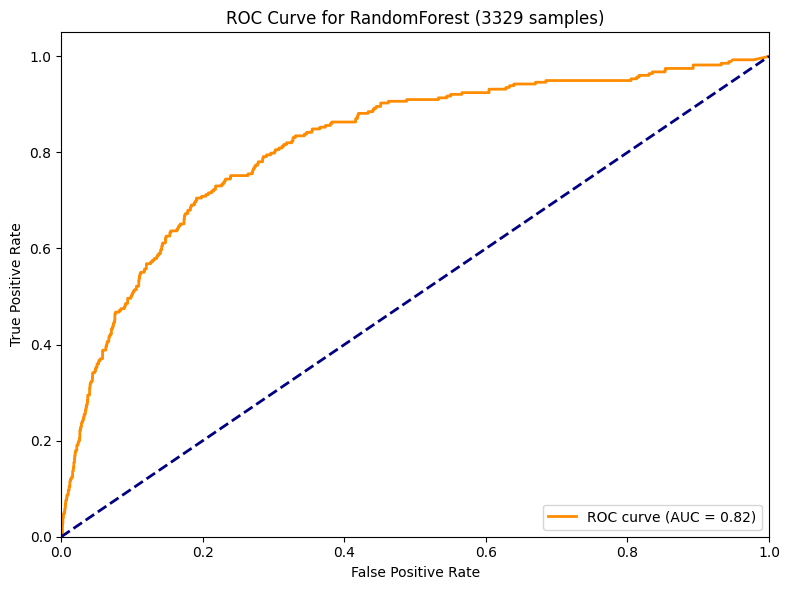

Saved predictions to predictions_RandomForest.csv
Final Model Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Final Model Best Cross-Validation Recall: 0.3010796221322537


 37%|=======             | 624/1666 [00:11<00:18]       

Processing SHAP for model: RandomForest
Using TreeExplainer


 97%|=================== | 1612/1666 [00:28<00:00]       

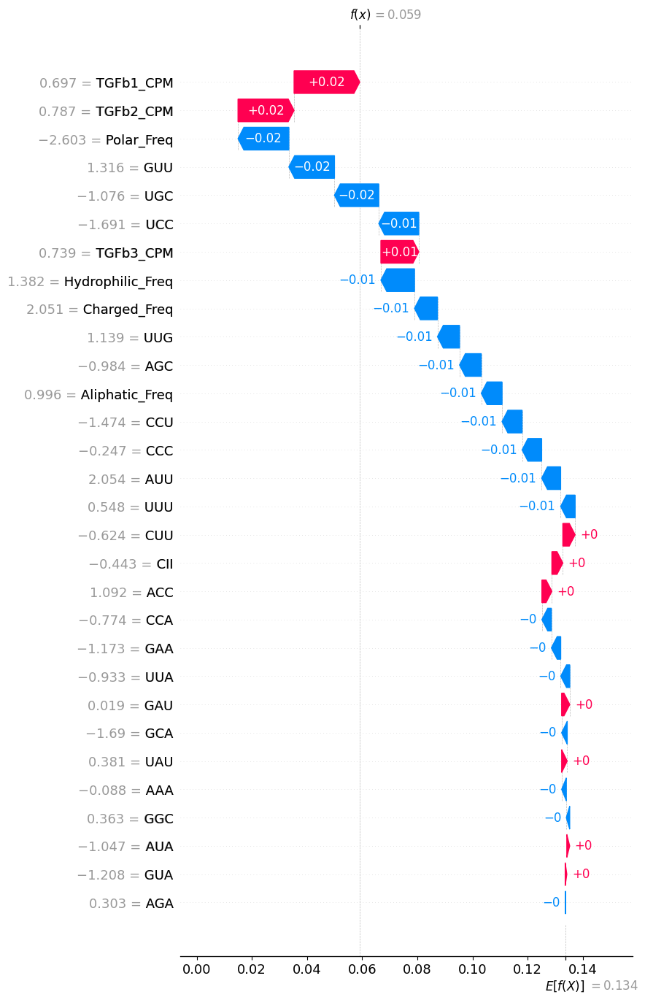

<Figure size 640x480 with 0 Axes>

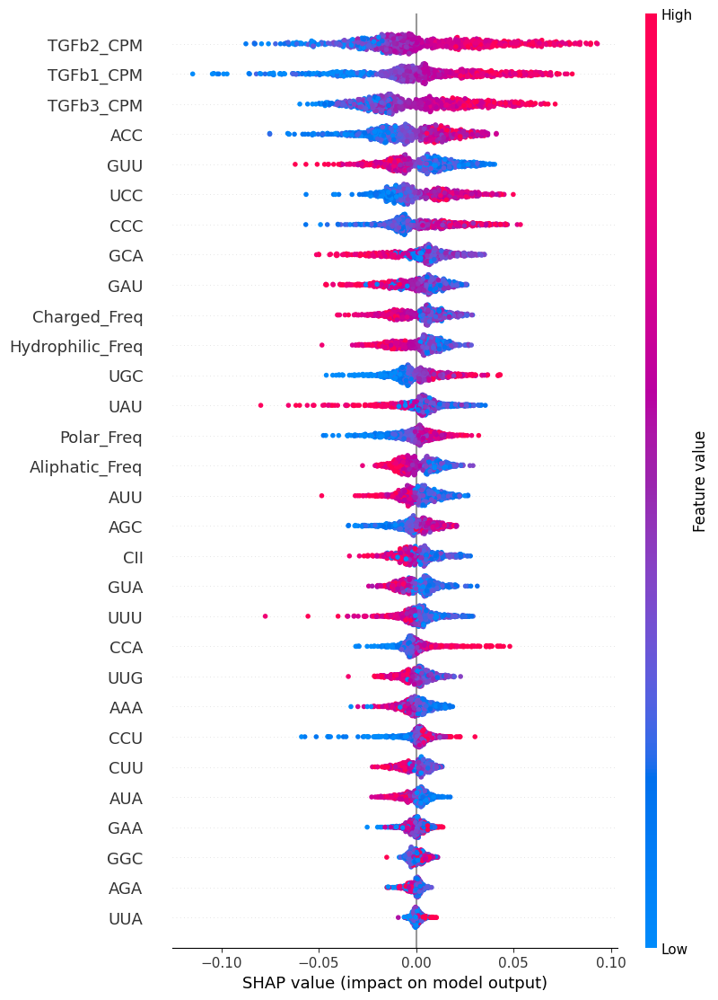

<Figure size 640x480 with 0 Axes>

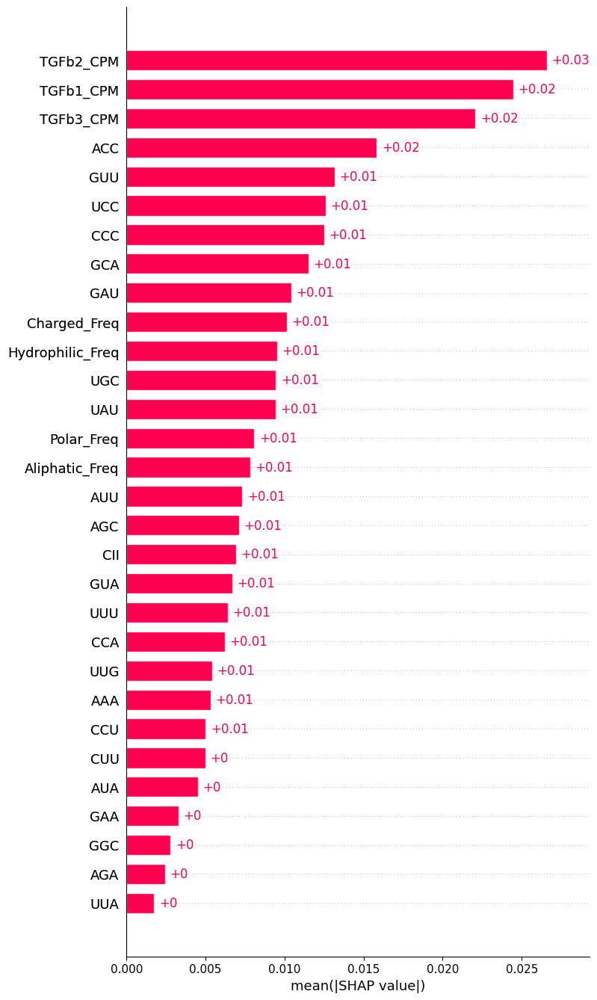

<Figure size 640x480 with 0 Axes>


=== Processing LogisticRegression ===
Processing fold 1/5
Fitting LogisticRegression on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Fold 1 Best Cross-Validation Recall: 0.0990990990990991
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting LogisticRegression on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Fold 2 Best Cross-Validation Recall: 0.0900900900900901
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting LogisticRegression on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Fold 3 Best Cross-Validation Recall: 0.0900900900900901
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting LogisticRegression on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'

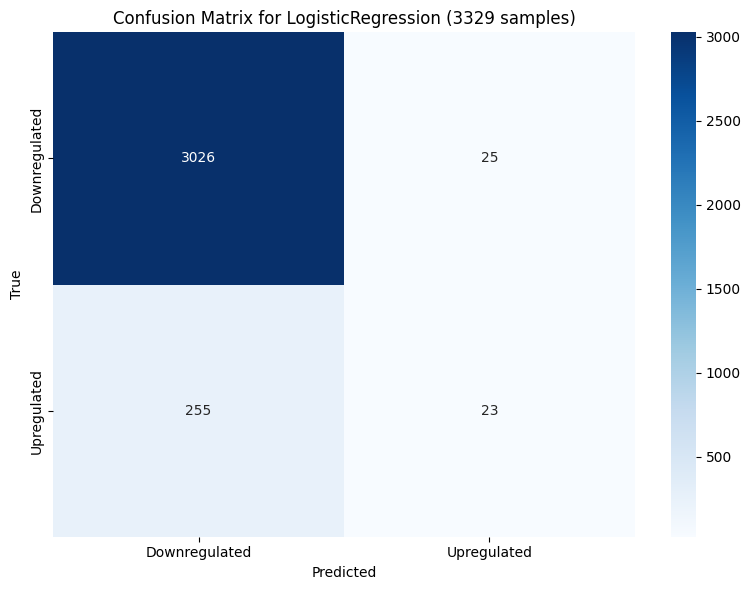

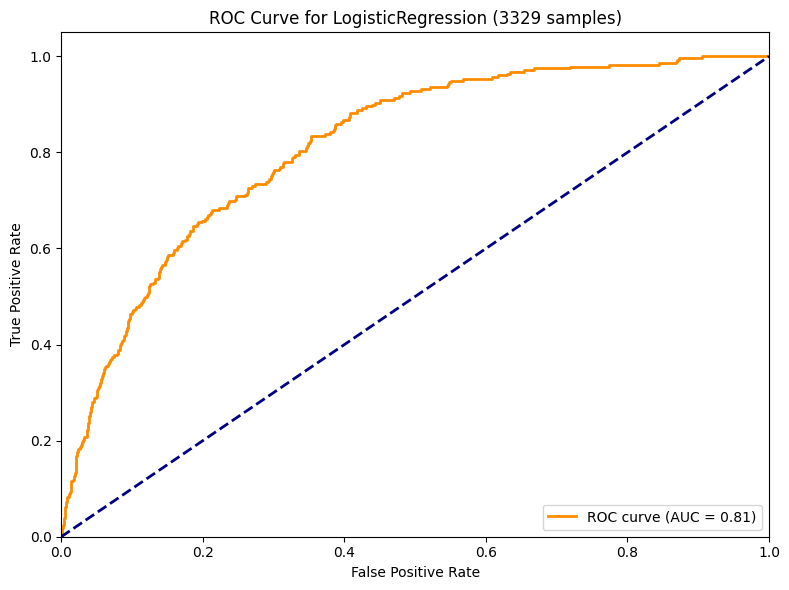

Saved predictions to predictions_LogisticRegression.csv
Final Model Best Parameters: {'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}
Final Model Best Cross-Validation Recall: 0.06747638326585695
Processing SHAP for model: LogisticRegression
Using LinearExplainer


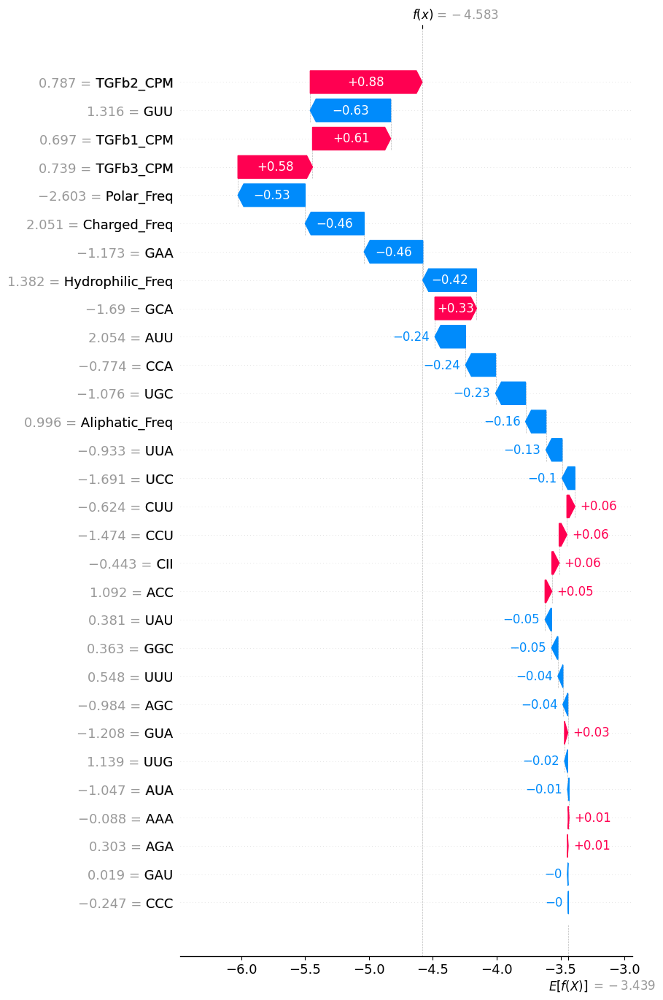

<Figure size 640x480 with 0 Axes>

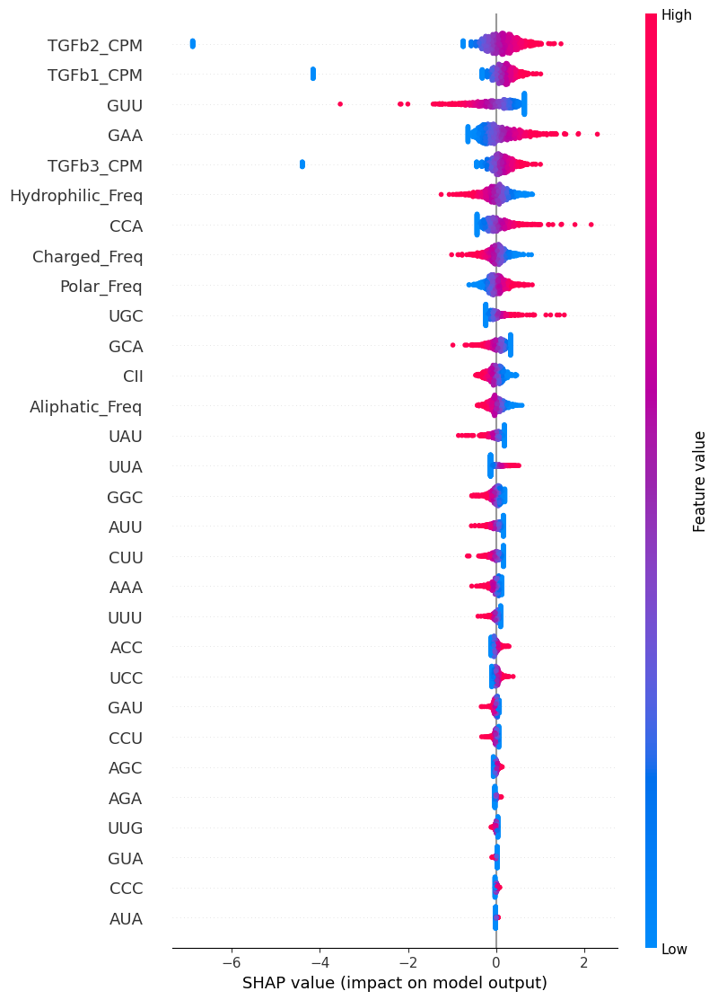

<Figure size 640x480 with 0 Axes>

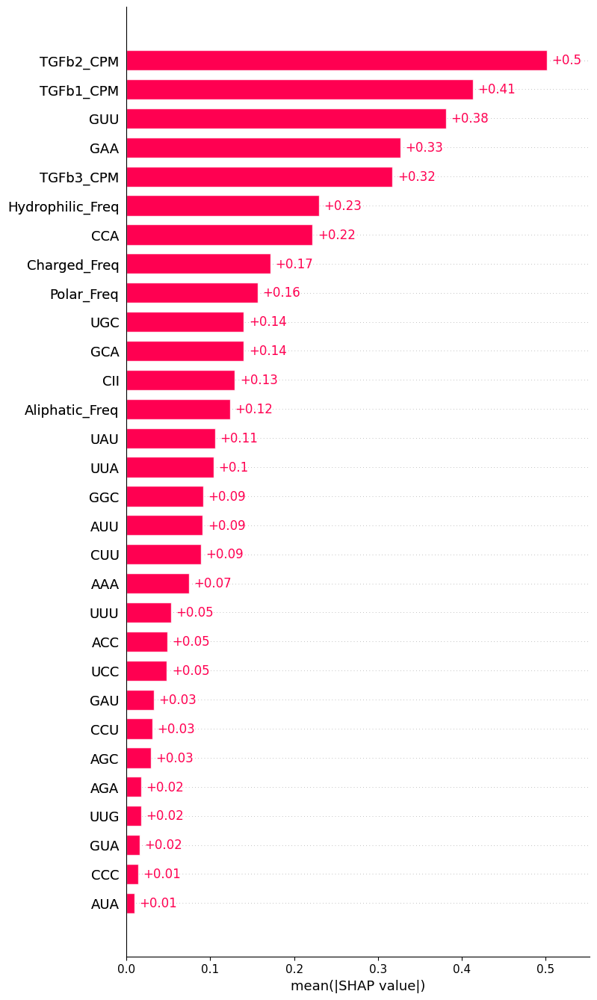

<Figure size 640x480 with 0 Axes>


=== Processing SVM_Linear ===
Processing fold 1/5
Fitting SVM_Linear on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 0.01}
Fold 1 Best Cross-Validation Recall: 0.7432432432432433
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting SVM_Linear on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 0.01}
Fold 2 Best Cross-Validation Recall: 0.6846846846846847
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting SVM_Linear on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 0.01}
Fold 3 Best Cross-Validation Recall: 0.7297297297297298
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting SVM_Linear on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 0.1}
Fold 4 Best Cross-Validation Recall: 0.7443843843843844
Training fold 4: X_train_fold shape: (2663, 30)
Processing fold 5/5
Fitting SVM_Linear on fold 5 with X_train_fold sha

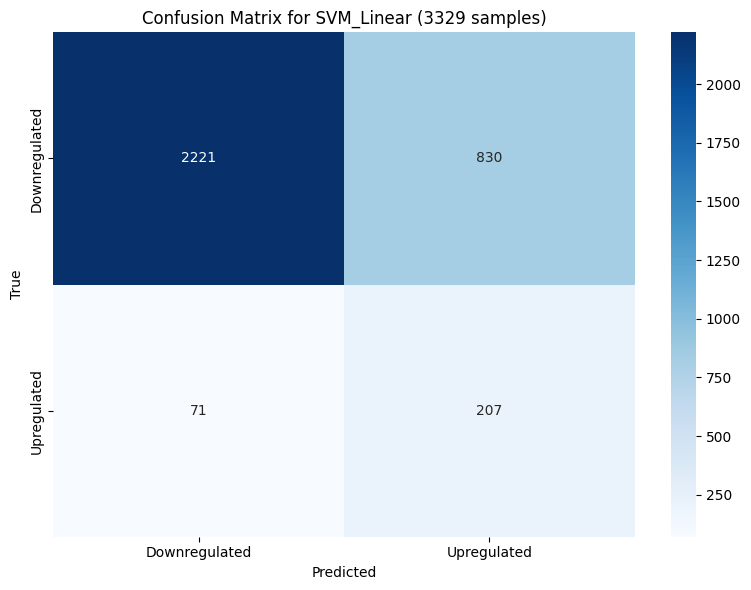

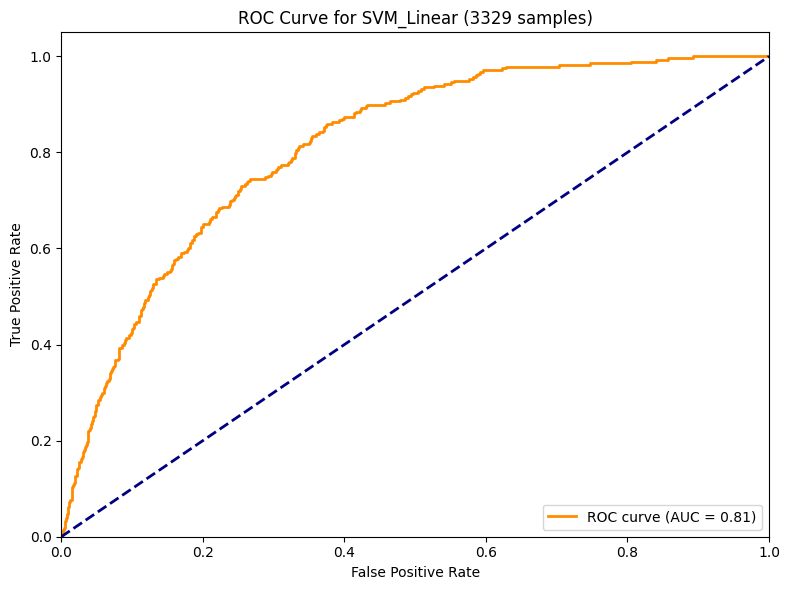

Saved predictions to predictions_SVM_Linear.csv
Final Model Best Parameters: {'C': 0.01}
Final Model Best Cross-Validation Recall: 0.716059379217274
Processing SHAP for model: SVM_Linear
Using LinearExplainer


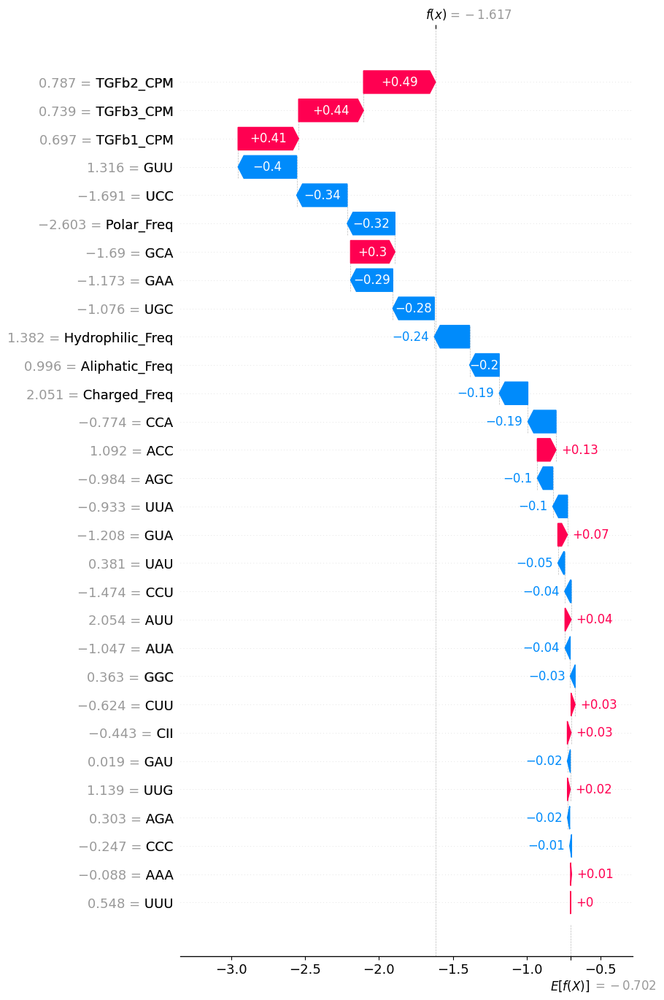

<Figure size 640x480 with 0 Axes>

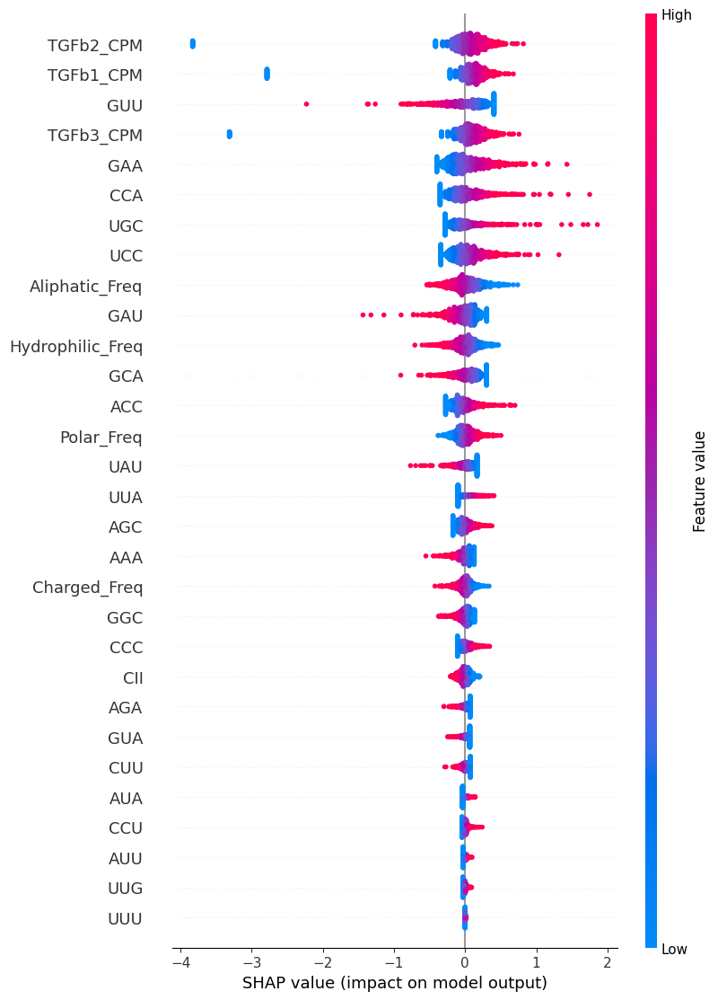

<Figure size 640x480 with 0 Axes>

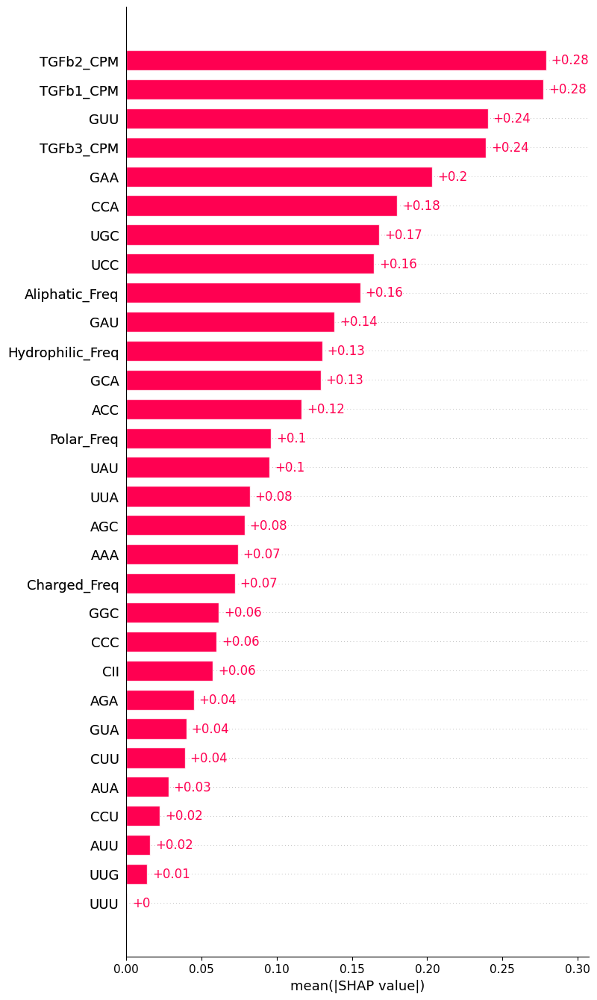

<Figure size 640x480 with 0 Axes>


=== Processing SVM_Polynomial ===
Processing fold 1/5
Fitting SVM_Polynomial on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 0.1, 'degree': 2}
Fold 1 Best Cross-Validation Recall: 0.7387387387387387
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting SVM_Polynomial on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 0.1, 'degree': 2}
Fold 2 Best Cross-Validation Recall: 0.8108108108108109
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting SVM_Polynomial on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 0.1, 'degree': 2}
Fold 3 Best Cross-Validation Recall: 0.8288288288288288
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting SVM_Polynomial on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 0.01, 'degree': 3}
Fold 4 Best Cross-Validation Recall: 0.9061261261261261
Training fold 4: X_train_fold shape: (2663, 30)


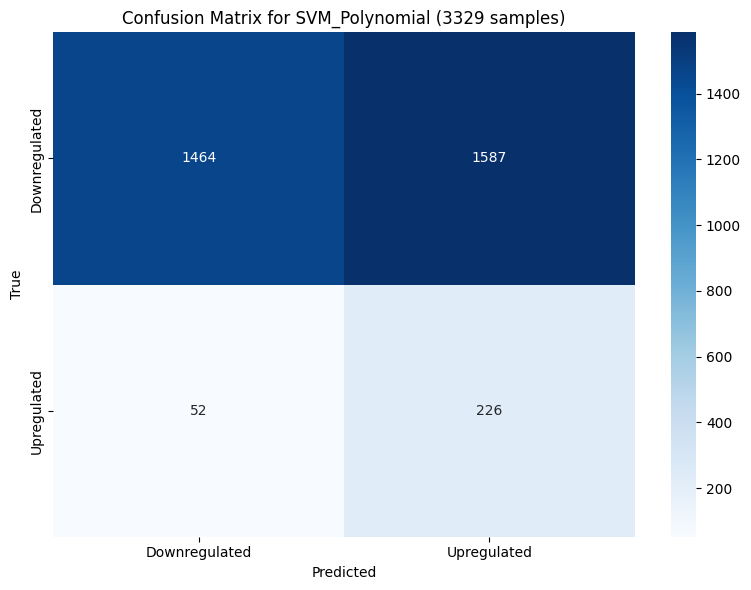

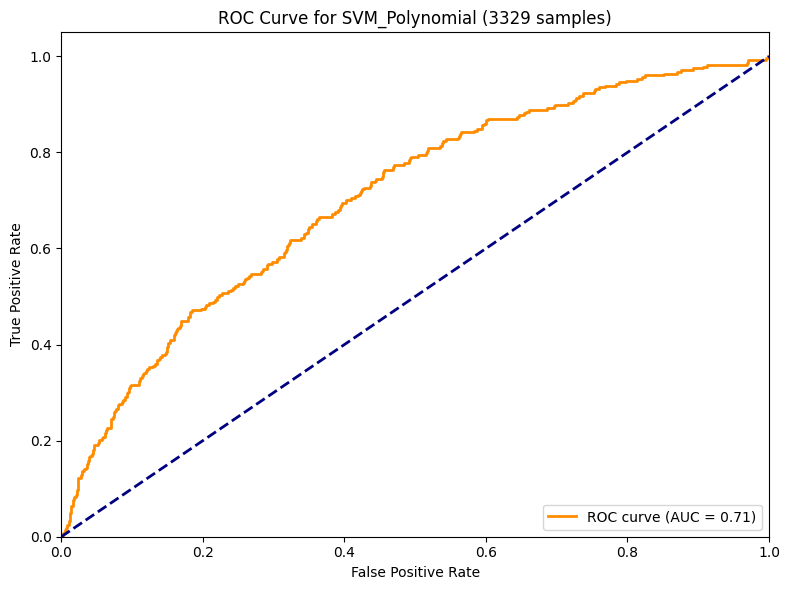

Saved predictions to predictions_SVM_Polynomial.csv
Final Model Best Parameters: {'C': 0.01, 'degree': 2}
Final Model Best Cross-Validation Recall: 0.8224021592442645
Processing SHAP for model: SVM_Polynomial
Using KernelExplainer


  0%|          | 0/833 [00:00<?, ?it/s]

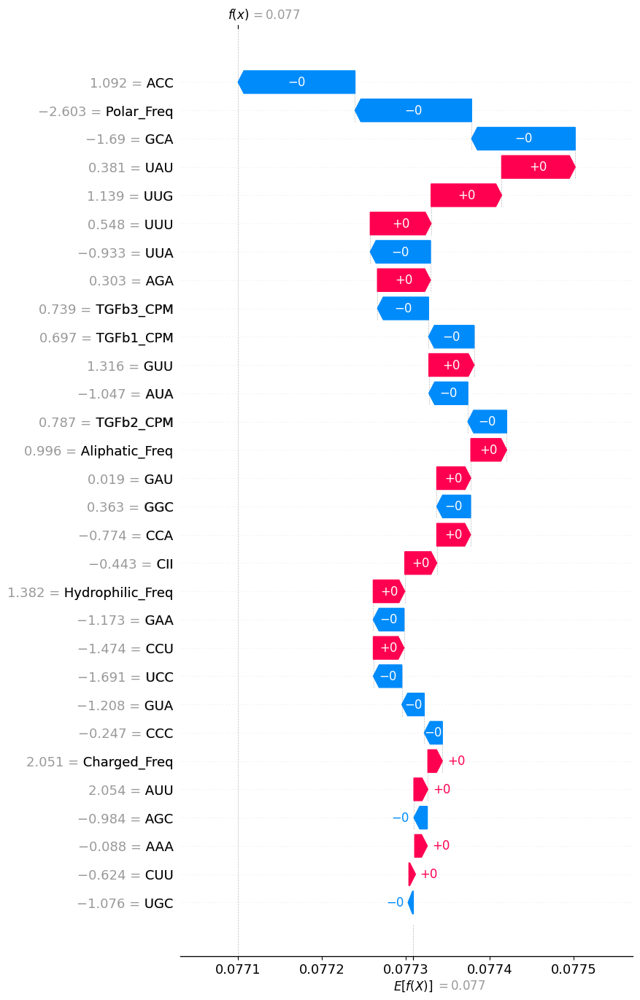

<Figure size 640x480 with 0 Axes>

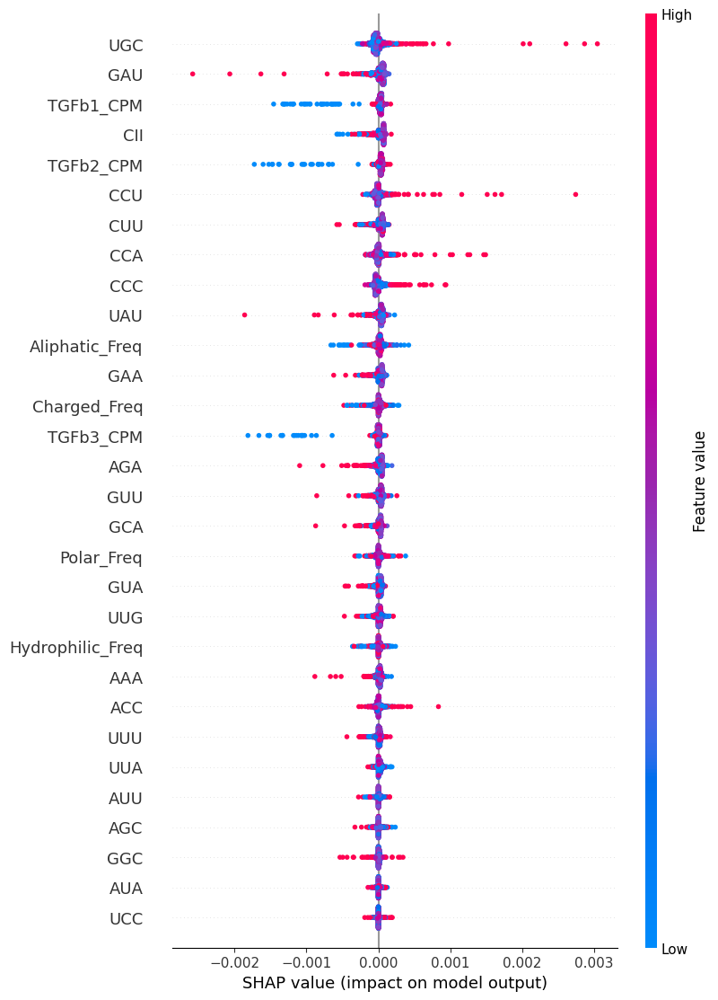

<Figure size 640x480 with 0 Axes>

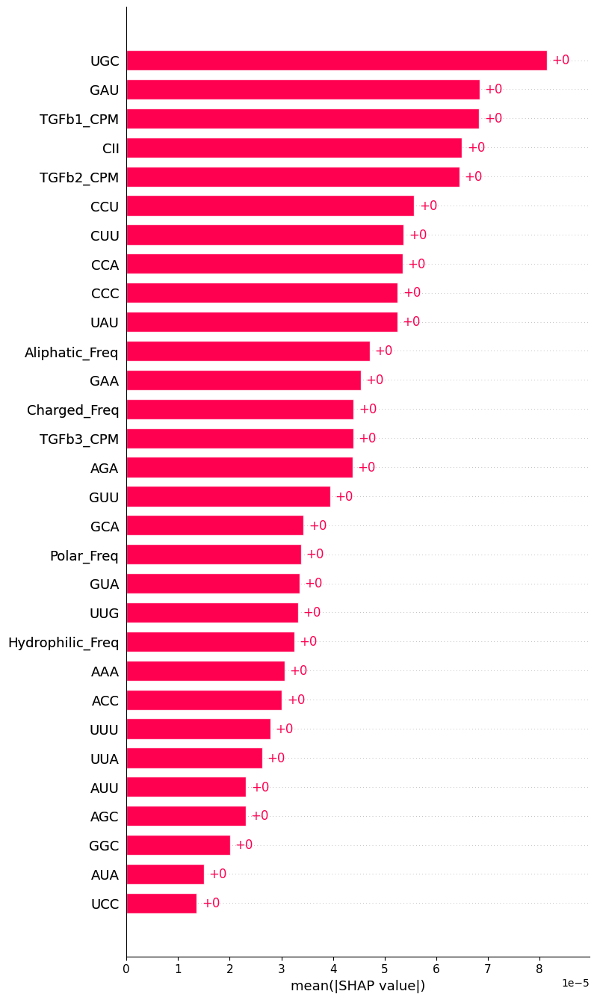

<Figure size 640x480 with 0 Axes>


=== Processing SVM_RBF ===
Processing fold 1/5
Fitting SVM_RBF on fold 1 with X_train_fold shape: (2663, 30)
Fold 1 Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Fold 1 Best Cross-Validation Recall: 0.7432432432432433
Training fold 1: X_train_fold shape: (2663, 30)
Processing fold 2/5
Fitting SVM_RBF on fold 2 with X_train_fold shape: (2663, 30)
Fold 2 Best Parameters: {'C': 0.01, 'gamma': 'auto'}
Fold 2 Best Cross-Validation Recall: 0.7387387387387386
Training fold 2: X_train_fold shape: (2663, 30)
Processing fold 3/5
Fitting SVM_RBF on fold 3 with X_train_fold shape: (2663, 30)
Fold 3 Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Fold 3 Best Cross-Validation Recall: 0.7522522522522522
Training fold 3: X_train_fold shape: (2663, 30)
Processing fold 4/5
Fitting SVM_RBF on fold 4 with X_train_fold shape: (2663, 30)
Fold 4 Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Fold 4 Best Cross-Validation Recall: 0.7308108108108108
Training fold 4: X_train_fold shape: (2663, 30)
Processing fo

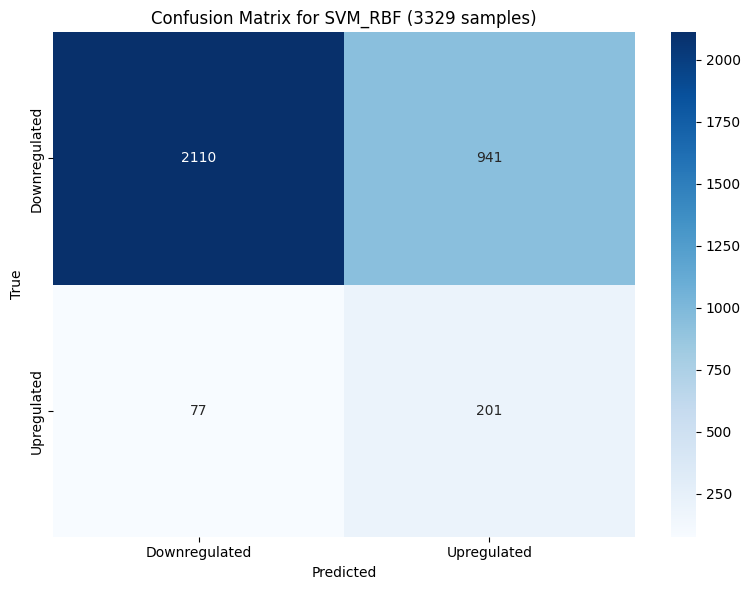

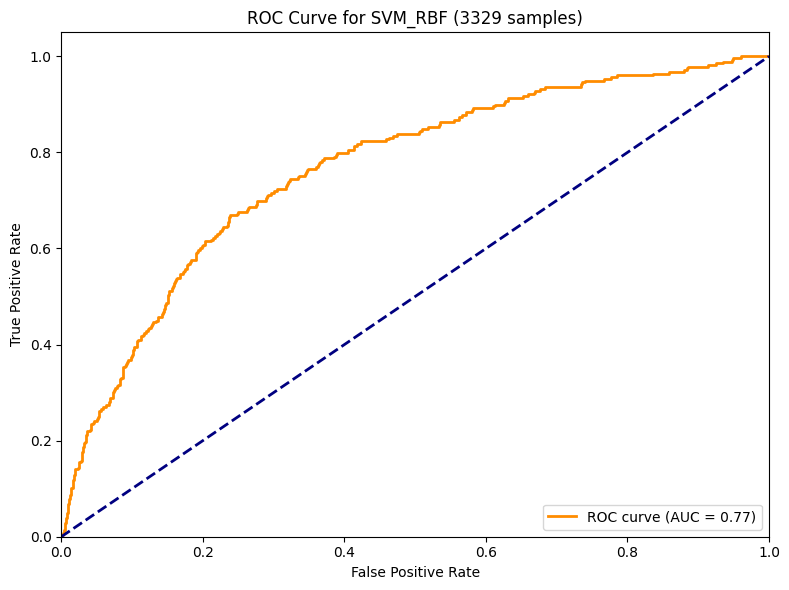

Saved predictions to predictions_SVM_RBF.csv
Final Model Best Parameters: {'C': 0.01, 'gamma': 'scale'}
Final Model Best Cross-Validation Recall: 0.7516869095816464
Processing SHAP for model: SVM_RBF
Using KernelExplainer


  0%|          | 0/833 [00:00<?, ?it/s]

In [ ]:
"""
Machine learning pipeline for classifying upregulated vs. downregulated genes in TGF-β Ribo-seq study.
Computes CAI, CII, codon group frequencies, and TGF-β CPM features, trains multiple models, and generates SHAP plots.
"""
import warnings
from sklearn.exceptions import ConvergenceWarning
# Apply individual filters for each warning category
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from scikeras.wrappers import KerasClassifier
import torch
import torch.nn as nn
import torch.optim as optim
from skorch import NeuralNetClassifier
from collections import Counter
from itertools import chain
import logging
logging.getLogger('skorch').setLevel(logging.ERROR)

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
# Define codon groups for new features
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}  # Alanine, Isoleucine, Leucine, Valine
AROMATIC_AAS = {'F', 'Y', 'W'}  # Phenylalanine, Tyrosine, Tryptophan
POLAR_AAS = {'N', 'Q', 'S', 'T'}  # Asparagine, Glutamine, Serine, Threonine
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}  # Aspartic acid, Glutamic acid, Lysine, Arginine, Histidine
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}  # Phenylalanine, Isoleucine, Leucine, Methionine, Valine
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}  # Asparagine, Aspartic acid, Glutamine, Glutamic acid, Lysine, Arginine
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def CAI(sequence, weights):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    sequence_weights = []
    for codon in codons:
        if codon in STOP_CODONS:
            continue
        if codon not in NON_SYNONYMOUS_CODONS:
            if codon not in weights:
                raise KeyError(f"Missing weight for codon {codon}.")
            sequence_weights.append(weights[codon])
    return geometric_mean(sequence_weights) if sequence_weights else 0.0

def CII(sequence):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    total_codons = len(codons)
    if total_codons == 0:
        return 0.0
    destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
    return destabilizing_count / total_codons

def compute_codon_group_freq(sequence, codon_group):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    total_codons = len([c for c in codons if c not in STOP_CODONS])
    if total_codons == 0:
        return 0.0
    group_count = sum(1 for codon in codons if codon in codon_group and codon not in STOP_CODONS)
    return group_count / total_codons

def load_fasta_sequences(up_file, down_file):
    sequences = []
    labels = []
    gene_ids = []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                with open(file_path, 'r') as f:
                    for record in SeqIO.parse(file_path, 'fasta'):
                        seq = str(record.seq).upper()
                        if len(seq) >= 3:
                            seq = seq[:-3]
                        if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                            log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                            continue
                        sequences.append(seq)
                        labels.append(label)
                        gene_ids.append(record.id.split('|')[1])
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                return None, None, None
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            with open(ref_file, 'r') as f:
                for record in SeqIO.parse(f, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        continue
                    ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
#up_file = 'unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
#down_file = 'unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
ref_file = "tgfb_top100_highly_expressed_cds.fasta"

# Input file paths
#tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
#tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
#treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
#treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights)[:5]})
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    exit(1)

print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")
if len(sequences) != 2144:
    print(f"Warning: Expected 2144 sequences, got {len(sequences)}")

# Compute CAI
cai_values = []
for seq in sequences:
    try:
        cai = CAI(seq, ref_weights)
        cai_values.append(cai)
    except (ValueError, KeyError) as e:
        print(f"Error computing CAI for sequence {seq[:30]}...: {e}")
        cai_values.append(0.0)
cai_values = np.array(cai_values)
print("CAI values shape:", cai_values.shape)
print("CAI values (first 5):", cai_values[:5])

# Visualize CAI distribution
plt.figure(figsize=(8, 6))
plt.hist(cai_values, bins=50)
plt.title("CAI Distribution (2144 Genes)")
plt.xlabel("CAI")
plt.ylabel("Frequency")
plt.show()

# Compute CII
cii_values = []
for seq in sequences:
    try:
        cii = CII(seq)
        cii_values.append(cii)
    except ValueError as e:
        print(f"Error computing CII for sequence {seq[:30]}...: {e}")
        cii_values.append(0.0)
cii_values = np.array(cii_values)
print("CII values shape:", cii_values.shape)
print("CII values (first 5):", cii_values[:5])

# Visualize CII distribution
plt.figure(figsize=(8, 6))
plt.hist(cii_values, bins=50)
plt.title("CII Distribution (2144 Genes)")
plt.xlabel("CII")
plt.ylabel("Frequency")
plt.show()

# Compute new codon group frequencies
aliphatic_freq = []
aromatic_freq = []
polar_freq = []
charged_freq = []
hydrophobic_freq = []
hydrophilic_freq = []
for seq in sequences:
    try:
        aliphatic_freq.append(compute_codon_group_freq(seq, ALIPHATIC_CODONS))
        aromatic_freq.append(compute_codon_group_freq(seq, AROMATIC_CODONS))
        polar_freq.append(compute_codon_group_freq(seq, POLAR_CODONS))
        charged_freq.append(compute_codon_group_freq(seq, CHARGED_CODONS))
        hydrophobic_freq.append(compute_codon_group_freq(seq, HYDROPHOBIC_CODONS))
        hydrophilic_freq.append(compute_codon_group_freq(seq, HYDROPHILIC_CODONS))
    except ValueError as e:
        print(f"Error computing codon group frequencies for sequence {seq[:30]}...: {e}")
        aliphatic_freq.append(0.0)
        aromatic_freq.append(0.0)
        polar_freq.append(0.0)
        charged_freq.append(0.0)
        hydrophobic_freq.append(0.0)
        hydrophilic_freq.append(0.0)
aliphatic_freq = np.array(aliphatic_freq)
aromatic_freq = np.array(aromatic_freq)
polar_freq = np.array(polar_freq)
charged_freq = np.array(charged_freq)
hydrophobic_freq = np.array(hydrophobic_freq)
hydrophilic_freq = np.array(hydrophilic_freq)

# Visualize new codon group frequencies
plt.figure(figsize=(8, 6))
plt.hist(aliphatic_freq, bins=50)
plt.title("Aliphatic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Aliphatic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(aromatic_freq, bins=50)
plt.title("Aromatic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Aromatic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(polar_freq, bins=50)
plt.title("Polar Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Polar Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(charged_freq, bins=50)
plt.title("Charged Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Charged Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(hydrophobic_freq, bins=50)
plt.title("Hydrophobic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Hydrophobic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(hydrophilic_freq, bins=50)
plt.title("Hydrophilic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Hydrophilic Codon Frequency")
plt.ylabel("Frequency")
plt.show()

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Extract codon frequencies
vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+')
X = vectorizer.fit_transform(codon_sequences).toarray()

# Format feature names as RNA codons
feature_names = vectorizer.get_feature_names_out()
feature_names = [codon.replace('t', 'u').replace('T', 'U').upper() for codon in feature_names]
print("Feature names (RNA codons):", feature_names)
print("Number of codon features:", len(feature_names))

# Normalize codon counts
total_codons = np.array([len(seq) // 3 for seq in sequences])[:, np.newaxis]
X_normalized = X / total_codons

# Scale codon features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_normalized)

# Handle NaNs/Infs
print("NaNs in X_scaled:", np.any(np.isnan(X_scaled)))
print("Infs in X_scaled:", np.any(np.isinf(X_scaled)))
X_scaled = np.nan_to_num(X_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Convert to DataFrame
X_df = pd.DataFrame(X_scaled, columns=feature_names)

# Load raw count data
try:
    raw_counts_df = pd.read_csv("blancgrp_161021_Riboseq.counts.raw.txt", sep="\t", index_col=0)
    if not raw_counts_df.apply(lambda x: pd.to_numeric(x, errors='coerce').notnull().all()).all():
        print("Error: Non-numeric values in matrix")
        exit(1)
except Exception as e:
    print(f"Error reading raw counts: {e}")
    exit(1)

# Exclude rRNA genes
rRNA_genes = [
    '5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS',
    'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s',
    'rDNA_promoter', 'rDNA_promoter1', 'mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846'
]
excluded_genes = [g for g in rRNA_genes if g in raw_counts_df.index]
raw_counts_df = raw_counts_df.drop(index=excluded_genes, errors='ignore')
print(f"Excluded {len(excluded_genes)} rRNA genes: {excluded_genes}")
print(f"Remaining genes: {len(raw_counts_df)}")

# Convert to CPM
raw_counts = raw_counts_df.values
library_sizes = raw_counts.sum(axis=0)
cpm_data = (raw_counts / library_sizes) * 1e6

# Align CPM data with gene IDs
try:
    cpm_df = pd.DataFrame(cpm_data, index=raw_counts_df.index, columns=raw_counts_df.columns.tolist())
    valid_gene_ids = [g for g in gene_ids if g in cpm_df.index]
    if len(valid_gene_ids) < len(gene_ids):
        missing_genes = set(gene_ids) - set(valid_gene_ids)
        print(f"Warning: {len(missing_genes)} genes missing in CPM data: {missing_genes}")
        if len(valid_gene_ids) < len(gene_ids) * 0.9:
            print(f"Error: Too many missing genes ({len(missing_genes)}/{len(gene_ids)}). Check FASTA or counts data")
            exit(1)
    cpm_df = cpm_df.loc[valid_gene_ids]
    valid_indices = [i for i in range(len(gene_ids)) if gene_ids[i] in valid_gene_ids]
    sequences = [sequences[i] for i in valid_indices]
    labels = [labels[i] for i in valid_indices]
    gene_ids = [gene_ids[i] for i in valid_indices]
    print(f"Aligned {len(valid_gene_ids)} genes for CPM data")
    extra_genes = set(cpm_df.index) - set(valid_gene_ids)
    if extra_genes:
        print(f"Note: {len(extra_genes)} extra genes in CPM data not in FASTA (sample): {list(extra_genes)[:5]}")
except Exception as e:
    print(f"Error aligning CPM data: {e}")
    exit(1)

cpm_data = cpm_df.values

# Preprocess TGF-β CPM
cpm_tgfb = cpm_data[:, 3:6]
cpm_tgfb = np.log2(np.maximum(cpm_tgfb, 1e-10))
cpm_scaler = StandardScaler()
cpm_tgfb_scaled = cpm_scaler.fit_transform(cpm_tgfb)

# Handle NaNs/Infs
print("NaNs in cpm_tgfb_scaled:", np.any(np.isnan(cpm_tgfb_scaled)))
print("Infs in cpm_tgfb_scaled:", np.any(np.isinf(cpm_tgfb_scaled)))
cpm_tgfb_scaled = np.nan_to_num(cpm_tgfb_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale CAI
cai_scaler = StandardScaler()
cai_scaled = cai_scaler.fit_transform(cai_values[:len(valid_indices)][:, np.newaxis])
print("NaNs in cai_scaled:", np.any(np.isnan(cai_scaled)))
print("Infs in cai_scaled:", np.any(np.isinf(cai_scaled)))
cai_scaled = np.nan_to_num(cai_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale CII
cii_scaler = StandardScaler()
cii_scaled = cii_scaler.fit_transform(cii_values[:len(valid_indices)][:, np.newaxis])
print("NaNs in cii_scaled:", np.any(np.isnan(cii_scaled)))
print("Infs in cii_scaled:", np.any(np.isinf(cii_scaled)))
cii_scaled = np.nan_to_num(cii_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale new codon group frequencies
aliphatic_scaler = StandardScaler()
aliphatic_scaled = aliphatic_scaler.fit_transform(aliphatic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in aliphatic_scaled:", np.any(np.isnan(aliphatic_scaled)))
print("Infs in aliphatic_scaled:", np.any(np.isinf(aliphatic_scaled)))
aliphatic_scaled = np.nan_to_num(aliphatic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

aromatic_scaler = StandardScaler()
aromatic_scaled = aromatic_scaler.fit_transform(aromatic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in aromatic_scaled:", np.any(np.isnan(aromatic_scaled)))
print("Infs in aromatic_scaled:", np.any(np.isinf(aromatic_scaled)))
aromatic_scaled = np.nan_to_num(aromatic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

polar_scaler = StandardScaler()
polar_scaled = polar_scaler.fit_transform(polar_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in polar_scaled:", np.any(np.isnan(polar_scaled)))
print("Infs in polar_scaled:", np.any(np.isinf(polar_scaled)))
polar_scaled = np.nan_to_num(polar_scaled, nan=0.0, posinf=0.0, neginf=0.0)

charged_scaler = StandardScaler()
charged_scaled = charged_scaler.fit_transform(charged_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in charged_scaled:", np.any(np.isnan(charged_scaled)))
print("Infs in charged_scaled:", np.any(np.isinf(charged_scaled)))
charged_scaled = np.nan_to_num(charged_scaled, nan=0.0, posinf=0.0, neginf=0.0)

hydrophobic_scaler = StandardScaler()
hydrophobic_scaled = hydrophobic_scaler.fit_transform(hydrophobic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in hydrophobic_scaled:", np.any(np.isnan(hydrophobic_scaled)))
print("Infs in hydrophobic_scaled:", np.any(np.isinf(hydrophobic_scaled)))
hydrophobic_scaled = np.nan_to_num(hydrophobic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

hydrophilic_scaler = StandardScaler()
hydrophilic_scaled = hydrophilic_scaler.fit_transform(hydrophilic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in hydrophilic_scaled:", np.any(np.isnan(hydrophilic_scaled)))
print("Infs in hydrophilic_scaled:", np.any(np.isinf(hydrophilic_scaled)))
hydrophilic_scaled = np.nan_to_num(hydrophilic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Combine features
X_combined = np.hstack([
    X_df.values[:len(valid_indices)],
    cpm_tgfb_scaled,
    cai_scaled,
    cii_scaled,
    aliphatic_scaled,
    aromatic_scaled,
    polar_scaled,
    charged_scaled,
    hydrophobic_scaled,
    hydrophilic_scaled
])
feature_names_combined = list(feature_names) + [
    'TGFb1_CPM', 'TGFb2_CPM', 'TGFb3_CPM', 'CAI', 'CII',
    'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq',
    'Hydrophobic_Freq', 'Hydrophilic_Freq'
]
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined)

# Handle NaNs/Infs
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)

# Debug feature shapes
print("X_combined shape:", X_combined.shape)
print("X_combined_df shape:", X_combined_df.shape)
print("Feature names:", feature_names_combined)
print("Number of combined features:", len(feature_names_combined))

# Check CAI/CII/codon group variance
print("CAI variance:", np.var(cai_values[:len(valid_indices)]))
print("CII variance:", np.var(cii_values[:len(valid_indices)]))
print("Aliphatic_Freq variance:", np.var(aliphatic_freq[:len(valid_indices)]))
print("Aromatic_Freq variance:", np.var(aromatic_freq[:len(valid_indices)]))
print("Polar_Freq variance:", np.var(polar_freq[:len(valid_indices)]))
print("Charged_Freq variance:", np.var(charged_freq[:len(valid_indices)]))
print("Hydrophobic_Freq variance:", np.var(hydrophobic_freq[:len(valid_indices)]))
print("Hydrophilic_Freq variance:", np.var(hydrophilic_freq[:len(valid_indices)]))
print("CAI all zeros:", np.all(cai_values[:len(valid_indices)] == 0.0))
print("CII all zeros:", np.all(cii_values[:len(valid_indices)] == 0.0))
print("Aliphatic_Freq all zeros:", np.all(aliphatic_freq[:len(valid_indices)] == 0.0))
print("Aromatic_Freq all zeros:", np.all(aromatic_freq[:len(valid_indices)] == 0.0))
print("Polar_Freq all zeros:", np.all(polar_freq[:len(valid_indices)] == 0.0))
print("Charged_Freq all zeros:", np.all(charged_freq[:len(valid_indices)] == 0.0))
print("Hydrophobic_Freq all zeros:", np.all(hydrophobic_freq[:len(valid_indices)] == 0.0))
print("Hydrophilic_Freq all zeros:", np.all(hydrophilic_freq[:len(valid_indices)] == 0.0))

# Select top 30 features
try:
    selector = SelectKBest(score_func=f_classif, k=30)
    X_selected = selector.fit_transform(X_combined, labels)
    selected_indices = selector.get_support()
    selected_features = [feature_names_combined[i] for i, selected in enumerate(selected_indices) if selected]
    print("Selected top 30 features:", selected_features)
    print("Feature scores:", selector.scores_[selected_indices])
except Exception as e:
    print(f"Error selecting features with SelectKBest: {e}")
    classifier = RandomForestClassifier(random_state=42)
    classifier.fit(X_combined, labels)
    feature_importance = pd.Series(classifier.feature_importances_, index=feature_names_combined)
    selected_features = feature_importance.nlargest(30).index.tolist()
    selected_indices = [feature_names_combined.index(feature) for feature in selected_features]
    X_selected = X_combined[:, selected_indices]
    print("Fallback: Selected top 30 features using Random Forest:", selected_features)

# Update X_combined_df
X_combined_df = pd.DataFrame(X_selected, columns=selected_features)

# Validate
if X_combined_df.shape[0] != len(labels):
    print(f"Mismatch: X_combined_df rows ({X_combined_df.shape[0]}) != labels ({len(labels)})")
    raise ValueError

# Convert labels
labels = np.array(labels, dtype=np.float32)

# Split data for SHAP
X_train, X_test, y_train, y_test = train_test_split(X_combined_df, labels, test_size=0.25, random_state=42)

# Preprocess data
X_train = np.array(X_train, dtype=np.float32)
X_test = np.array(X_test, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Validate inputs
if np.any(np.isnan(X_train)) or np.any(np.isinf(X_train)):
    X_train = np.nan_to_num(X_train, nan=0.0, posinf=0.0, neginf=0.0)
if np.any(np.isnan(X_test)) or np.any(np.isinf(X_test)):
    X_test = np.nan_to_num(X_test, nan=0.0, posinf=0.0, neginf=0.0)
if np.any(np.isnan(y_train)) or np.any(np.isinf(y_train)):
    print("y_train contains NaN or Inf values")
    raise ValueError
if np.any(np.isnan(y_test)) or np.any(np.isinf(y_test)):
    print("y_test contains NaN or Inf values")
    raise ValueError
if not np.all(np.isin(y_train, [0, 1])):
    print("y_train contains invalid labels")
    raise ValueError
if not np.all(np.isin(y_test, [0, 1])):
    print("y_test contains invalid labels")
    raise ValueError

# Debug shapes
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape, "unique values:", np.unique(y_train))
print("y_test shape:", y_test.shape, "unique values:", np.unique(y_test))
print("X_combined_df shape:", X_combined_df.shape)
print("labels shape:", labels.shape)

# Define PyTorch model
class PyTorchNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout_rate):
        super(PyTorchNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.sigmoid(self.fc2(x))
        return x.squeeze(-1)

# Define TensorFlow model
def create_tf_model(input_dim, hidden_dim=50, dropout_rate=0.3):
    model = Sequential([
        Dense(hidden_dim, activation='relu', input_dim=input_dim),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define models and hyperparameter grids
models = {
    'DecisionTree': {
        'model': DecisionTreeClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'max_depth': [5, 10, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2]
        },
        'explainer_type': 'tree'
    },
    'RandomForest': {
        'model': RandomForestClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'n_estimators': [100, 200],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2]
        },
        'explainer_type': 'tree'
    },
    'LogisticRegression': {
        'model': LogisticRegression(random_state=42, max_iter=1000),
        'param_grid': {
            'C': [0.1, 1, 10],
            'solver': ['lbfgs', 'liblinear'],
            'penalty': ['l2']
        },
        'explainer_type': 'linear'
    },
    'SVM_Linear': {
        'model': SVC(kernel='linear', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10]
        },
        'explainer_type': 'linear'
    },
    'SVM_Polynomial': {
        'model': SVC(kernel='poly', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10],
            'degree': [2, 3]
        },
        'explainer_type': 'kernel'
    },
    'SVM_RBF': {
        'model': SVC(kernel='rbf', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10],
            'gamma': ['scale', 'auto']
        },
        'explainer_type': 'kernel'
    },
    'TensorFlow': {
        'model': KerasClassifier(
            model=create_tf_model,
            input_dim=30,
            hidden_dim=50,
            dropout_rate=0.3,
            verbose=0
        ),
        'param_grid': {
            'model__hidden_dim': [50, 100],
            'model__dropout_rate': [0.3, 0.5],
            'batch_size': [32, 64],
            'epochs': [50, 100]
        },
        'explainer_type': 'deep'
    },
    'PyTorch': {
        'model': NeuralNetClassifier(
            module=PyTorchNN,
            module__input_dim=30,
            module__hidden_dim=50,
            module__dropout_rate=0.3,
            criterion=nn.BCELoss,
            optimizer=optim.Adam,
            max_epochs=50,
            train_split=None,
            verbose=0
        ),
        'param_grid': {
            'module__hidden_dim': [50, 100],
            'module__dropout_rate': [0.3, 0.5],
            'batch_size': [32, 64],
            'max_epochs': [50, 100]
        },
        'explainer_type': 'kernel'
    }
}

# Train and evaluate models
for model_name, config in models.items():
    print(f"\n=== Processing {model_name} ===")
    
    y_true_all = np.zeros(len(labels))
    y_pred_all = np.zeros(len(labels))
    y_proba_all = np.zeros(len(labels))
    
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_combined_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_combined_df.iloc[train_idx].values
        y_train_fold = labels[train_idx]
        X_test_fold = X_combined_df.iloc[test_idx].values
        y_test_fold = labels[test_idx]
        
        X_train_fold = np.array(X_train_fold, dtype=np.float32)
        X_test_fold = np.array(X_test_fold, dtype=np.float32)
        y_train_fold = np.array(y_train_fold, dtype=np.float32)
        y_test_fold = np.array(y_test_fold, dtype=np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            warnings.filterwarnings("ignore", category=ConvergenceWarning)
            grid_search = GridSearchCV(
                estimator=config['model'],
                param_grid=config['param_grid'],
                cv=3,
                scoring='recall',
                n_jobs=-1,
                error_score='raise'
            )
            try:
                print(f"Fitting {model_name} on fold {fold} with X_train_fold shape: {X_train_fold.shape}")
                grid_search.fit(X_train_fold, y_train_fold)
            except Exception as e:
                print(f"GridSearchCV failed for {model_name} on fold {fold}: {e}")
                import traceback
                traceback.print_exc()
                continue
        
        print(f"Fold {fold} Best Parameters:", grid_search.best_params_)
        print(f"Fold {fold} Best Cross-Validation Recall:", grid_search.best_score_)
        
        if model_name == 'TensorFlow':
            model = KerasClassifier(
                model=create_tf_model,
                input_dim=X_train_fold.shape[1],
                hidden_dim=grid_search.best_params_['model__hidden_dim'],
                dropout_rate=grid_search.best_params_['model__dropout_rate'],
                batch_size=grid_search.best_params_['batch_size'],
                epochs=grid_search.best_params_['epochs'],
                verbose=0
            )
        elif model_name == 'PyTorch':
            model = NeuralNetClassifier(
                module=PyTorchNN,
                module__input_dim=X_train_fold.shape[1],
                module__hidden_dim=grid_search.best_params_['module__hidden_dim'],
                module__dropout_rate=grid_search.best_params_['module__dropout_rate'],
                criterion=nn.BCELoss,
                optimizer=optim.Adam,
                batch_size=grid_search.best_params_['batch_size'],
                max_epochs=grid_search.best_params_['max_epochs'],
                train_split=None,
                verbose=0
            )
        else:
            model = grid_search.best_estimator_
        
        try:
            print(f"Training fold {fold}: X_train_fold shape: {X_train_fold.shape}")
            model.fit(X_train_fold, y_train_fold)
        except Exception as e:
            print(f"Training failed for {model_name} on fold {fold}: {e}")
            continue
        
        y_pred_fold = model.predict(X_test_fold)
        try:
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
        except AttributeError:
            y_proba_fold = model.predict(X_test_fold).astype(float)
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold
    
    if len(y_true_all) != len(labels):
        print(f"Error: Incomplete predictions for {model_name}. Got {len(y_pred_all)} predictions, expected {len(labels)}.")
        continue
    
    print(f"\nCombined Classification Report for {model_name} (all {len(labels)} samples):")
    print(classification_report(y_true_all, y_pred_all, target_names=['Downregulated', 'Upregulated']))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_true_all, y_pred_all)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"Confusion Matrix for {model_name} ({len(labels)} samples)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(f'Confusion_Matrix_{model_name}.svg')
    plt.show()
    
    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_true_all, y_proba_all)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name} ({len(labels)} samples)')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig(f'ROC_Curve_{model_name}.svg')
    plt.show()
    
    pd.DataFrame({"true": y_true_all, "pred": y_pred_all, "proba": y_proba_all}).to_csv(f"predictions_{model_name}.csv")
    print(f"Saved predictions to predictions_{model_name}.csv")
    
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning)
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        grid_search = GridSearchCV(
            estimator=config['model'],
            param_grid=config['param_grid'],
            cv=5,
            scoring='recall',
            n_jobs=-1,
            error_score='raise'
        )
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print("Final Model Best Parameters:", grid_search.best_params_)
        print("Final Model Best Cross-Validation Recall:", grid_search.best_score_)
        final_model.fit(X_train, y_train)
    
    print(f"Processing SHAP for model: {model_name}")
    X_test_shap = pd.DataFrame(X_test, columns=selected_features)
    try:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            warnings.filterwarnings("ignore", category=RuntimeWarning)
            if model_name == 'TensorFlow':
                print("Using DeepExplainer for TensorFlow")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_test_np = np.array(X_test, dtype=np.float32)
                explainer = shap.DeepExplainer(final_model.model_, X_train_np)
                shap_values = explainer.shap_values(X_test_np)
                shap_values_class1 = shap_values[0]
            elif model_name == 'PyTorch':
                print("Using KernelExplainer for PyTorch")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]
            elif config['explainer_type'] == 'tree':
                print("Using TreeExplainer")
                explainer = shap.TreeExplainer(final_model, X_train)
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
            elif config['explainer_type'] == 'linear':
                print("Using LinearExplainer")
                explainer = shap.LinearExplainer(final_model, X_train, feature_perturbation="interventional")
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values
            else:
                print("Using KernelExplainer")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]

            base_value = explainer.expected_value[1] if isinstance(explainer.expected_value, (np.ndarray, list)) else explainer.expected_value
            shap_explanation = shap.Explanation(
                values=shap_values_class1,
                base_values=np.full(X_test_shap.shape[0], base_value),
                data=X_test_shap.values,
                feature_names=selected_features
            )
            
            plt.figure(figsize=(6, 5))
            shap.plots.waterfall(shap_explanation[0], max_display=30)
            plt.tight_layout()
            plt.show()
            
            plt.figure(figsize=(6, 5))
            shap.plots.beeswarm(shap_explanation, max_display=30)
            plt.tight_layout()
            plt.show()
            
            plt.figure(figsize=(6, 5))
            shap.plots.bar(shap_explanation, max_display=30)
            plt.tight_layout()
            plt.show()
        
    except Exception as e:
        print(f"SHAP explanation failed for {model_name}: {e}")
        if model_name == 'TensorFlow':
            print("Falling back to KernelExplainer for TensorFlow")
            try:
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]
                
                base_value = explainer.expected_value[1]
                shap_explanation = shap.Explanation(
                    values=shap_values_class1,
                    base_values=np.full(X_test_shap.shape[0], base_value),
                    data=X_test_shap.values,
                    feature_names=selected_features
                )
                
                plt.figure(figsize=(6, 5))
                shap.plots.waterfall(shap_explanation[0], max_display=30)
                plt.tight_layout()
                plt.show()
                
                plt.figure(figsize=(6, 5))
                shap.plots.beeswarm(shap_explanation, max_display=30)
                plt.tight_layout()
                plt.show()
                
                plt.figure(figsize=(6, 5))
                shap.plots.bar(shap_explanation, max_display=30)
                plt.tight_layout()
                plt.show()
            except Exception as e2:
                print(f"KernelExplainer fallback failed for {model_name}: {e2}")
                import traceback
                traceback.print_exc()
        else:
            print(f"Non-TensorFlow SHAP failure for {model_name}. Skipping.")
            import traceback
            traceback.print_exc()
        continue

#### Remove TGFb and save plot in SVG

In [ ]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
import shap
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from scikeras.wrappers import KerasClassifier
import torch
import torch.nn as nn
import torch.optim as optim
from skorch import NeuralNetClassifier
from collections import Counter
from itertools import chain
import logging
logging.getLogger('skorch').setLevel(logging.ERROR)

# Set Matplotlib font settings for PDF and PS to use Type 42 fonts
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}
AROMATIC_AAS = {'F', 'Y', 'W'}
POLAR_AAS = {'N', 'Q', 'S', 'T'}
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def CAI(sequence, weights):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    sequence_weights = []
    for codon in codons:
        if codon in STOP_CODONS:
            continue
        if codon not in NON_SYNONYMOUS_CODONS:
            if codon not in weights:
                raise KeyError(f"Missing weight for codon {codon}.")
            sequence_weights.append(weights[codon])
    return geometric_mean(sequence_weights) if sequence_weights else 0.0

def CII(sequence):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    total_codons = len(codons)
    if total_codons == 0:
        return 0.0
    destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
    return destabilizing_count / total_codons

def compute_codon_group_freq(sequence, codon_group):
    if not sequence:
        raise ValueError("Sequence cannot be empty.")
    if len(sequence) % 3 != 0:
        raise ValueError(f"Sequence length {len(sequence)} not divisible by three.")
    sequence = sequence.upper()
    if any(base in sequence for base in 'NXRYSWKM'):
        raise ValueError(f"Sequence contains ambiguous bases: {sequence[:30]}...")
    codons = [sequence[i:i+3] for i in range(0, len(sequence), 3)]
    total_codons = len([c for c in codons if c not in STOP_CODONS])
    if total_codons == 0:
        return 0.0
    group_count = sum(1 for codon in codons if codon in codon_group and codon not in STOP_CODONS)
    return group_count / total_codons

def load_fasta_sequences(up_file, down_file):
    sequences = []
    labels = []
    gene_ids = []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                with open(file_path, 'r') as f:
                    for record in SeqIO.parse(file_path, 'fasta'):
                        seq = str(record.seq).upper()
                        if len(seq) >= 3:
                            seq = seq[:-3]
                        if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                            log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                            continue
                        sequences.append(seq)
                        labels.append(label)
                        gene_ids.append(record.id.split('|')[1])
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                return None, None, None
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            with open(ref_file, 'r') as f:
                for record in SeqIO.parse(f, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        continue
                    ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
ref_file = "tgfb_top100_highly_expressed_cds.fasta"

# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights)[:5]})
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    exit(1)

print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")
if len(sequences) != 2144:
    print(f"Warning: Expected 2144 sequences, got {len(sequences)}")

# Compute CAI
cai_values = []
for seq in sequences:
    try:
        cai = CAI(seq, ref_weights)
        cai_values.append(cai)
    except (ValueError, KeyError) as e:
        print(f"Error computing CAI for sequence {seq[:30]}...: {e}")
        cai_values.append(0.0)
cai_values = np.array(cai_values)
print("CAI values shape:", cai_values.shape)
print("CAI values (first 5):", cai_values[:5])

# Visualize CAI distribution
plt.figure(figsize=(8, 6))
plt.hist(cai_values, bins=50)
plt.title("CAI Distribution (2144 Genes)")
plt.xlabel("CAI")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('cai_distribution.svg')
plt.show()

# Compute CII
cii_values = []
for seq in sequences:
    try:
        cii = CII(seq)
        cii_values.append(cii)
    except ValueError as e:
        print(f"Error computing CII for sequence {seq[:30]}...: {e}")
        cii_values.append(0.0)
cii_values = np.array(cii_values)
print("CII values shape:", cii_values.shape)
print("CII values (first 5):", cii_values[:5])

# Visualize CII distribution
plt.figure(figsize=(8, 6))
plt.hist(cii_values, bins=50)
plt.title("CII Distribution (2144 Genes)")
plt.xlabel("CII")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('cii_distribution.svg')
plt.show()

# Compute codon group frequencies
aliphatic_freq = []
aromatic_freq = []
polar_freq = []
charged_freq = []
hydrophobic_freq = []
hydrophilic_freq = []
for seq in sequences:
    try:
        aliphatic_freq.append(compute_codon_group_freq(seq, ALIPHATIC_CODONS))
        aromatic_freq.append(compute_codon_group_freq(seq, AROMATIC_CODONS))
        polar_freq.append(compute_codon_group_freq(seq, POLAR_CODONS))
        charged_freq.append(compute_codon_group_freq(seq, CHARGED_CODONS))
        hydrophobic_freq.append(compute_codon_group_freq(seq, HYDROPHOBIC_CODONS))
        hydrophilic_freq.append(compute_codon_group_freq(seq, HYDROPHILIC_CODONS))
    except ValueError as e:
        print(f"Error computing codon group frequencies for sequence {seq[:30]}...: {e}")
        aliphatic_freq.append(0.0)
        aromatic_freq.append(0.0)
        polar_freq.append(0.0)
        charged_freq.append(0.0)
        hydrophobic_freq.append(0.0)
        hydrophilic_freq.append(0.0)
aliphatic_freq = np.array(aliphatic_freq)
aromatic_freq = np.array(aromatic_freq)
polar_freq = np.array(polar_freq)
charged_freq = np.array(charged_freq)
hydrophobic_freq = np.array(hydrophobic_freq)
hydrophilic_freq = np.array(hydrophilic_freq)

# Visualize codon group frequencies
plt.figure(figsize=(8, 6))
plt.hist(aliphatic_freq, bins=50)
plt.title("Aliphatic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Aliphatic Codon Frequency")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('aliphatic_freq_distribution.svg')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(aromatic_freq, bins=50)
plt.title("Aromatic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Aromatic Codon Frequency")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('aromatic_freq_distribution.svg')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(polar_freq, bins=50)
plt.title("Polar Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Polar Codon Frequency")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('polar_freq_distribution.svg')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(charged_freq, bins=50)
plt.title("Charged Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Charged Codon Frequency")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('charged_freq_distribution.svg')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(hydrophobic_freq, bins=50)
plt.title("Hydrophobic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Hydrophobic Codon Frequency")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('hydrophobic_freq_distribution.svg')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(hydrophilic_freq, bins=50)
plt.title("Hydrophilic Codon Frequency Distribution (2144 Genes)")
plt.xlabel("Hydrophilic Codon Frequency")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig('hydrophilic_freq_distribution.svg')
plt.show()

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Extract codon frequencies
vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+')
X = vectorizer.fit_transform(codon_sequences).toarray()

# Format feature names as RNA codons
feature_names = vectorizer.get_feature_names_out()
feature_names = [codon.replace('t', 'u').replace('T', 'U').upper() for codon in feature_names]
print("Feature names (RNA codons):", feature_names)
print("Number of codon features:", len(feature_names))

# Normalize codon counts
total_codons = np.array([len(seq) // 3 for seq in sequences])[:, np.newaxis]
X_normalized = X / total_codons

# Scale codon features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_normalized)

# Handle NaNs/Infs
print("NaNs in X_scaled:", np.any(np.isnan(X_scaled)))
print("Infs in X_scaled:", np.any(np.isinf(X_scaled)))
X_scaled = np.nan_to_num(X_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Convert to DataFrame
X_df = pd.DataFrame(X_scaled, columns=feature_names)

# Load raw count data for gene alignment
try:
    raw_counts_df = pd.read_csv("blancgrp_161021_Riboseq.counts.raw.txt", sep="\t", index_col=0)
    if not raw_counts_df.apply(lambda x: pd.to_numeric(x, errors='coerce').notnull().all()).all():
        print("Error: Non-numeric values in matrix")
        exit(1)
except Exception as e:
    print(f"Error reading raw counts: {e}")
    exit(1)

# Exclude rRNA genes
rRNA_genes = [
    '5_8S_rRNA', '5S_rRNA', 'rDNA_ETS3', 'rDNA_ETS5', 'rDNA_IGS',
    'rDNA_ITS1', 'rDNA_ITS2', 'rDNA_Rn18s', 'rDNA_Rn28s', 'rDNA_Rn5-8s',
    'rDNA_promoter', 'rDNA_promoter1', 'mt-Tv', 'Actb', 'Rn18s', 'mt-Rnr2', 'Tmem38b', 'mt-Rnr1', 'Gm43846'
]
excluded_genes = [g for g in rRNA_genes if g in raw_counts_df.index]
raw_counts_df = raw_counts_df.drop(index=excluded_genes, errors='ignore')
print(f"Excluded {len(excluded_genes)} rRNA genes: {excluded_genes}")
print(f"Remaining genes: {len(raw_counts_df)}")

# Convert to CPM for alignment
raw_counts = raw_counts_df.values
library_sizes = raw_counts.sum(axis=0)
cpm_data = (raw_counts / library_sizes) * 1e6

# Align CPM data with gene IDs
try:
    cpm_df = pd.DataFrame(cpm_data, index=raw_counts_df.index, columns=raw_counts_df.columns.tolist())
    valid_gene_ids = [g for g in gene_ids if g in cpm_df.index]
    if len(valid_gene_ids) < len(gene_ids):
        missing_genes = set(gene_ids) - set(valid_gene_ids)
        print(f"Warning: {len(missing_genes)} genes missing in CPM data: {missing_genes}")
        if len(valid_gene_ids) < len(gene_ids) * 0.9:
            print(f"Error: Too many missing genes ({len(missing_genes)}/{len(gene_ids)}). Check FASTA or counts data")
            exit(1)
    cpm_df = cpm_df.loc[valid_gene_ids]
    valid_indices = [i for i in range(len(gene_ids)) if gene_ids[i] in valid_gene_ids]
    sequences = [sequences[i] for i in valid_indices]
    labels = [labels[i] for i in valid_indices]
    gene_ids = [gene_ids[i] for i in valid_indices]
    print(f"Aligned {len(valid_gene_ids)} genes for CPM data")
    extra_genes = set(cpm_df.index) - set(valid_gene_ids)
    if extra_genes:
        print(f"Note: {len(extra_genes)} extra genes in CPM data not in FASTA (sample): {list(extra_genes)[:5]}")
except Exception as e:
    print(f"Error aligning CPM data: {e}")
    exit(1)

# Scale CAI
cai_scaler = StandardScaler()
cai_scaled = cai_scaler.fit_transform(cai_values[:len(valid_indices)][:, np.newaxis])
print("NaNs in cai_scaled:", np.any(np.isnan(cai_scaled)))
print("Infs in cai_scaled:", np.any(np.isinf(cai_scaled)))
cai_scaled = np.nan_to_num(cai_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale CII
cii_scaler = StandardScaler()
cii_scaled = cii_scaler.fit_transform(cii_values[:len(valid_indices)][:, np.newaxis])
print("NaNs in cii_scaled:", np.any(np.isnan(cii_scaled)))
print("Infs in cii_scaled:", np.any(np.isinf(cii_scaled)))
cii_scaled = np.nan_to_num(cii_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Scale codon group frequencies
aliphatic_scaler = StandardScaler()
aliphatic_scaled = aliphatic_scaler.fit_transform(aliphatic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in aliphatic_scaled:", np.any(np.isnan(aliphatic_scaled)))
print("Infs in aliphatic_scaled:", np.any(np.isinf(aliphatic_scaled)))
aliphatic_scaled = np.nan_to_num(aliphatic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

aromatic_scaler = StandardScaler()
aromatic_scaled = aromatic_scaler.fit_transform(aromatic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in aromatic_scaled:", np.any(np.isnan(aromatic_scaled)))
print("Infs in aromatic_scaled:", np.any(np.isinf(aromatic_scaled)))
aromatic_scaled = np.nan_to_num(aromatic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

polar_scaler = StandardScaler()
polar_scaled = polar_scaler.fit_transform(polar_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in polar_scaled:", np.any(np.isnan(polar_scaled)))
print("Infs in polar_scaled:", np.any(np.isinf(polar_scaled)))
polar_scaled = np.nan_to_num(polar_scaled, nan=0.0, posinf=0.0, neginf=0.0)

charged_scaler = StandardScaler()
charged_scaled = charged_scaler.fit_transform(charged_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in charged_scaled:", np.any(np.isnan(charged_scaled)))
print("Infs in charged_scaled:", np.any(np.isinf(charged_scaled)))
charged_scaled = np.nan_to_num(charged_scaled, nan=0.0, posinf=0.0, neginf=0.0)

hydrophobic_scaler = StandardScaler()
hydrophobic_scaled = hydrophobic_scaler.fit_transform(hydrophobic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in hydrophobic_scaled:", np.any(np.isnan(hydrophobic_scaled)))
print("Infs in hydrophobic_scaled:", np.any(np.isinf(hydrophobic_scaled)))
hydrophobic_scaled = np.nan_to_num(hydrophobic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

hydrophilic_scaler = StandardScaler()
hydrophilic_scaled = hydrophilic_scaler.fit_transform(hydrophilic_freq[:len(valid_indices)][:, np.newaxis])
print("NaNs in hydrophilic_scaled:", np.any(np.isnan(hydrophilic_scaled)))
print("Infs in hydrophilic_scaled:", np.any(np.isinf(hydrophilic_scaled)))
hydrophilic_scaled = np.nan_to_num(hydrophilic_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Combine features (excluding TGF-β CPM)
X_combined = np.hstack([
    X_df.values[:len(valid_indices)],
    cai_scaled,
    cii_scaled,
    aliphatic_scaled,
    aromatic_scaled,
    polar_scaled,
    charged_scaled,
    hydrophobic_scaled,
    hydrophilic_scaled
])
feature_names_combined = list(feature_names) + [
    'CAI', 'CII',
    'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq',
    'Hydrophobic_Freq', 'Hydrophilic_Freq'
]
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined)

# Handle NaNs/Infs
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)

# Debug feature shapes
print("X_combined shape:", X_combined.shape)
print("X_combined_df shape:", X_combined_df.shape)
print("Feature names:", feature_names_combined)
print("Number of combined features:", len(feature_names_combined))

# Check CAI/CII/codon group variance
print("CAI variance:", np.var(cai_values[:len(valid_indices)]))
print("CII variance:", np.var(cii_values[:len(valid_indices)]))
print("Aliphatic_Freq variance:", np.var(aliphatic_freq[:len(valid_indices)]))
print("Aromatic_Freq variance:", np.var(aromatic_freq[:len(valid_indices)]))
print("Polar_Freq variance:", np.var(polar_freq[:len(valid_indices)]))
print("Charged_Freq variance:", np.var(charged_freq[:len(valid_indices)]))
print("Hydrophobic_Freq variance:", np.var(hydrophobic_freq[:len(valid_indices)]))
print("Hydrophilic_Freq variance:", np.var(hydrophilic_freq[:len(valid_indices)]))
print("CAI all zeros:", np.all(cai_values[:len(valid_indices)] == 0.0))
print("CII all zeros:", np.all(cii_values[:len(valid_indices)] == 0.0))
print("Aliphatic_Freq all zeros:", np.all(aliphatic_freq[:len(valid_indices)] == 0.0))
print("Aromatic_Freq all zeros:", np.all(aromatic_freq[:len(valid_indices)] == 0.0))
print("Polar_Freq all zeros:", np.all(polar_freq[:len(valid_indices)] == 0.0))
print("Charged_Freq all zeros:", np.all(charged_freq[:len(valid_indices)] == 0.0))
print("Hydrophobic_Freq all zeros:", np.all(hydrophobic_freq[:len(valid_indices)] == 0.0))
print("Hydrophilic_Freq all zeros:", np.all(hydrophilic_freq[:len(valid_indices)] == 0.0))

# Select top 30 features
try:
    selector = SelectKBest(score_func=f_classif, k=30)
    X_selected = selector.fit_transform(X_combined, labels)
    selected_indices = selector.get_support()
    selected_features = [feature_names_combined[i] for i, selected in enumerate(selected_indices) if selected]
    print("Selected top 30 features:", selected_features)
    print("Feature scores:", selector.scores_[selected_indices])
except Exception as e:
    print(f"Error selecting features with SelectKBest: {e}")
    classifier = RandomForestClassifier(random_state=42)
    classifier.fit(X_combined, labels)
    feature_importance = pd.Series(classifier.feature_importances_, index=feature_names_combined)
    selected_features = feature_importance.nlargest(30).index.tolist()
    selected_indices = [feature_names_combined.index(feature) for feature in selected_features]
    X_selected = X_combined[:, selected_indices]
    print("Fallback: Selected top 30 features using Random Forest:", selected_features)

# Update X_combined_df
X_combined_df = pd.DataFrame(X_selected, columns=selected_features)

# Validate
if X_combined_df.shape[0] != len(labels):
    print(f"Mismatch: X_combined_df rows ({X_combined_df.shape[0]}) != labels ({len(labels)})")
    raise ValueError

# Convert labels
labels = np.array(labels, dtype=np.float32)

# Split data for SHAP
X_train, X_test, y_train, y_test = train_test_split(X_combined_df, labels, test_size=0.25, random_state=42)

# Preprocess data
X_train = np.array(X_train, dtype=np.float32)
X_test = np.array(X_test, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Validate inputs
if np.any(np.isnan(X_train)) or np.any(np.isinf(X_train)):
    X_train = np.nan_to_num(X_train, nan=0.0, posinf=0.0, neginf=0.0)
if np.any(np.isnan(X_test)) or np.any(np.isinf(X_test)):
    X_test = np.nan_to_num(X_test, nan=0.0, posinf=0.0, neginf=0.0)
if np.any(np.isnan(y_train)) or np.any(np.isinf(y_train)):
    print("y_train contains NaN or Inf values")
    raise ValueError
if np.any(np.isnan(y_test)) or np.any(np.isinf(y_test)):
    print("y_test contains NaN or Inf values")
    raise ValueError
if not np.all(np.isin(y_train, [0, 1])):
    print("y_train contains invalid labels")
    raise ValueError
if not np.all(np.isin(y_test, [0, 1])):
    print("y_test contains invalid labels")
    raise ValueError

# Debug shapes
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape, "unique values:", np.unique(y_train))
print("y_test shape:", y_test.shape, "unique values:", np.unique(y_test))
print("X_combined_df shape:", X_combined_df.shape)
print("labels shape:", labels.shape)

# Define PyTorch model
class PyTorchNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, dropout_rate):
        super(PyTorchNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.sigmoid(self.fc2(x))
        return x.squeeze(-1)

# Define TensorFlow model
def create_tf_model(input_dim, hidden_dim=50, dropout_rate=0.3):
    model = Sequential([
        Dense(hidden_dim, activation='relu', input_dim=input_dim),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define models and hyperparameter grids
models = {
    'DecisionTree': {
        'model': DecisionTreeClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'max_depth': [5, 10, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2]
        },
        'explainer_type': 'tree'
    },
    'RandomForest': {
        'model': RandomForestClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'n_estimators': [100, 200],
            'max_depth': [10, 20, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2]
        },
        'explainer_type': 'tree'
    },
    'LogisticRegression': {
        'model': LogisticRegression(random_state=42, max_iter=1000),
        'param_grid': {
            'C': [0.1, 1, 10],
            'solver': ['lbfgs', 'liblinear'],
            'penalty': ['l2']
        },
        'explainer_type': 'linear'
    },
    'SVM_Linear': {
        'model': SVC(kernel='linear', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10]
        },
        'explainer_type': 'linear'
    },
    'SVM_Polynomial': {
        'model': SVC(kernel='poly', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10],
            'degree': [2, 3]
        },
        'explainer_type': 'kernel'
    },
    'SVM_RBF': {
        'model': SVC(kernel='rbf', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 0.5, 1, 2, 5, 10],
            'gamma': ['scale', 'auto']
        },
        'explainer_type': 'kernel'
    },
    'TensorFlow': {
        'model': KerasClassifier(
            model=create_tf_model,
            input_dim=30,
            hidden_dim=50,
            dropout_rate=0.3,
            verbose=0
        ),
        'param_grid': {
            'model__hidden_dim': [50, 100],
            'model__dropout_rate': [0.3, 0.5],
            'batch_size': [32, 64],
            'epochs': [50, 100]
        },
        'explainer_type': 'deep'
    },
    'PyTorch': {
        'model': NeuralNetClassifier(
            module=PyTorchNN,
            module__input_dim=30,
            module__hidden_dim=50,
            module__dropout_rate=0.3,
            criterion=nn.BCELoss,
            optimizer=optim.Adam,
            max_epochs=50,
            train_split=None,
            verbose=0
        ),
        'param_grid': {
            'module__hidden_dim': [50, 100],
            'module__dropout_rate': [0.3, 0.5],
            'batch_size': [32, 64],
            'max_epochs': [50, 100]
        },
        'explainer_type': 'kernel'
    }
}

# Train and evaluate models
for model_name, config in models.items():
    print(f"\n=== Processing {model_name} ===")
    
    y_true_all = np.zeros(len(labels))
    y_pred_all = np.zeros(len(labels))
    y_proba_all = np.zeros(len(labels))
    
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_combined_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_combined_df.iloc[train_idx].values
        y_train_fold = labels[train_idx]
        X_test_fold = X_combined_df.iloc[test_idx].values
        y_test_fold = labels[test_idx]
        
        X_train_fold = np.array(X_train_fold, dtype=np.float32)
        X_test_fold = np.array(X_test_fold, dtype=np.float32)
        y_train_fold = np.array(y_train_fold, dtype=np.float32)
        y_test_fold = np.array(y_test_fold, dtype=np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            warnings.filterwarnings("ignore", category=ConvergenceWarning)
            grid_search = GridSearchCV(
                estimator=config['model'],
                param_grid=config['param_grid'],
                cv=3,
                scoring='recall',
                n_jobs=-1,
                error_score='raise'
            )
            try:
                print(f"Fitting {model_name} on fold {fold} with X_train_fold shape: {X_train_fold.shape}")
                grid_search.fit(X_train_fold, y_train_fold)
            except Exception as e:
                print(f"GridSearchCV failed for {model_name} on fold {fold}: {e}")
                import traceback
                traceback.print_exc()
                continue
        
        print(f"Fold {fold} Best Parameters:", grid_search.best_params_)
        print(f"Fold {fold} Best Cross-Validation Recall:", grid_search.best_score_)
        
        if model_name == 'TensorFlow':
            model = KerasClassifier(
                model=create_tf_model,
                input_dim=X_train_fold.shape[1],
                hidden_dim=grid_search.best_params_['model__hidden_dim'],
                dropout_rate=grid_search.best_params_['model__dropout_rate'],
                batch_size=grid_search.best_params_['batch_size'],
                epochs=grid_search.best_params_['epochs'],
                verbose=0
            )
        elif model_name == 'PyTorch':
            model = NeuralNetClassifier(
                module=PyTorchNN,
                module__input_dim=X_train_fold.shape[1],
                module__hidden_dim=grid_search.best_params_['module__hidden_dim'],
                module__dropout_rate=grid_search.best_params_['module__dropout_rate'],
                criterion=nn.BCELoss,
                optimizer=optim.Adam,
                batch_size=grid_search.best_params_['batch_size'],
                max_epochs=grid_search.best_params_['max_epochs'],
                train_split=None,
                verbose=0
            )
        else:
            model = grid_search.best_estimator_
        
        try:
            print(f"Training fold {fold}: X_train_fold shape: {X_train_fold.shape}")
            model.fit(X_train_fold, y_train_fold)
        except Exception as e:
            print(f"Training failed for {model_name} on fold {fold}: {e}")
            continue
        
        y_pred_fold = model.predict(X_test_fold)
        try:
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
        except AttributeError:
            y_proba_fold = model.predict(X_test_fold).astype(float)
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold
    
    if len(y_true_all) != len(labels):
        print(f"Error: Incomplete predictions for {model_name}. Got {len(y_pred_all)} predictions, expected {len(labels)}.")
        continue
    
    print(f"\nCombined Classification Report for {model_name} (all {len(labels)} samples):")
    print(classification_report(y_true_all, y_pred_all, target_names=['Downregulated', 'Upregulated']))
    
    # Plot and save confusion matrix
    cm = confusion_matrix(y_true_all, y_pred_all)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"Confusion Matrix for {model_name} ({len(labels)} samples)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(f'Confusion_Matrix_No_TGFb_{model_name}.svg')
    plt.show()
    
    # Plot and save ROC curve
    fpr, tpr, _ = roc_curve(y_true_all, y_proba_all)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name} ({len(labels)} samples)')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig(f'ROC_Curve_No_TGFb_{model_name}.svg')
    plt.show()
    
    pd.DataFrame({"true": y_true_all, "pred": y_pred_all, "proba": y_proba_all}).to_csv(f"predictions_{model_name}.csv")
    print(f"Saved predictions to predictions_{model_name}.csv")
    
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning)
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        grid_search = GridSearchCV(
            estimator=config['model'],
            param_grid=config['param_grid'],
            cv=5,
            scoring='recall',
            n_jobs=-1,
            error_score='raise'
        )
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print("Final Model Best Parameters:", grid_search.best_params_)
        print("Final Model Best Cross-Validation Recall:", grid_search.best_score_)
        final_model.fit(X_train, y_train)
    
    print(f"Processing SHAP for model: {model_name}")
    X_test_shap = pd.DataFrame(X_test, columns=selected_features)
    try:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=UserWarning)
            warnings.filterwarnings("ignore", category=RuntimeWarning)
            if model_name == 'TensorFlow':
                print("Using DeepExplainer for TensorFlow")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_test_np = np.array(X_test, dtype=np.float32)
                explainer = shap.DeepExplainer(final_model.model_, X_train_np)
                shap_values = explainer.shap_values(X_test_np)
                shap_values_class1 = shap_values[0]
            elif model_name == 'PyTorch':
                print("Using KernelExplainer for PyTorch")
                X_train_np = np.array(X_train, dtype=np.float32)
                X_train_summary_np = np.array(shap.sample(X_train_np, 100, random_state=42))
                explainer = shap.KernelExplainer(final_model.predict_proba, X_train_summary_np)
                shap_values = explainer.shap_values(X_test, nsamples=200)
                shap_values_class1 = shap_values[1]
            elif config['explainer_type'] == 'tree':
                print("Using TreeExplainer")
                explainer = shap.TreeExplainer(final_model, X_train)
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
            elif config['explainer_type'] == 'linear':
                print("Using LinearExplainer")
                explainer = shap.LinearExplainer(final_model, X_train, feature_perturbation="interventional")
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values
            else:

### Monocodon+Motifs

Loaded 100 reference sequences from tgfb_top100_highly_expressed_cds.fasta
Reference weights (sample): {'TTT': 0.4787175234936429, 'TTC': 0.6904367053620785, 'TTA': 0.14870093974571585, 'TTG': 0.38142620232172475, 'CTT': 0.37202874516307355}
Loaded 3329 sequences: 278 upregulated, 3051 downregulated
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
Loaded motif data with 20974 transcripts
Sample of motif_df (first 5 rows):
        transcript_id gene_name  ACO1_CDS  ACO1_5UTR  ACO1_3UTR  EIF4B_CDS  EIF4B_5UTR  EIF4B_3UTR  FXR2_CDS  FXR2_5UTR  FXR2_3UTR  TOP_CDS  TOP_5UTR  TOP_3UTR  YBX1_CDS  YBX1_5UTR  YBX1_3UTR  ZC3H10_CDS  ZC3H10_5UTR  ZC3H10_3UTR
0  ENSMUST00000180369     Rpp14         1          0          0          1           0           0         0          0          0        1         0         0         0          0          0           0            0            0
1  ENSMUST00000032315  Ta

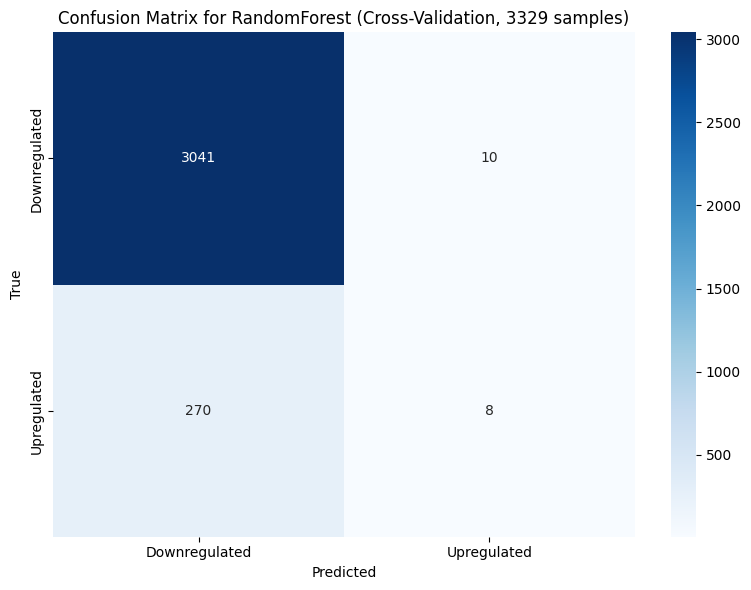

Confusion Matrix for RandomForest (Cross-Validation, Threshold=0.3):
[[2784  267]
 [ 186   92]]


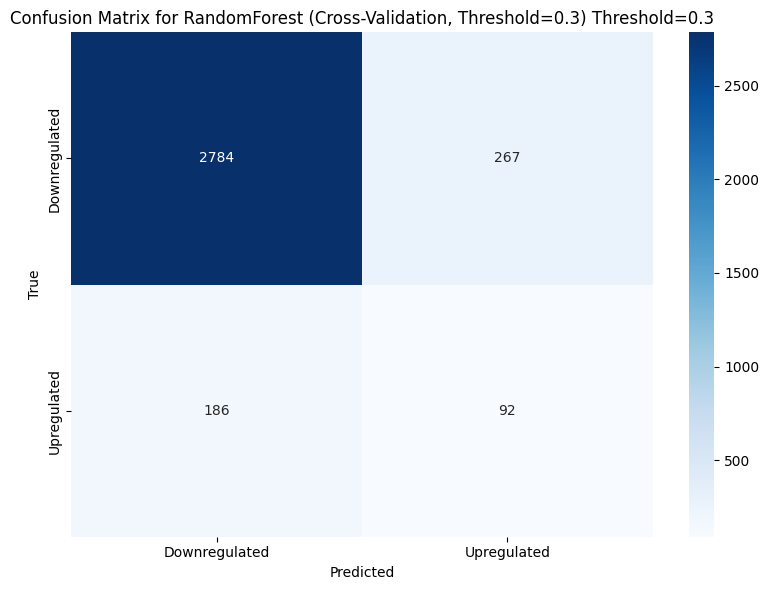

Final RandomForest AUC-ROC: 0.7555
Optimal ROC threshold (RandomForest CV): 0.2150
Confusion Matrix for RandomForest (Cross-Validation, Optimal Threshold=0.2150):
[[2097  954]
 [  83  195]]


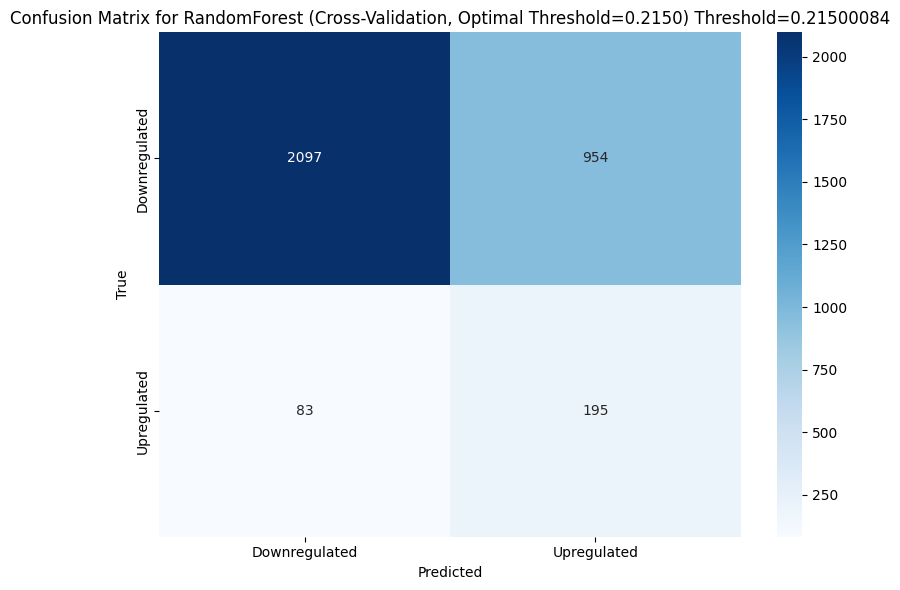

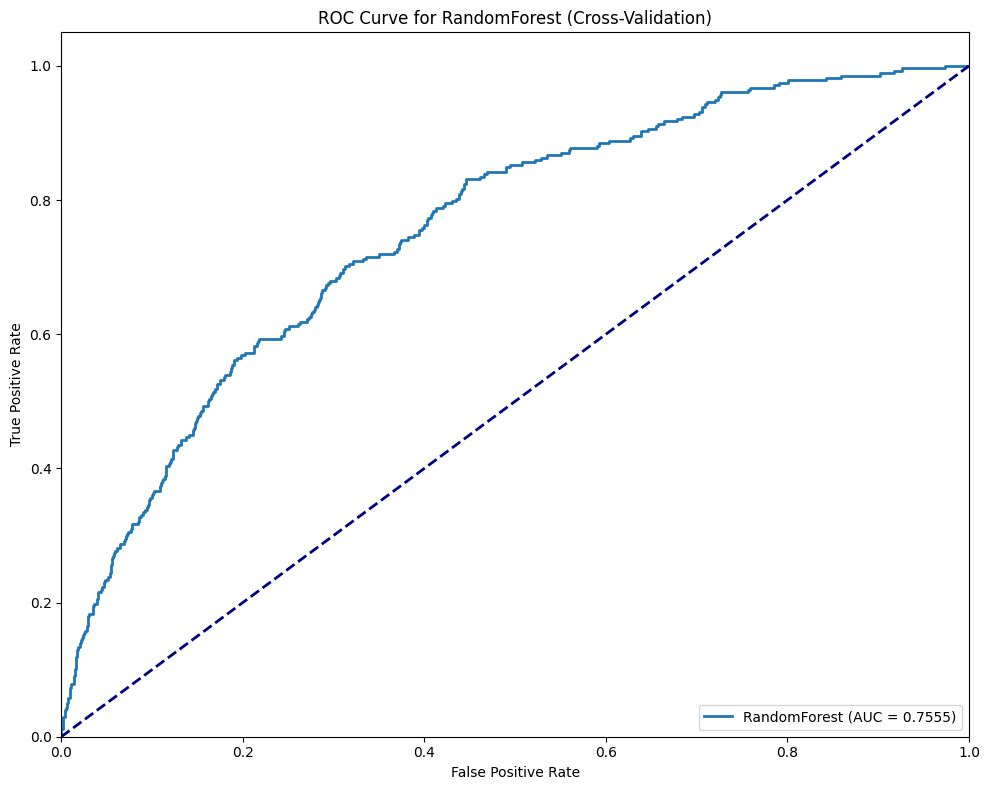

Final RandomForest Best Parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Final RandomForest test class counts: [830   3]
Final RandomForest test proba range: min=0.0294, max=0.5545

Metrics for RandomForest (Final Model, Test Set):
Sensitivity (Recall): 0.0118
Specificity: 0.9973
Accuracy: 0.8968
Balanced Accuracy: 0.5045
MCC: 0.0459
Precision: 0.3333
F1 Score: 0.0227
AUC-ROC: 0.7171
AUC-PR: 0.2376
Cohen’s Kappa: 0.0159
Log Loss: 0.3319
Confusion Matrix for RandomForest (Final Model, Test Set):
[[746   2]
 [ 84   1]]


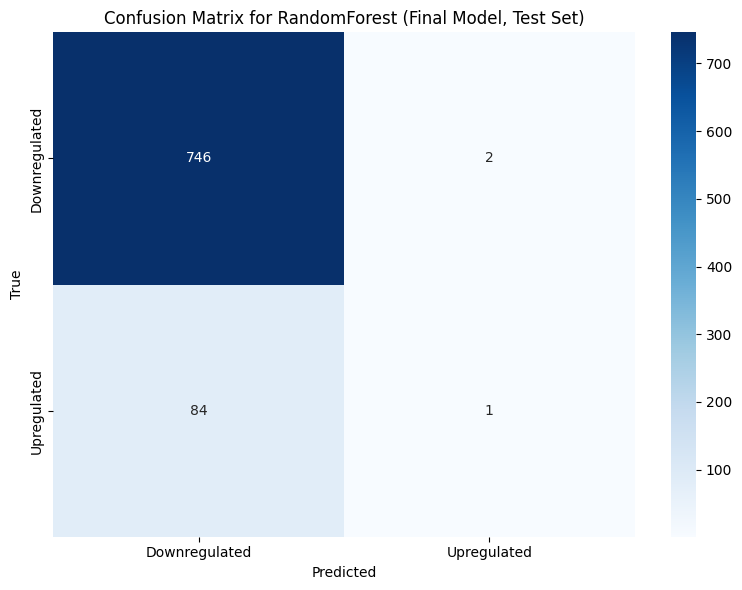

Confusion Matrix for RandomForest (Final Model, Threshold=0.3):
[[689  59]
 [ 61  24]]


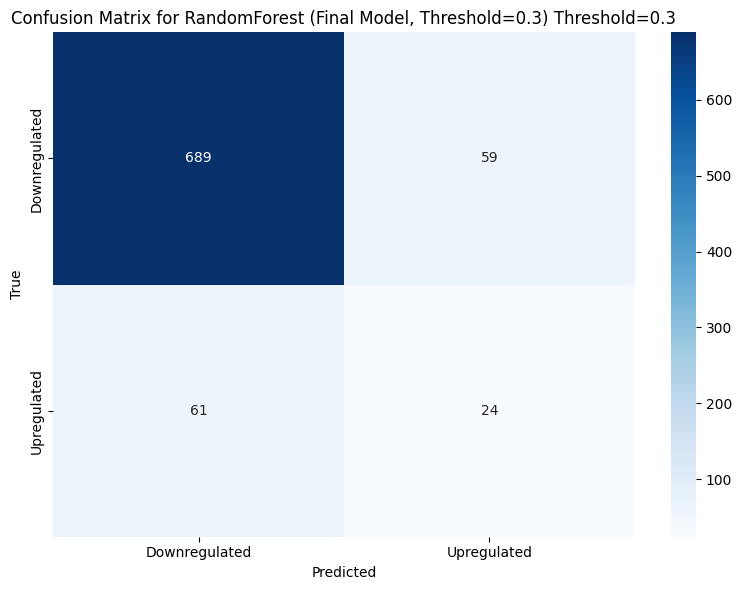

Final RandomForest AUC-ROC: 0.7171


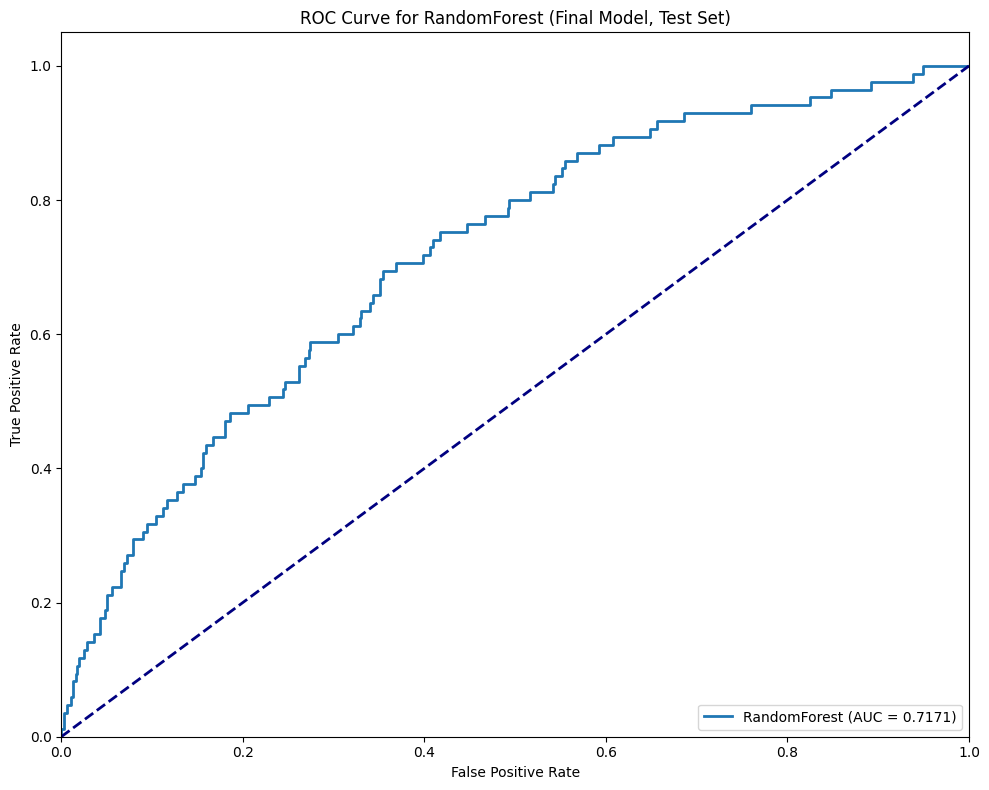

Final RandomForest Optimal ROC threshold: 0.1937
Confusion Matrix for RandomForest (Final Model, Optimal Threshold=0.1937):
[[483 265]
 [ 26  59]]


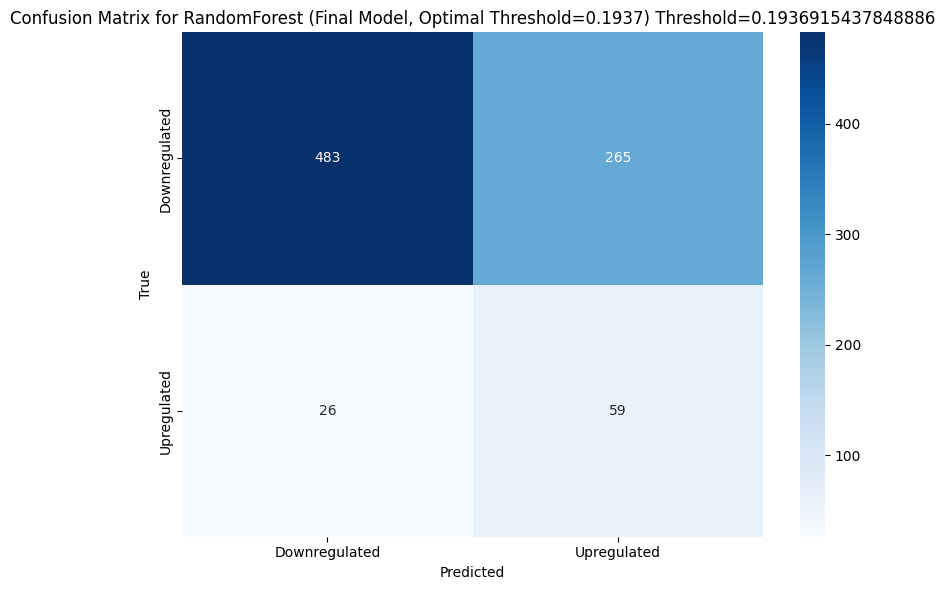

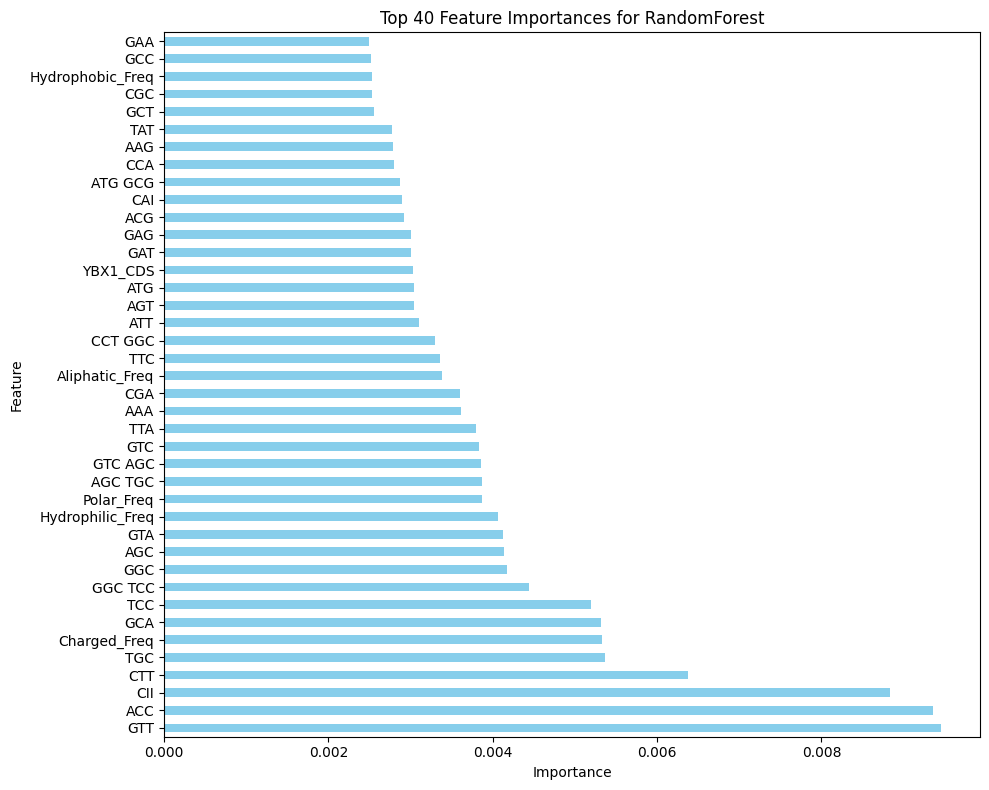

Top 40 feature importances for RandomForest:
GTT                 0.009457
ACC                 0.009356
CII                 0.008832
CTT                 0.006382
TGC                 0.005368
Charged_Freq        0.005329
GCA                 0.005316
TCC                 0.005191
GGC TCC             0.004438
GGC                 0.004170
AGC                 0.004142
GTA                 0.004129
Hydrophilic_Freq    0.004063
Polar_Freq          0.003872
AGC TGC             0.003865
GTC AGC             0.003860
GTC                 0.003828
TTA                 0.003790
AAA                 0.003617
CGA                 0.003601
Aliphatic_Freq      0.003385
TTC                 0.003353
CCT GGC             0.003302
ATT                 0.003107
AGT                 0.003047
ATG                 0.003040
YBX1_CDS            0.003025
GAT                 0.003007
GAG                 0.003004
ACG                 0.002919
CAI                 0.002898
ATG GCG             0.002875
CCA                 0.00279

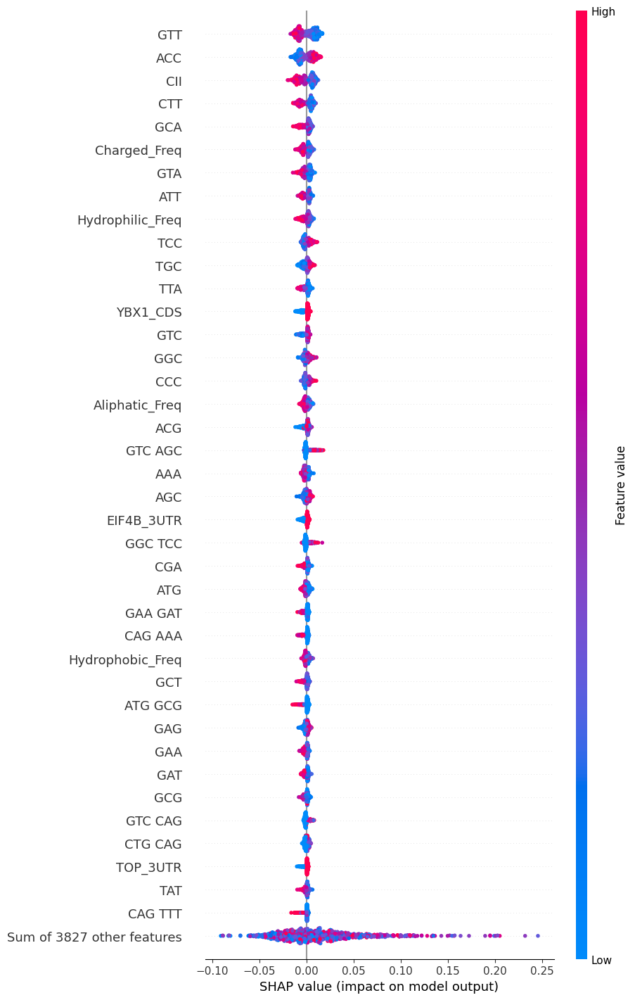

<Figure size 640x480 with 0 Axes>


=== Training XGBoost ===
Processing fold 1/5
Fold 1 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 1 class counts: [666]
Fold 1 proba range: min=0.0008, max=0.3128
Processing fold 2/5
Fold 2 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 2 class counts: [666]
Fold 2 proba range: min=0.0007, max=0.3387
Processing fold 3/5
Fold 3 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.1}
Fold 3 class counts: [666]
Fold 3 proba range: min=0.0005, max=0.3378
Processing fold 4/5
Fold 4 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 4 class counts: [666]
Fold 4 proba range: min=0.0009, max=0.3188
Processing fold 5/5
Fold 5 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 5 class counts: [665]
Fold 5 proba range: min=0.0006, max=0.2012
Final XGBoost 

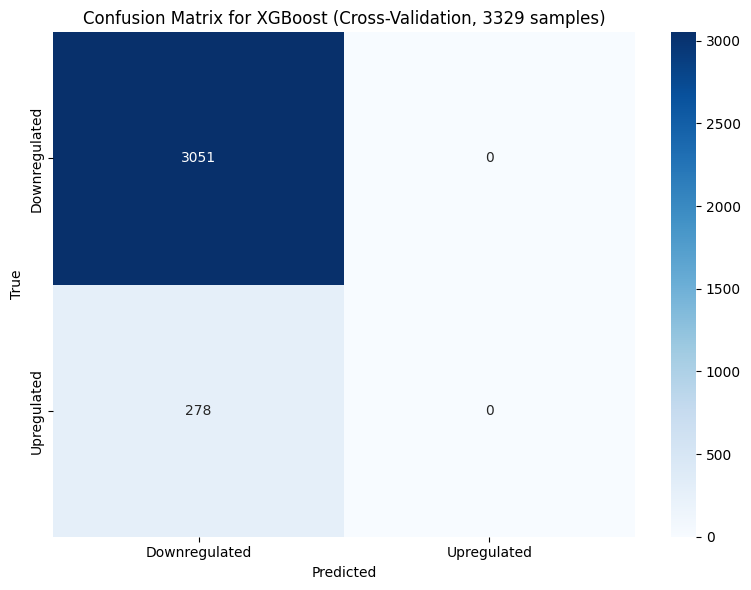

Confusion Matrix for XGBoost (Cross-Validation, Threshold=0.3):
[[3050    1]
 [ 275    3]]


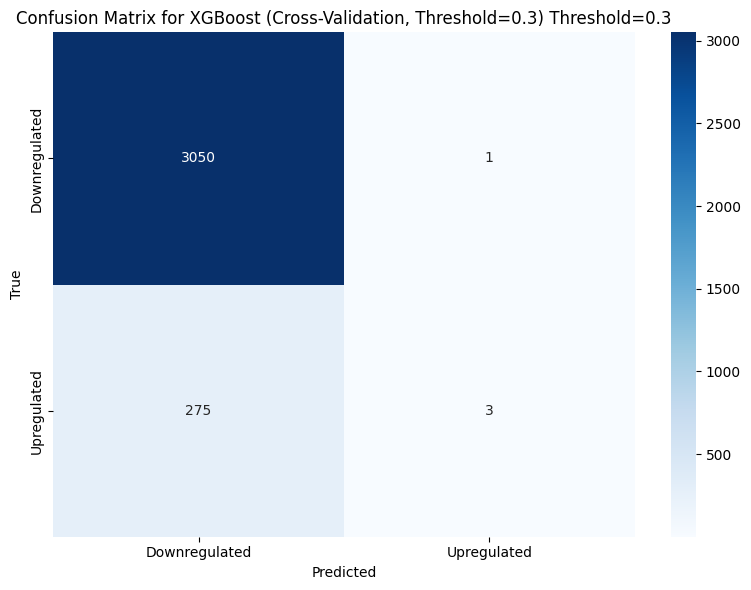

Final XGBoost AUC-ROC: 0.7581
Optimal ROC threshold (XGBoost CV): 0.0082
Confusion Matrix for XGBoost (Cross-Validation, Optimal Threshold=0.0082):
[[2119  932]
 [  78  200]]


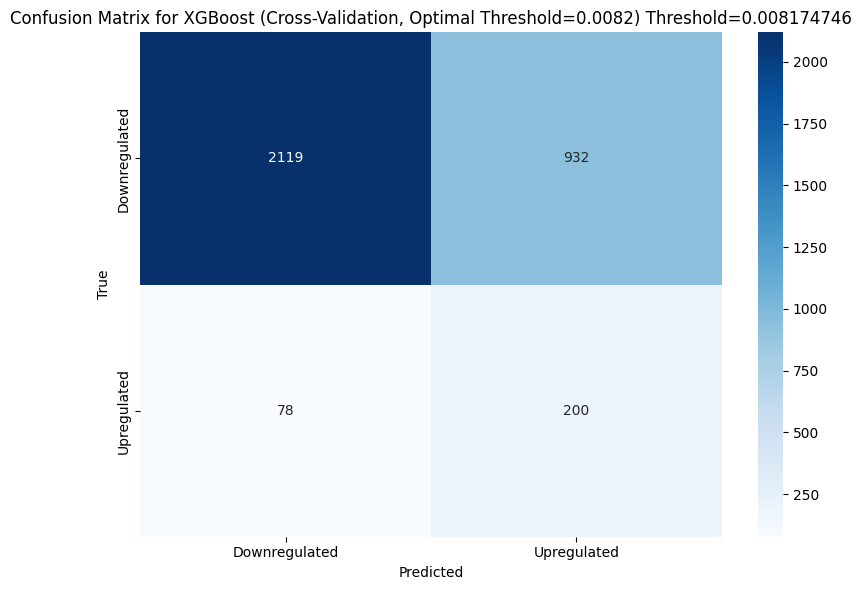

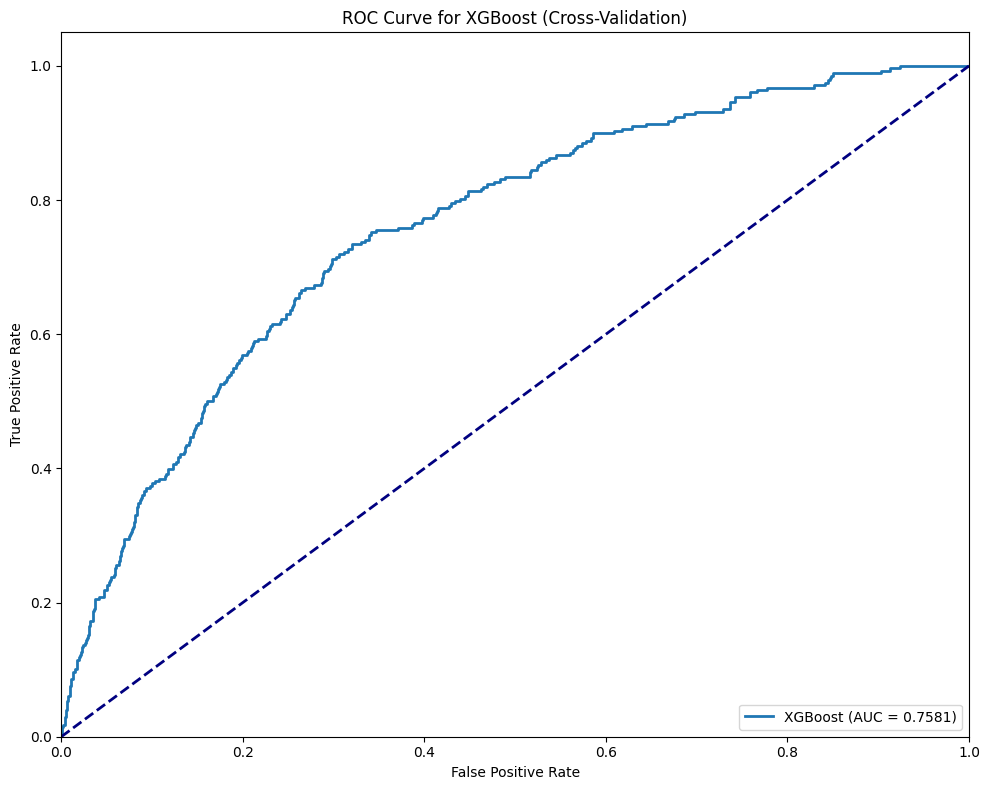

Final XGBoost Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Final XGBoost test class counts: [833]
Final XGBoost test proba range: min=0.0009, max=0.2735
Confusion Matrix for XGBoost (Final Model, Test Set):
[[748   0]
 [ 85   0]]


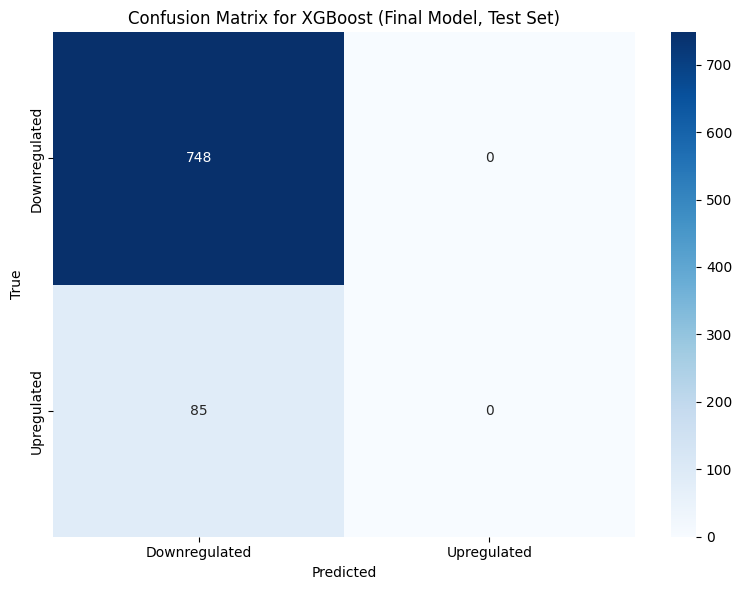

Confusion Matrix for XGBoost (Final Model, Threshold=0.3):
[[748   0]
 [ 85   0]]


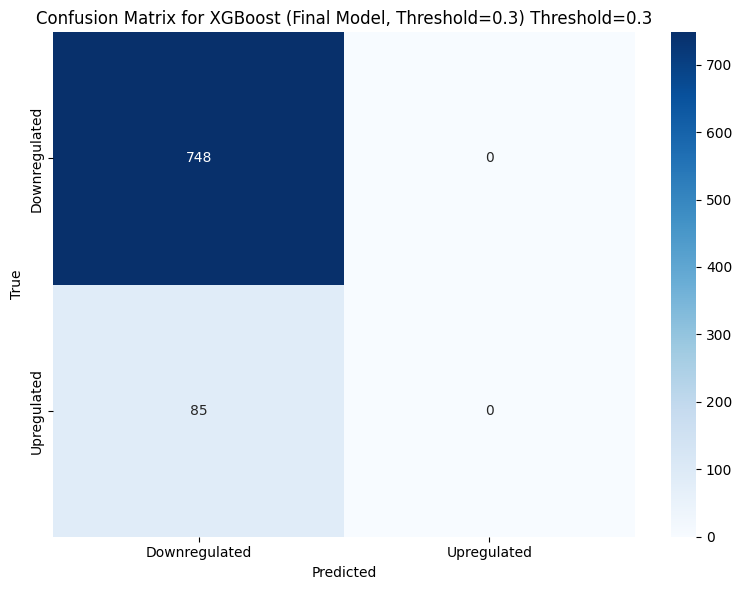

Final XGBoost AUC-ROC: 0.7382


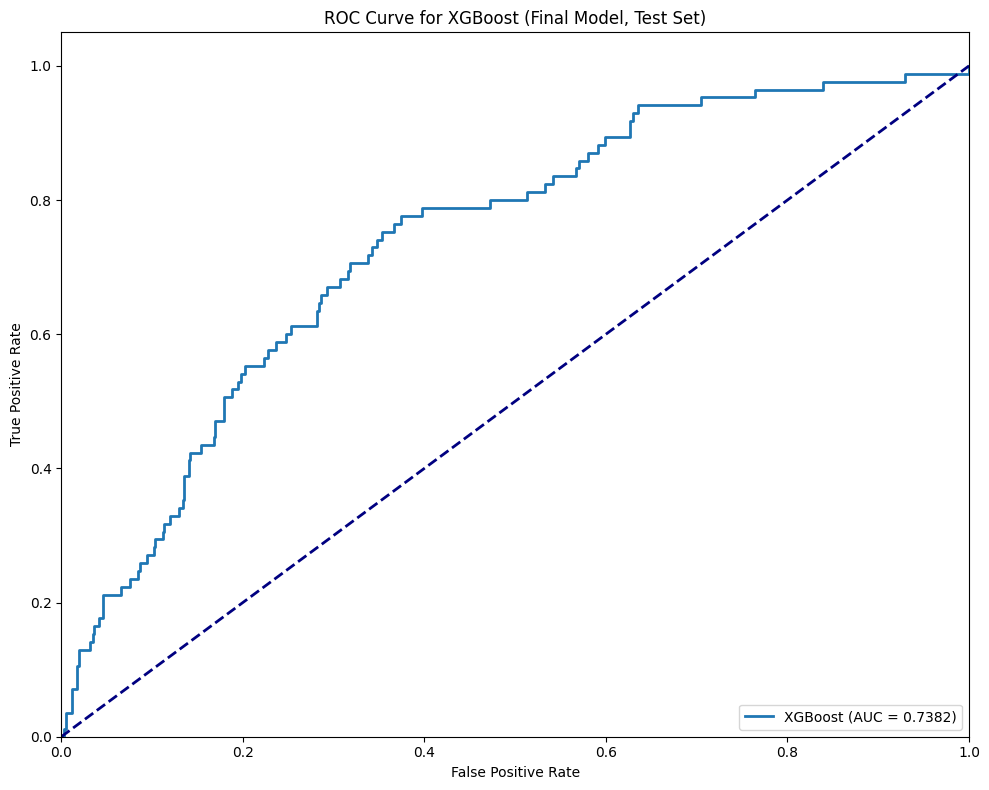

Final XGBoost Optimal ROC threshold: 0.0060
Confusion Matrix for XGBoost (Final Model, Optimal Threshold=0.0060):
[[468 280]
 [ 19  66]]


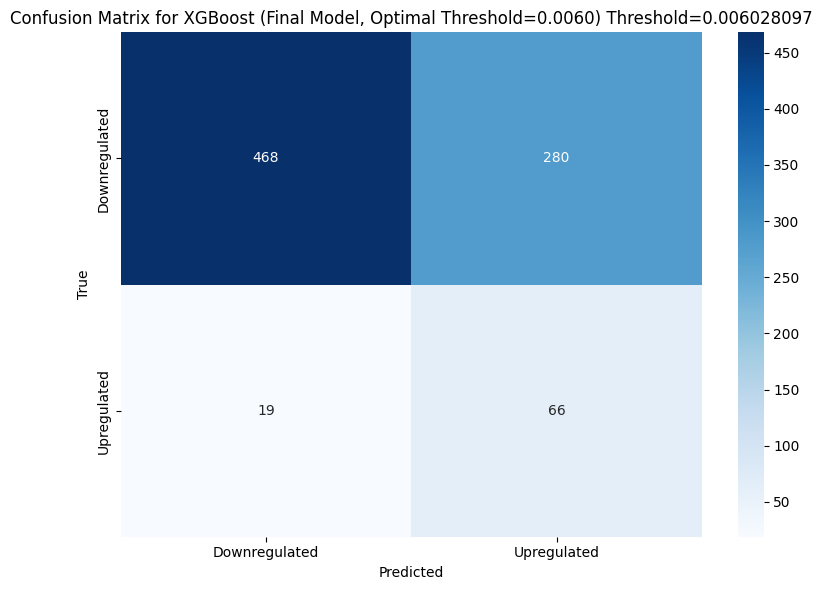

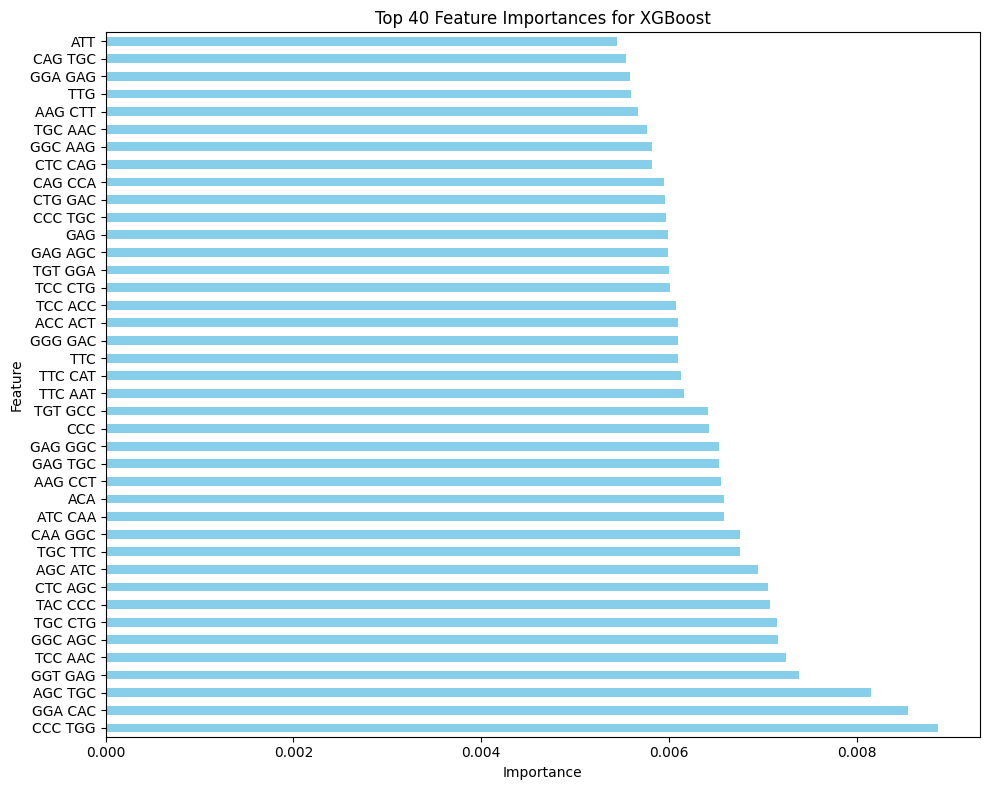

Top 40 feature importances for XGBoost:
CCC TGG    0.008870
GGA CAC    0.008548
AGC TGC    0.008153
GGT GAG    0.007385
TCC AAC    0.007243
GGC AGC    0.007159
TGC CTG    0.007150
TAC CCC    0.007076
CTC AGC    0.007060
AGC ATC    0.006950
TGC TTC    0.006760
CAA GGC    0.006753
ATC CAA    0.006589
ACA        0.006582
AAG CCT    0.006551
GAG TGC    0.006538
GAG GGC    0.006529
CCC        0.006426
TGT GCC    0.006417
TTC AAT    0.006164
TTC CAT    0.006128
TTC        0.006100
GGG GAC    0.006097
ACC ACT    0.006097
TCC ACC    0.006078
TCC CTG    0.006011
TGT GGA    0.006001
GAG AGC    0.005995
GAG        0.005986
CCC TGC    0.005971
CTG GAC    0.005959
CAG CCA    0.005945
CTC CAG    0.005818
GGC AAG    0.005815
TGC AAC    0.005764
AAG CTT    0.005672
TTG        0.005599
GGA GAG    0.005588
CAG TGC    0.005547
ATT        0.005448
SHAP: X_train shape: (2496, 3866), X_test shape: (833, 3866), feature_names_combined length: 3866


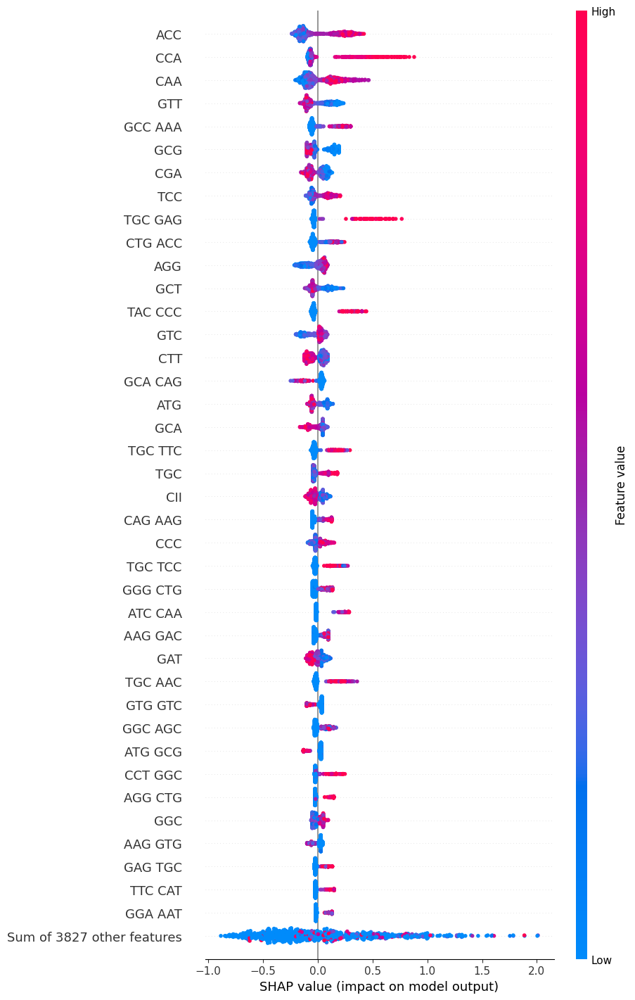

<Figure size 640x480 with 0 Axes>

In [3]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc, precision_score, recall_score, f1_score, matthews_corrcoef, cohen_kappa_score, log_loss, precision_recall_curve
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from joblib import Parallel, delayed
from itertools import chain
from xgboost import XGBClassifier
from scipy.sparse import csr_matrix

# Set up logging
logging.basicConfig(filename='rf_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Consolidated plotting function
def plot_confusion_matrix(y_true, y_pred, title, filename, model_name, threshold=None):
    cm = confusion_matrix(y_true, y_pred)
    print(f"{title}:\n{cm}")
    logging.info(f"{title}:\n{cm}")
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"{title}{' Threshold=' + str(threshold) if threshold else ''}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(f'{filename}.png', bbox_inches='tight')
    plt.show()
    plt.close()
    return cm

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}
AROMATIC_AAS = {'F', 'Y', 'W'}
POLAR_AAS = {'N', 'Q', 'S', 'T'}
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def compute_features(seq, weights):
    try:
        seq = seq.upper()
        if not seq:
            raise ValueError("Sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
        
        codons = [seq[i:i+3] for i in range(0, len(seq), 3)]
        total_codons = len([c for c in codons if c not in STOP_CODONS])
        
        # CAI
        sequence_weights = [weights[codon] for codon in codons if codon not in STOP_CODONS and codon not in NON_SYNONYMOUS_CODONS]
        cai = geometric_mean(sequence_weights) if sequence_weights else 0.0
        
        # CII
        destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
        cii = destabilizing_count / total_codons if total_codons > 0 else 0.0
        
        # Codon group frequencies
        aliphatic = sum(1 for codon in codons if codon in ALIPHATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        aromatic = sum(1 for codon in codons if codon in AROMATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        polar = sum(1 for codon in codons if codon in POLAR_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        charged = sum(1 for codon in codons if codon in CHARGED_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophobic = sum(1 for codon in codons if codon in HYDROPHOBIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophilic = sum(1 for codon in codons if codon in HYDROPHILIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        
        return cai, cii, aliphatic, aromatic, polar, charged, hydrophobic, hydrophilic
    except Exception as e:
        logging.error(f"Error computing features for sequence {seq[:30]}...: {e}")
        return 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

def load_fasta_sequences(up_file, down_file):
    sequences, labels, gene_ids = [], [], []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(label)
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                logging.error(f"Error reading {file_path}: {e}")
                return None, None, None
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            for record in SeqIO.parse(ref_file, 'fasta'):
                seq = str(record.seq).upper()
                if len(seq) >= 3:
                    seq = seq[:-3]
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                    logging.warning(f"Skipping reference {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                    continue
                ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            logging.error(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def load_motif_data(motif_file):
    try:
        motif_df = pd.read_csv(motif_file, sep='\t')
        print(f"Loaded motif data with {len(motif_df)} transcripts")
        print(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        logging.info(f"Loaded motif data with {len(motif_df)} transcripts")
        logging.info(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        print(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        logging.info(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        return motif_df
    except Exception as e:
        print(f"Error reading motif data: {e}")
        logging.error(f"Error reading motif data: {e}")
        return None

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

def compute_class_weights(labels):
    n_samples = len(labels)
    n_classes = len(np.unique(labels))
    class_counts = np.bincount(labels.astype(int))
    weights = n_samples / (n_classes * class_counts)
    return {0: weights[0], 1: weights[1]}

# Input file paths
up_file = "Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta"
down_file = "Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta"
ref_file = "tgfb_top100_highly_expressed_cds.fasta"
motif_file = "transcript_motif_status_all.txt"
#tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
#tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
#treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
#treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    logging.error("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")
logging.info(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights.keys())[:5]})
    logging.info("Computed CAI weights successfully")
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    logging.error(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    logging.error("Failed to load FASTA files. Exiting.")
    exit(1)
print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")
if len(sequences) != 1934:
    print(f"Warning: Expected 1934 sequences, got {len(sequences)}")
    logging.warning(f"Expected 1934 sequences, got {len(sequences)}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Load motif data
motif_df = load_motif_data(motif_file)
if motif_df is None:
    print("Failed to load motif data. Exiting.")
    logging.error("Failed to load motif data. Exiting.")
    exit(1)

# Save motif transcript_ids
with open('motif_transcript_ids.txt', 'w') as f:
    f.write('\n'.join(motif_df['transcript_id'].astype(str)))

# Merge motif data with gene IDs
try:
    motif_df = motif_df.set_index('transcript_id')
    print(f"Motif_df shape before processing: {motif_df.shape}")
    logging.info(f"Motif_df shape before processing: {motif_df.shape}")
    # Drop non-numeric columns and convert to numeric
    motif_features = motif_df.drop(columns=['gene_name'], errors='ignore')
    non_numeric_cols = motif_features.select_dtypes(exclude=['float64', 'int64']).columns
    if non_numeric_cols.any():
        print(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        logging.warning(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        for col in non_numeric_cols:
            try:
                motif_features[col] = pd.to_numeric(motif_features[col], errors='coerce').fillna(0)
            except Exception as e:
                print(f"Error converting column {col} to numeric: {e}")
                logging.error(f"Error converting column {col} to numeric: {e}")
                motif_features = motif_features.drop(columns=[col])
    # Remove duplicates and align with gene_ids
    motif_features = motif_features.loc[~motif_features.index.duplicated(keep='first')]
    common_ids = set(motif_features.index).intersection(set(gene_ids))
    print(f"Number of common transcript IDs: {len(common_ids)}")
    logging.info(f"Number of common transcript IDs: {len(common_ids)}")
    if len(common_ids) < len(gene_ids):
        print(f"Warning: Only {len(common_ids)}/{len(gene_ids)} IDs match")
        logging.warning(f"Only {len(common_ids)}/{len(gene_ids)} IDs match")
        gene_ids_clean = [gid.strip() for gid in gene_ids]
        motif_ids_clean = [str(idx).strip() for idx in motif_features.index]
        common_ids = set(motif_ids_clean).intersection(set(gene_ids_clean))
        print(f"Number of common IDs after cleaning: {len(common_ids)}")
        logging.info(f"Number of common IDs after cleaning: {len(common_ids)}")
        if len(common_ids) == 0:
            raise ValueError("No common transcript IDs after cleaning")
    motif_features = motif_features.loc[list(common_ids)].reindex(gene_ids).fillna(0).astype(np.float32)
    # Save motif_features for inspection
    motif_features.to_csv('motif_features_pre_norm.txt', sep='\t', index_label='transcript_id')
    # Normalize motif features by prevalence
    motif_features = motif_features.div(motif_features.mean() + 1e-6)  # Avoid division by zero
    print(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    logging.info(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    # Check for TGFb motifs
    tgfb_motifs = [col for col in motif_features.columns if any(t in col.lower() for t in ['tgfb1', 'tgfb2', 'tgfb3'])]
    if tgfb_motifs:
        print(f"Warning: TGFb1/2/3 motifs detected: {tgfb_motifs}")
        logging.warning(f"TGFb1/2/3 motifs detected: {tgfb_motifs}")
        motif_features = motif_features.drop(columns=tgfb_motifs)
        print(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
        logging.info(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
    else:
        print("No TGFb1/2/3 motifs detected in motif features")
        logging.info("No TGFb1/2/3 motifs detected in motif features")
    # Compute and display motif feature counts
    feature_counts = pd.DataFrame({
        'Count_NonZero': (motif_features > 0).sum(),
        'Count_Zero': (motif_features == 0).sum(),
        'Prevalence_%': (motif_features > 0).mean() * 100
    })
    print("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    print(feature_counts.to_string())
    logging.info("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    logging.info(feature_counts.to_string())
except Exception as e:
    print(f"Error aligning motif data: {e}")
    logging.error(f"Error aligning motif data: {e}")
    exit(1)

# Debug motif features before processing
print("Motif features non-zero counts:", (motif_features != 0).sum().sum())
logging.info(f"Motif features non-zero counts: {(motif_features != 0).sum().sum()}")

# Compute sequence-derived features
try:
    features = Parallel(n_jobs=-1)(delayed(compute_features)(seq, ref_weights) for seq in sequences)
    cai_values, cii_values, aliphatic_freq, aromatic_freq, polar_freq, charged_freq, hydrophobic_freq, hydrophilic_freq = zip(*features)
    cai_values = np.array(cai_values, dtype=np.float32)
    cii_values = np.array(cii_values, dtype=np.float32)
    aliphatic_freq = np.array(aliphatic_freq, dtype=np.float32)
    aromatic_freq = np.array(aromatic_freq, dtype=np.float32)
    polar_freq = np.array(polar_freq, dtype=np.float32)
    charged_freq = np.array(charged_freq, dtype=np.float32)
    hydrophobic_freq = np.array(hydrophobic_freq, dtype=np.float32)
    hydrophilic_freq = np.array(hydrophilic_freq, dtype=np.float32)
except Exception as e:
    print(f"Error computing sequence features: {e}")
    logging.error(f"Error computing sequence features: {e}")
    exit(1)

# Scale sequence-derived features
scaler = StandardScaler()
sequence_features = np.hstack([
    cai_values[:, np.newaxis],
    cii_values[:, np.newaxis],
    aliphatic_freq[:, np.newaxis],
    aromatic_freq[:, np.newaxis],
    polar_freq[:, np.newaxis],
    charged_freq[:, np.newaxis],
    hydrophobic_freq[:, np.newaxis],
    hydrophilic_freq[:, np.newaxis]
])
sequence_features = scaler.fit_transform(sequence_features)
sequence_features = np.nan_to_num(sequence_features, nan=0.0, posinf=0.0, neginf=0.0)
sequence_feature_names = ['CAI', 'CII', 'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq', 'Hydrophobic_Freq', 'Hydrophilic_Freq']

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]
# Codon frequencies
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out()]
# Normalize codon counts (sparse matrix division)
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / sequence_lengths[:, np.newaxis])  # Keep sparse
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
# Convert to dense array for scaling
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Dicodon frequencies
dicodon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False, ngram_range=(2,2))
X_dicodon = dicodon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
dicodon_feature_names = [f"{d.replace('t', 'u').upper()}" for d in dicodon_vectorizer.get_feature_names_out()]
# Normalize dicodon counts
dicodon_lengths = np.array([max(1, (len(seq) // 3) - 1) for seq in sequences], dtype=np.float32)  # At least 1 to avoid division by zero
X_dicodon_normalized = X_dicodon.multiply(1 / dicodon_lengths[:, np.newaxis])  # Keep sparse
print(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}")
logging.info(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}")
# Convert to dense array for scaling
X_dicodon_scaled = scaler.fit_transform(X_dicodon_normalized.toarray())
X_dicodon_scaled = np.nan_to_num(X_dicodon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
# Save dicodon feature names for inspection
with open('dicodon_feature_names.txt', 'w') as f:
    f.write('\n'.join(dicodon_feature_names))

# Combine features (codon, dicodon, sequence, motif)
try:
    print(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    logging.info(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    X_combined = np.hstack([
        X_codon_scaled,
        X_dicodon_scaled,
        sequence_features,
        motif_features.values
    ], dtype=np.float32)
except Exception as e:
    print(f"Error combining features: {e}")
    logging.error(f"Error combining features: {e}")
    exit(1)

feature_names_combined = codon_feature_names + dicodon_feature_names + sequence_feature_names + list(motif_features.columns)
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined, index=gene_ids)

# Debug combined features
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
print("Motif features non-zero counts in X_combined:", (X_combined[:, -len(motif_features.columns):] != 0).sum())
print("Dicodon features non-zero counts in X_combined:", (X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum())
logging.info(f"NaNs in X_combined: {np.any(np.isnan(X_combined))}")
logging.info(f"Infs in X_combined: {np.any(np.isinf(X_combined))}")
logging.info(f"Motif features non-zero counts in X_combined: {(X_combined[:, -len(motif_features.columns):] != 0).sum()}")
logging.info(f"Dicodon features non-zero counts in X_combined: {(X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum()}")

# Feature selection (ensure motif features are included)
k_sequence = 50  # Increased to accommodate dicodon features
selector = SelectKBest(score_func=f_classif, k=k_sequence)
X_sequence_selected = selector.fit_transform(X_combined[:, :-len(motif_features.columns)], labels)
selected_indices = selector.get_support(indices=True)
selected_sequence_features = [feature_names_combined[i] for i in selected_indices]
selected_features = selected_sequence_features + list(motif_features.columns)
X_selected = np.hstack([
    X_sequence_selected,
    motif_features.values
], dtype=np.float32)
print(f"Selected {len(selected_features)} features: {selected_features}")
logging.info(f"Selected {len(selected_features)} features: {selected_features}")

# Debug selected features
print("Motif features non-zero counts in X_selected:", (X_selected[:, -len(motif_features.columns):] != 0).sum())
print("Dicodon features in selected features:", [f for f in selected_sequence_features if f in dicodon_feature_names])
logging.info(f"Motif features non-zero counts in X_selected: {(X_selected[:, -len(motif_features.columns):] != 0).sum()}")
logging.info(f"Dicodon features in selected features: {[f for f in selected_sequence_features if f in dicodon_feature_names]}")

# Save feature matrix
try:
    X_combined_df.to_csv('feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrix to feature_matrix.txt")
    logging.info("Saved feature matrix to feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrix: {e}")
    logging.error(f"Error saving feature matrix: {e}")

# Validate data
labels = np.array(labels, dtype=np.float32)
if X_combined_df.shape[0] != len(labels):
    raise ValueError(f"Mismatch: X_combined_df rows ({X_combined_df.shape[0]}) != labels ({len(labels)})")

# Compute class weights
class_weights = compute_class_weights(labels)
print(f"Class weights: {class_weights}")
logging.info(f"Class weights: {class_weights}")

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_combined_df, labels, test_size=0.25, random_state=42)
X_train = np.nan_to_num(X_train.values, nan=0.0, posinf=0.0, neginf=0.0)
X_test = np.nan_to_num(X_test.values, nan=0.0, posinf=0.0, neginf=0.0)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Debug data shapes
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
print(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")
logging.info(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
logging.info(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")

# Define model configurations
model_config = {
    'RandomForest': {
        'clf': RandomForestClassifier(random_state=42, class_weight='balanced', n_jobs=-1),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [10, 20],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2],
            'max_features': ['sqrt']
        }
    },
    'XGBoost': {
        'clf': XGBClassifier(random_state=42, n_jobs=-1, scale_pos_weight=class_weights[0]/class_weights[1]),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [3, 6],
            'learning_rate': [0.1],
            'subsample': [0.8]
        }
    }
}

# Train and evaluate models
for model_name in ['RandomForest', 'XGBoost']:
    config = model_config[model_name]
    print(f"\n=== Training {model_name} ===")
    logging.info(f"Training {model_name}")

    y_true_all = np.zeros(len(labels), dtype=np.float32)
    y_pred_all = np.zeros(len(labels), dtype=np.float32)
    y_proba_all = np.zeros(len(labels), dtype=np.float32)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_combined_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_combined_df.iloc[train_idx].values.astype(np.float32)
        y_train_fold = labels[train_idx].astype(np.float32)
        X_test_fold = X_combined_df.iloc[test_idx].values.astype(np.float32)
        y_test_fold = labels[test_idx].astype(np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        grid_search = RandomizedSearchCV(
            estimator=config['clf'],
            param_distributions=config['param_grid'],
            n_iter=10,
            cv=3,
            scoring='balanced_accuracy',
            n_jobs=-1,
            random_state=42,
            error_score='raise'
        )
        try:
            grid_search.fit(X_train_fold, y_train_fold)
            print(f"Fold {fold} Best Parameters: {grid_search.best_params_}")
            logging.info(f"Fold {fold} parameters: {grid_search.best_params_}")
            model = grid_search.best_estimator_
        except Exception as e:
            print(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            logging.error(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            continue
        
        try:
            model.fit(X_train_fold, y_train_fold)
            y_pred_fold = model.predict(X_test_fold)
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
            print(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            print(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
            logging.info(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            logging.info(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
        except Exception as e:
            print(f"Prediction failed for fold {fold}: {e}")
            logging.error(f"Prediction failed for fold {fold}: {e}")
            continue
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold

    # Debug predictions
    print(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    print(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")
    logging.info(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    logging.info(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")

    # Confusion matrix for cross-validation
    plot_confusion_matrix(y_true_all, y_pred_all, 
                          f"Confusion Matrix for {model_name} (Cross-Validation, {len(labels)} samples)",
                          f'confusion_matrix_{model_name.lower()}_cv', model_name)

    # Adjusted threshold confusion matrix (CV)
    y_pred_adjusted_cv = (y_proba_all >= 0.3).astype(np.float32)
    plot_confusion_matrix(y_true_all, y_pred_adjusted_cv,
                          f"Confusion Matrix for {model_name} (Cross-Validation, Threshold=0.3)",
                          f'confusion_matrix_{model_name.lower()}_cv_threshold_0.3', model_name, threshold=0.3)

    # ROC curve for cross-validation
    try:
        fpr, tpr, thresholds = roc_curve(y_true_all, y_proba_all)
        roc_auc = auc(fpr, tpr)
        print(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        logging.info(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]
        print(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        logging.info(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        y_pred_optimal = (y_proba_all >= optimal_threshold).astype(np.float32)
        plot_confusion_matrix(y_true_all, y_pred_optimal,
                              f"Confusion Matrix for {model_name} (Cross-Validation, Optimal Threshold={optimal_threshold:.4f})",
                              f'confusion_matrix_{model_name.lower()}_cv_optimal', model_name, threshold=optimal_threshold)
        
        plt.figure(figsize=(10, 8))
        plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.4f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name} (Cross-Validation)')
        plt.legend(loc="lower right")
        plt.tight_layout()
        plt.savefig(f'roc_curve_{model_name.lower()}_cv.png', bbox_inches='tight')
        plt.show()
        plt.close()
    except Exception as e:
        print(f"ROC failed for {model_name} CV: {e}")
        logging.error(f"ROC failed for {model_name} CV: {e}")

    # Final model training
    grid_search = RandomizedSearchCV(
        estimator=config['clf'],
        param_distributions=config['param_grid'],
        n_iter=10,
        cv=3,
        scoring='balanced_accuracy',
        n_jobs=-1,
        random_state=42,
        error_score='raise'
    )
    try:
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print(f"Final {model_name} Best Parameters: {grid_search.best_params_}")
        logging.info(f"Final {model_name}: {grid_search.best_params_}")
    except Exception as e:
        print(f"Final {model_name} training failed: {e}")
        logging.error(f"Final {model_name} training failed: {e}")
        final_model = None

    if final_model:
        try:
            final_model.fit(X_train, y_train)
            y_pred_final = final_model.predict(X_test)
            y_proba_final = final_model.predict_proba(X_test)[:, 1]
            print(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            print(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")
            logging.info(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            logging.info(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")

            # Compute and print additional metrics for final model
            unique_classes = np.unique(y_pred_final)
            if len(unique_classes) < 2:
                print(f"Warning: {model_name} final model predicted only one class. Skipping metrics.")
                logging.warning(f"{model_name} final model predicted only one class. Skipping metrics.")
            else:
                tn, fp, fn, tp = confusion_matrix(y_test, y_pred_final).ravel()
                sensitivity = recall_score(y_test, y_pred_final, pos_label=1)
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
                accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0
                mcc = matthews_corrcoef(y_test, y_pred_final)
                precision = precision_score(y_test, y_pred_final, pos_label=1)
                recall = sensitivity
                f1 = f1_score(y_test, y_pred_final, pos_label=1)
                auc_roc = roc_auc_score(y_test, y_proba_final)
                precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_proba_final)
                auc_pr = auc(recall_vals, precision_vals)
                balanced_accuracy = (sensitivity + specificity) / 2
                kappa = cohen_kappa_score(y_test, y_pred_final)
                logloss = log_loss(y_test, y_proba_final)
                
                metrics_str = (f"\nMetrics for {model_name} (Final Model, Test Set):\n"
                              f"Sensitivity (Recall): {sensitivity:.4f}\n"
                              f"Specificity: {specificity:.4f}\n"
                              f"Accuracy: {accuracy:.4f}\n"
                              f"Balanced Accuracy: {balanced_accuracy:.4f}\n"
                              f"MCC: {mcc:.4f}\n"
                              f"Precision: {precision:.4f}\n"
                              f"F1 Score: {f1:.4f}\n"
                              f"AUC-ROC: {auc_roc:.4f}\n"
                              f"AUC-PR: {auc_pr:.4f}\n"
                              f"Cohen’s Kappa: {kappa:.4f}\n"
                              f"Log Loss: {logloss:.4f}")
                print(metrics_str)
                logging.info(metrics_str)

            # Confusion matrix for final model
            plot_confusion_matrix(y_test, y_pred_final, 
                                  f"Confusion Matrix for {model_name} (Final Model, Test Set)",
                                  f'confusion_matrix_{model_name.lower()}_final', model_name)

            # Adjusted threshold confusion matrix (final)
            y_pred_adjusted_final = (y_proba_final >= 0.3).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_adjusted_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Threshold=0.3)",
                                  f'confusion_matrix_{model_name.lower()}_final_threshold_0.3', model_name, threshold=0.3)

            # ROC curve for final model
            fpr_final, tpr_final, thresholds_final = roc_curve(y_test, y_proba_final)
            roc_auc_final = auc(fpr_final, tpr_final)
            print(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            logging.info(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            
            plt.figure(figsize=(10, 8))
            plt.plot(fpr_final, tpr_final, lw=2, label=f'{model_name} (AUC = {roc_auc_final:.4f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve for {model_name} (Final Model, Test Set)')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'roc_curve_{model_name.lower()}_final.png', bbox_inches='tight')
            plt.show()
            plt.close()

            # Optimal threshold confusion matrix (final)
            optimal_idx_final = np.argmax(tpr_final - fpr_final)
            optimal_threshold_final = thresholds_final[optimal_idx_final]
            print(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            logging.info(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            y_pred_optimal_final = (y_proba_final >= optimal_threshold_final).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_optimal_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Optimal Threshold={optimal_threshold_final:.4f})",
                                  f'confusion_matrix_{model_name.lower()}_final_optimal', model_name, threshold=optimal_threshold_final)

            # Feature importance plot
            try:
                feature_importance = pd.Series(final_model.feature_importances_, index=feature_names_combined)
                top_features = feature_importance.nlargest(40)
                plt.figure(figsize=(10, 8))
                top_features.plot(kind='barh', color='skyblue')
                plt.title(f'Top 40 Feature Importances for {model_name}')
                plt.xlabel('Importance')
                plt.ylabel('Feature')
                plt.tight_layout()
                plt.savefig(f'feature_importance_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
                print(f"Top 40 feature importances for {model_name}:")
                print(top_features.to_string())
                logging.info(f"Top 40 feature importances for {model_name}:")
                logging.info(top_features.to_string())
            except Exception as e:
                print(f"Feature importance plot failed for {model_name}: {e}")
                logging.error(f"Feature importance plot failed for {model_name}: {e}")

            # SHAP analysis
            try:
                print(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, feature_names_combined length: {len(feature_names_combined)}")
                logging.info(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, feature_names_combined length: {len(feature_names_combined)}")
                explainer = shap.TreeExplainer(final_model, X_train, check_additivity=False)
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
                base_value = explainer.expected_value[1] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value
                shap_explanation = shap.Explanation(
                    values=shap_values_class1,
                    base_values=np.full(X_test.shape[0], float(base_value)),
                    data=X_test,
                    feature_names=feature_names_combined
                )
                plt.figure(figsize=(10, 5))
                shap.plots.beeswarm(shap_explanation, max_display=40)
                plt.tight_layout()
                plt.savefig(f'shap_beeswarm_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
            except Exception as e:
                print(f"TreeExplainer failed for {model_name}: {e}")
                logging.error(f"TreeExplainer failed for {model_name}: {e}")
                # Fallback to KernelExplainer
                try:
                    print(f"Attempting KernelExplainer for {model_name}...")
                    logging.info(f"Attempting KernelExplainer for {model_name}...")
                    X_test_subset = X_test[:50]  # Reduced for speed
                    def predict_proba(X):
                        return final_model.predict_proba(X)[:, 1]
                    explainer = shap.KernelExplainer(predict_proba, X_train[:50], link="logit")
                    shap_values = explainer.shap_values(X_test_subset, nsamples=50)
                    shap_explanation = shap.Explanation(
                        values=shap_values,
                        base_values=explainer.expected_value,
                        data=X_test_subset,
                        feature_names=feature_names_combined
                    )
                    plt.figure(figsize=(10, 5))
                    shap.plots.beeswarm(shap_explanation, max_display=50)
                    plt.tight_layout()
                    plt.savefig(f'shap_beeswarm_{model_name.lower()}_kernel.png', bbox_inches='tight')
                    plt.show()
                    plt.close()
                except Exception as sub_e:
                    print(f"KernelExplainer failed for {model_name}: {sub_e}")
                    logging.error(f"KernelExplainer failed for {model_name}: {sub_e}")
        except Exception as e:
            print(f"Final {model_name} training or prediction failed: {e}")
            logging.error(f"Final {model_name} training or prediction failed: {e}")

### Mono+Dicodon+Motif for RandomForest and GradientBoost

Loaded 100 reference sequences from tgfb_top100_highly_expressed_cds.fasta
Reference weights (sample): {'TTT': 0.4787175234936429, 'TTC': 0.6904367053620785, 'TTA': 0.14870093974571585, 'TTG': 0.38142620232172475, 'CTT': 0.37202874516307355}
Loaded 3329 sequences: 278 upregulated, 3051 downregulated
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
Loaded motif data with 20974 transcripts
Sample of motif_df (first 5 rows):
        transcript_id gene_name  ACO1_CDS  ACO1_5UTR  ACO1_3UTR  EIF4B_CDS  EIF4B_5UTR  EIF4B_3UTR  FXR2_CDS  FXR2_5UTR  FXR2_3UTR  TOP_CDS  TOP_5UTR  TOP_3UTR  YBX1_CDS  YBX1_5UTR  YBX1_3UTR  ZC3H10_CDS  ZC3H10_5UTR  ZC3H10_3UTR
0  ENSMUST00000180369     Rpp14         1          0          0          1           0           0         0          0          0        1         0         0         0          0          0           0            0            0
1  ENSMUST00000032315  Ta

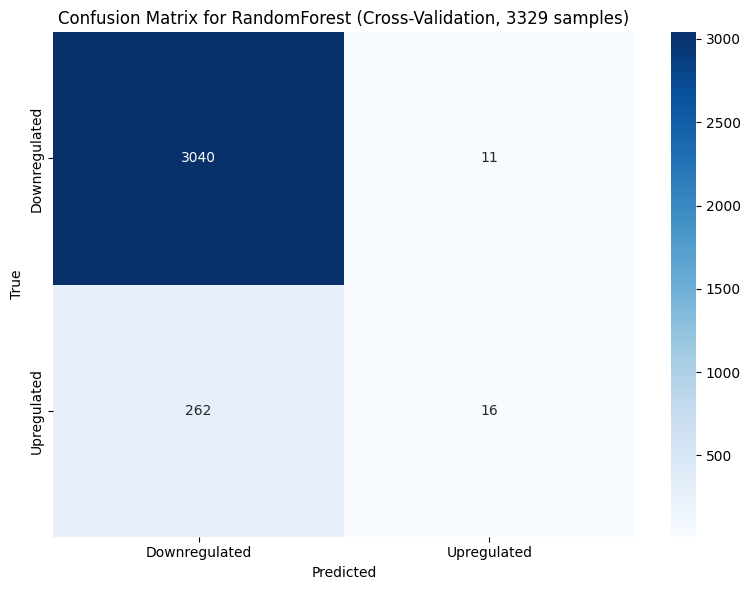

Confusion Matrix for RandomForest (Cross-Validation, Threshold=0.3):
[[2738  313]
 [ 179   99]]


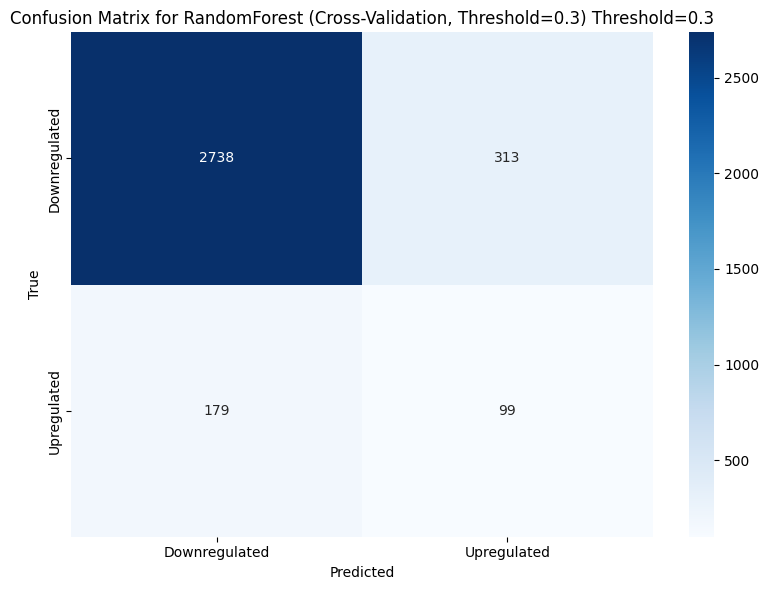

Final RandomForest AUC-ROC: 0.7490
Optimal ROC threshold (RandomForest CV): 0.2136
Confusion Matrix for RandomForest (Cross-Validation, Optimal Threshold=0.2136):
[[1998 1053]
 [  77  201]]


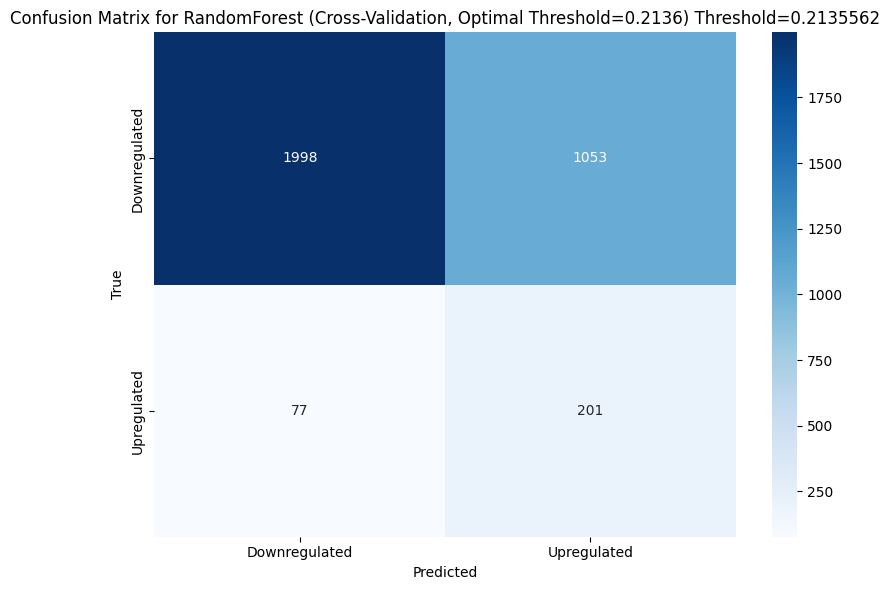

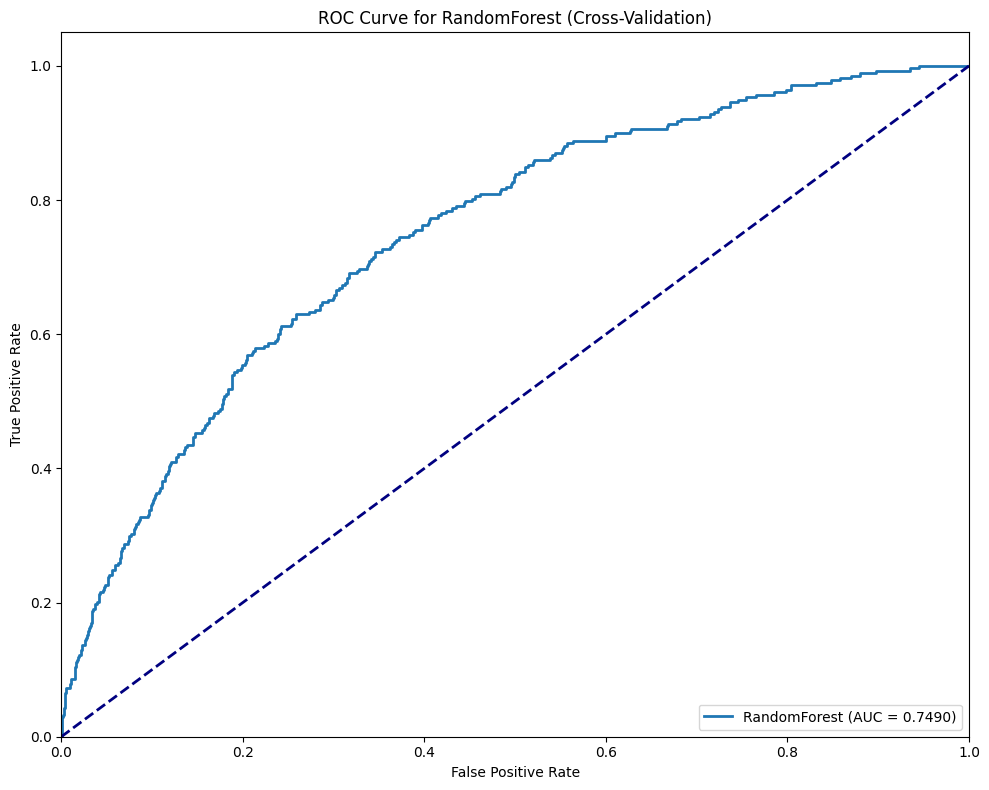

Final RandomForest Best Parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Final RandomForest test class counts: [833]
Final RandomForest test proba range: min=0.0315, max=0.4997
Confusion Matrix for RandomForest (Final Model, Test Set):
[[748   0]
 [ 85   0]]


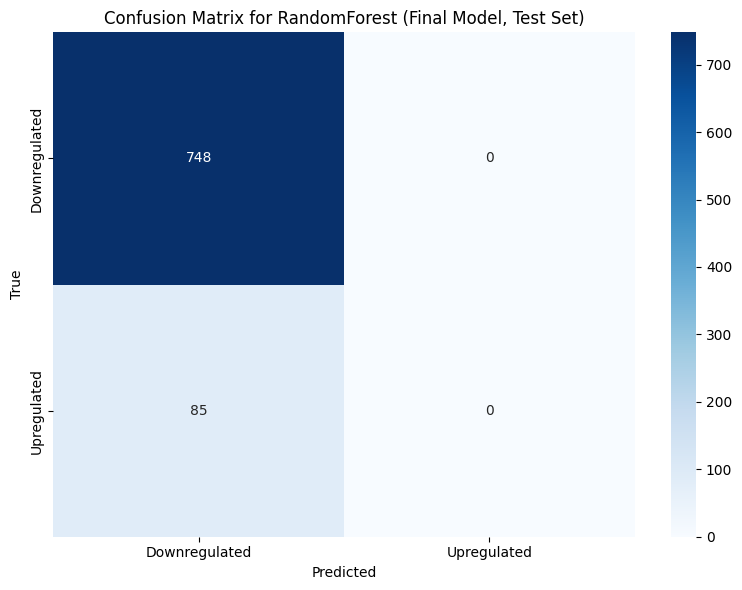

Confusion Matrix for RandomForest (Final Model, Threshold=0.3):
[[688  60]
 [ 59  26]]


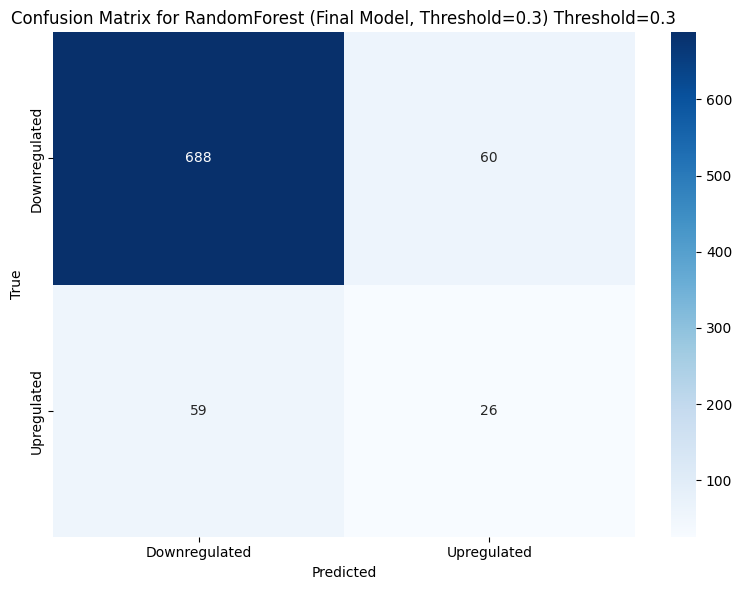

Final RandomForest AUC-ROC: 0.7432


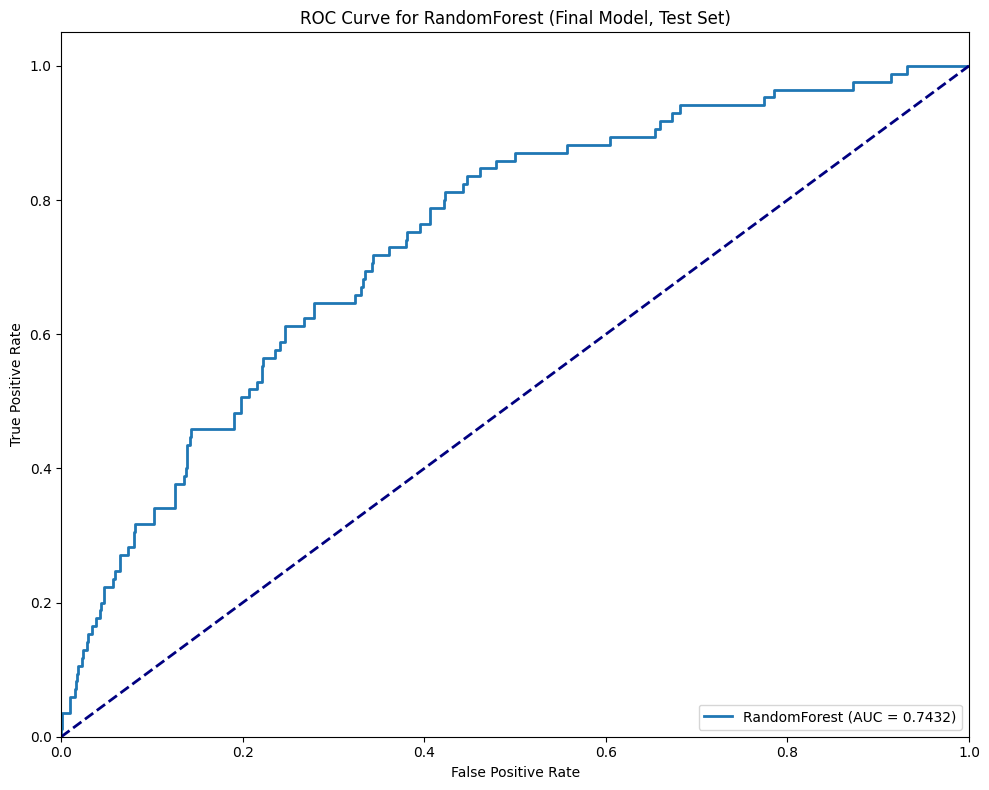

Final RandomForest Optimal ROC threshold: 0.1812
Confusion Matrix for RandomForest (Final Model, Optimal Threshold=0.1812):
[[432 316]
 [ 16  69]]


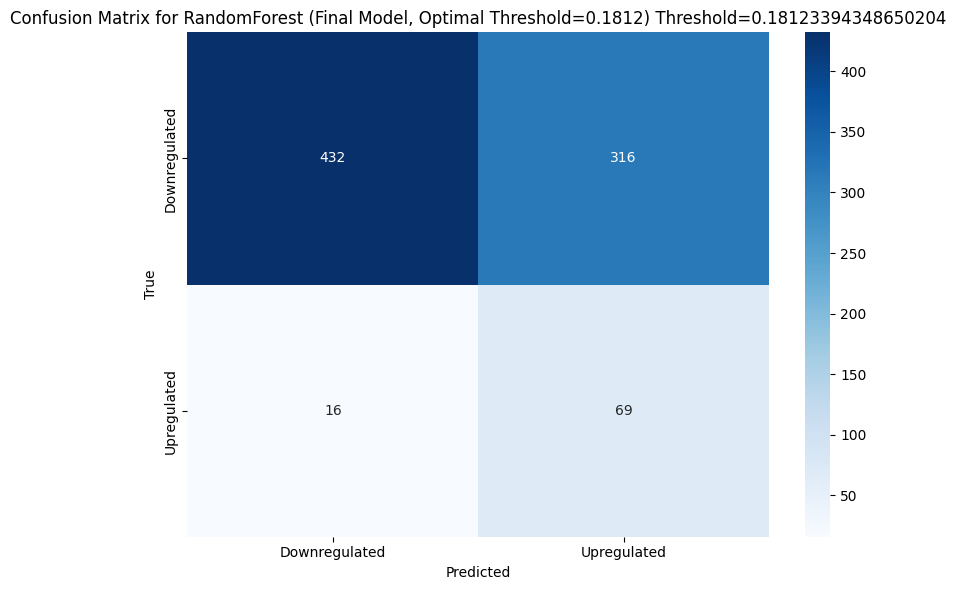

Feature importance plot failed for RandomForest: bar.err is not a valid plot kind
SHAP: X_train shape: (2496, 3834), X_test shape: (833, 3834), feature_names_combined length: 3834


<Figure size 1000x800 with 0 Axes>

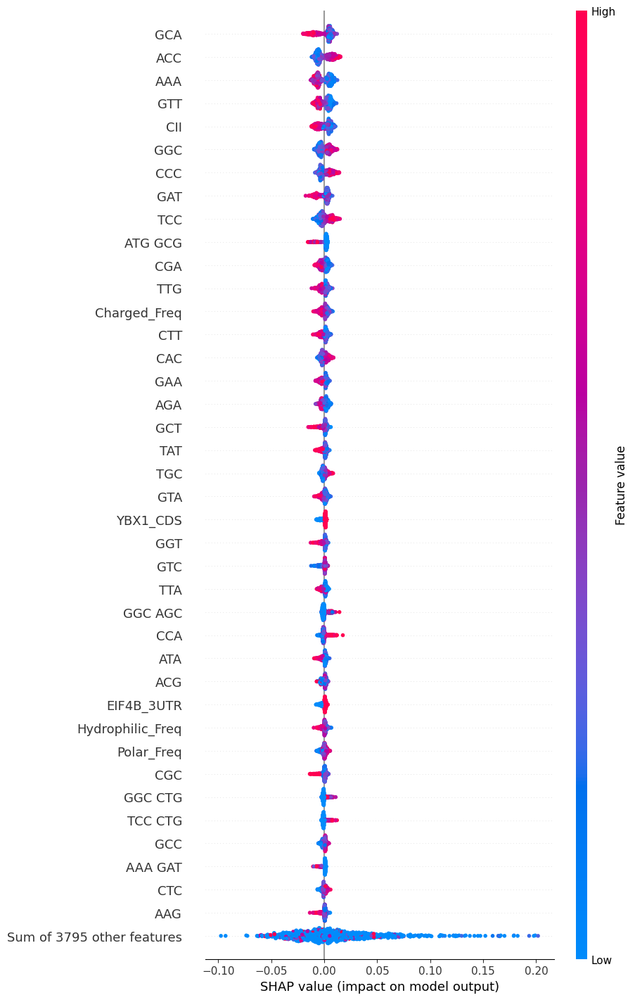

<Figure size 640x480 with 0 Axes>


=== Training XGBoost ===
Processing fold 1/5
Fold 1 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 1 class counts: [666]
Fold 1 proba range: min=0.0008, max=0.3128
Processing fold 2/5
Fold 2 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 2 class counts: [666]
Fold 2 proba range: min=0.0007, max=0.3387
Processing fold 3/5
Fold 3 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.1}
Fold 3 class counts: [666]
Fold 3 proba range: min=0.0005, max=0.3378
Processing fold 4/5
Fold 4 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 4 class counts: [666]
Fold 4 proba range: min=0.0009, max=0.3188
Processing fold 5/5
Fold 5 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 5 class counts: [665]
Fold 5 proba range: min=0.0006, max=0.2012
Final XGBoost 

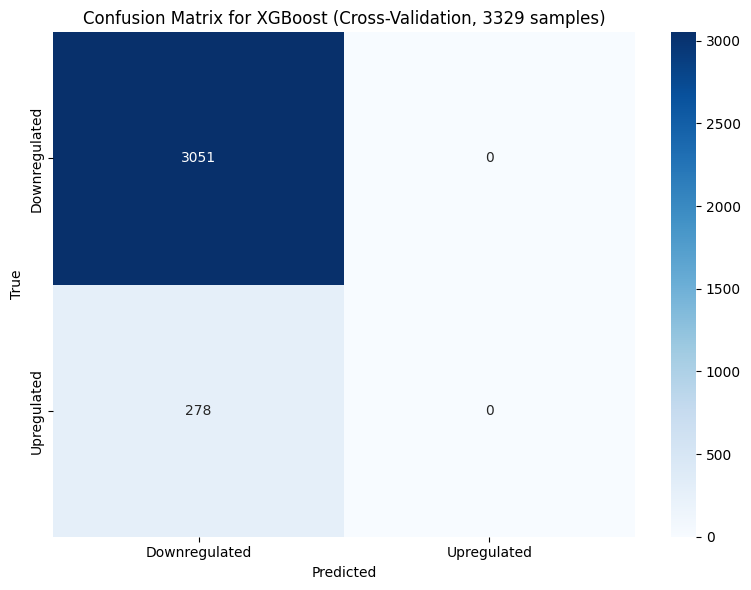

Confusion Matrix for XGBoost (Cross-Validation, Threshold=0.3):
[[3050    1]
 [ 275    3]]


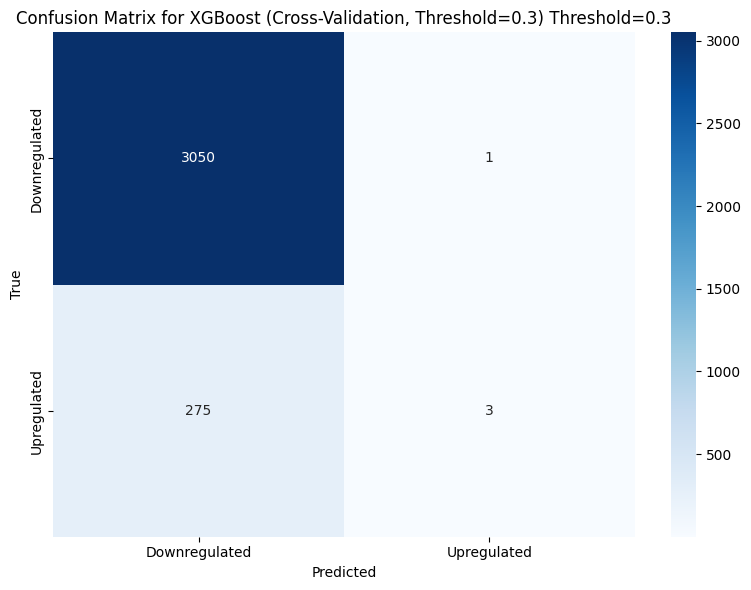

Final XGBoost AUC-ROC: 0.7581
Optimal ROC threshold (XGBoost CV): 0.0082
Confusion Matrix for XGBoost (Cross-Validation, Optimal Threshold=0.0082):
[[2119  932]
 [  78  200]]


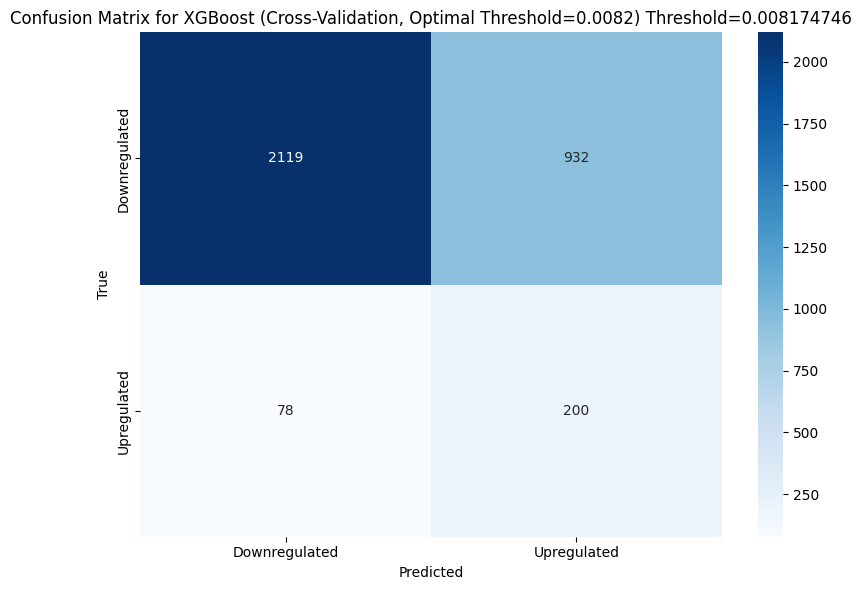

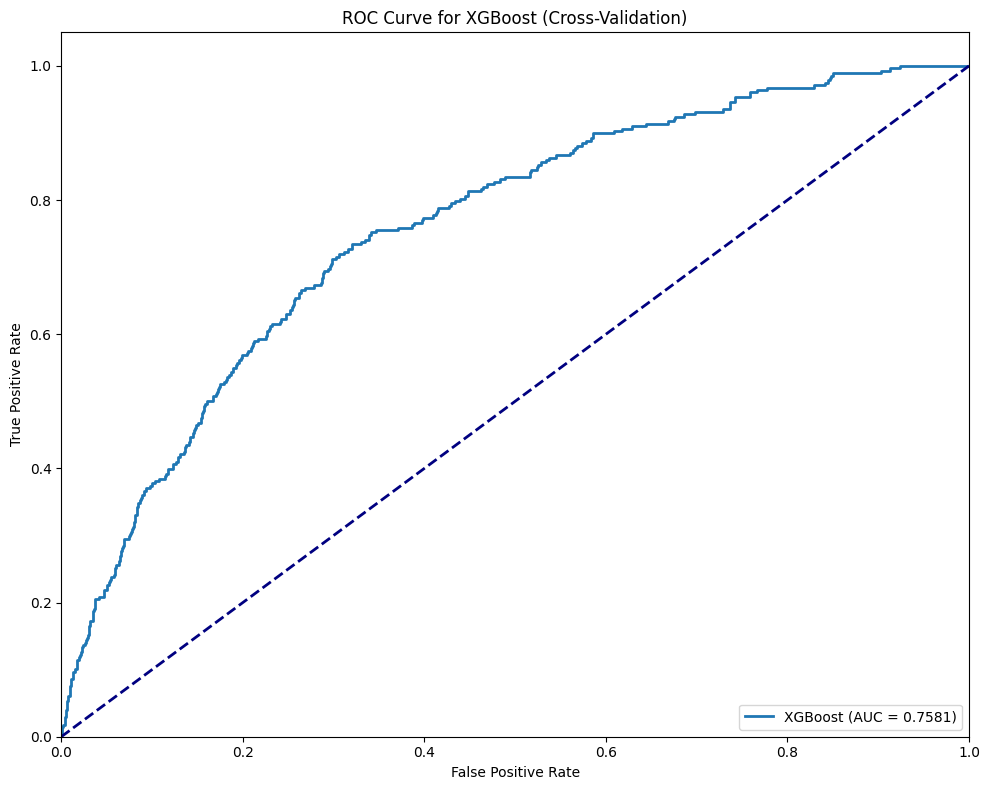

Final XGBoost Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Final XGBoost test class counts: [833]
Final XGBoost test proba range: min=0.0009, max=0.2735
Confusion Matrix for XGBoost (Final Model, Test Set):
[[748   0]
 [ 85   0]]


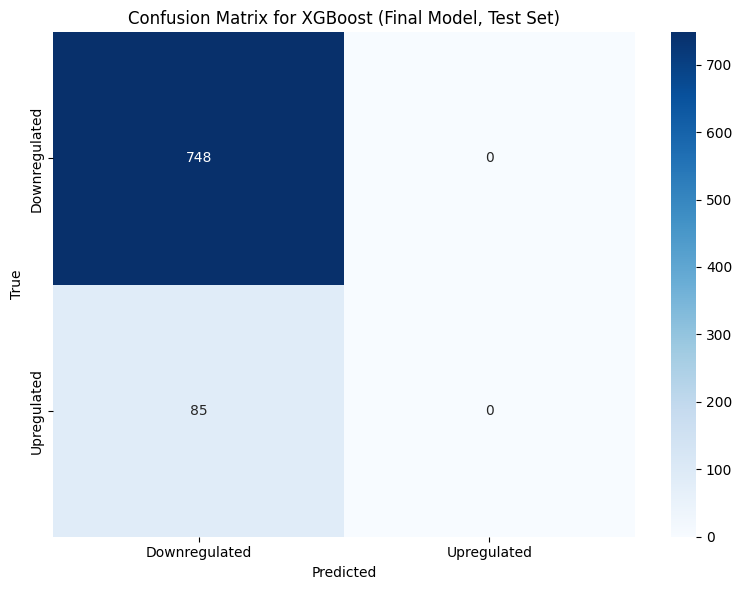

Confusion Matrix for XGBoost (Final Model, Threshold=0.3):
[[748   0]
 [ 85   0]]


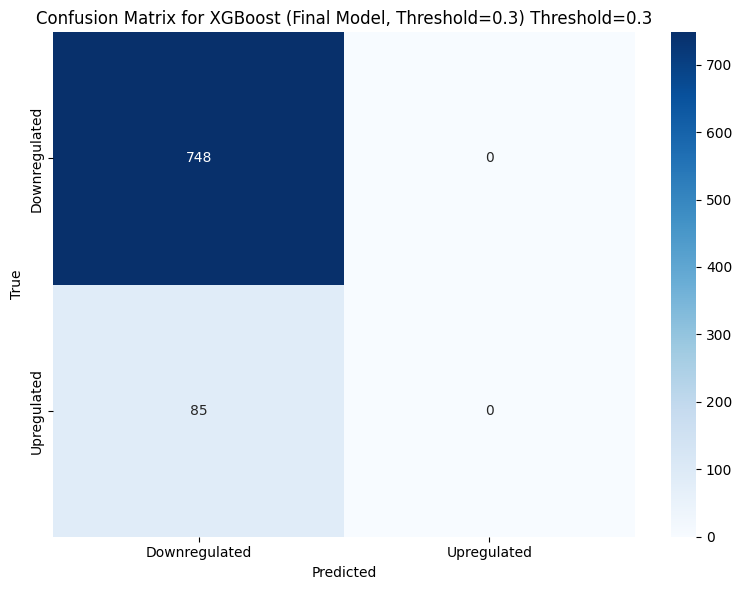

Final XGBoost AUC-ROC: 0.7382


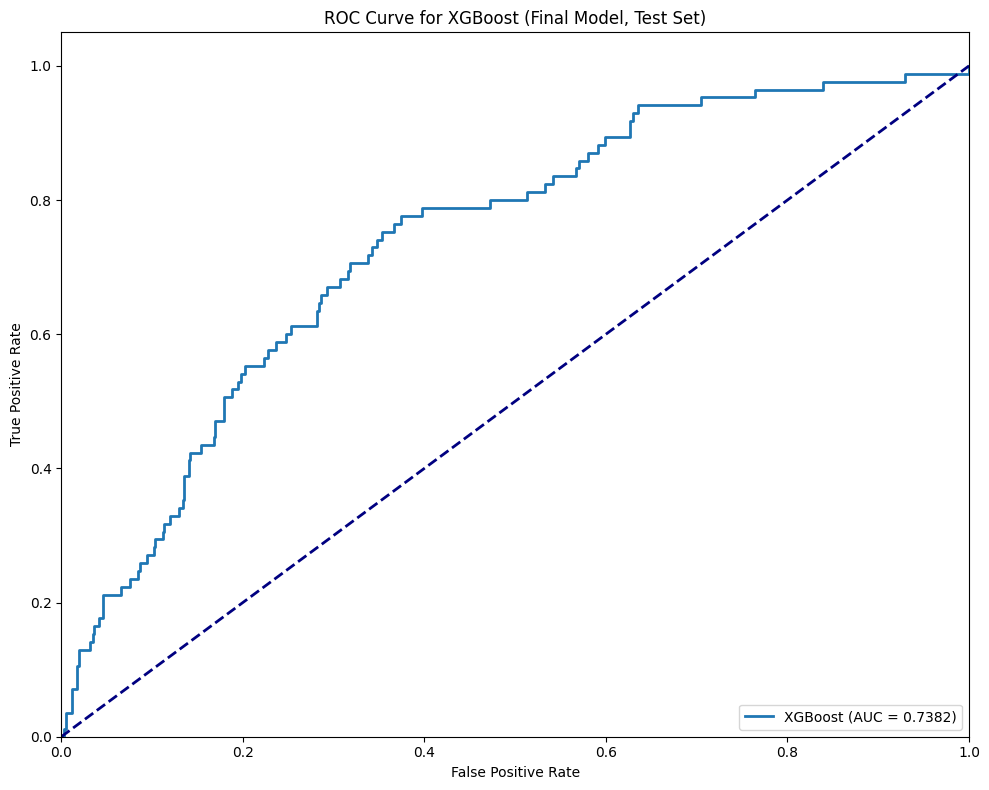

Final XGBoost Optimal ROC threshold: 0.0060
Confusion Matrix for XGBoost (Final Model, Optimal Threshold=0.0060):
[[468 280]
 [ 19  66]]


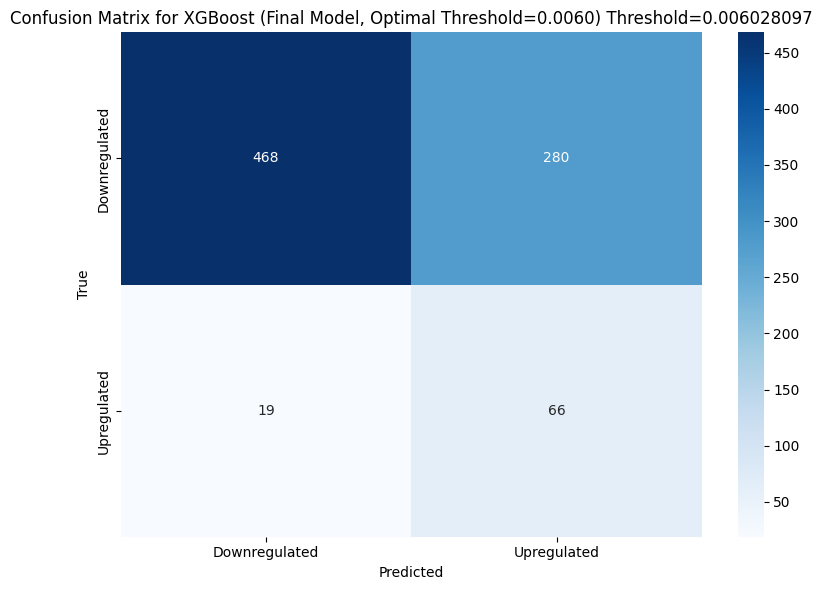

Feature importance plot failed for XGBoost: bar.err is not a valid plot kind
SHAP: X_train shape: (2496, 3834), X_test shape: (833, 3834), feature_names_combined length: 3834


<Figure size 1000x800 with 0 Axes>

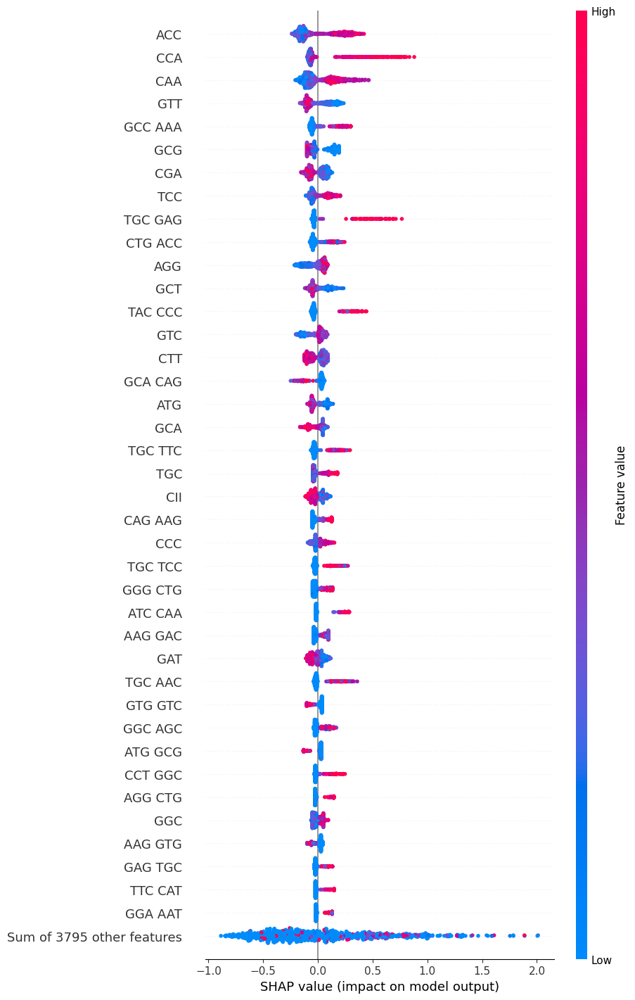

<Figure size 640x480 with 0 Axes>

In [8]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc, precision_score, recall_score, f1_score, matthews_corrcoef, cohen_kappa_score, log_loss, precision_recall_curve
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from joblib import Parallel, delayed
from itertools import chain
from xgboost import XGBClassifier
from scipy.sparse import csr_matrix

# Set up logging
logging.basicConfig(filename='rf_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Consolidated plotting function
def plot_confusion_matrix(y_true, y_pred, title, filename, model_name, threshold=None):
    cm = confusion_matrix(y_true, y_pred)
    print(f"{title}:\n{cm}")
    logging.info(f"{title}:\n{cm}")
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"{title}{' Threshold=' + str(threshold) if threshold else ''}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(f'{filename}.png', bbox_inches='tight')
    plt.show()
    plt.close()
    return cm

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}
AROMATIC_AAS = {'F', 'Y', 'W'}
POLAR_AAS = {'N', 'Q', 'S', 'T'}
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def compute_features(seq, weights):
    try:
        seq = seq.upper()
        if not seq:
            raise ValueError("Sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
        
        codons = [seq[i:i+3] for i in range(0, len(seq), 3)]
        total_codons = len([c for c in codons if c not in STOP_CODONS])
        
        # CAI
        sequence_weights = [weights[codon] for codon in codons if codon not in STOP_CODONS and codon not in NON_SYNONYMOUS_CODONS]
        cai = geometric_mean(sequence_weights) if sequence_weights else 0.0
        
        # CII
        destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
        cii = destabilizing_count / total_codons if total_codons > 0 else 0.0
        
        # Codon group frequencies
        aliphatic = sum(1 for codon in codons if codon in ALIPHATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        aromatic = sum(1 for codon in codons if codon in AROMATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        polar = sum(1 for codon in codons if codon in POLAR_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        charged = sum(1 for codon in codons if codon in CHARGED_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophobic = sum(1 for codon in codons if codon in HYDROPHOBIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophilic = sum(1 for codon in codons if codon in HYDROPHILIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        
        return cai, cii, aliphatic, aromatic, polar, charged, hydrophobic, hydrophilic
    except Exception as e:
        logging.error(f"Error computing features for sequence {seq[:30]}...: {e}")
        return 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

def load_fasta_sequences(up_file, down_file):
    sequences, labels, gene_ids = [], [], []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(label)
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                logging.error(f"Error reading {file_path}: {e}")
                return None, None, None
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            for record in SeqIO.parse(ref_file, 'fasta'):
                seq = str(record.seq).upper()
                if len(seq) >= 3:
                    seq = seq[:-3]
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                    logging.warning(f"Skipping reference {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                    continue
                ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            logging.error(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def load_motif_data(motif_file):
    try:
        motif_df = pd.read_csv(motif_file, sep='\t')
        print(f"Loaded motif data with {len(motif_df)} transcripts")
        print(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        logging.info(f"Loaded motif data with {len(motif_df)} transcripts")
        logging.info(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        print(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        logging.info(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        return motif_df
    except Exception as e:
        print(f"Error reading motif data: {e}")
        logging.error(f"Error reading motif data: {e}")
        return None

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

def compute_class_weights(labels):
    n_samples = len(labels)
    n_classes = len(np.unique(labels))
    class_counts = np.bincount(labels.astype(int))
    weights = n_samples / (n_classes * class_counts)
    return {0: weights[0], 1: weights[1]}

# Input file paths
up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'
#up_file = "unt_vs_tgfb_de_genes_up_logFC_0.5.fasta"
#down_file = "unt_vs_tgfb_de_genes_down_logFC_0.5.fasta"
#ref_file = "mouse_transcriptome_cds.fasta"
ref_file = "tgfb_top100_highly_expressed_cds.fasta"
motif_file = "transcript_motif_status_all.txt"


# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    logging.error("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")
logging.info(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights.keys())[:5]})
    logging.info("Computed CAI weights successfully")
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    logging.error(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    logging.error("Failed to load FASTA files. Exiting.")
    exit(1)
print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")
if len(sequences) != 1934:
    print(f"Warning: Expected 1934 sequences, got {len(sequences)}")
    logging.warning(f"Expected 1934 sequences, got {len(sequences)}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Load motif data
motif_df = load_motif_data(motif_file)
if motif_df is None:
    print("Failed to load motif data. Exiting.")
    logging.error("Failed to load motif data. Exiting.")
    exit(1)

# Save motif transcript_ids
with open('motif_transcript_ids.txt', 'w') as f:
    f.write('\n'.join(motif_df['transcript_id'].astype(str)))

# Merge motif data with gene IDs
try:
    motif_df = motif_df.set_index('transcript_id')
    print(f"Motif_df shape before processing: {motif_df.shape}")
    logging.info(f"Motif_df shape before processing: {motif_df.shape}")
    # Drop non-numeric columns and convert to numeric
    motif_features = motif_df.drop(columns=['gene_name'], errors='ignore')
    non_numeric_cols = motif_features.select_dtypes(exclude=['float64', 'int64']).columns
    if non_numeric_cols.any():
        print(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        logging.warning(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        for col in non_numeric_cols:
            try:
                motif_features[col] = pd.to_numeric(motif_features[col], errors='coerce').fillna(0)
            except Exception as e:
                print(f"Error converting column {col} to numeric: {e}")
                logging.error(f"Error converting column {col} to numeric: {e}")
                motif_features = motif_features.drop(columns=[col])
    # Remove duplicates and align with gene_ids
    motif_features = motif_features.loc[~motif_features.index.duplicated(keep='first')]
    common_ids = set(motif_features.index).intersection(set(gene_ids))
    print(f"Number of common transcript IDs: {len(common_ids)}")
    logging.info(f"Number of common transcript IDs: {len(common_ids)}")
    if len(common_ids) < len(gene_ids):
        print(f"Warning: Only {len(common_ids)}/{len(gene_ids)} IDs match")
        logging.warning(f"Only {len(common_ids)}/{len(gene_ids)} IDs match")
        gene_ids_clean = [gid.strip() for gid in gene_ids]
        motif_ids_clean = [str(idx).strip() for idx in motif_features.index]
        common_ids = set(motif_ids_clean).intersection(set(gene_ids_clean))
        print(f"Number of common IDs after cleaning: {len(common_ids)}")
        logging.info(f"Number of common IDs after cleaning: {len(common_ids)}")
        if len(common_ids) == 0:
            raise ValueError("No common transcript IDs after cleaning")
    motif_features = motif_features.loc[list(common_ids)].reindex(gene_ids).fillna(0).astype(np.float32)
    # Save motif_features for inspection
    motif_features.to_csv('motif_features_pre_norm.txt', sep='\t', index_label='transcript_id')
    # Normalize motif features by prevalence
    motif_features = motif_features.div(motif_features.mean() + 1e-6)  # Avoid division by zero
    print(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    logging.info(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    # Check for TGFb motifs
    tgfb_motifs = [col for col in motif_features.columns if any(t in col.lower() for t in ['tgfb1', 'tgfb2', 'tgfb3'])]
    if tgfb_motifs:
        print(f"Warning: TGFb1/2/3 motifs detected: {tgfb_motifs}")
        logging.warning(f"TGFb1/2/3 motifs detected: {tgfb_motifs}")
        motif_features = motif_features.drop(columns=tgfb_motifs)
        print(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
        logging.info(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
    else:
        print("No TGFb1/2/3 motifs detected in motif features")
        logging.info("No TGFb1/2/3 motifs detected in motif features")
    # Compute and display motif feature counts
    feature_counts = pd.DataFrame({
        'Count_NonZero': (motif_features > 0).sum(),
        'Count_Zero': (motif_features == 0).sum(),
        'Prevalence_%': (motif_features > 0).mean() * 100
    })
    print("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    print(feature_counts.to_string())
    logging.info("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    logging.info(feature_counts.to_string())
except Exception as e:
    print(f"Error aligning motif data: {e}")
    logging.error(f"Error aligning motif data: {e}")
    exit(1)

# Debug motif features before processing
print("Motif features non-zero counts:", (motif_features != 0).sum().sum())
logging.info(f"Motif features non-zero counts: {(motif_features != 0).sum().sum()}")

# Compute sequence-derived features
try:
    features = Parallel(n_jobs=-1)(delayed(compute_features)(seq, ref_weights) for seq in sequences)
    cai_values, cii_values, aliphatic_freq, aromatic_freq, polar_freq, charged_freq, hydrophobic_freq, hydrophilic_freq = zip(*features)
    cai_values = np.array(cai_values, dtype=np.float32)
    cii_values = np.array(cii_values, dtype=np.float32)
    aliphatic_freq = np.array(aliphatic_freq, dtype=np.float32)
    aromatic_freq = np.array(aromatic_freq, dtype=np.float32)
    polar_freq = np.array(polar_freq, dtype=np.float32)
    charged_freq = np.array(charged_freq, dtype=np.float32)
    hydrophobic_freq = np.array(hydrophobic_freq, dtype=np.float32)
    hydrophilic_freq = np.array(hydrophilic_freq, dtype=np.float32)
except Exception as e:
    print(f"Error computing sequence features: {e}")
    logging.error(f"Error computing sequence features: {e}")
    exit(1)

# Scale sequence-derived features
scaler = StandardScaler()
sequence_features = np.hstack([
    cai_values[:, np.newaxis],
    cii_values[:, np.newaxis],
    aliphatic_freq[:, np.newaxis],
    aromatic_freq[:, np.newaxis],
    polar_freq[:, np.newaxis],
    charged_freq[:, np.newaxis],
    hydrophobic_freq[:, np.newaxis],
    hydrophilic_freq[:, np.newaxis]
])
sequence_features = scaler.fit_transform(sequence_features)
sequence_features = np.nan_to_num(sequence_features, nan=0.0, posinf=0.0, neginf=0.0)
sequence_feature_names = ['CAI', 'CII', 'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq', 'Hydrophobic_Freq', 'Hydrophilic_Freq']

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_features if codon.upper() not in STOP_CODONS]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))  # Keep sparse
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
# Convert to dense array for scaling
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Dicodon frequencies (including all possible dicodons)
dicodon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False, ngram_range=(2,2))
X_dicodon = dicodon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
dicodon_feature_names = [f"{d.replace('t', 'u').upper()}" for d in dicodon_vectorizer.get_feature_names_out()]
# Filter out dicodons containing stop codons
dicodon_features = dicodon_vectorizer.get_feature_names_out()
valid_dicodon_indices = [
    i for i, dicodon in enumerate(dicodon_features)
    if not any(codon in STOP_CODONS for codon in [dicodon[:3], dicodon[3:]])
]
X_dicodon = X_dicodon[:, valid_dicodon_indices]
dicodon_feature_names = [dicodon_feature_names[i] for i in valid_dicodon_indices]
# Normalize dicodon counts
dicodon_lengths = np.array([max(1, (len(seq) // 3) - 1) for seq in sequences], dtype=np.float32)  # At least 1 to avoid division by zero
X_dicodon_normalized = X_dicodon.multiply(1 / (dicodon_lengths[:, np.newaxis] + 1e-6))  # Keep sparse
print(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}, shape: {X_dicodon_normalized.shape}")
logging.info(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}, shape: {X_dicodon_normalized.shape}")
# Convert to dense array for scaling
X_dicodon_scaled = scaler.fit_transform(X_dicodon_normalized.toarray())
X_dicodon_scaled = np.nan_to_num(X_dicodon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
# Save dicodon feature names and matrix
with open('dicodon_feature_names.txt', 'w') as f:
    f.write('\n'.join(dicodon_feature_names))
X_dicodon_df = pd.DataFrame(X_dicodon_scaled, columns=dicodon_feature_names, index=gene_ids)
X_dicodon_df.to_csv('dicodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
print(f"Saved dicodon feature matrix to dicodon_feature_matrix.txt with {len(dicodon_feature_names)} dicodons")
logging.info(f"Saved dicodon feature matrix to dicodon_feature_matrix.txt with {len(dicodon_feature_names)} dicodons")

# Debug dicodon features
print("NaNs in X_dicodon_scaled:", np.any(np.isnan(X_dicodon_scaled)))
print("Infs in X_dicodon_scaled:", np.any(np.isinf(X_dicodon_scaled)))
print("Dicodon features non-zero counts:", (X_dicodon_scaled != 0).sum())
logging.info(f"NaNs in X_dicodon_scaled: {np.any(np.isnan(X_dicodon_scaled))}")
logging.info(f"Infs in X_dicodon_scaled: {np.any(np.isinf(X_dicodon_scaled))}")
logging.info(f"Dicodon features non-zero counts: {(X_dicodon_scaled != 0).sum()}")

# Combine features (codon, dicodon, sequence, motif)
try:
    print(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    logging.info(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    X_combined = np.hstack([
        X_codon_scaled,
        X_dicodon_scaled,
        sequence_features,
        motif_features.values
    ], dtype=np.float32)
except Exception as e:
    print(f"Error combining features: {e}")
    logging.error(f"Error combining features: {e}")
    exit(1)

feature_names_combined = codon_feature_names + dicodon_feature_names + sequence_feature_names + list(motif_features.columns)
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined, index=gene_ids)

# Debug combined features
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
print("Codon features non-zero counts in X_combined:", (X_combined[:, :len(codon_feature_names)] != 0).sum())
print("Dicodon features non-zero counts in X_combined:", (X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum())
print("Motif features non-zero counts in X_combined:", (X_combined[:, -len(motif_features.columns):] != 0).sum())
logging.info(f"NaNs in X_combined: {np.any(np.isnan(X_combined))}")
logging.info(f"Infs in X_combined: {np.any(np.isinf(X_combined))}")
logging.info(f"Codon features non-zero counts in X_combined: {(X_combined[:, :len(codon_feature_names)] != 0).sum()}")
logging.info(f"Dicodon features non-zero counts in X_combined: {(X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum()}")
logging.info(f"Motif features non-zero counts in X_combined: {(X_combined[:, -len(motif_features.columns):] != 0).sum()}")

# Feature selection (ensure motif features are included)
k_sequence = 100  # Increased to accommodate dicodon features
selector = SelectKBest(score_func=f_classif, k=k_sequence)
X_sequence_selected = selector.fit_transform(X_combined[:, :-len(motif_features.columns)], labels)
selected_indices = selector.get_support(indices=True)
selected_sequence_features = [feature_names_combined[i] for i in selected_indices]
selected_features = selected_sequence_features + list(motif_features.columns)
X_selected = np.hstack([
    X_sequence_selected,
    motif_features.values
], dtype=np.float32)
print(f"Selected {len(selected_features)} features, including {sum(f in dicodon_feature_names for f in selected_sequence_features)} dicodons")
logging.info(f"Selected {len(selected_features)} features, including {sum(f in dicodon_feature_names for f in selected_sequence_features)} dicodons")
print(f"Dicodon features in selected features: {[f for f in selected_sequence_features if f in dicodon_feature_names]}")
logging.info(f"Dicodon features in selected features: {[f for f in selected_sequence_features if f in dicodon_feature_names]}")

# Save feature matrix
try:
    X_combined_df.to_csv('feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved combined feature matrix to feature_matrix.txt")
    logging.info("Saved combined feature matrix to feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrix: {e}")
    logging.error(f"Error saving feature matrix: {e}")

# Validate data
labels = np.array(labels, dtype=np.float32)
if X_combined_df.shape[0] != len(labels):
    raise ValueError(f"Mismatch: X_combined_df rows ({X_combined_df.shape[0]}) != labels ({len(labels)})")

# Compute class weights
class_weights = compute_class_weights(labels)
print(f"Class weights: {class_weights}")
logging.info(f"Class weights: {class_weights}")

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_combined_df, labels, test_size=0.25, random_state=42)
X_train = np.nan_to_num(X_train.values, nan=0.0, posinf=0.0, neginf=0.0)
X_test = np.nan_to_num(X_test.values, nan=0.0, posinf=0.0, neginf=0.0)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Debug data shapes
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
print(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")
logging.info(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
logging.info(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")

# Define model configurations
model_config = {
    'RandomForest': {
        'clf': RandomForestClassifier(random_state=42, class_weight='balanced', n_jobs=-1),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [10, 20],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2],
            'max_features': ['sqrt']
        }
    },
    'XGBoost': {
        'clf': XGBClassifier(random_state=42, n_jobs=-1, scale_pos_weight=class_weights[0]/class_weights[1]),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [3, 6],
            'learning_rate': [0.1],
            'subsample': [0.8]
        }
    }
}

# Train and evaluate models
for model_name in ['RandomForest', 'XGBoost']:
    config = model_config[model_name]
    print(f"\n=== Training {model_name} ===")
    logging.info(f"Training {model_name}")

    y_true_all = np.zeros(len(labels), dtype=np.float32)
    y_pred_all = np.zeros(len(labels), dtype=np.float32)
    y_proba_all = np.zeros(len(labels), dtype=np.float32)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_combined_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_combined_df.iloc[train_idx].values.astype(np.float32)
        y_train_fold = labels[train_idx].astype(np.float32)
        X_test_fold = X_combined_df.iloc[test_idx].values.astype(np.float32)
        y_test_fold = labels[test_idx].astype(np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        grid_search = RandomizedSearchCV(
            estimator=config['clf'],
            param_distributions=config['param_grid'],
            n_iter=10,
            cv=3,
            scoring='balanced_accuracy',
            n_jobs=-1,
            random_state=42,
            error_score='raise'
        )
        try:
            grid_search.fit(X_train_fold, y_train_fold)
            print(f"Fold {fold} Best Parameters: {grid_search.best_params_}")
            logging.info(f"Fold {fold} parameters: {grid_search.best_params_}")
            model = grid_search.best_estimator_
        except Exception as e:
            print(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            logging.error(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            continue
        
        try:
            model.fit(X_train_fold, y_train_fold)
            y_pred_fold = model.predict(X_test_fold)
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
            print(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            print(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
            logging.info(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            logging.info(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
        except Exception as e:
            print(f"Prediction failed for fold {fold}: {e}")
            logging.error(f"Prediction failed for fold {fold}: {e}")
            continue
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold

    # Debug predictions
    print(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    print(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")
    logging.info(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    logging.info(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")

    # Confusion matrix for cross-validation
    plot_confusion_matrix(y_true_all, y_pred_all, 
                          f"Confusion Matrix for {model_name} (Cross-Validation, {len(labels)} samples)",
                          f'confusion_matrix_{model_name.lower()}_cv', model_name)

    # Adjusted threshold confusion matrix (CV)
    y_pred_adjusted_cv = (y_proba_all >= 0.3).astype(np.float32)
    plot_confusion_matrix(y_true_all, y_pred_adjusted_cv,
                          f"Confusion Matrix for {model_name} (Cross-Validation, Threshold=0.3)",
                          f'confusion_matrix_{model_name.lower()}_cv_threshold_0.3', model_name, threshold=0.3)

    # ROC curve for cross-validation
    try:
        fpr, tpr, thresholds = roc_curve(y_true_all, y_proba_all)
        roc_auc = auc(fpr, tpr)
        print(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        logging.info(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]
        print(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        logging.info(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        y_pred_optimal = (y_proba_all >= optimal_threshold).astype(np.float32)
        plot_confusion_matrix(y_true_all, y_pred_optimal,
                              f"Confusion Matrix for {model_name} (Cross-Validation, Optimal Threshold={optimal_threshold:.4f})",
                              f'confusion_matrix_{model_name.lower()}_cv_optimal', model_name, threshold=optimal_threshold)
        
        plt.figure(figsize=(10, 8))
        plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.4f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name} (Cross-Validation)')
        plt.legend(loc="lower right")
        plt.tight_layout()
        plt.savefig(f'roc_curve_{model_name.lower()}_cv.png', bbox_inches='tight')
        plt.show()
        plt.close()
    except Exception as e:
        print(f"ROC failed for {model_name} CV: {e}")
        logging.error(f"ROC failed for {model_name} CV: {e}")

    # Final model training
    grid_search = RandomizedSearchCV(
        estimator=config['clf'],
        param_distributions=config['param_grid'],
        n_iter=10,
        cv=3,
        scoring='balanced_accuracy',
        n_jobs=-1,
        random_state=42,
        error_score='raise'
    )
    try:
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print(f"Final {model_name} Best Parameters: {grid_search.best_params_}")
        logging.info(f"Final {model_name}: {grid_search.best_params_}")
    except Exception as e:
        print(f"Final {model_name} training failed: {e}")
        logging.error(f"Final {model_name} training failed: {e}")
        final_model = None

    if final_model:
        try:
            final_model.fit(X_train, y_train)
            y_pred_final = final_model.predict(X_test)
            y_proba_final = final_model.predict_proba(X_test)[:, 1]
            print(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            print(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")
            logging.info(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            logging.info(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")

            # Compute and print additional metrics for final model
            unique_classes = np.unique(y_pred_final)
            if len(unique_classes) < 2:
                print(f"Warning: {model_name} final model predicted only one class. Skipping metrics.")
                logging.warning(f"{model_name} final model predicted only one class. Skipping metrics.")
            else:
                tn, fp, fn, tp = confusion_matrix(y_test, y_pred_final).ravel()
                sensitivity = recall_score(y_test, y_pred_final, pos_label=1)
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
                accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0
                mcc = matthews_corrcoef(y_test, y_pred_final)
                precision = precision_score(y_test, y_pred_final, pos_label=1)
                recall = sensitivity
                f1 = f1_score(y_test, y_pred_final, pos_label=1)
                auc_roc = roc_auc_score(y_test, y_proba_final)
                precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_proba_final)
                auc_pr = auc(recall_vals, precision_vals)
                balanced_accuracy = (sensitivity + specificity) / 2
                kappa = cohen_kappa_score(y_test, y_pred_final)
                logloss = log_loss(y_test, y_proba_final)
                
                metrics_str = (f"\nMetrics for {model_name} (Final Model, Test Set):\n"
                              f"Sensitivity (Recall): {sensitivity:.4f}\n"
                              f"Specificity: {specificity:.4f}\n"
                              f"Accuracy: {accuracy:.4f}\n"
                              f"Balanced Accuracy: {balanced_accuracy:.4f}\n"
                              f"MCC: {mcc:.4f}\n"
                              f"Precision: {precision:.4f}\n"
                              f"F1 Score: {f1:.4f}\n"
                              f"AUC-ROC: {auc_roc:.4f}\n"
                              f"AUC-PR: {auc_pr:.4f}\n"
                              f"Cohen’s Kappa: {kappa:.4f}\n"
                              f"Log Loss: {logloss:.4f}")
                print(metrics_str)
                logging.info(metrics_str)

            # Confusion matrix for final model
            plot_confusion_matrix(y_test, y_pred_final, 
                                  f"Confusion Matrix for {model_name} (Final Model, Test Set)",
                                  f'confusion_matrix_{model_name.lower()}_final', model_name)

            # Adjusted threshold confusion matrix (final)
            y_pred_adjusted_final = (y_proba_final >= 0.3).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_adjusted_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Threshold=0.3)",
                                  f'confusion_matrix_{model_name.lower()}_final_threshold_0.3', model_name, threshold=0.3)

            # ROC curve for final model
            fpr_final, tpr_final, thresholds_final = roc_curve(y_test, y_proba_final)
            roc_auc_final = auc(fpr_final, tpr_final)
            print(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            logging.info(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            
            plt.figure(figsize=(10, 8))
            plt.plot(fpr_final, tpr_final, lw=2, label=f'{model_name} (AUC = {roc_auc_final:.4f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve for {model_name} (Final Model, Test Set)')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'roc_curve_{model_name.lower()}_final.png', bbox_inches='tight')
            plt.show()
            plt.close()

            # Optimal threshold confusion matrix (final)
            optimal_idx_final = np.argmax(tpr_final - fpr_final)
            optimal_threshold_final = thresholds_final[optimal_idx_final]
            print(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            logging.info(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            y_pred_optimal_final = (y_proba_final >= optimal_threshold_final).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_optimal_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Optimal Threshold={optimal_threshold_final:.4f})",
                                  f'confusion_matrix_{model_name.lower()}_final_optimal', model_name, threshold=optimal_threshold_final)

            # Feature importance plot
            try:
                feature_importance = pd.Series(final_model.feature_importances_, index=feature_names_combined)
                top_features = feature_importance.nlargest(40)
                plt.figure(figsize=(10, 8))
                top_features.plot(kind='bar.err', color='skyblue')
                plt.title(f'Top 40 Feature Importances for {model_name}')
                plt.xlabel('Importance')
                plt.ylabel('Feature')
                plt.tight_layout()
                plt.savefig(f'feature_importance_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
                print(f"Top 40 feature importances for {model_name}:")
                print(top_features.to_string())
                logging.info(f"Top 40 feature importances for {model_name}:")
                logging.info(top_features.to_string())
            except Exception as e:
                print(f"Feature importance plot failed for {model_name}: {e}")
                logging.error(f"Feature importance plot failed for {model_name}: {e}")

            # SHAP analysis
            try:
                print(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, feature_names_combined length: {len(feature_names_combined)}")
                logging.info(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, feature_names_combined length: {len(feature_names_combined)}")
                explainer = shap.TreeExplainer(final_model, X_train, check_additivity=False)
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
                base_value = explainer.expected_value[1] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value
                shap_explanation = shap.Explanation(
                    values=shap_values_class1,
                    base_values=np.full(X_test.shape[0], float(base_value)),
                    data=X_test,
                    feature_names=feature_names_combined
                )
                plt.figure(figsize=(10, 5))
                shap.plots.beeswarm(shap_explanation, max_display=40)
                plt.tight_layout()
                plt.savefig(f'shap_beeswarm_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
            except Exception as e:
                print(f"TreeExplainer failed for {model_name}: {e}")
                logging.error(f"TreeExplainer failed for {model_name}: {e}")
                # Fallback to KernelExplainer
                try:
                    print(f"Attempting KernelExplainer for {model_name}...")
                    logging.info(f"Attempting KernelExplainer for {model_name}...")
                    X_test_subset = X_test[:50]  # Reduced for speed
                    def predict_proba(X):
                        return final_model.predict_proba(X)[:, 1]
                    explainer = shap.KernelExplainer(predict_proba, X_train[:50], link="logit")
                    shap_values = explainer.shap_values(X_test_subset, nsamples=50)
                    shap_explanation = shap.Explanation(
                        values=shap_values,
                        base_values=explainer.expected_value,
                        data=X_test_subset,
                        feature_names=feature_names_combined
                    )
                    plt.figure(figsize=(10, 5))
                    shap.plots.beeswarm(shap_explanation, max_display=50)
                    plt.tight_layout()
                    plt.savefig(f'shap_beeswarm_{model_name.lower()}_kernel.png', bbox_inches='tight')
                    plt.show()
                    plt.close()
                except Exception as sub_e:
                    print(f"KernelExplainer failed for {model_name}: {sub_e}")
                    logging.error(f"KernelExplainer failed for {model_name}: {sub_e}")
        except Exception as e:
            print(f"Final {model_name} training or prediction failed: {e}")
            logging.error(f"Final {model_name} training or prediction failed: {e}")

### Mono+Di+Motif with all ML methods

Loaded 100 reference sequences from tgfb_top100_highly_expressed_cds.fasta
Reference weights (sample): {'TTT': 0.4787175234936429, 'TTC': 0.6904367053620785, 'TTA': 0.14870093974571585, 'TTG': 0.38142620232172475, 'CTT': 0.37202874516307355}
Loaded 3329 sequences: 278 upregulated, 3051 downregulated
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
Loaded motif data with 20974 transcripts
Sample of motif_df (first 5 rows):
        transcript_id gene_name  ACO1_CDS  ACO1_5UTR  ACO1_3UTR  EIF4B_CDS  EIF4B_5UTR  EIF4B_3UTR  FXR2_CDS  FXR2_5UTR  FXR2_3UTR  TOP_CDS  TOP_5UTR  TOP_3UTR  YBX1_CDS  YBX1_5UTR  YBX1_3UTR  ZC3H10_CDS  ZC3H10_5UTR  ZC3H10_3UTR
0  ENSMUST00000180369     Rpp14         1          0          0          1           0           0         0          0          0        1         0         0         0          0          0           0            0            0
1  ENSMUST00000032315  Ta

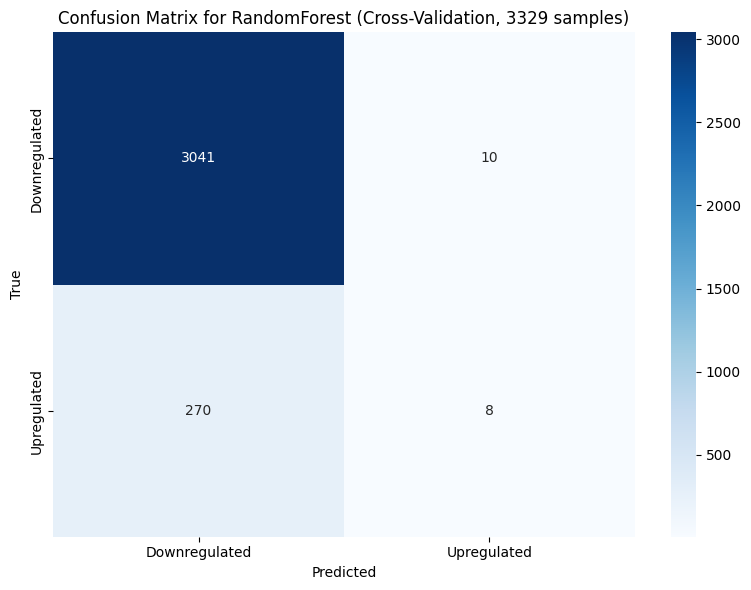

Confusion Matrix for RandomForest (Cross-Validation, Threshold=0.3):
[[2784  267]
 [ 186   92]]


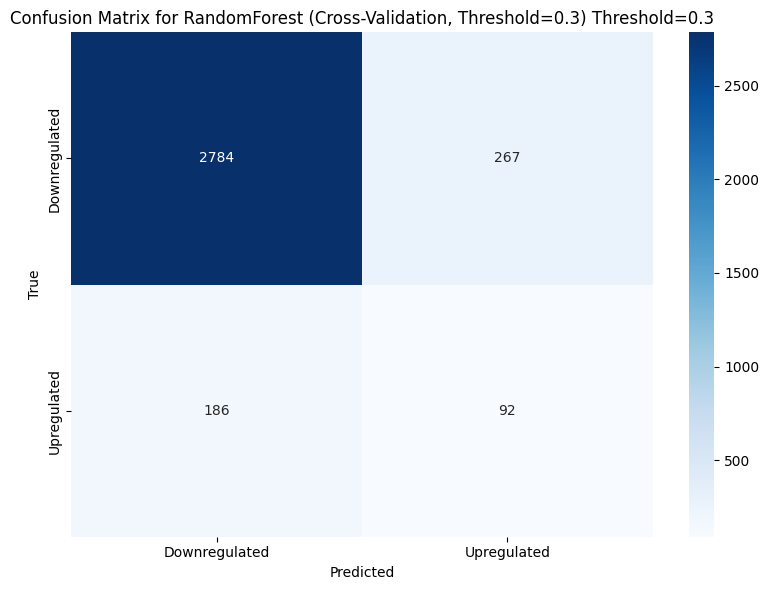

Final RandomForest AUC-ROC: 0.7555
Optimal ROC threshold (RandomForest CV): 0.2150
Confusion Matrix for RandomForest (Cross-Validation, Optimal Threshold=0.2150):
[[2097  954]
 [  83  195]]


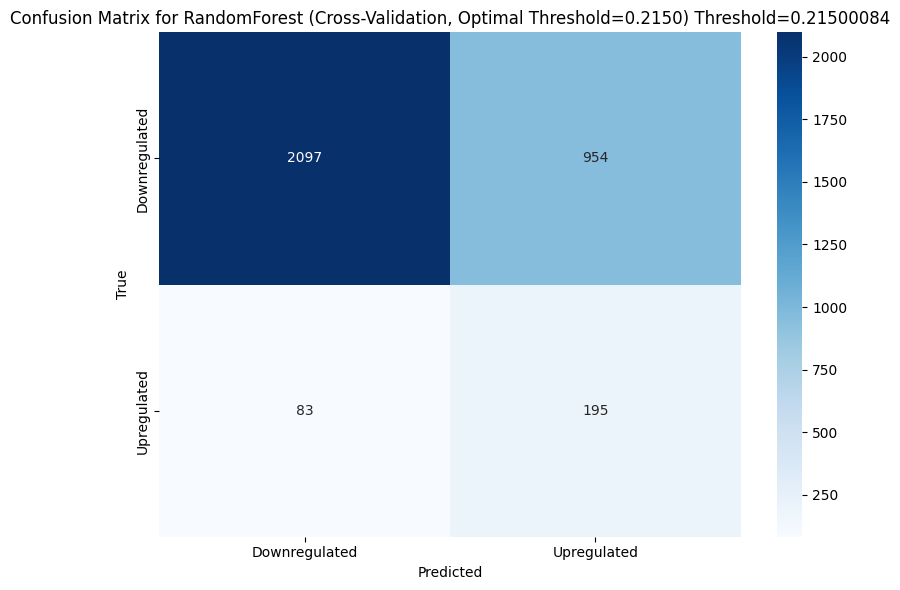

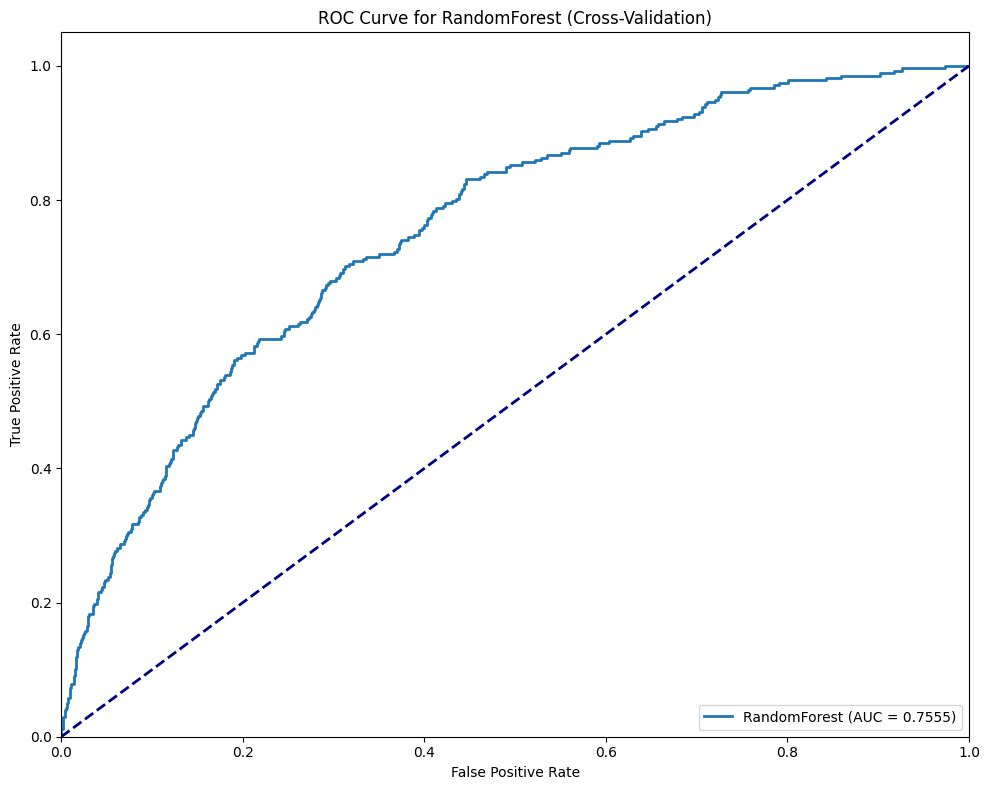

Final RandomForest Best Parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Final RandomForest test class counts: [830   3]
Final RandomForest test proba range: min=0.0294, max=0.5545

Metrics for RandomForest (Final Model, Test Set):
Sensitivity (Recall): 0.0118
Specificity: 0.9973
Accuracy: 0.8968
Balanced Accuracy: 0.5045
MCC: 0.0459
Precision: 0.3333
F1 Score: 0.0227
AUC-ROC: 0.7171
AUC-PR: 0.2376
Cohen’s Kappa: 0.0159
Log Loss: 0.3319
Confusion Matrix for RandomForest (Final Model, Test Set):
[[746   2]
 [ 84   1]]


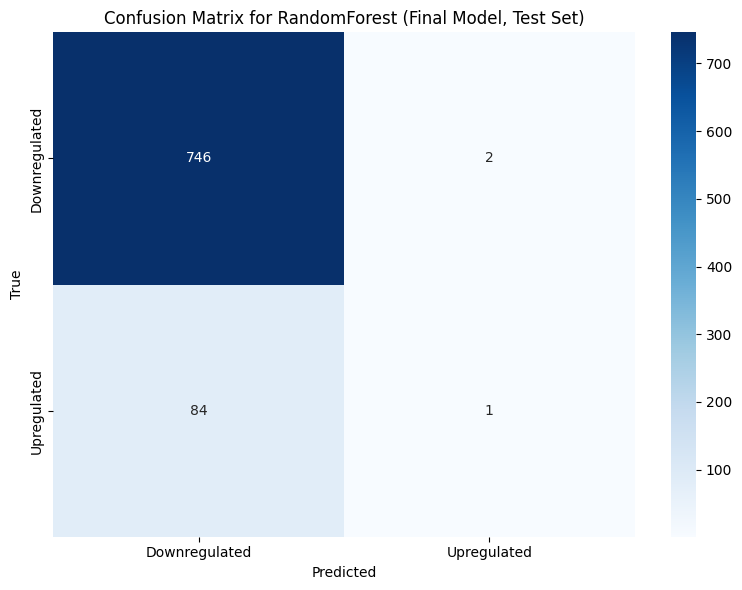

Confusion Matrix for RandomForest (Final Model, Threshold=0.3):
[[689  59]
 [ 61  24]]


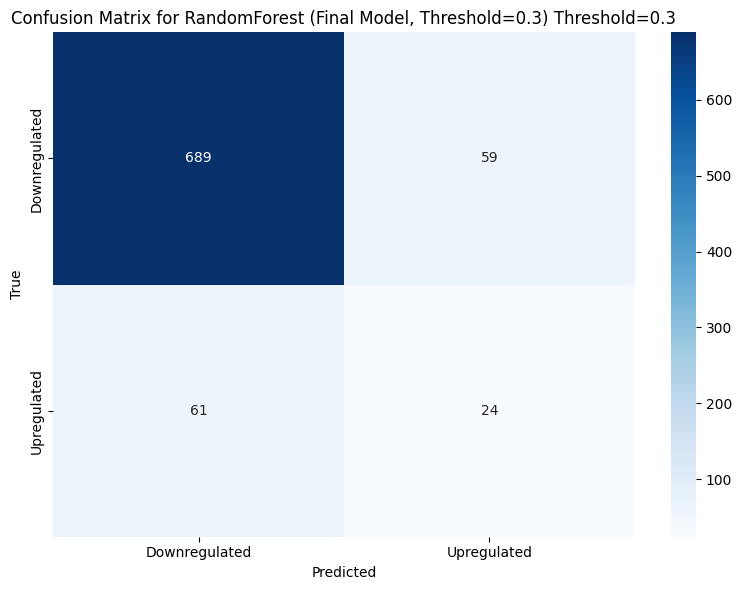

Final RandomForest AUC-ROC: 0.7171


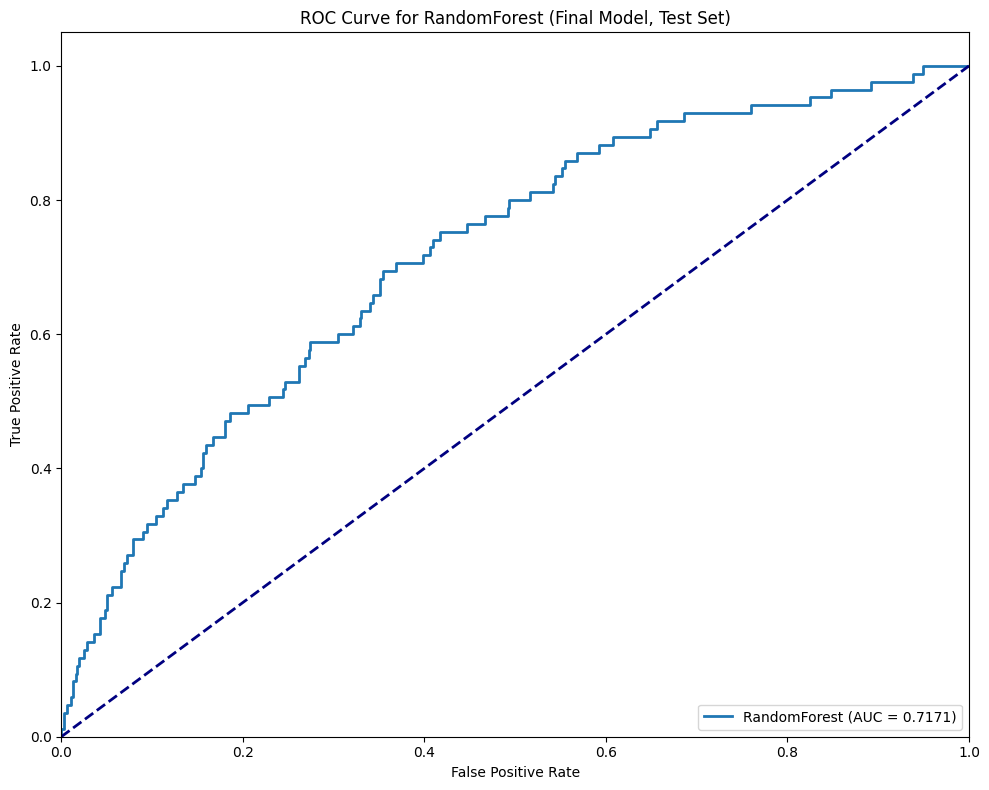

Final RandomForest Optimal ROC threshold: 0.1937
Confusion Matrix for RandomForest (Final Model, Optimal Threshold=0.1937):
[[483 265]
 [ 26  59]]


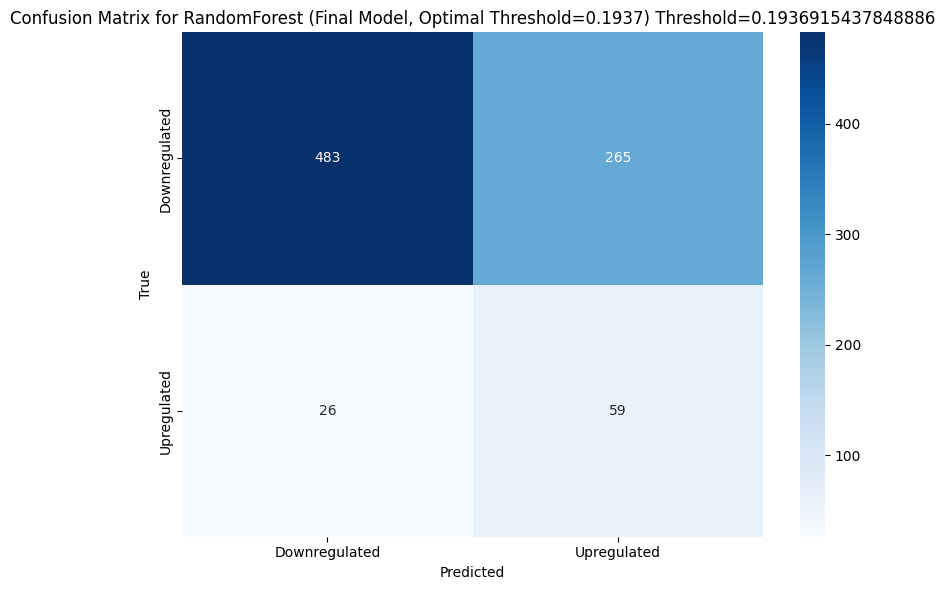

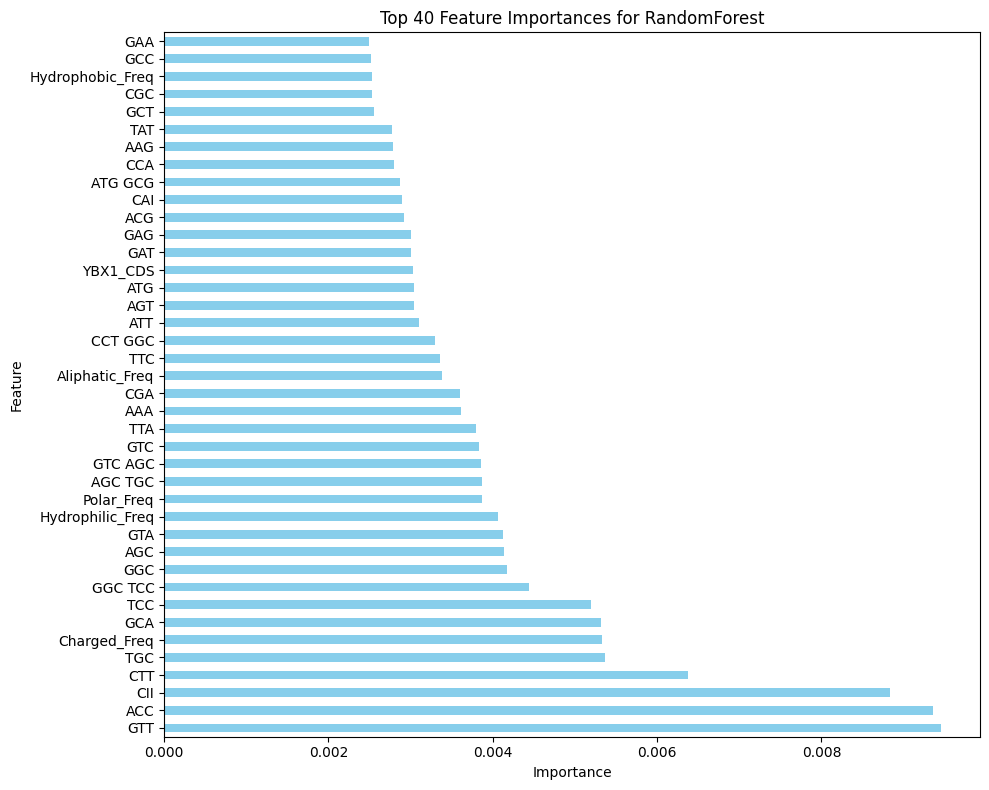

Top 40 feature importances for RandomForest:
GTT                 0.009457
ACC                 0.009356
CII                 0.008832
CTT                 0.006382
TGC                 0.005368
Charged_Freq        0.005329
GCA                 0.005316
TCC                 0.005191
GGC TCC             0.004438
GGC                 0.004170
AGC                 0.004142
GTA                 0.004129
Hydrophilic_Freq    0.004063
Polar_Freq          0.003872
AGC TGC             0.003865
GTC AGC             0.003860
GTC                 0.003828
TTA                 0.003790
AAA                 0.003617
CGA                 0.003601
Aliphatic_Freq      0.003385
TTC                 0.003353
CCT GGC             0.003302
ATT                 0.003107
AGT                 0.003047
ATG                 0.003040
YBX1_CDS            0.003025
GAT                 0.003007
GAG                 0.003004
ACG                 0.002919
CAI                 0.002898
ATG GCG             0.002875
CCA                 0.00279

 94%|=================== | 1573/1666 [00:11<00:00]       

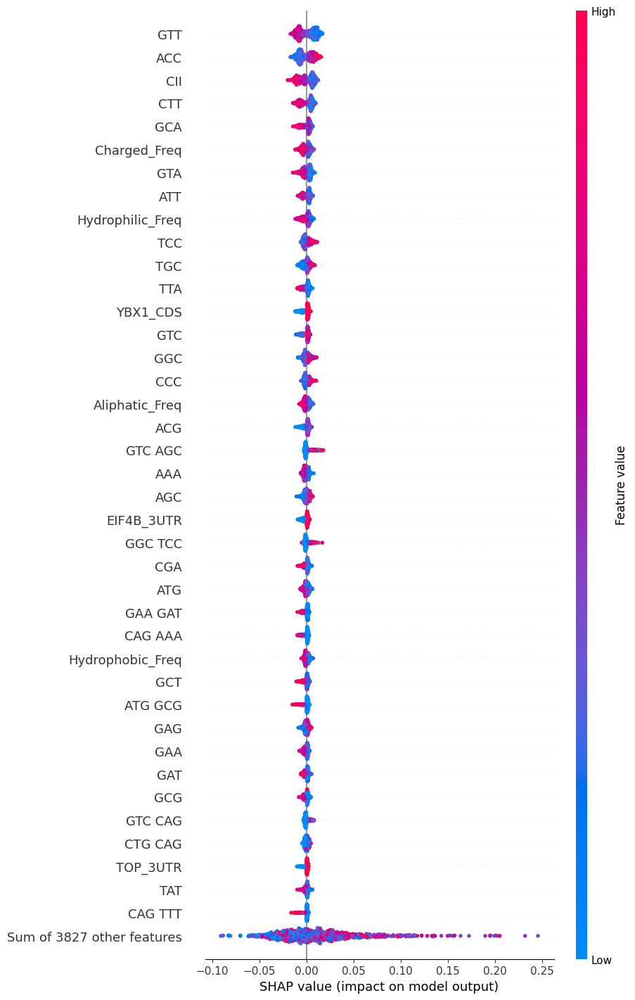

<Figure size 640x480 with 0 Axes>


=== Training XGBoost ===
Processing fold 1/5
Fold 1 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 1 class counts: [666]
Fold 1 proba range: min=0.0008, max=0.3128
Processing fold 2/5
Fold 2 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 2 class counts: [666]
Fold 2 proba range: min=0.0007, max=0.3387
Processing fold 3/5
Fold 3 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.1}
Fold 3 class counts: [666]
Fold 3 proba range: min=0.0005, max=0.3378
Processing fold 4/5
Fold 4 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 4 class counts: [666]
Fold 4 proba range: min=0.0009, max=0.3188
Processing fold 5/5
Fold 5 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 5 class counts: [665]
Fold 5 proba range: min=0.0006, max=0.2012
Final XGBoost 

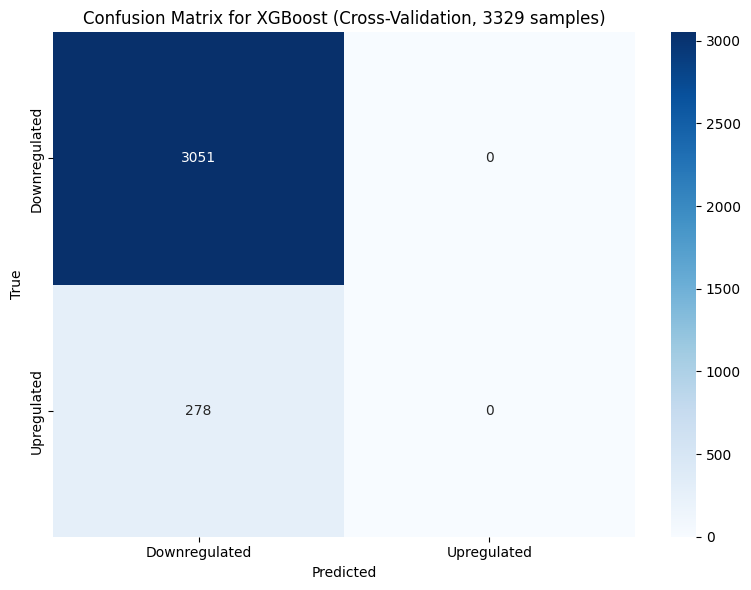

Confusion Matrix for XGBoost (Cross-Validation, Threshold=0.3):
[[3050    1]
 [ 275    3]]


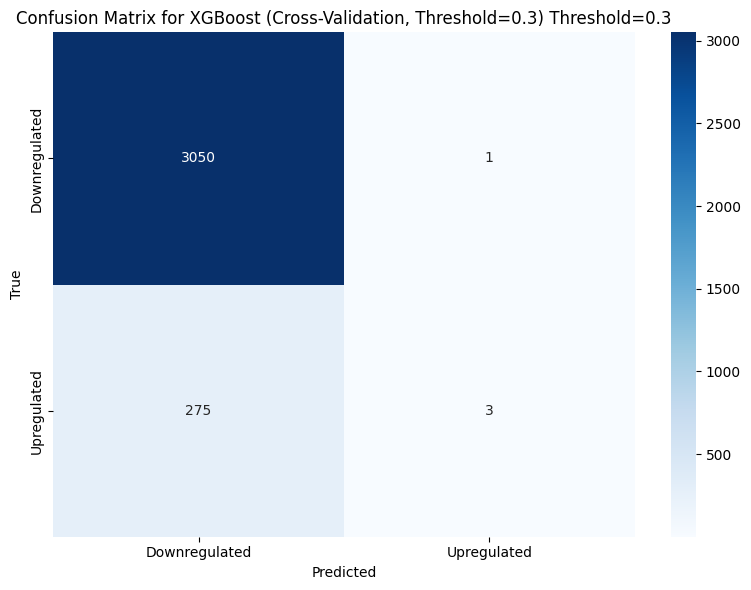

Final XGBoost AUC-ROC: 0.7581
Optimal ROC threshold (XGBoost CV): 0.0082
Confusion Matrix for XGBoost (Cross-Validation, Optimal Threshold=0.0082):
[[2119  932]
 [  78  200]]


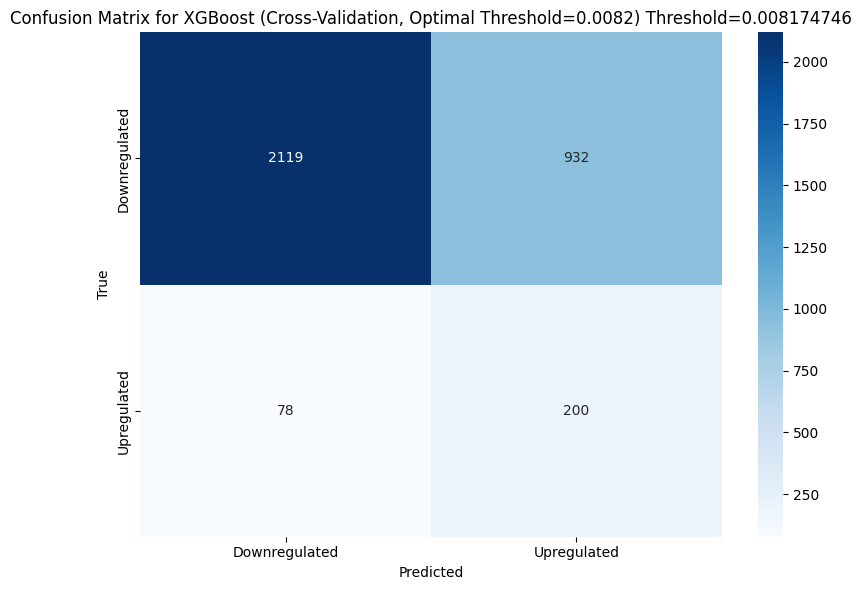

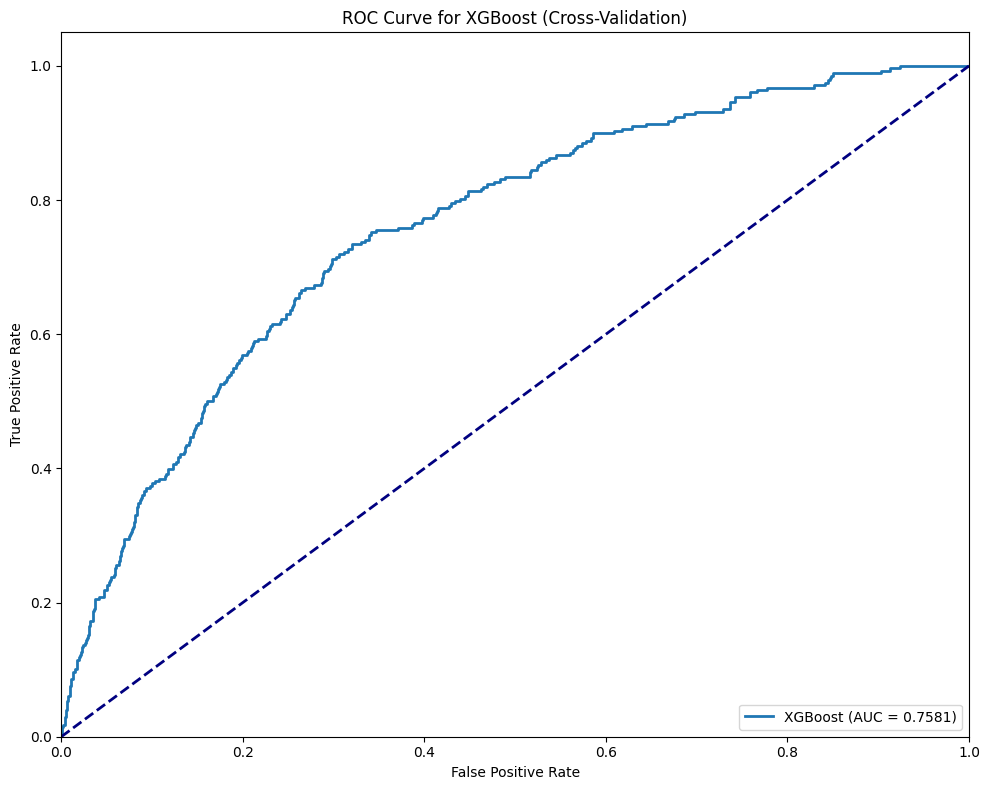

Final XGBoost Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Final XGBoost test class counts: [833]
Final XGBoost test proba range: min=0.0009, max=0.2735
Confusion Matrix for XGBoost (Final Model, Test Set):
[[748   0]
 [ 85   0]]


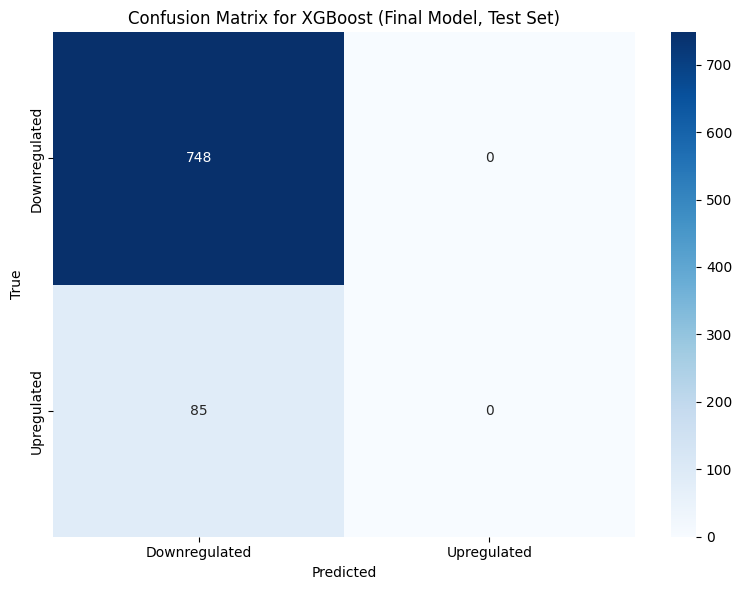

Confusion Matrix for XGBoost (Final Model, Threshold=0.3):
[[748   0]
 [ 85   0]]


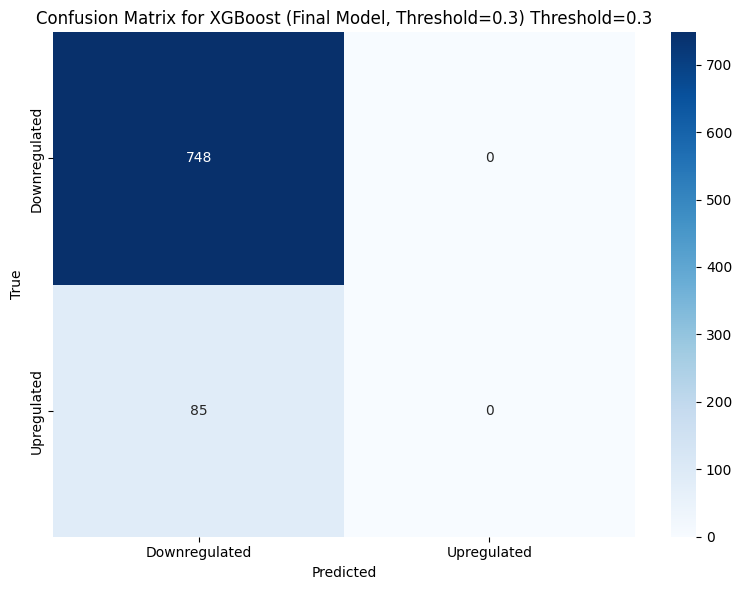

Final XGBoost AUC-ROC: 0.7382


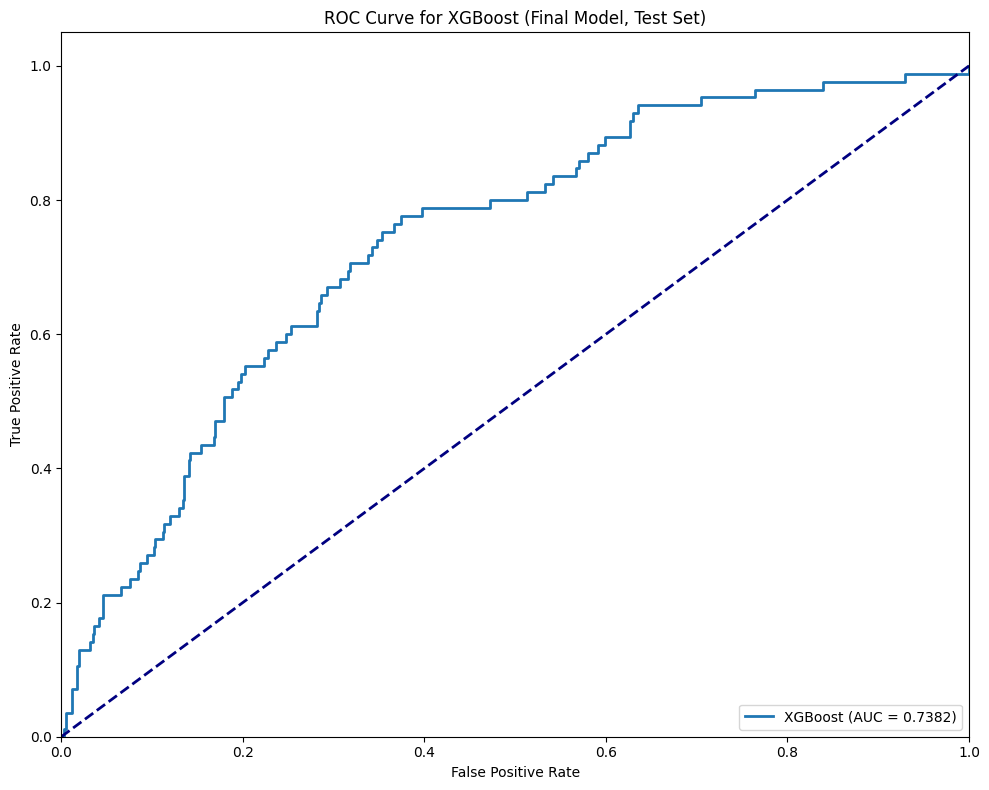

Final XGBoost Optimal ROC threshold: 0.0060
Confusion Matrix for XGBoost (Final Model, Optimal Threshold=0.0060):
[[468 280]
 [ 19  66]]


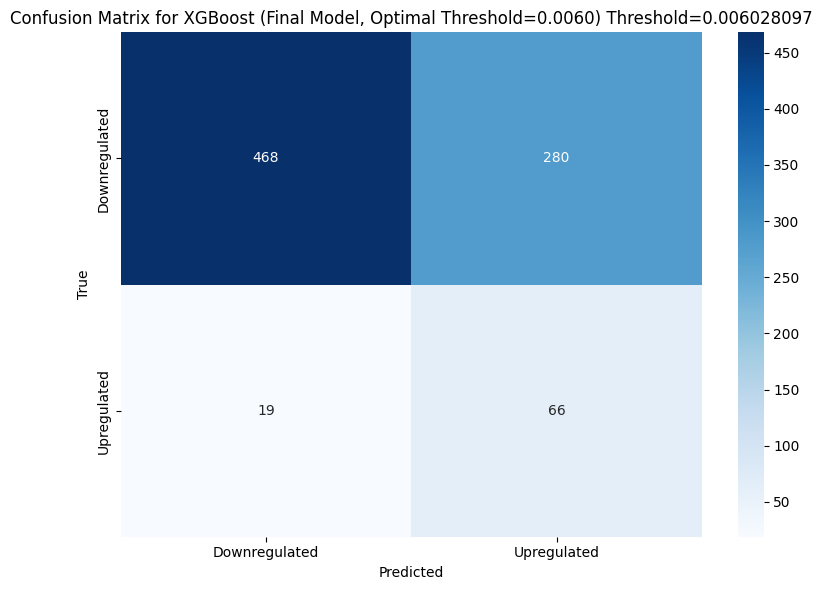

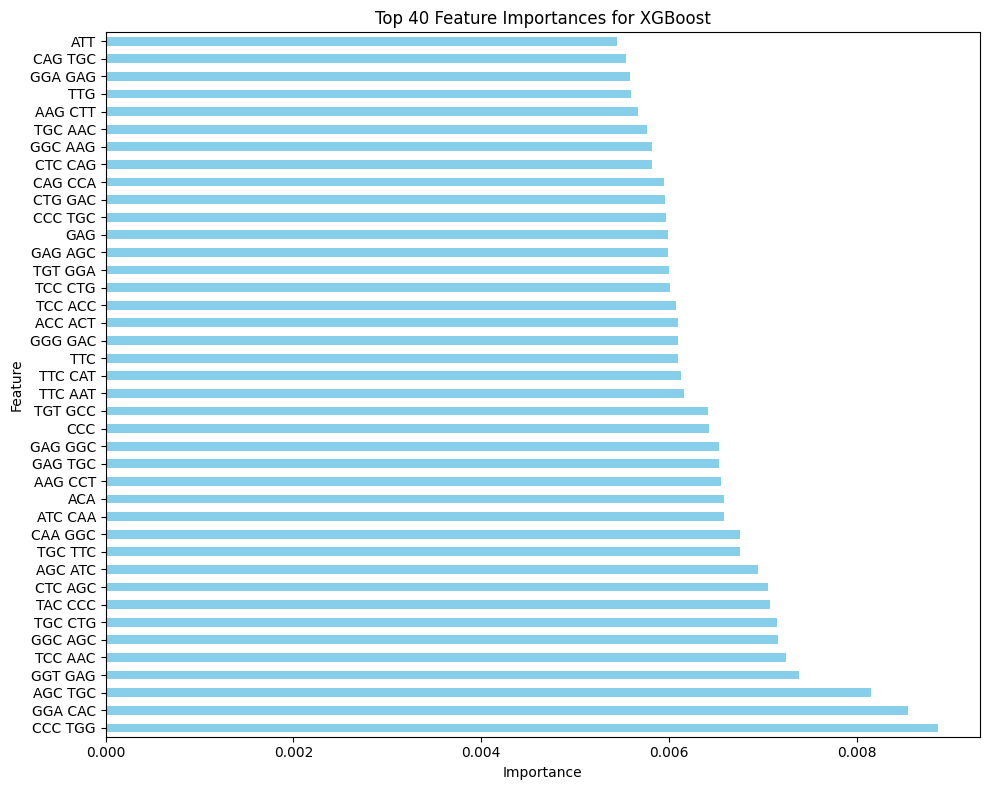

Top 40 feature importances for XGBoost:
CCC TGG    0.008870
GGA CAC    0.008548
AGC TGC    0.008153
GGT GAG    0.007385
TCC AAC    0.007243
GGC AGC    0.007159
TGC CTG    0.007150
TAC CCC    0.007076
CTC AGC    0.007060
AGC ATC    0.006950
TGC TTC    0.006760
CAA GGC    0.006753
ATC CAA    0.006589
ACA        0.006582
AAG CCT    0.006551
GAG TGC    0.006538
GAG GGC    0.006529
CCC        0.006426
TGT GCC    0.006417
TTC AAT    0.006164
TTC CAT    0.006128
TTC        0.006100
GGG GAC    0.006097
ACC ACT    0.006097
TCC ACC    0.006078
TCC CTG    0.006011
TGT GGA    0.006001
GAG AGC    0.005995
GAG        0.005986
CCC TGC    0.005971
CTG GAC    0.005959
CAG CCA    0.005945
CTC CAG    0.005818
GGC AAG    0.005815
TGC AAC    0.005764
AAG CTT    0.005672
TTG        0.005599
GGA GAG    0.005588
CAG TGC    0.005547
ATT        0.005448
SHAP: X_train shape: (2496, 3866), X_test shape: (833, 3866), feature_names_combined length: 3866


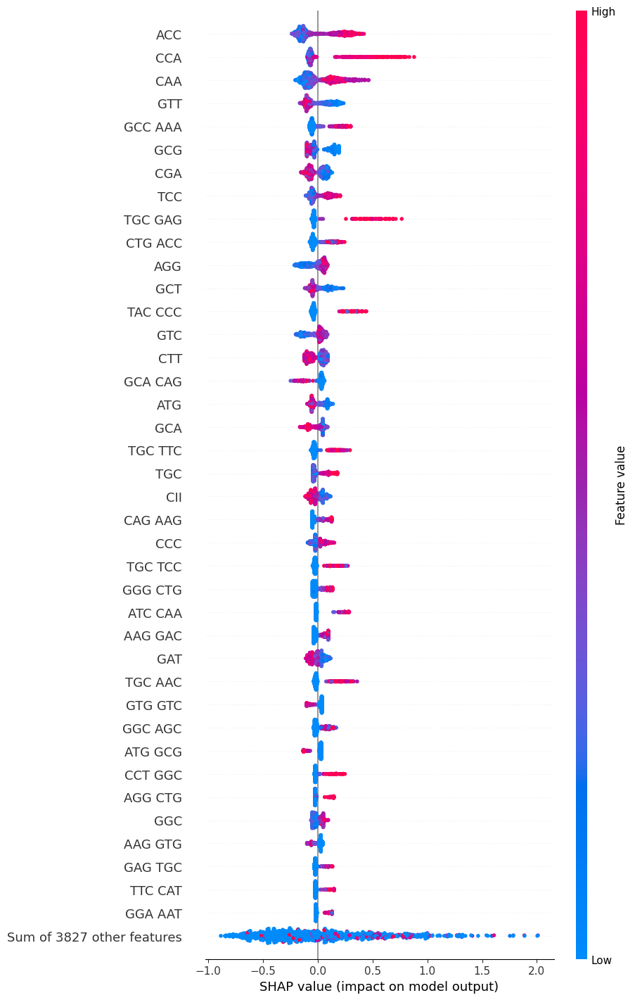

<Figure size 640x480 with 0 Axes>

In [9]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc, precision_score, recall_score, f1_score, matthews_corrcoef, cohen_kappa_score, log_loss, precision_recall_curve
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from joblib import Parallel, delayed
from itertools import chain
from xgboost import XGBClassifier
from scipy.sparse import csr_matrix

# Set up logging
logging.basicConfig(filename='rf_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Consolidated plotting function
def plot_confusion_matrix(y_true, y_pred, title, filename, model_name, threshold=None):
    cm = confusion_matrix(y_true, y_pred)
    print(f"{title}:\n{cm}")
    logging.info(f"{title}:\n{cm}")
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"{title}{' Threshold=' + str(threshold) if threshold else ''}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(f'{filename}.png', bbox_inches='tight')
    plt.show()
    plt.close()
    return cm

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}
AROMATIC_AAS = {'F', 'Y', 'W'}
POLAR_AAS = {'N', 'Q', 'S', 'T'}
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def compute_features(seq, weights):
    try:
        seq = seq.upper()
        if not seq:
            raise ValueError("Sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
        
        codons = [seq[i:i+3] for i in range(0, len(seq), 3)]
        total_codons = len([c for c in codons if c not in STOP_CODONS])
        
        # CAI
        sequence_weights = [weights[codon] for codon in codons if codon not in STOP_CODONS and codon not in NON_SYNONYMOUS_CODONS]
        cai = geometric_mean(sequence_weights) if sequence_weights else 0.0
        
        # CII
        destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
        cii = destabilizing_count / total_codons if total_codons > 0 else 0.0
        
        # Codon group frequencies
        aliphatic = sum(1 for codon in codons if codon in ALIPHATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        aromatic = sum(1 for codon in codons if codon in AROMATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        polar = sum(1 for codon in codons if codon in POLAR_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        charged = sum(1 for codon in codons if codon in CHARGED_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophobic = sum(1 for codon in codons if codon in HYDROPHOBIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophilic = sum(1 for codon in codons if codon in HYDROPHILIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        
        return cai, cii, aliphatic, aromatic, polar, charged, hydrophobic, hydrophilic
    except Exception as e:
        logging.error(f"Error computing features for sequence {seq[:30]}...: {e}")
        return 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

def load_fasta_sequences(up_file, down_file):
    sequences, labels, gene_ids = [], [], []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(label)
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                logging.error(f"Error reading {file_path}: {e}")
                return None, None, None
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            for record in SeqIO.parse(ref_file, 'fasta'):
                seq = str(record.seq).upper()
                if len(seq) >= 3:
                    seq = seq[:-3]
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                    logging.warning(f"Skipping reference {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                    continue
                ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            logging.error(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def load_motif_data(motif_file):
    try:
        motif_df = pd.read_csv(motif_file, sep='\t')
        print(f"Loaded motif data with {len(motif_df)} transcripts")
        print(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        logging.info(f"Loaded motif data with {len(motif_df)} transcripts")
        logging.info(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        print(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        logging.info(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        return motif_df
    except Exception as e:
        print(f"Error reading motif data: {e}")
        logging.error(f"Error reading motif data: {e}")
        return None

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

def compute_class_weights(labels):
    n_samples = len(labels)
    n_classes = len(np.unique(labels))
    class_counts = np.bincount(labels.astype(int))
    weights = n_samples / (n_classes * class_counts)
    return {0: weights[0], 1: weights[1]}

# Input file paths
# Input file paths
up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'
#up_file = "unt_vs_tgfb_de_genes_up_logFC_0.5.fasta"
#down_file = "unt_vs_tgfb_de_genes_down_logFC_0.5.fasta"
#ref_file = "mouse_transcriptome_cds.fasta"
ref_file = "tgfb_top100_highly_expressed_cds.fasta"
motif_file = "transcript_motif_status_all.txt"

# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    logging.error("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")
logging.info(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights.keys())[:5]})
    logging.info("Computed CAI weights successfully")
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    logging.error(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    logging.error("Failed to load FASTA files. Exiting.")
    exit(1)
print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")
if len(sequences) != 1934:
    print(f"Warning: Expected 1934 sequences, got {len(sequences)}")
    logging.warning(f"Expected 1934 sequences, got {len(sequences)}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Load motif data
motif_df = load_motif_data(motif_file)
if motif_df is None:
    print("Failed to load motif data. Exiting.")
    logging.error("Failed to load motif data. Exiting.")
    exit(1)

# Save motif transcript_ids
with open('motif_transcript_ids.txt', 'w') as f:
    f.write('\n'.join(motif_df['transcript_id'].astype(str)))

# Merge motif data with gene IDs
try:
    motif_df = motif_df.set_index('transcript_id')
    print(f"Motif_df shape before processing: {motif_df.shape}")
    logging.info(f"Motif_df shape before processing: {motif_df.shape}")
    # Drop non-numeric columns and convert to numeric
    motif_features = motif_df.drop(columns=['gene_name'], errors='ignore')
    non_numeric_cols = motif_features.select_dtypes(exclude=['float64', 'int64']).columns
    if non_numeric_cols.any():
        print(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        logging.warning(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        for col in non_numeric_cols:
            try:
                motif_features[col] = pd.to_numeric(motif_features[col], errors='coerce').fillna(0)
            except Exception as e:
                print(f"Error converting column {col} to numeric: {e}")
                logging.error(f"Error converting column {col} to numeric: {e}")
                motif_features = motif_features.drop(columns=[col])
    # Remove duplicates and align with gene_ids
    motif_features = motif_features.loc[~motif_features.index.duplicated(keep='first')]
    common_ids = set(motif_features.index).intersection(set(gene_ids))
    print(f"Number of common transcript IDs: {len(common_ids)}")
    logging.info(f"Number of common transcript IDs: {len(common_ids)}")
    if len(common_ids) < len(gene_ids):
        print(f"Warning: Only {len(common_ids)}/{len(gene_ids)} IDs match")
        logging.warning(f"Only {len(common_ids)}/{len(gene_ids)} IDs match")
        gene_ids_clean = [gid.strip() for gid in gene_ids]
        motif_ids_clean = [str(idx).strip() for idx in motif_features.index]
        common_ids = set(motif_ids_clean).intersection(set(gene_ids_clean))
        print(f"Number of common IDs after cleaning: {len(common_ids)}")
        logging.info(f"Number of common IDs after cleaning: {len(common_ids)}")
        if len(common_ids) == 0:
            raise ValueError("No common transcript IDs after cleaning")
    motif_features = motif_features.loc[list(common_ids)].reindex(gene_ids).fillna(0).astype(np.float32)
    # Save motif_features for inspection
    motif_features.to_csv('motif_features_pre_norm.txt', sep='\t', index_label='transcript_id')
    # Normalize motif features by prevalence
    motif_features = motif_features.div(motif_features.mean() + 1e-6)  # Avoid division by zero
    print(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    logging.info(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    # Check for TGFb motifs
    tgfb_motifs = [col for col in motif_features.columns if any(t in col.lower() for t in ['tgfb1', 'tgfb2', 'tgfb3'])]
    if tgfb_motifs:
        print(f"Warning: TGFb1/2/3 motifs detected: {tgfb_motifs}")
        logging.warning(f"TGFb1/2/3 motifs detected: {tgfb_motifs}")
        motif_features = motif_features.drop(columns=tgfb_motifs)
        print(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
        logging.info(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
    else:
        print("No TGFb1/2/3 motifs detected in motif features")
        logging.info("No TGFb1/2/3 motifs detected in motif features")
    # Compute and display motif feature counts
    feature_counts = pd.DataFrame({
        'Count_NonZero': (motif_features > 0).sum(),
        'Count_Zero': (motif_features == 0).sum(),
        'Prevalence_%': (motif_features > 0).mean() * 100
    })
    print("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    print(feature_counts.to_string())
    logging.info("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    logging.info(feature_counts.to_string())
except Exception as e:
    print(f"Error aligning motif data: {e}")
    logging.error(f"Error aligning motif data: {e}")
    exit(1)

# Debug motif features before processing
print("Motif features non-zero counts:", (motif_features != 0).sum().sum())
logging.info(f"Motif features non-zero counts: {(motif_features != 0).sum().sum()}")

# Compute sequence-derived features
try:
    features = Parallel(n_jobs=-1)(delayed(compute_features)(seq, ref_weights) for seq in sequences)
    cai_values, cii_values, aliphatic_freq, aromatic_freq, polar_freq, charged_freq, hydrophobic_freq, hydrophilic_freq = zip(*features)
    cai_values = np.array(cai_values, dtype=np.float32)
    cii_values = np.array(cii_values, dtype=np.float32)
    aliphatic_freq = np.array(aliphatic_freq, dtype=np.float32)
    aromatic_freq = np.array(aromatic_freq, dtype=np.float32)
    polar_freq = np.array(polar_freq, dtype=np.float32)
    charged_freq = np.array(charged_freq, dtype=np.float32)
    hydrophobic_freq = np.array(hydrophobic_freq, dtype=np.float32)
    hydrophilic_freq = np.array(hydrophilic_freq, dtype=np.float32)
except Exception as e:
    print(f"Error computing sequence features: {e}")
    logging.error(f"Error computing sequence features: {e}")
    exit(1)

# Scale sequence-derived features
scaler = StandardScaler()
sequence_features = np.hstack([
    cai_values[:, np.newaxis],
    cii_values[:, np.newaxis],
    aliphatic_freq[:, np.newaxis],
    aromatic_freq[:, np.newaxis],
    polar_freq[:, np.newaxis],
    charged_freq[:, np.newaxis],
    hydrophobic_freq[:, np.newaxis],
    hydrophilic_freq[:, np.newaxis]
])
sequence_features = scaler.fit_transform(sequence_features)
sequence_features = np.nan_to_num(sequence_features, nan=0.0, posinf=0.0, neginf=0.0)
sequence_feature_names = ['CAI', 'CII', 'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq', 'Hydrophobic_Freq', 'Hydrophilic_Freq']

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]
# Codon frequencies
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out()]
# Normalize codon counts (sparse matrix division)
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / sequence_lengths[:, np.newaxis])  # Keep sparse
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
# Convert to dense array for scaling
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Dicodon frequencies
dicodon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False, ngram_range=(2,2))
X_dicodon = dicodon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
dicodon_feature_names = [f"{d.replace('t', 'u').upper()}" for d in dicodon_vectorizer.get_feature_names_out()]
# Normalize dicodon counts
dicodon_lengths = np.array([max(1, (len(seq) // 3) - 1) for seq in sequences], dtype=np.float32)  # At least 1 to avoid division by zero
X_dicodon_normalized = X_dicodon.multiply(1 / dicodon_lengths[:, np.newaxis])  # Keep sparse
print(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}")
logging.info(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}")
# Convert to dense array for scaling
X_dicodon_scaled = scaler.fit_transform(X_dicodon_normalized.toarray())
X_dicodon_scaled = np.nan_to_num(X_dicodon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
# Save dicodon feature names for inspection
with open('dicodon_feature_names.txt', 'w') as f:
    f.write('\n'.join(dicodon_feature_names))

# Combine features (codon, dicodon, sequence, motif)
try:
    print(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    logging.info(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    X_combined = np.hstack([
        X_codon_scaled,
        X_dicodon_scaled,
        sequence_features,
        motif_features.values
    ], dtype=np.float32)
except Exception as e:
    print(f"Error combining features: {e}")
    logging.error(f"Error combining features: {e}")
    exit(1)

feature_names_combined = codon_feature_names + dicodon_feature_names + sequence_feature_names + list(motif_features.columns)
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined, index=gene_ids)

# Debug combined features
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
print("Motif features non-zero counts in X_combined:", (X_combined[:, -len(motif_features.columns):] != 0).sum())
print("Dicodon features non-zero counts in X_combined:", (X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum())
logging.info(f"NaNs in X_combined: {np.any(np.isnan(X_combined))}")
logging.info(f"Infs in X_combined: {np.any(np.isinf(X_combined))}")
logging.info(f"Motif features non-zero counts in X_combined: {(X_combined[:, -len(motif_features.columns):] != 0).sum()}")
logging.info(f"Dicodon features non-zero counts in X_combined: {(X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum()}")

# Feature selection (ensure motif features are included)
k_sequence = 50  # Increased to accommodate dicodon features
selector = SelectKBest(score_func=f_classif, k=k_sequence)
X_sequence_selected = selector.fit_transform(X_combined[:, :-len(motif_features.columns)], labels)
selected_indices = selector.get_support(indices=True)
selected_sequence_features = [feature_names_combined[i] for i in selected_indices]
selected_features = selected_sequence_features + list(motif_features.columns)
X_selected = np.hstack([
    X_sequence_selected,
    motif_features.values
], dtype=np.float32)
print(f"Selected {len(selected_features)} features: {selected_features}")
logging.info(f"Selected {len(selected_features)} features: {selected_features}")

# Debug selected features
print("Motif features non-zero counts in X_selected:", (X_selected[:, -len(motif_features.columns):] != 0).sum())
print("Dicodon features in selected features:", [f for f in selected_sequence_features if f in dicodon_feature_names])
logging.info(f"Motif features non-zero counts in X_selected: {(X_selected[:, -len(motif_features.columns):] != 0).sum()}")
logging.info(f"Dicodon features in selected features: {[f for f in selected_sequence_features if f in dicodon_feature_names]}")

# Save feature matrix
try:
    X_combined_df.to_csv('feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrix to feature_matrix.txt")
    logging.info("Saved feature matrix to feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrix: {e}")
    logging.error(f"Error saving feature matrix: {e}")

# Validate data
labels = np.array(labels, dtype=np.float32)
if X_combined_df.shape[0] != len(labels):
    raise ValueError(f"Mismatch: X_combined_df rows ({X_combined_df.shape[0]}) != labels ({len(labels)})")

# Compute class weights
class_weights = compute_class_weights(labels)
print(f"Class weights: {class_weights}")
logging.info(f"Class weights: {class_weights}")

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_combined_df, labels, test_size=0.25, random_state=42)
X_train = np.nan_to_num(X_train.values, nan=0.0, posinf=0.0, neginf=0.0)
X_test = np.nan_to_num(X_test.values, nan=0.0, posinf=0.0, neginf=0.0)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Debug data shapes
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
print(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")
logging.info(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
logging.info(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")

# Define model configurations
model_config = {
    'RandomForest': {
        'clf': RandomForestClassifier(random_state=42, class_weight='balanced', n_jobs=-1),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [10, 20],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2],
            'max_features': ['sqrt']
        }
    },
    'XGBoost': {
        'clf': XGBClassifier(random_state=42, n_jobs=-1, scale_pos_weight=class_weights[0]/class_weights[1]),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [3, 6],
            'learning_rate': [0.1],
            'subsample': [0.8]
        }
    }
}

# Train and evaluate models
for model_name in ['RandomForest', 'XGBoost']:
    config = model_config[model_name]
    print(f"\n=== Training {model_name} ===")
    logging.info(f"Training {model_name}")

    y_true_all = np.zeros(len(labels), dtype=np.float32)
    y_pred_all = np.zeros(len(labels), dtype=np.float32)
    y_proba_all = np.zeros(len(labels), dtype=np.float32)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_combined_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_combined_df.iloc[train_idx].values.astype(np.float32)
        y_train_fold = labels[train_idx].astype(np.float32)
        X_test_fold = X_combined_df.iloc[test_idx].values.astype(np.float32)
        y_test_fold = labels[test_idx].astype(np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        grid_search = RandomizedSearchCV(
            estimator=config['clf'],
            param_distributions=config['param_grid'],
            n_iter=10,
            cv=3,
            scoring='balanced_accuracy',
            n_jobs=-1,
            random_state=42,
            error_score='raise'
        )
        try:
            grid_search.fit(X_train_fold, y_train_fold)
            print(f"Fold {fold} Best Parameters: {grid_search.best_params_}")
            logging.info(f"Fold {fold} parameters: {grid_search.best_params_}")
            model = grid_search.best_estimator_
        except Exception as e:
            print(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            logging.error(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            continue
        
        try:
            model.fit(X_train_fold, y_train_fold)
            y_pred_fold = model.predict(X_test_fold)
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
            print(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            print(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
            logging.info(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            logging.info(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
        except Exception as e:
            print(f"Prediction failed for fold {fold}: {e}")
            logging.error(f"Prediction failed for fold {fold}: {e}")
            continue
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold

    # Debug predictions
    print(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    print(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")
    logging.info(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    logging.info(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")

    # Confusion matrix for cross-validation
    plot_confusion_matrix(y_true_all, y_pred_all, 
                          f"Confusion Matrix for {model_name} (Cross-Validation, {len(labels)} samples)",
                          f'confusion_matrix_{model_name.lower()}_cv', model_name)

    # Adjusted threshold confusion matrix (CV)
    y_pred_adjusted_cv = (y_proba_all >= 0.3).astype(np.float32)
    plot_confusion_matrix(y_true_all, y_pred_adjusted_cv,
                          f"Confusion Matrix for {model_name} (Cross-Validation, Threshold=0.3)",
                          f'confusion_matrix_{model_name.lower()}_cv_threshold_0.3', model_name, threshold=0.3)

    # ROC curve for cross-validation
    try:
        fpr, tpr, thresholds = roc_curve(y_true_all, y_proba_all)
        roc_auc = auc(fpr, tpr)
        print(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        logging.info(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]
        print(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        logging.info(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        y_pred_optimal = (y_proba_all >= optimal_threshold).astype(np.float32)
        plot_confusion_matrix(y_true_all, y_pred_optimal,
                              f"Confusion Matrix for {model_name} (Cross-Validation, Optimal Threshold={optimal_threshold:.4f})",
                              f'confusion_matrix_{model_name.lower()}_cv_optimal', model_name, threshold=optimal_threshold)
        
        plt.figure(figsize=(10, 8))
        plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.4f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name} (Cross-Validation)')
        plt.legend(loc="lower right")
        plt.tight_layout()
        plt.savefig(f'roc_curve_{model_name.lower()}_cv.png', bbox_inches='tight')
        plt.show()
        plt.close()
    except Exception as e:
        print(f"ROC failed for {model_name} CV: {e}")
        logging.error(f"ROC failed for {model_name} CV: {e}")

    # Final model training
    grid_search = RandomizedSearchCV(
        estimator=config['clf'],
        param_distributions=config['param_grid'],
        n_iter=10,
        cv=3,
        scoring='balanced_accuracy',
        n_jobs=-1,
        random_state=42,
        error_score='raise'
    )
    try:
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print(f"Final {model_name} Best Parameters: {grid_search.best_params_}")
        logging.info(f"Final {model_name}: {grid_search.best_params_}")
    except Exception as e:
        print(f"Final {model_name} training failed: {e}")
        logging.error(f"Final {model_name} training failed: {e}")
        final_model = None

    if final_model:
        try:
            final_model.fit(X_train, y_train)
            y_pred_final = final_model.predict(X_test)
            y_proba_final = final_model.predict_proba(X_test)[:, 1]
            print(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            print(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")
            logging.info(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            logging.info(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")

            # Compute and print additional metrics for final model
            unique_classes = np.unique(y_pred_final)
            if len(unique_classes) < 2:
                print(f"Warning: {model_name} final model predicted only one class. Skipping metrics.")
                logging.warning(f"{model_name} final model predicted only one class. Skipping metrics.")
            else:
                tn, fp, fn, tp = confusion_matrix(y_test, y_pred_final).ravel()
                sensitivity = recall_score(y_test, y_pred_final, pos_label=1)
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
                accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0
                mcc = matthews_corrcoef(y_test, y_pred_final)
                precision = precision_score(y_test, y_pred_final, pos_label=1)
                recall = sensitivity
                f1 = f1_score(y_test, y_pred_final, pos_label=1)
                auc_roc = roc_auc_score(y_test, y_proba_final)
                precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_proba_final)
                auc_pr = auc(recall_vals, precision_vals)
                balanced_accuracy = (sensitivity + specificity) / 2
                kappa = cohen_kappa_score(y_test, y_pred_final)
                logloss = log_loss(y_test, y_proba_final)
                
                metrics_str = (f"\nMetrics for {model_name} (Final Model, Test Set):\n"
                              f"Sensitivity (Recall): {sensitivity:.4f}\n"
                              f"Specificity: {specificity:.4f}\n"
                              f"Accuracy: {accuracy:.4f}\n"
                              f"Balanced Accuracy: {balanced_accuracy:.4f}\n"
                              f"MCC: {mcc:.4f}\n"
                              f"Precision: {precision:.4f}\n"
                              f"F1 Score: {f1:.4f}\n"
                              f"AUC-ROC: {auc_roc:.4f}\n"
                              f"AUC-PR: {auc_pr:.4f}\n"
                              f"Cohen’s Kappa: {kappa:.4f}\n"
                              f"Log Loss: {logloss:.4f}")
                print(metrics_str)
                logging.info(metrics_str)

            # Confusion matrix for final model
            plot_confusion_matrix(y_test, y_pred_final, 
                                  f"Confusion Matrix for {model_name} (Final Model, Test Set)",
                                  f'confusion_matrix_{model_name.lower()}_final', model_name)

            # Adjusted threshold confusion matrix (final)
            y_pred_adjusted_final = (y_proba_final >= 0.3).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_adjusted_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Threshold=0.3)",
                                  f'confusion_matrix_{model_name.lower()}_final_threshold_0.3', model_name, threshold=0.3)

            # ROC curve for final model
            fpr_final, tpr_final, thresholds_final = roc_curve(y_test, y_proba_final)
            roc_auc_final = auc(fpr_final, tpr_final)
            print(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            logging.info(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            
            plt.figure(figsize=(10, 8))
            plt.plot(fpr_final, tpr_final, lw=2, label=f'{model_name} (AUC = {roc_auc_final:.4f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve for {model_name} (Final Model, Test Set)')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'roc_curve_{model_name.lower()}_final.png', bbox_inches='tight')
            plt.show()
            plt.close()

            # Optimal threshold confusion matrix (final)
            optimal_idx_final = np.argmax(tpr_final - fpr_final)
            optimal_threshold_final = thresholds_final[optimal_idx_final]
            print(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            logging.info(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            y_pred_optimal_final = (y_proba_final >= optimal_threshold_final).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_optimal_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Optimal Threshold={optimal_threshold_final:.4f})",
                                  f'confusion_matrix_{model_name.lower()}_final_optimal', model_name, threshold=optimal_threshold_final)

            # Feature importance plot
            try:
                feature_importance = pd.Series(final_model.feature_importances_, index=feature_names_combined)
                top_features = feature_importance.nlargest(40)
                plt.figure(figsize=(10, 8))
                top_features.plot(kind='barh', color='skyblue')
                plt.title(f'Top 40 Feature Importances for {model_name}')
                plt.xlabel('Importance')
                plt.ylabel('Feature')
                plt.tight_layout()
                plt.savefig(f'feature_importance_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
                print(f"Top 40 feature importances for {model_name}:")
                print(top_features.to_string())
                logging.info(f"Top 40 feature importances for {model_name}:")
                logging.info(top_features.to_string())
            except Exception as e:
                print(f"Feature importance plot failed for {model_name}: {e}")
                logging.error(f"Feature importance plot failed for {model_name}: {e}")

            # SHAP analysis
            try:
                print(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, feature_names_combined length: {len(feature_names_combined)}")
                logging.info(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, feature_names_combined length: {len(feature_names_combined)}")
                explainer = shap.TreeExplainer(final_model, X_train, check_additivity=False)
                shap_values = explainer.shap_values(X_test)
                shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
                base_value = explainer.expected_value[1] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value
                shap_explanation = shap.Explanation(
                    values=shap_values_class1,
                    base_values=np.full(X_test.shape[0], float(base_value)),
                    data=X_test,
                    feature_names=feature_names_combined
                )
                plt.figure(figsize=(10, 5))
                shap.plots.beeswarm(shap_explanation, max_display=40)
                plt.tight_layout()
                plt.savefig(f'shap_beeswarm_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
            except Exception as e:
                print(f"TreeExplainer failed for {model_name}: {e}")
                logging.error(f"TreeExplainer failed for {model_name}: {e}")
                # Fallback to KernelExplainer
                try:
                    print(f"Attempting KernelExplainer for {model_name}...")
                    logging.info(f"Attempting KernelExplainer for {model_name}...")
                    X_test_subset = X_test[:50]  # Reduced for speed
                    def predict_proba(X):
                        return final_model.predict_proba(X)[:, 1]
                    explainer = shap.KernelExplainer(predict_proba, X_train[:50], link="logit")
                    shap_values = explainer.shap_values(X_test_subset, nsamples=50)
                    shap_explanation = shap.Explanation(
                        values=shap_values,
                        base_values=explainer.expected_value,
                        data=X_test_subset,
                        feature_names=feature_names_combined
                    )
                    plt.figure(figsize=(10, 5))
                    shap.plots.beeswarm(shap_explanation, max_display=50)
                    plt.tight_layout()
                    plt.savefig(f'shap_beeswarm_{model_name.lower()}_kernel.png', bbox_inches='tight')
                    plt.show()
                    plt.close()
                except Exception as sub_e:
                    print(f"KernelExplainer failed for {model_name}: {sub_e}")
                    logging.error(f"KernelExplainer failed for {model_name}: {sub_e}")
        except Exception as e:
            print(f"Final {model_name} training or prediction failed: {e}")
            logging.error(f"Final {model_name} training or prediction failed: {e}")

Loaded 100 reference sequences from tgfb_top100_highly_expressed_cds.fasta
Reference weights (sample): {'TTT': 0.4787175234936429, 'TTC': 0.6904367053620785, 'TTA': 0.14870093974571585, 'TTG': 0.38142620232172475, 'CTT': 0.37202874516307355}
Loaded 3329 sequences: 278 upregulated, 3051 downregulated
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
Loaded motif data with 20974 transcripts
Sample of motif_df (first 5 rows):
        transcript_id gene_name  ACO1_CDS  ACO1_5UTR  ACO1_3UTR  EIF4B_CDS  EIF4B_5UTR  EIF4B_3UTR  FXR2_CDS  FXR2_5UTR  FXR2_3UTR  TOP_CDS  TOP_5UTR  TOP_3UTR  YBX1_CDS  YBX1_5UTR  YBX1_3UTR  ZC3H10_CDS  ZC3H10_5UTR  ZC3H10_3UTR
0  ENSMUST00000180369     Rpp14         1          0          0          1           0           0         0          0          0        1         0         0         0          0          0           0            0            0
1  ENSMUST00000032315  Ta

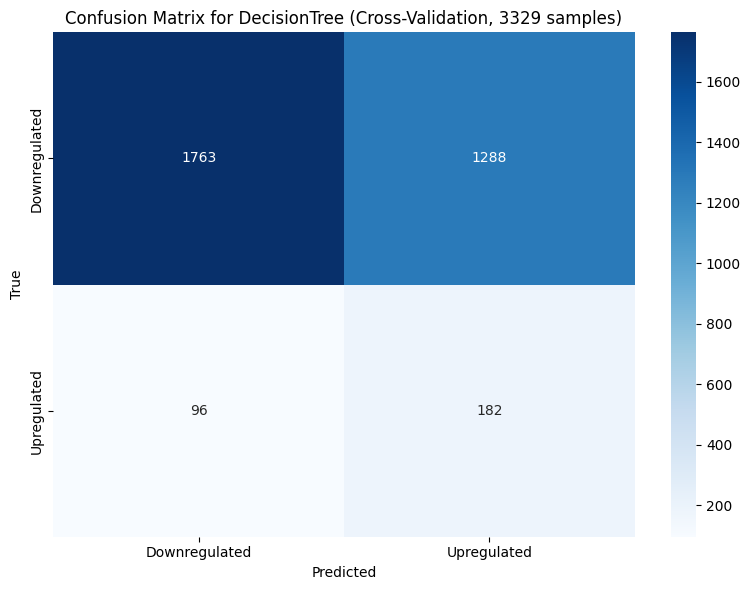

Confusion Matrix for DecisionTree (Cross-Validation, Threshold=0.3):
[[1612 1439]
 [  85  193]]


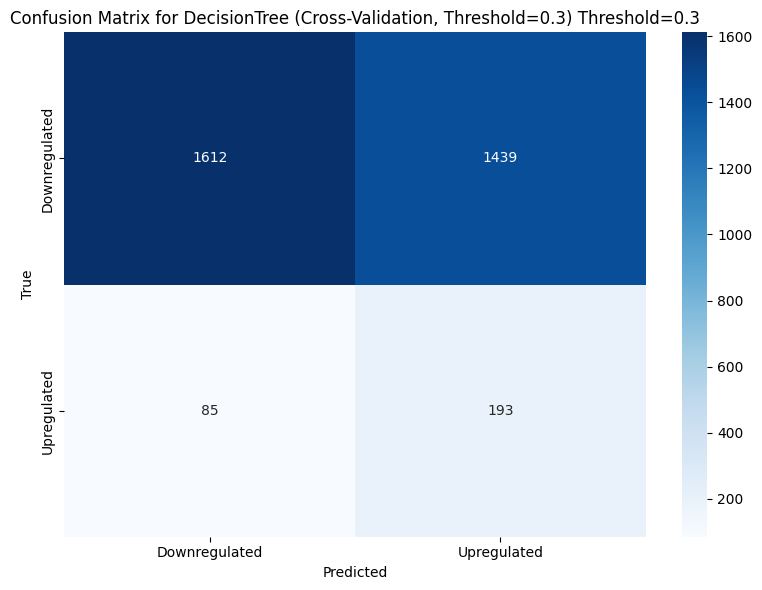

Final DecisionTree AUC-ROC: 0.6306
Optimal ROC threshold (DecisionTree CV): 0.5515
Confusion Matrix for DecisionTree (Cross-Validation, Optimal Threshold=0.5515):
[[2103  948]
 [ 122  156]]


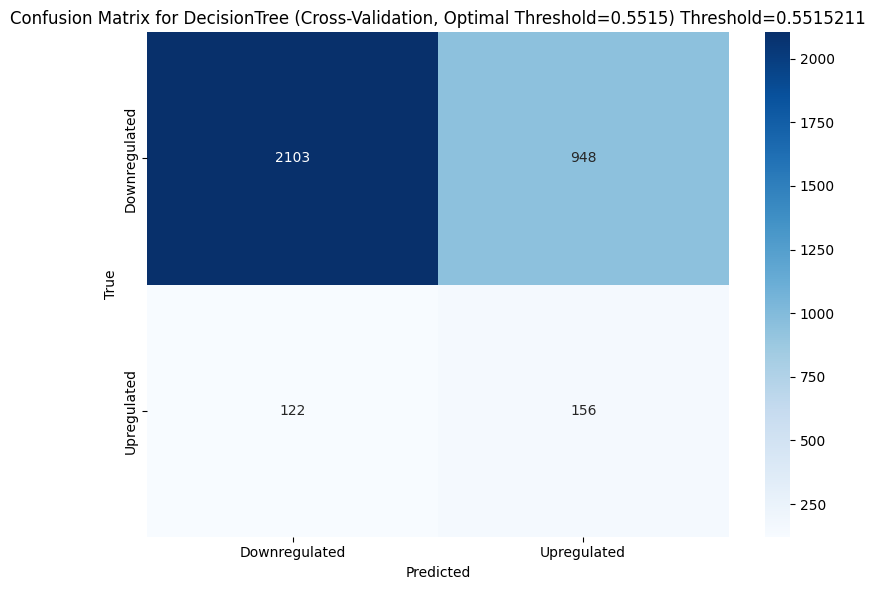

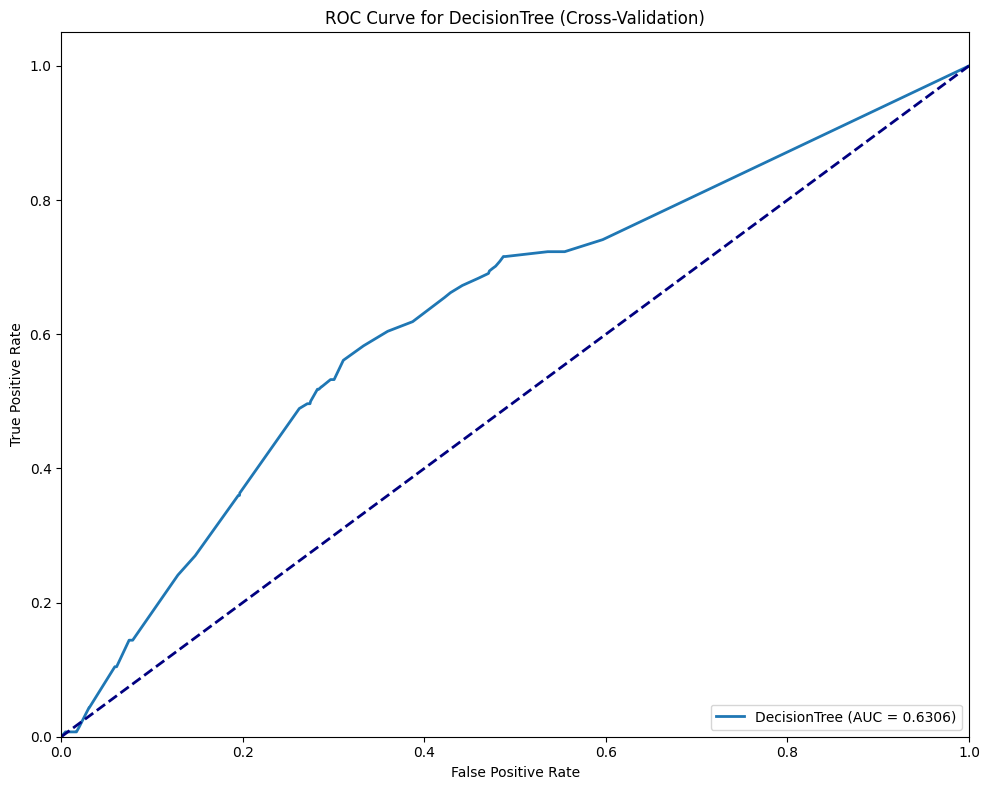

Final DecisionTree Best Parameters: {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Final DecisionTree test class counts: [530 303]
Final DecisionTree test proba range: min=0.0000, max=1.0000

Metrics for DecisionTree (Final Model, Test Set):
Sensitivity (Recall): 0.6353
Specificity: 0.6671
Accuracy: 0.6639
Balanced Accuracy: 0.6512
MCC: 0.1903
Precision: 0.1782
F1 Score: 0.2784
AUC-ROC: 0.6645
AUC-PR: 0.1577
Cohen’s Kappa: 0.1415
Log Loss: 1.7541
Confusion Matrix for DecisionTree (Final Model, Test Set):
[[499 249]
 [ 31  54]]


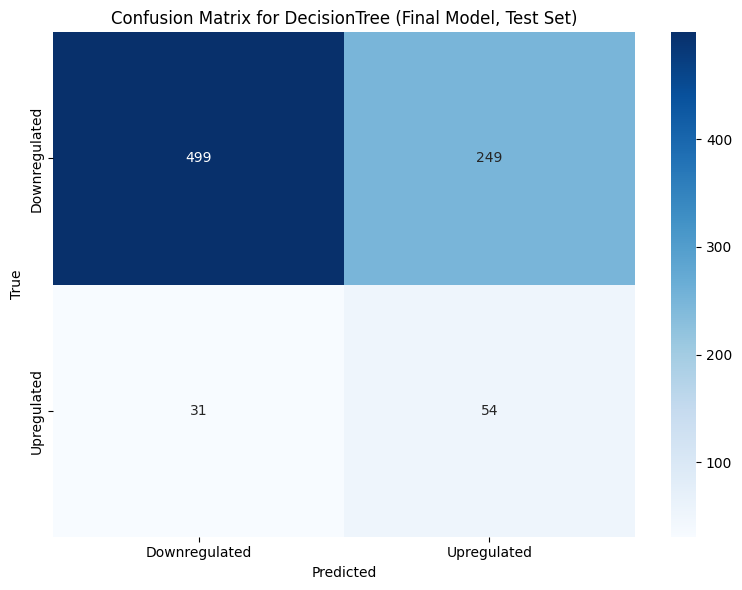

Confusion Matrix for DecisionTree (Final Model, Threshold=0.3):
[[493 255]
 [ 30  55]]


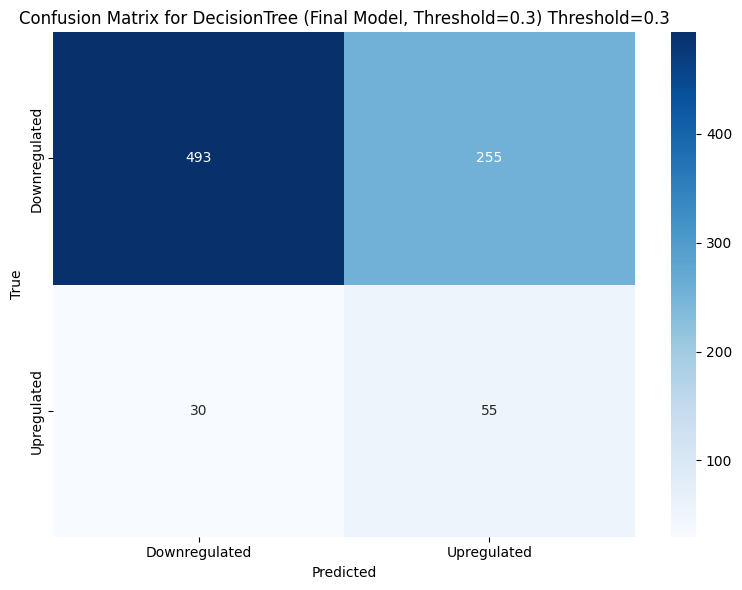

Final DecisionTree AUC-ROC: 0.6645


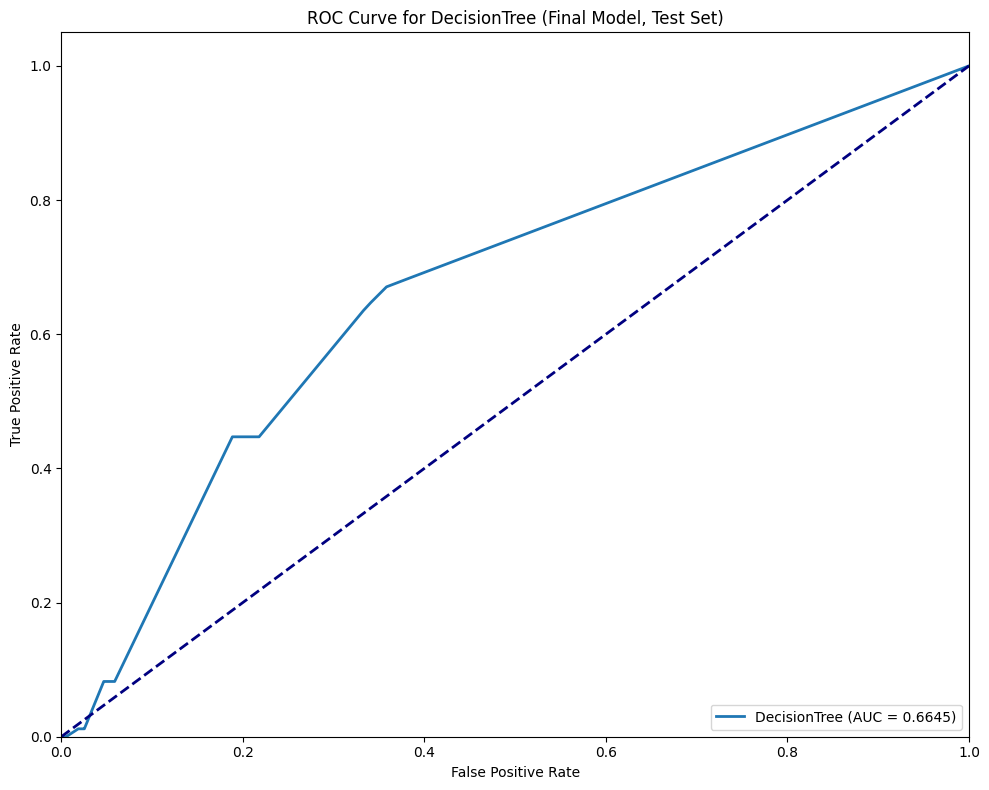

Final DecisionTree Optimal ROC threshold: 0.1810
Confusion Matrix for DecisionTree (Final Model, Optimal Threshold=0.1810):
[[480 268]
 [ 28  57]]


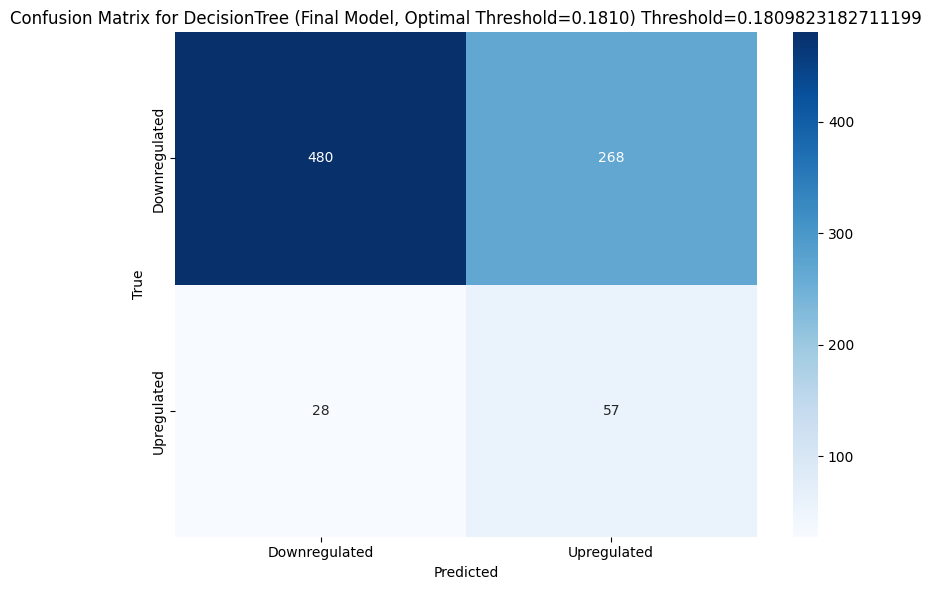

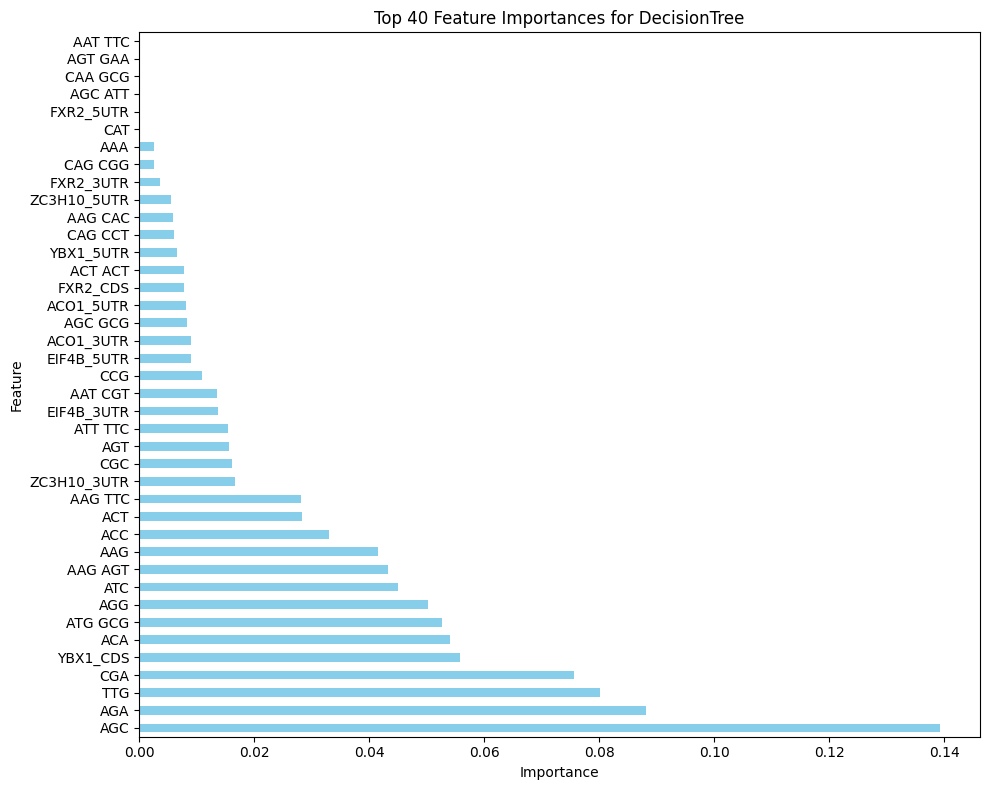

Top 40 feature importances for DecisionTree:
AGC            1.392147e-01
AGA            8.817317e-02
TTG            8.013424e-02
CGA            7.564245e-02
YBX1_CDS       5.580928e-02
ACA            5.407238e-02
ATG GCG        5.264271e-02
AGG            5.018195e-02
ATC            4.500894e-02
AAG AGT        4.326344e-02
AAG            4.147342e-02
ACC            3.304637e-02
ACT            2.825107e-02
AAG TTC        2.812226e-02
ZC3H10_3UTR    1.669130e-02
CGC            1.617798e-02
AGT            1.565972e-02
ATT TTC        1.547588e-02
EIF4B_3UTR     1.374071e-02
AAT CGT        1.349200e-02
CCG            1.090882e-02
EIF4B_5UTR     9.072769e-03
ACO1_3UTR      9.019383e-03
AGC GCG        8.287417e-03
ACO1_5UTR      8.061538e-03
FXR2_CDS       7.734503e-03
ACT ACT        7.703634e-03
YBX1_5UTR      6.474631e-03
CAG CCT        6.087894e-03
AAG CAC        5.916559e-03
ZC3H10_5UTR    5.574973e-03
FXR2_3UTR      3.660090e-03
CAG CGG        2.646351e-03
AAA            2.577434e-03
CAT

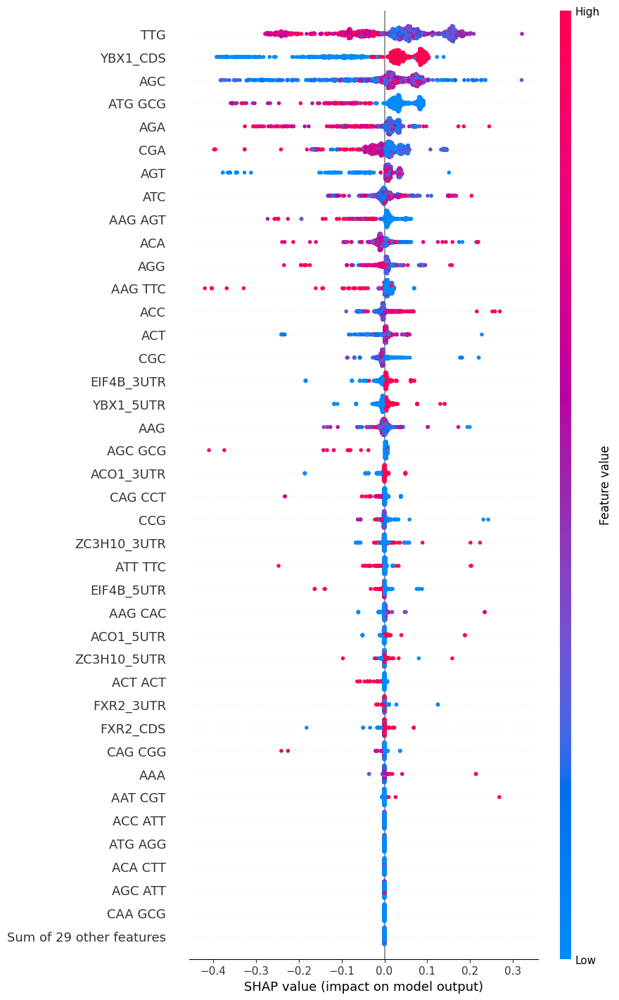

<Figure size 640x480 with 0 Axes>


=== Training LogisticRegression ===
Processing fold 1/5
Fold 1 Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.1}
Fold 1 class counts: [455 211]
Fold 1 proba range: min=0.0000, max=0.9272
Processing fold 2/5
Fold 2 Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 10}
Fold 2 class counts: [411 255]
Fold 2 proba range: min=0.0000, max=0.9602
Processing fold 3/5
Fold 3 Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 1}
Fold 3 class counts: [428 238]
Fold 3 proba range: min=0.0000, max=0.9719
Processing fold 4/5
Fold 4 Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.1}
Fold 4 class counts: [425 241]
Fold 4 proba range: min=0.0013, max=0.9518
Processing fold 5/5
Fold 5 Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.1}
Fold 5 class counts: [402 263]
Fold 5 proba range: min=0.0005, max=0.9357
Final LogisticRegression CV class counts: [2121 1208]
Final LogisticRegression CV proba range: min=0.0000, max=0.9719
Con

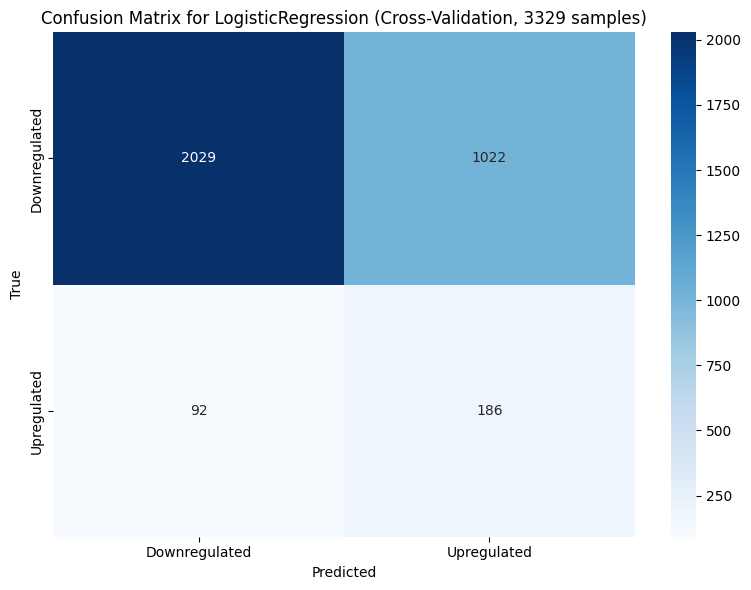

Confusion Matrix for LogisticRegression (Cross-Validation, Threshold=0.3):
[[1290 1761]
 [  33  245]]


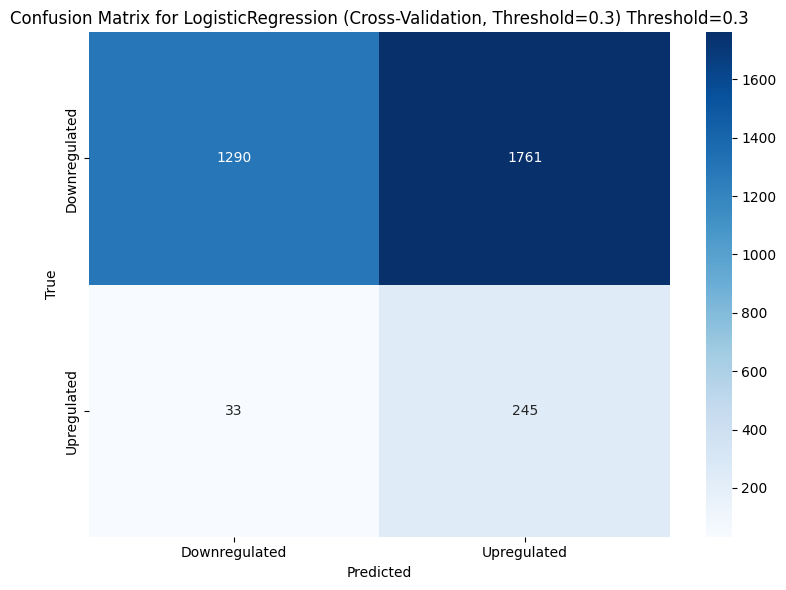

Final LogisticRegression AUC-ROC: 0.7261
Optimal ROC threshold (LogisticRegression CV): 0.4828
Confusion Matrix for LogisticRegression (Cross-Validation, Optimal Threshold=0.4828):
[[1969 1082]
 [  80  198]]


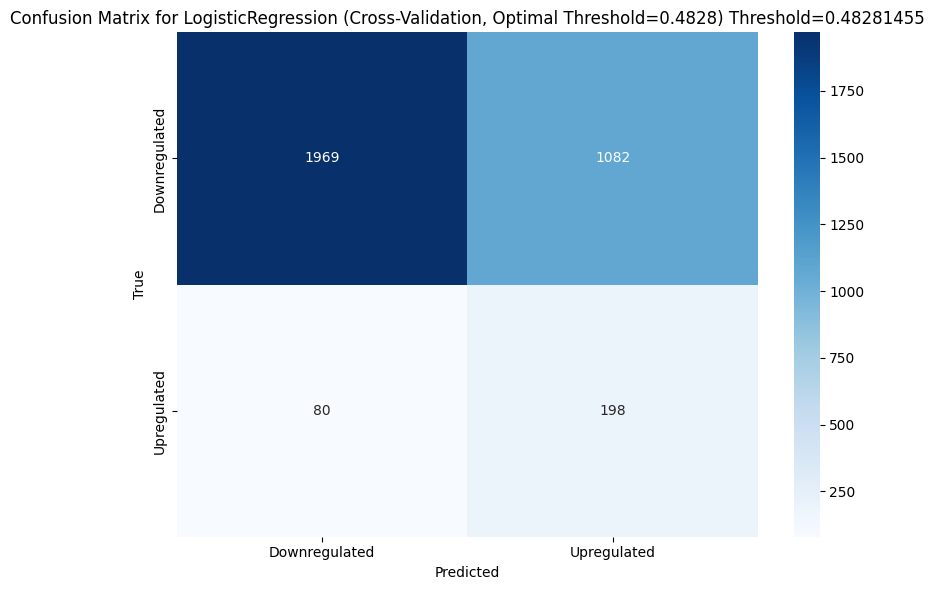

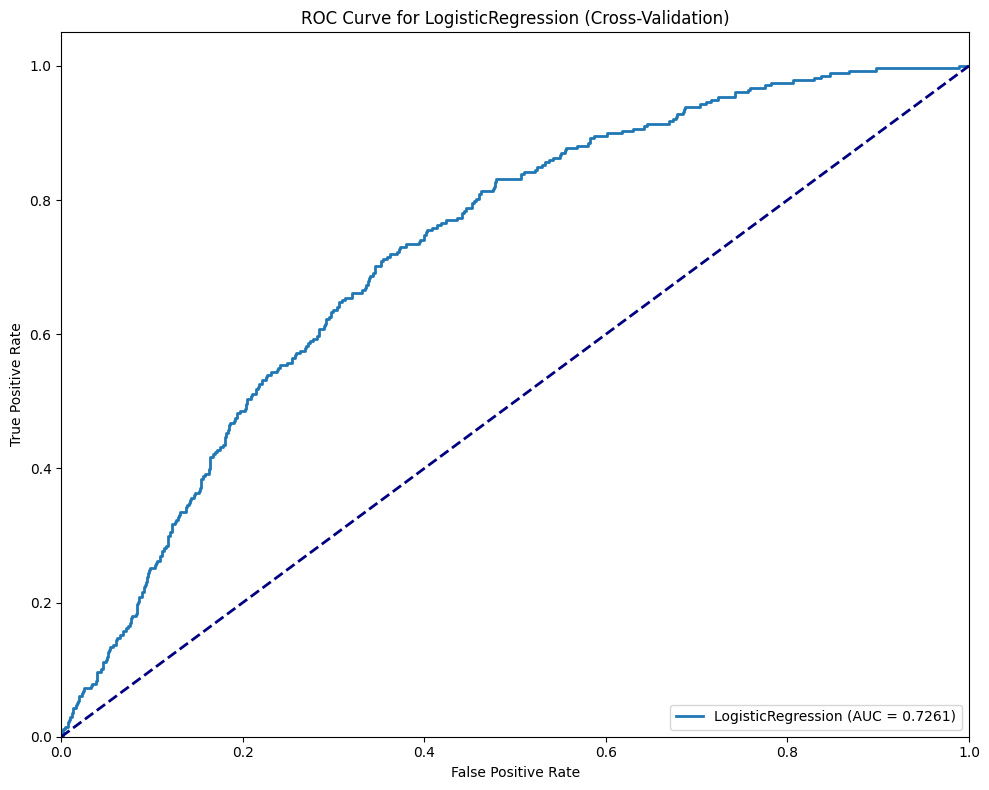

Final LogisticRegression Best Parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 10}
Final LogisticRegression test class counts: [523 310]
Final LogisticRegression test proba range: min=0.0001, max=0.9954

Metrics for LogisticRegression (Final Model, Test Set):
Sensitivity (Recall): 0.7059
Specificity: 0.6658
Accuracy: 0.6699
Balanced Accuracy: 0.6858
MCC: 0.2327
Precision: 0.1935
F1 Score: 0.3038
AUC-ROC: 0.7323
AUC-PR: 0.1913
Cohen’s Kappa: 0.1710
Log Loss: 0.6011
Confusion Matrix for LogisticRegression (Final Model, Test Set):
[[498 250]
 [ 25  60]]


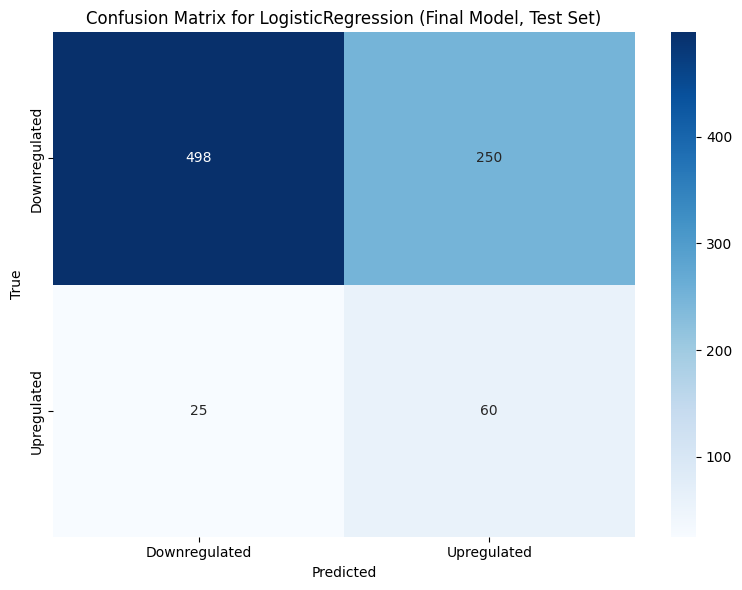

Confusion Matrix for LogisticRegression (Final Model, Threshold=0.3):
[[362 386]
 [ 15  70]]


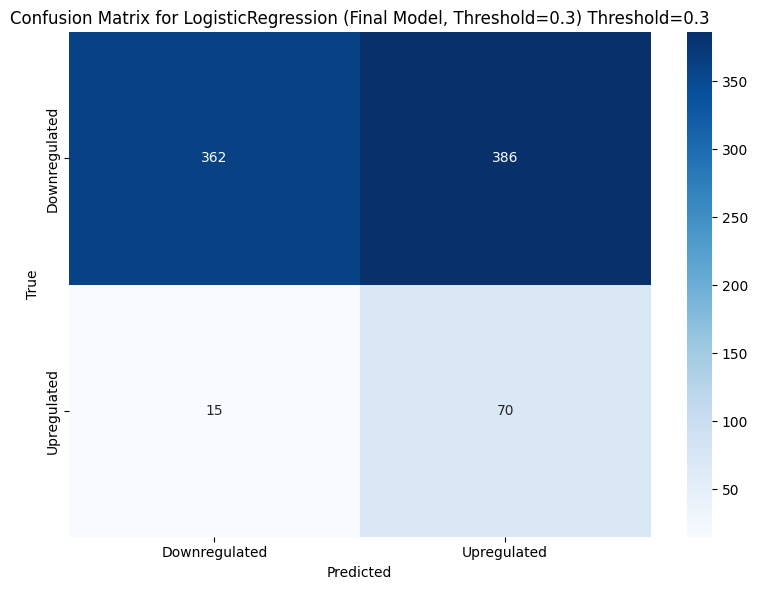

Final LogisticRegression AUC-ROC: 0.7323


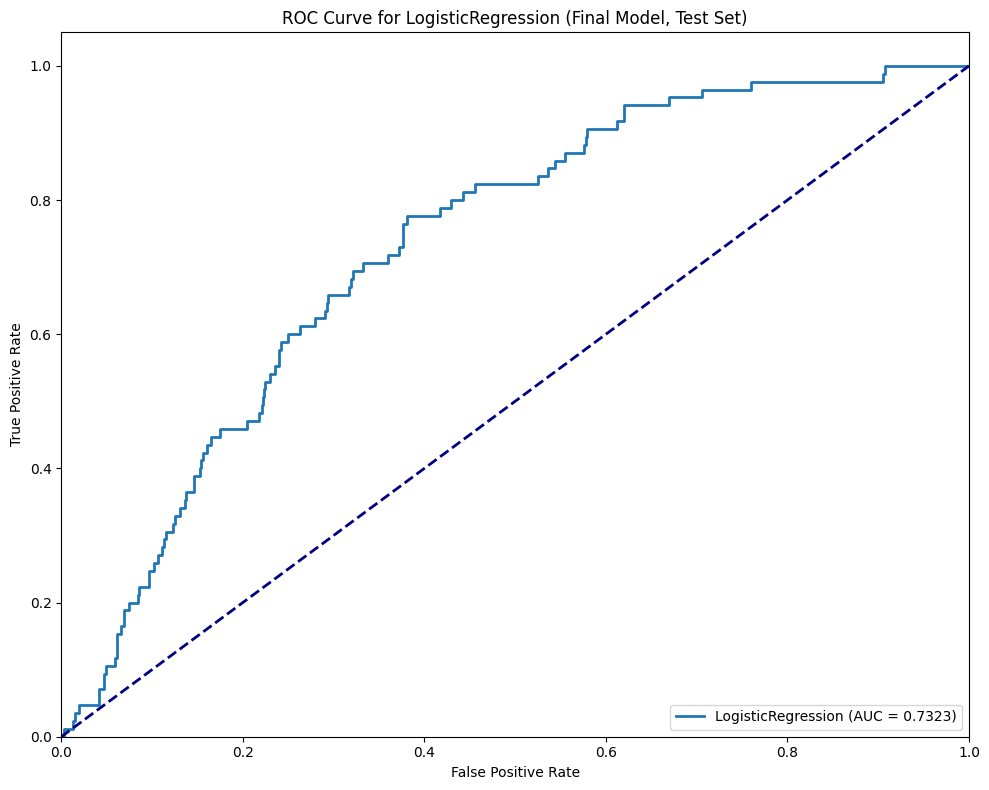

Final LogisticRegression Optimal ROC threshold: 0.4444
Confusion Matrix for LogisticRegression (Final Model, Optimal Threshold=0.4444):
[[463 285]
 [ 19  66]]


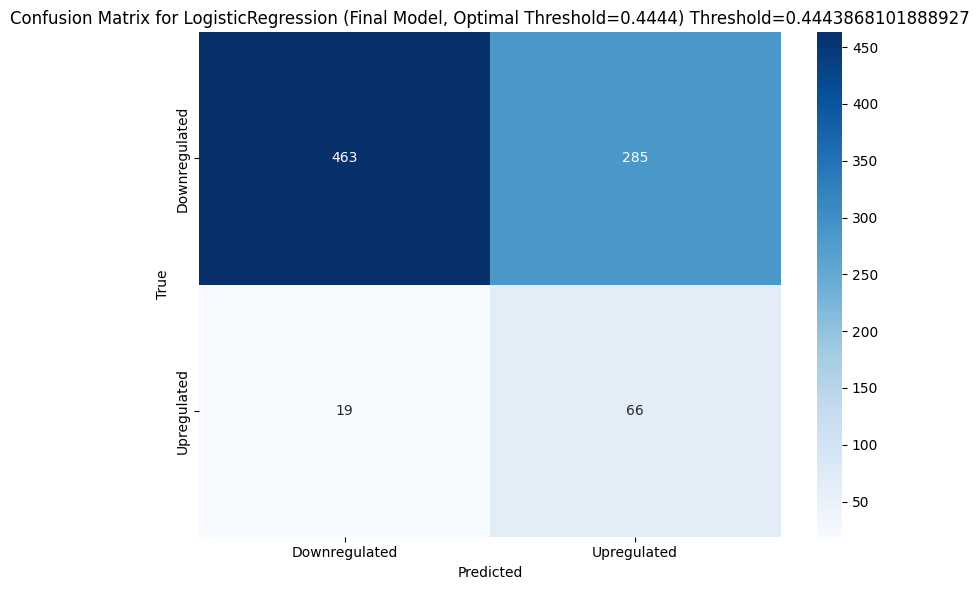

SHAP: X_train shape: (2496, 68), X_test shape: (833, 68), selected_features length: 68


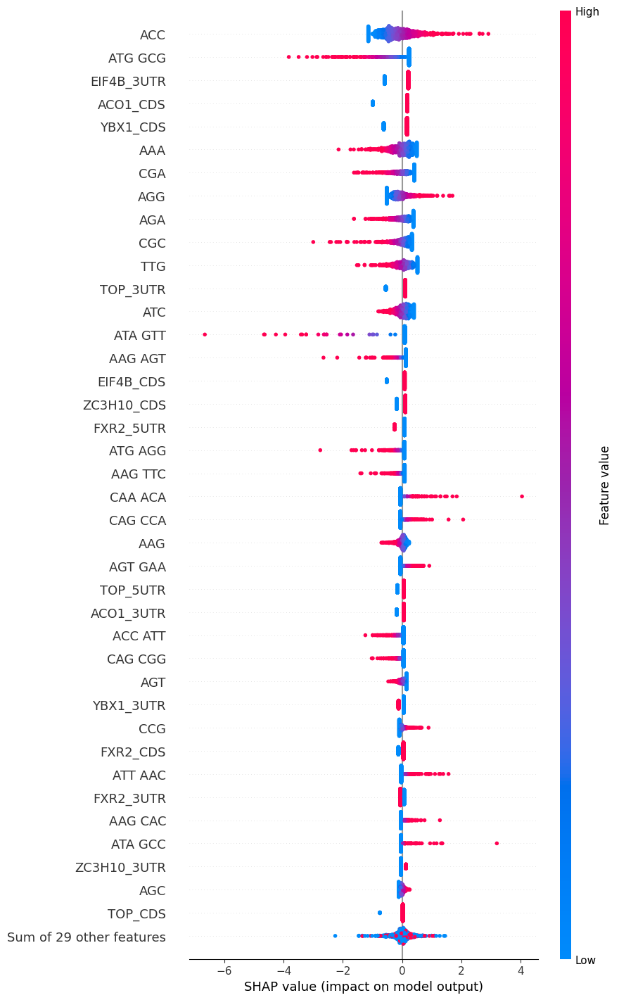

<Figure size 640x480 with 0 Axes>


=== Training SVM_Linear ===
Processing fold 1/5
Fold 1 Best Parameters: {'C': 0.1}
Fold 1 class counts: [440 226]
Fold 1 proba range: min=0.0001, max=0.3294
Processing fold 2/5
Fold 2 Best Parameters: {'C': 0.01}
Fold 2 class counts: [387 279]
Fold 2 proba range: min=0.0007, max=0.3204
Processing fold 3/5
Fold 3 Best Parameters: {'C': 10}
Fold 3 class counts: [402 264]
Fold 3 proba range: min=0.0000, max=0.3830
Processing fold 4/5
Fold 4 Best Parameters: {'C': 1}
Fold 4 class counts: [416 250]
Fold 4 proba range: min=0.0011, max=0.5310
Processing fold 5/5
Fold 5 Best Parameters: {'C': 0.01}
Fold 5 class counts: [400 265]
Fold 5 proba range: min=0.0005, max=0.4337
Final SVM_Linear CV class counts: [2045 1284]
Final SVM_Linear CV proba range: min=0.0000, max=0.5310
Confusion Matrix for SVM_Linear (Cross-Validation, 3329 samples):
[[1964 1087]
 [  81  197]]


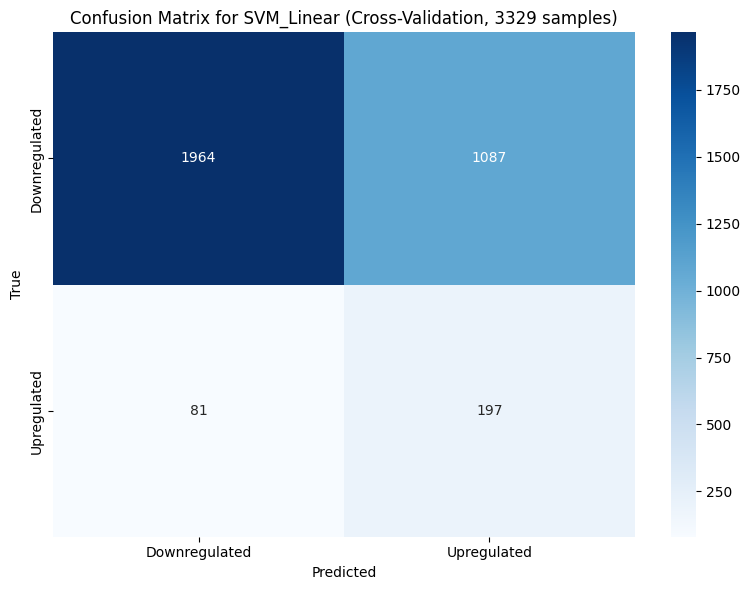

Confusion Matrix for SVM_Linear (Cross-Validation, Threshold=0.3):
[[3034   17]
 [ 274    4]]


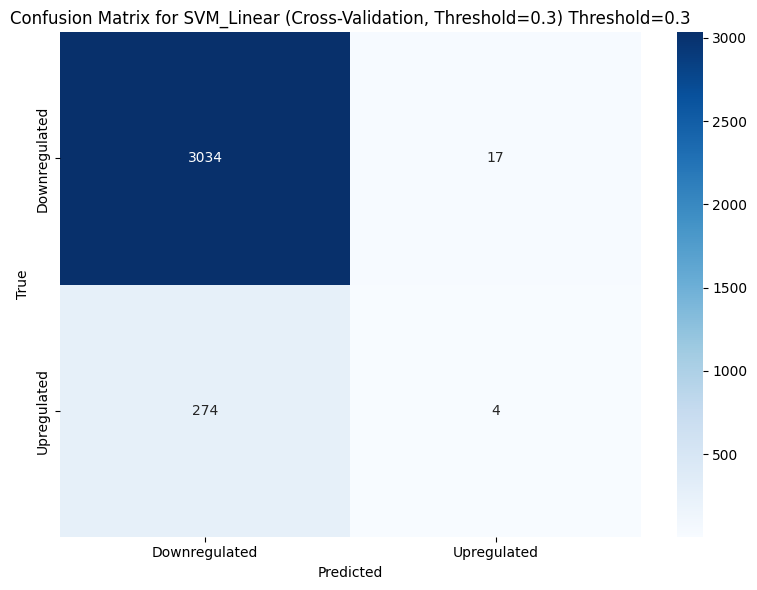

Final SVM_Linear AUC-ROC: 0.7244
Optimal ROC threshold (SVM_Linear CV): 0.0801
Confusion Matrix for SVM_Linear (Cross-Validation, Optimal Threshold=0.0801):
[[1794 1257]
 [  64  214]]


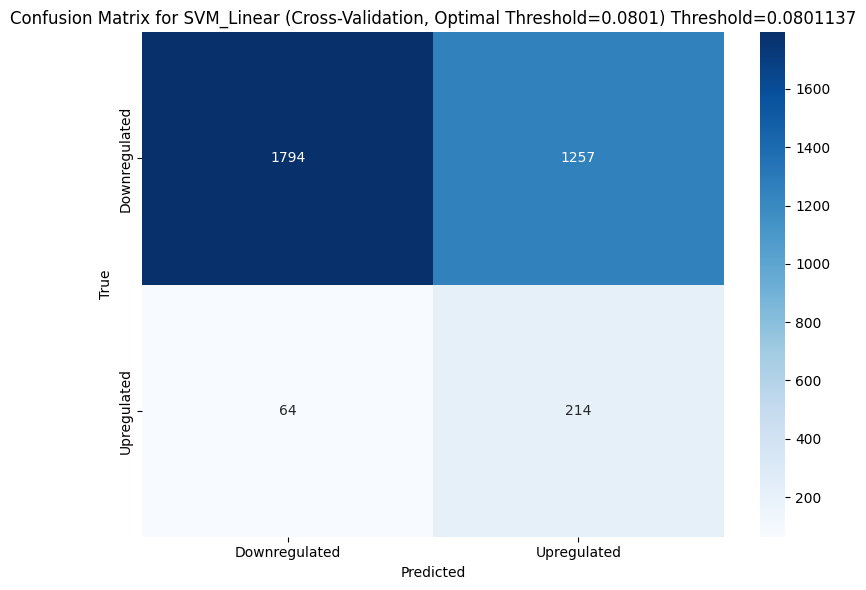

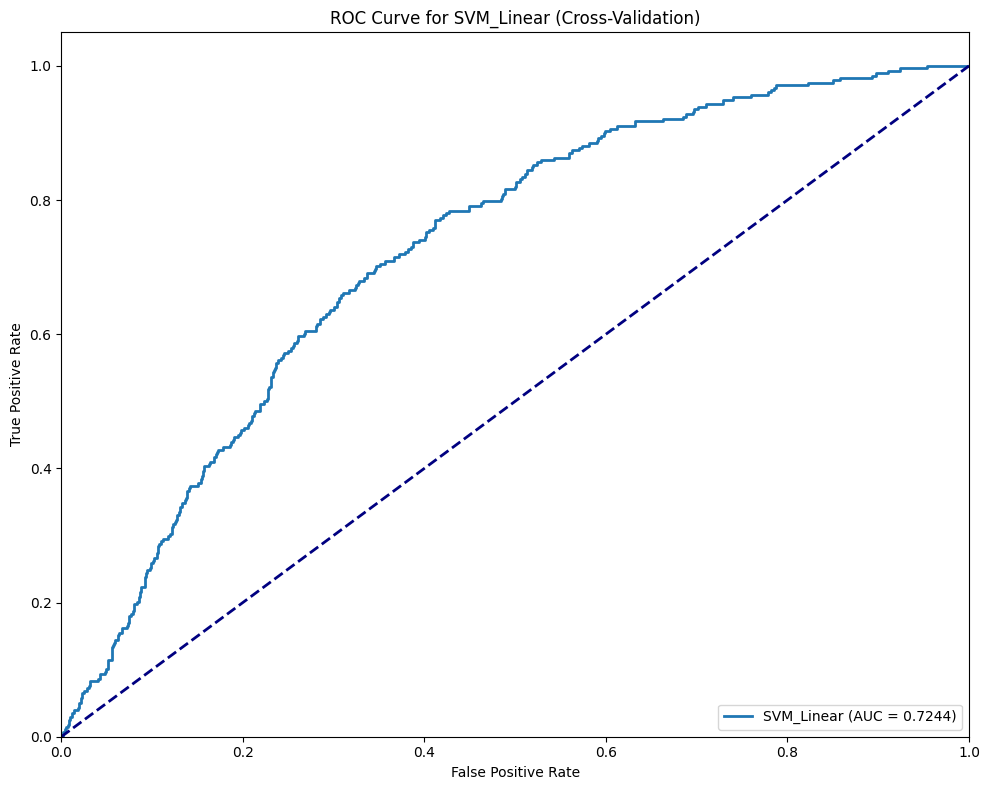

Final SVM_Linear Best Parameters: {'C': 0.01}
Final SVM_Linear test class counts: [485 348]
Final SVM_Linear test proba range: min=0.0017, max=0.4724

Metrics for SVM_Linear (Final Model, Test Set):
Sensitivity (Recall): 0.7294
Specificity: 0.6176
Accuracy: 0.6291
Balanced Accuracy: 0.6735
MCC: 0.2130
Precision: 0.1782
F1 Score: 0.2864
AUC-ROC: 0.7419
AUC-PR: 0.2012
Cohen’s Kappa: 0.1464
Log Loss: 0.3011
Confusion Matrix for SVM_Linear (Final Model, Test Set):
[[462 286]
 [ 23  62]]


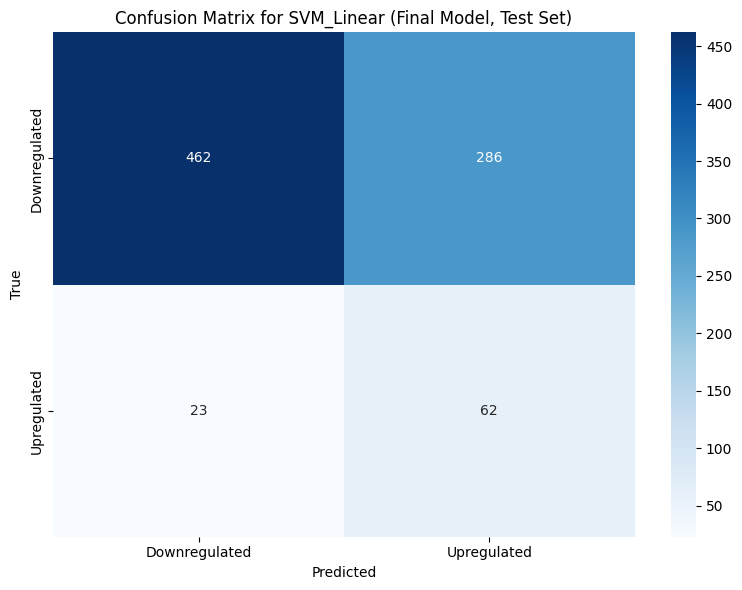

Confusion Matrix for SVM_Linear (Final Model, Threshold=0.3):
[[744   4]
 [ 85   0]]


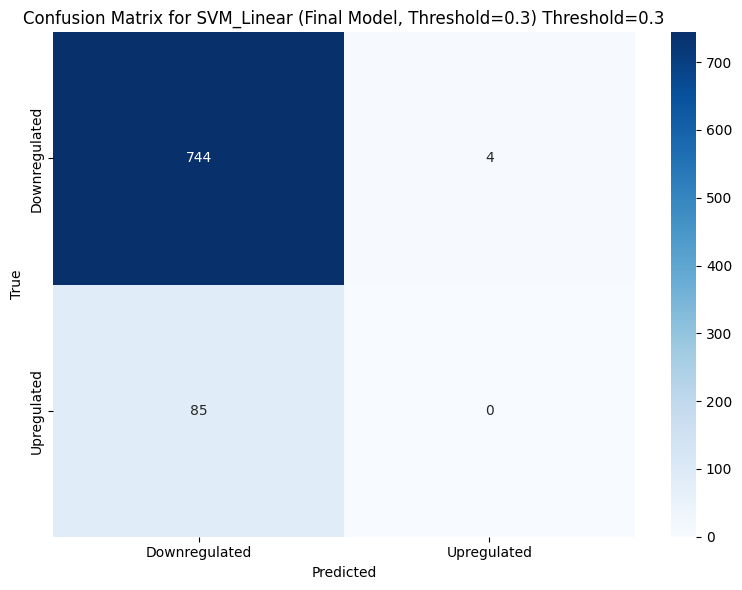

Final SVM_Linear AUC-ROC: 0.7419


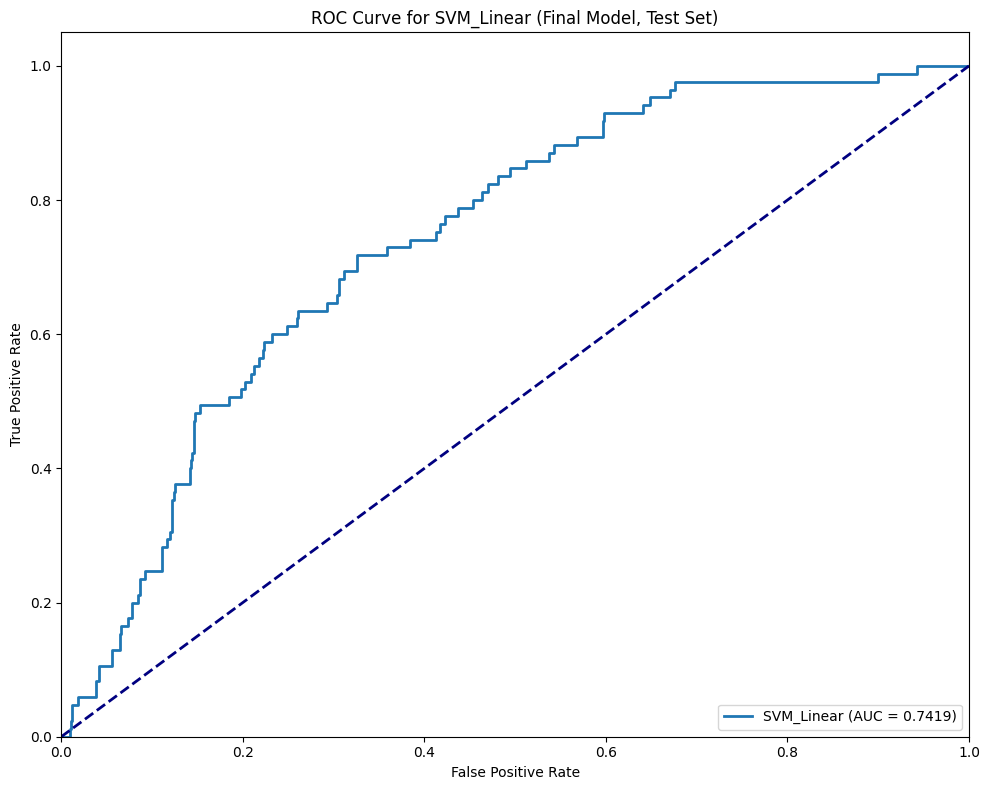

Final SVM_Linear Optimal ROC threshold: 0.0881
Confusion Matrix for SVM_Linear (Final Model, Optimal Threshold=0.0881):
[[504 244]
 [ 24  61]]


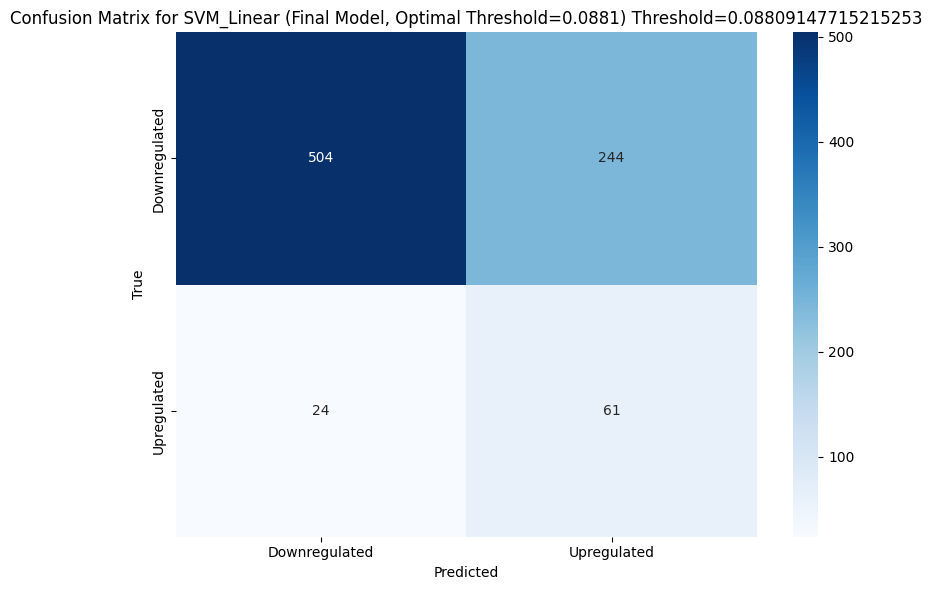

SHAP: X_train shape: (2496, 68), X_test shape: (833, 68), selected_features length: 68


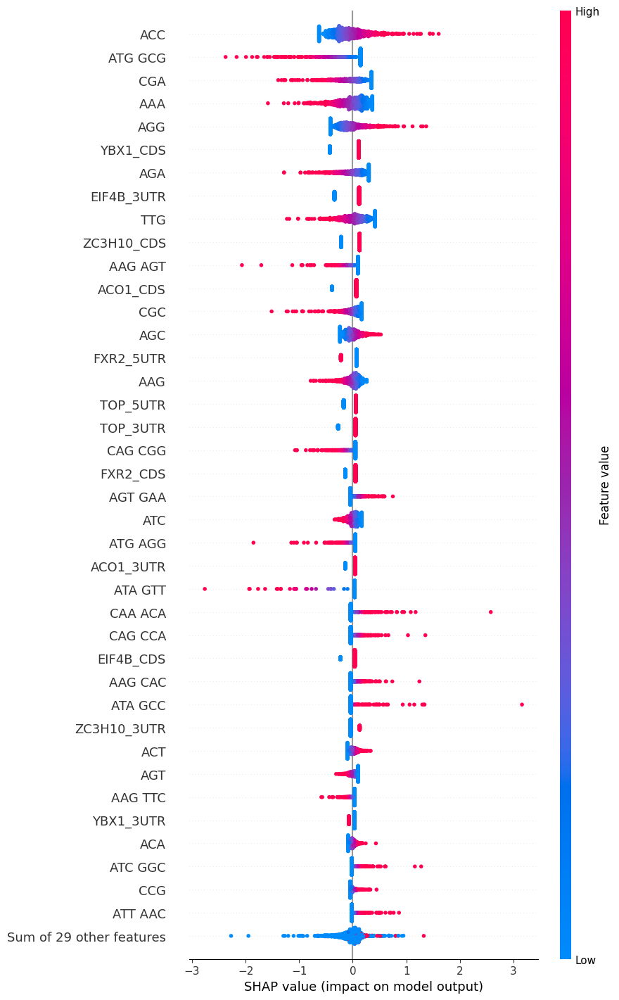

<Figure size 640x480 with 0 Axes>


=== Training RandomForest ===
Processing fold 1/5
Fold 1 Best Parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Fold 1 class counts: [621  45]
Fold 1 proba range: min=0.0062, max=0.7512
Processing fold 2/5
Fold 2 Best Parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Fold 2 class counts: [623  43]
Fold 2 proba range: min=0.0126, max=0.7169
Processing fold 3/5
Fold 3 Best Parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10}
Fold 3 class counts: [616  50]
Fold 3 proba range: min=0.0074, max=0.7224
Processing fold 4/5
Fold 4 Best Parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Fold 4 class counts: [625  41]
Fold 4 proba range: min=0.0000, max=0.7297
Processing fold 5/5
Fold 5 Best Parameters: {'n_estimator

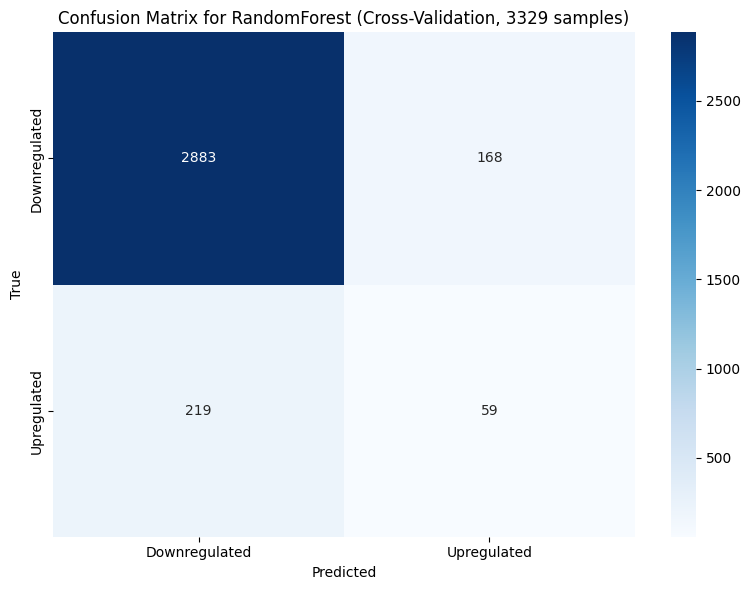

Confusion Matrix for RandomForest (Cross-Validation, Threshold=0.3):
[[2294  757]
 [ 112  166]]


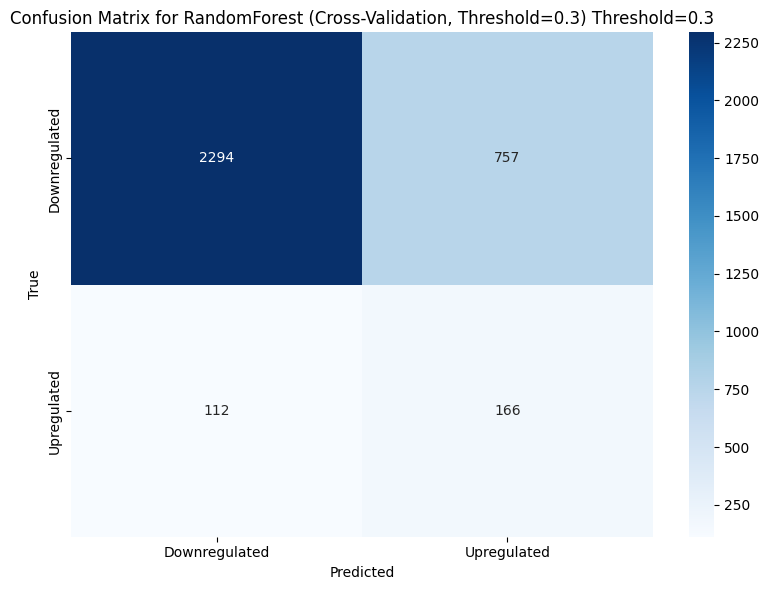

Final RandomForest AUC-ROC: 0.7500
Optimal ROC threshold (RandomForest CV): 0.2216
Confusion Matrix for RandomForest (Cross-Validation, Optimal Threshold=0.2216):
[[1877 1174]
 [  64  214]]


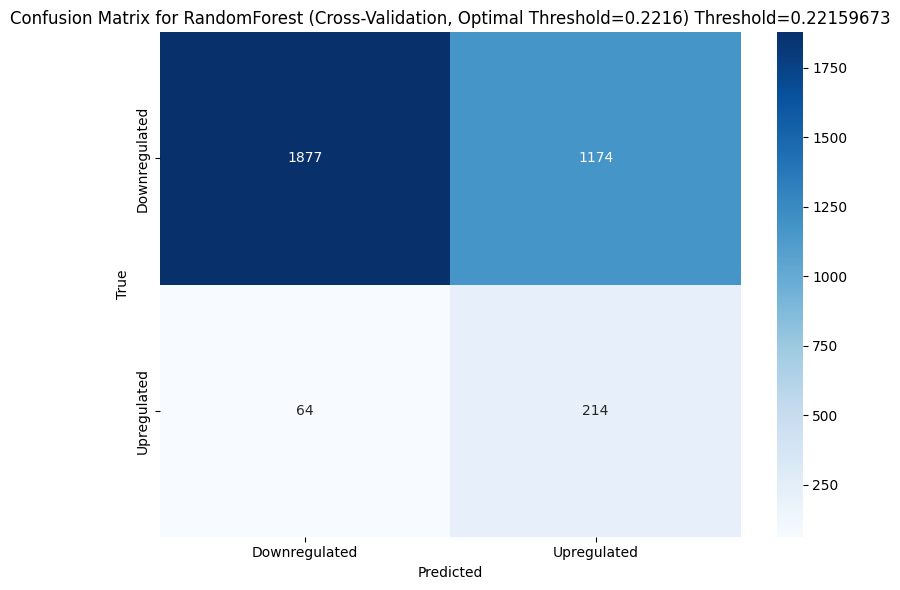

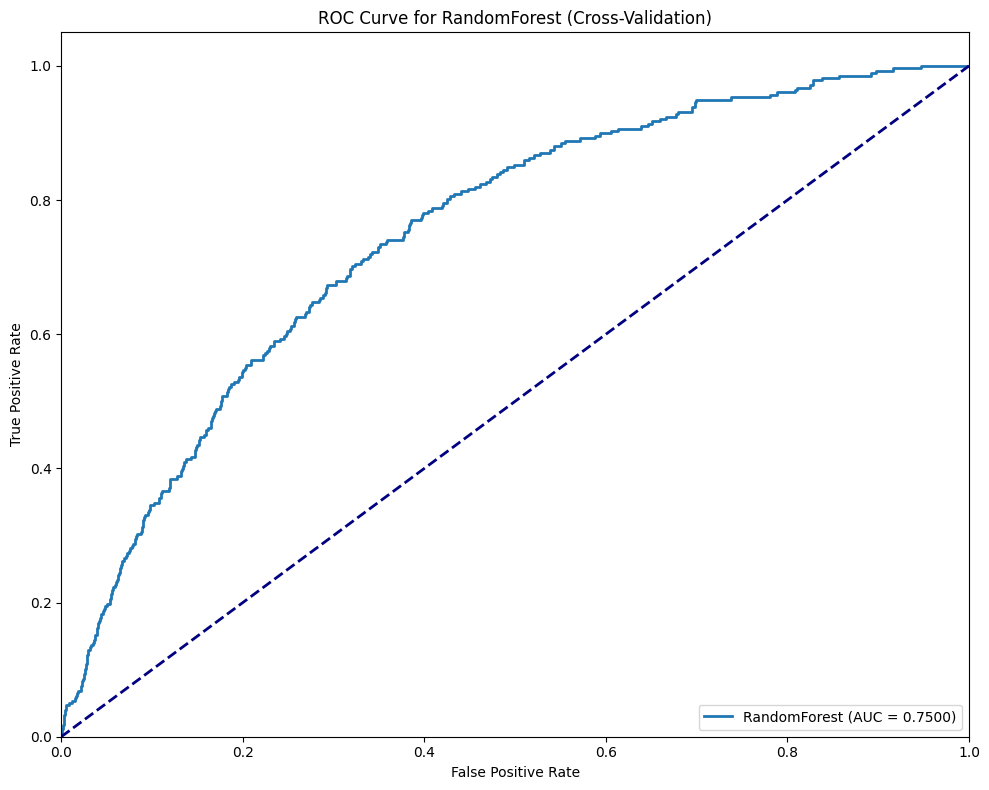

Final RandomForest Best Parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10}
Final RandomForest test class counts: [775  58]
Final RandomForest test proba range: min=0.0142, max=0.7630

Metrics for RandomForest (Final Model, Test Set):
Sensitivity (Recall): 0.1647
Specificity: 0.9412
Accuracy: 0.8619
Balanced Accuracy: 0.5529
MCC: 0.1259
Precision: 0.2414
F1 Score: 0.1958
AUC-ROC: 0.7533
AUC-PR: 0.2135
Cohen’s Kappa: 0.1232
Log Loss: 0.3504
Confusion Matrix for RandomForest (Final Model, Test Set):
[[704  44]
 [ 71  14]]


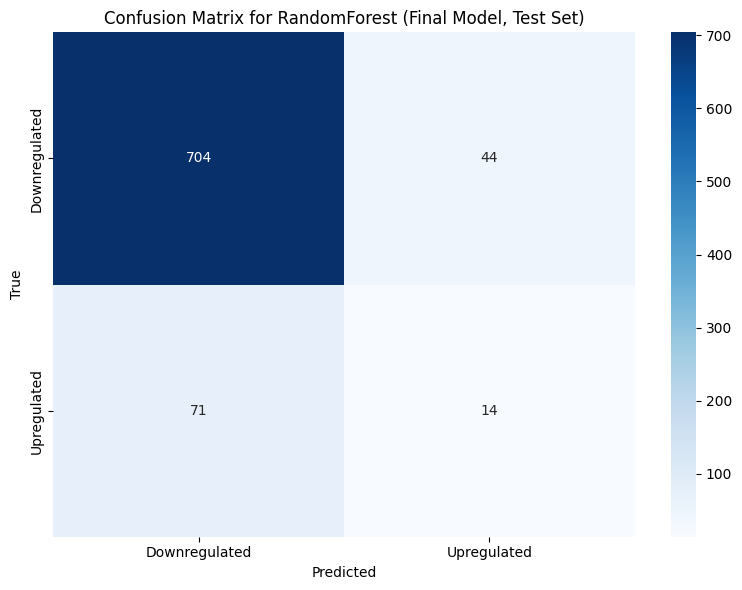

Confusion Matrix for RandomForest (Final Model, Threshold=0.3):
[[583 165]
 [ 40  45]]


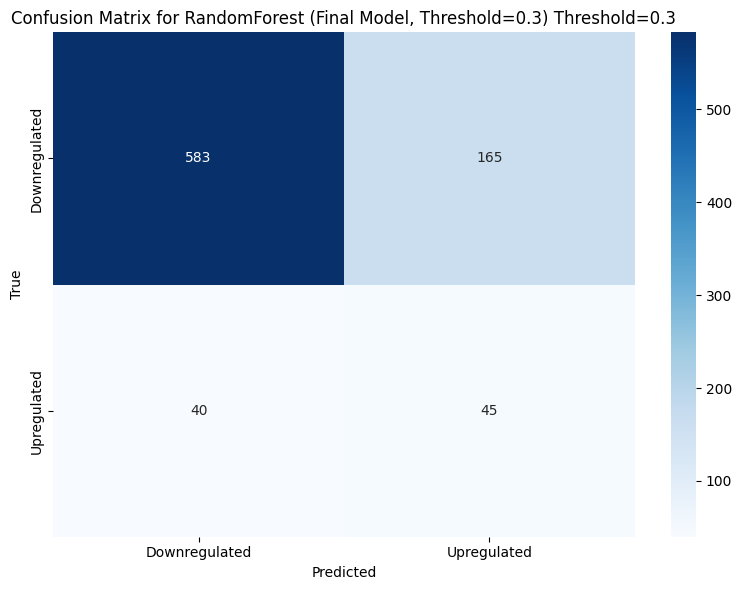

Final RandomForest AUC-ROC: 0.7533


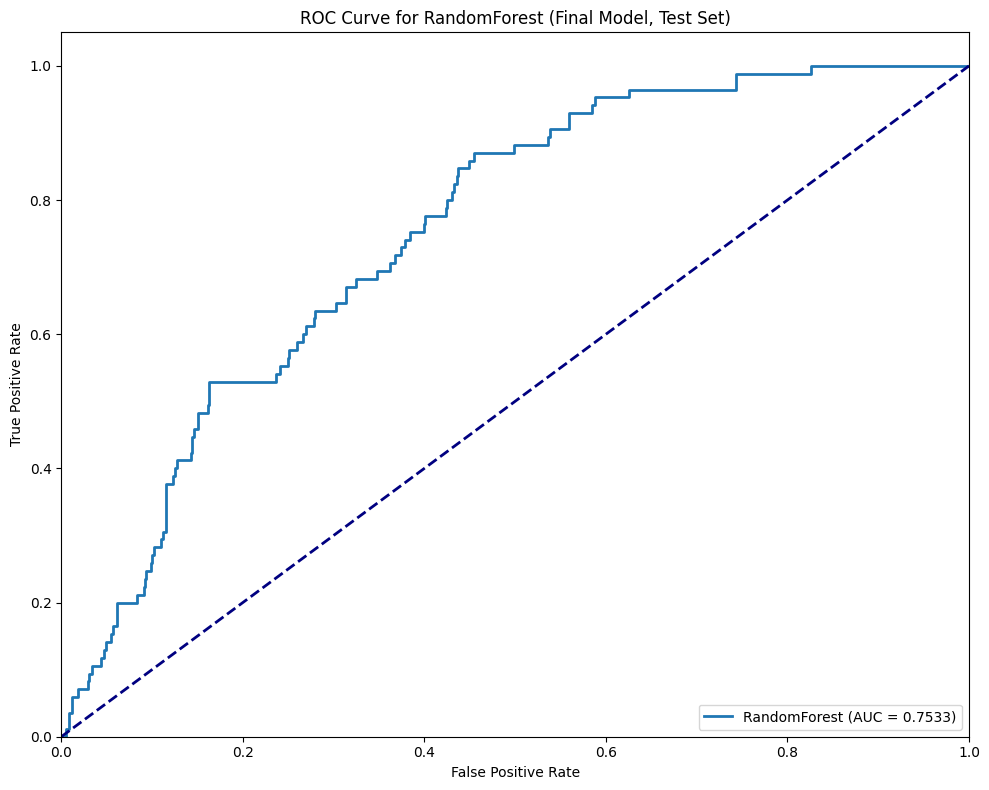

Final RandomForest Optimal ROC threshold: 0.1794
Confusion Matrix for RandomForest (Final Model, Optimal Threshold=0.1794):
[[408 340]
 [ 11  74]]


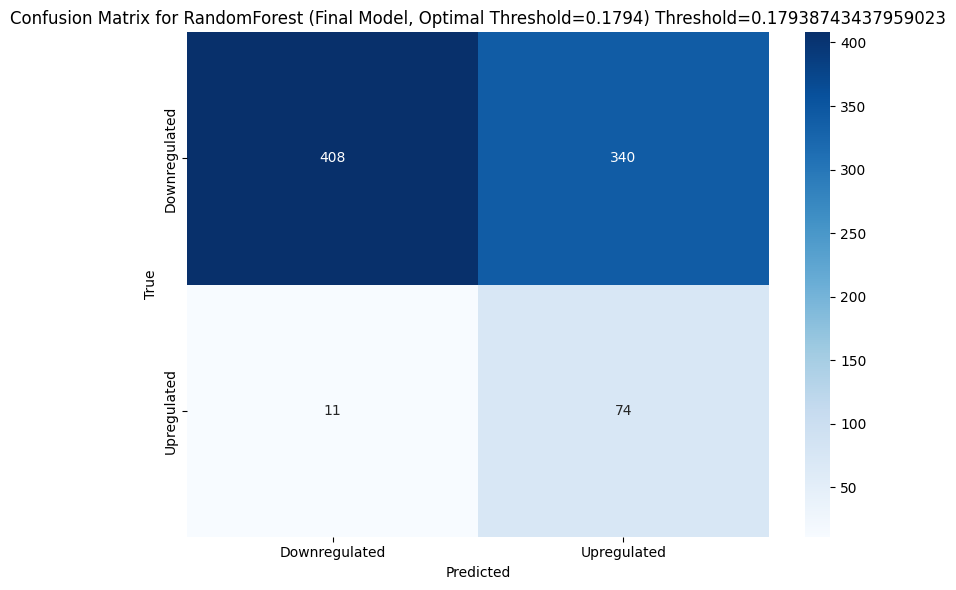

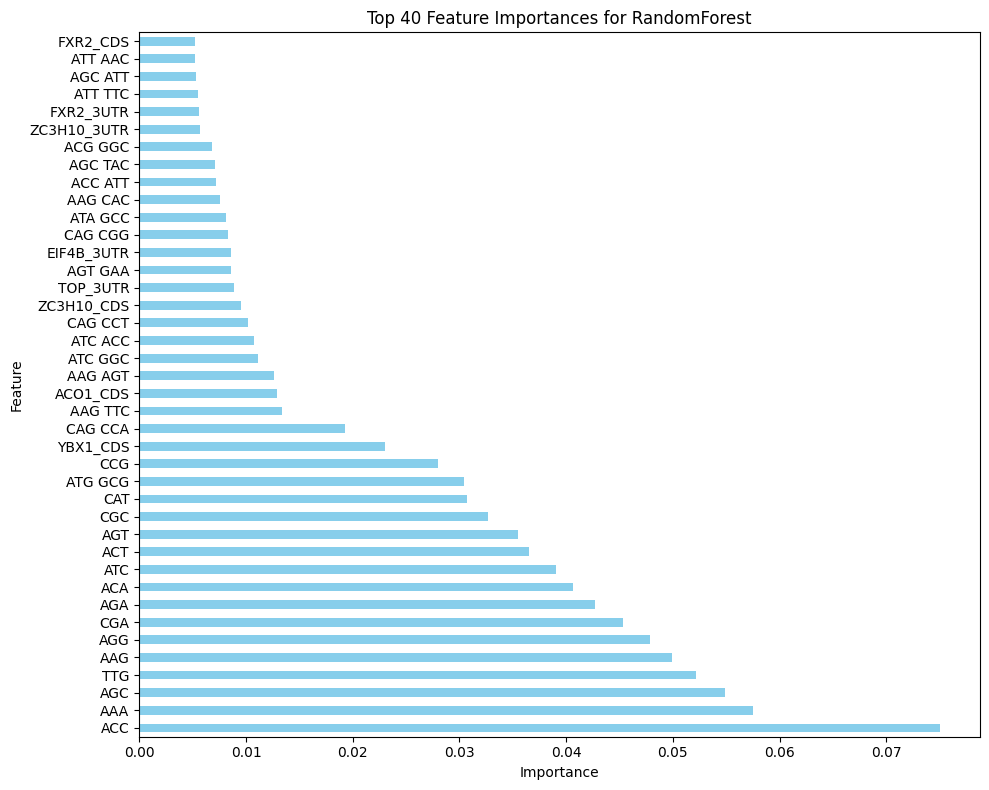

 82%|================    | 1358/1666 [00:11<00:02]       

Top 40 feature importances for RandomForest:
ACC            0.075021
AAA            0.057513
AGC            0.054913
TTG            0.052179
AAG            0.049869
AGG            0.047829
CGA            0.045291
AGA            0.042699
ACA            0.040631
ATC            0.039041
ACT            0.036482
AGT            0.035472
CGC            0.032628
CAT            0.030736
ATG GCG        0.030441
CCG            0.027966
YBX1_CDS       0.023049
CAG CCA        0.019320
AAG TTC        0.013398
ACO1_CDS       0.012939
AAG AGT        0.012588
ATC GGC        0.011139
ATC ACC        0.010792
CAG CCT        0.010211
ZC3H10_CDS     0.009520
TOP_3UTR       0.008832
AGT GAA        0.008635
EIF4B_3UTR     0.008555
CAG CGG        0.008333
ATA GCC        0.008138
AAG CAC        0.007532
ACC ATT        0.007215
AGC TAC        0.007062
ACG GGC        0.006816
ZC3H10_3UTR    0.005736
FXR2_3UTR      0.005621
ATT TTC        0.005469
AGC ATT        0.005321
ATT AAC        0.005266
FXR2_CDS       0.00

 97%|=================== | 1613/1666 [00:13<00:00]       

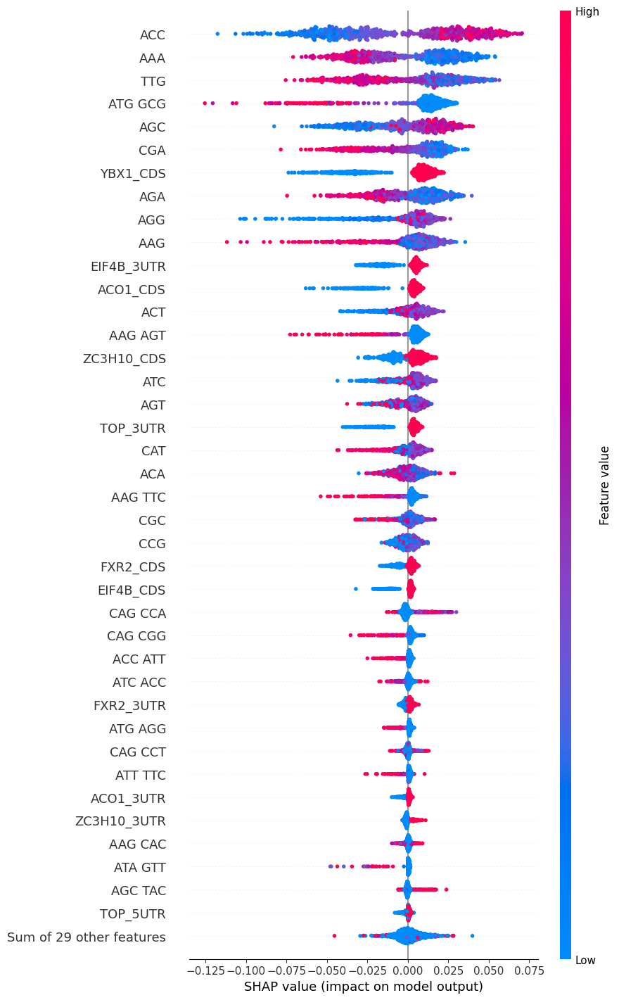

<Figure size 640x480 with 0 Axes>


=== Training XGBoost ===
Processing fold 1/5
Fold 1 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 1 class counts: [666]
Fold 1 proba range: min=0.0007, max=0.0982
Processing fold 2/5
Fold 2 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 2 class counts: [666]
Fold 2 proba range: min=0.0009, max=0.1542
Processing fold 3/5
Fold 3 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 3 class counts: [666]
Fold 3 proba range: min=0.0007, max=0.1461
Processing fold 4/5
Fold 4 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 4 class counts: [666]
Fold 4 proba range: min=0.0007, max=0.1287
Processing fold 5/5
Fold 5 Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Fold 5 class counts: [665]
Fold 5 proba range: min=0.0008, max=0.2089
Final XGBoost 

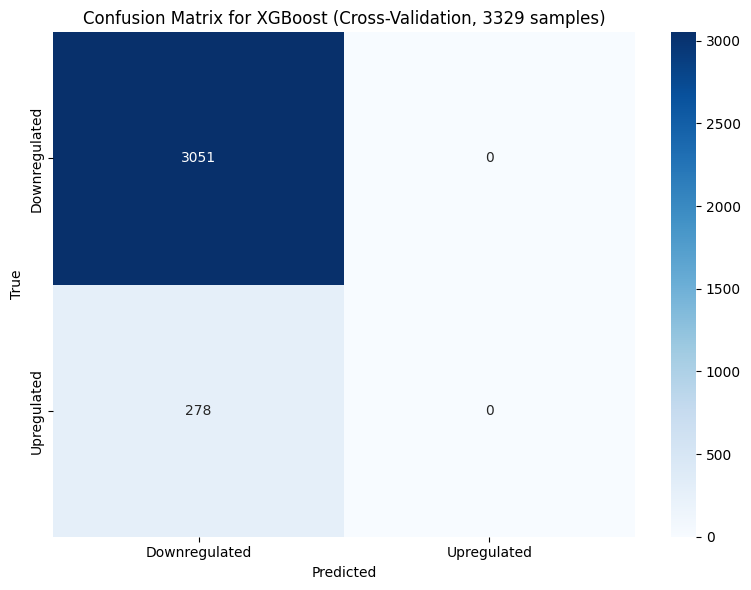

Confusion Matrix for XGBoost (Cross-Validation, Threshold=0.3):
[[3051    0]
 [ 278    0]]


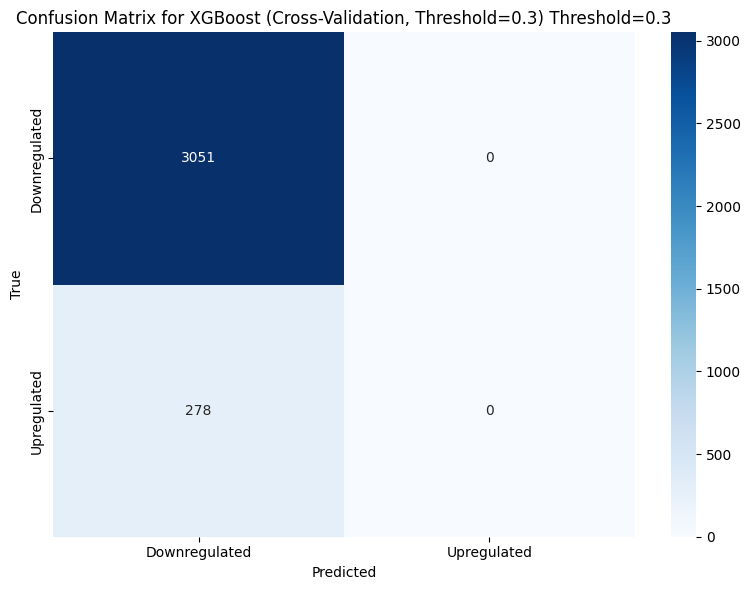

Final XGBoost AUC-ROC: 0.7392
Optimal ROC threshold (XGBoost CV): 0.0130
Confusion Matrix for XGBoost (Cross-Validation, Optimal Threshold=0.0130):
[[2440  611]
 [ 123  155]]


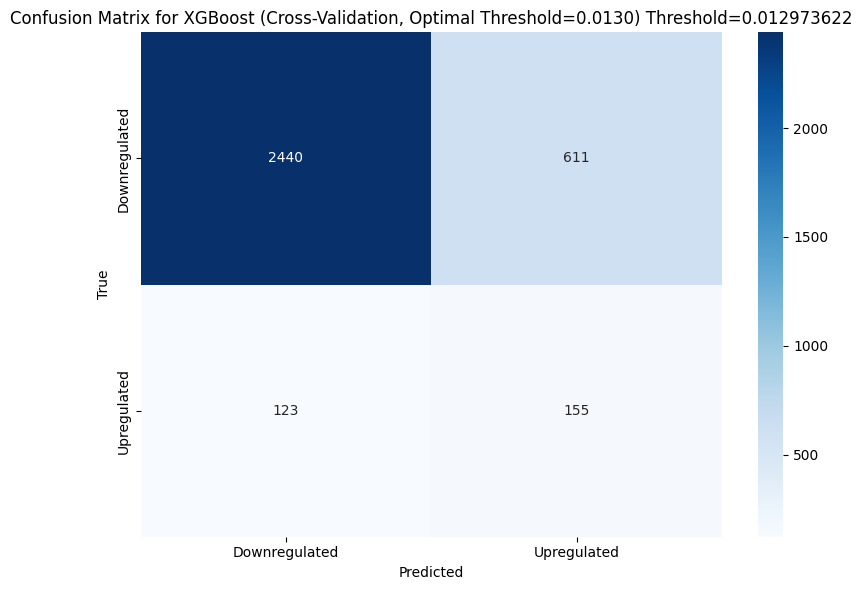

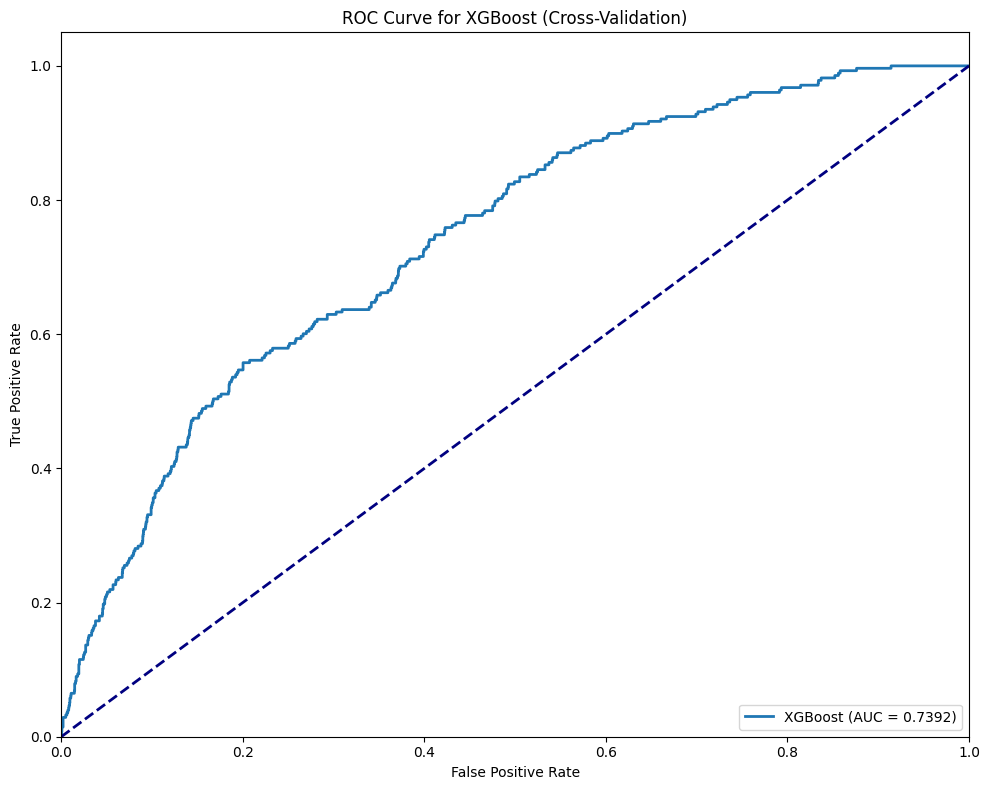

Final XGBoost Best Parameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1}
Final XGBoost test class counts: [833]
Final XGBoost test proba range: min=0.0008, max=0.1359
Confusion Matrix for XGBoost (Final Model, Test Set):
[[748   0]
 [ 85   0]]


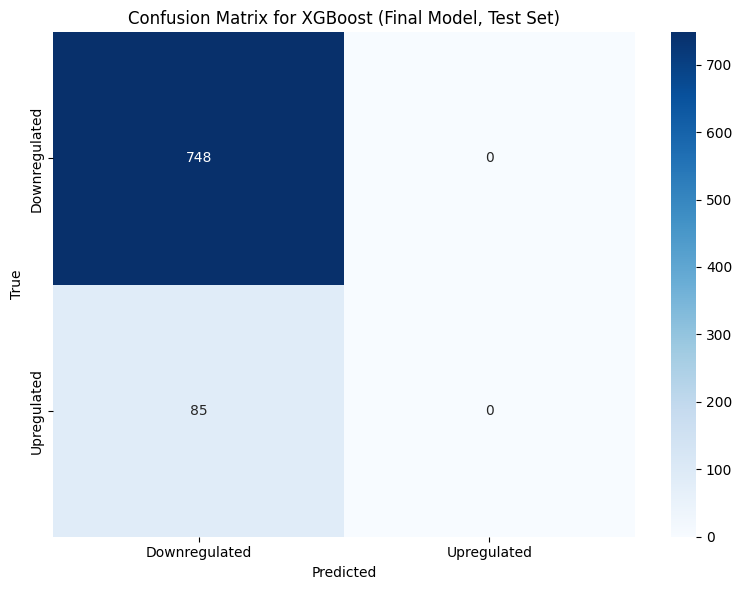

Confusion Matrix for XGBoost (Final Model, Threshold=0.3):
[[748   0]
 [ 85   0]]


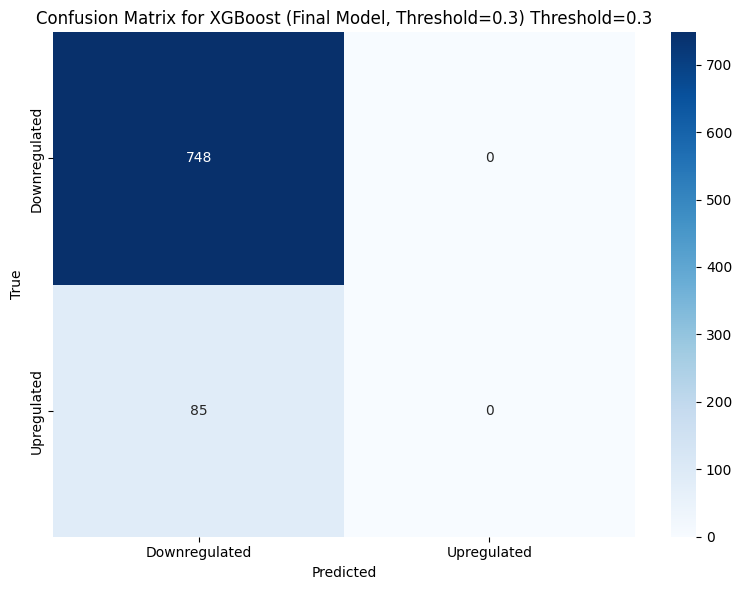

Final XGBoost AUC-ROC: 0.7444


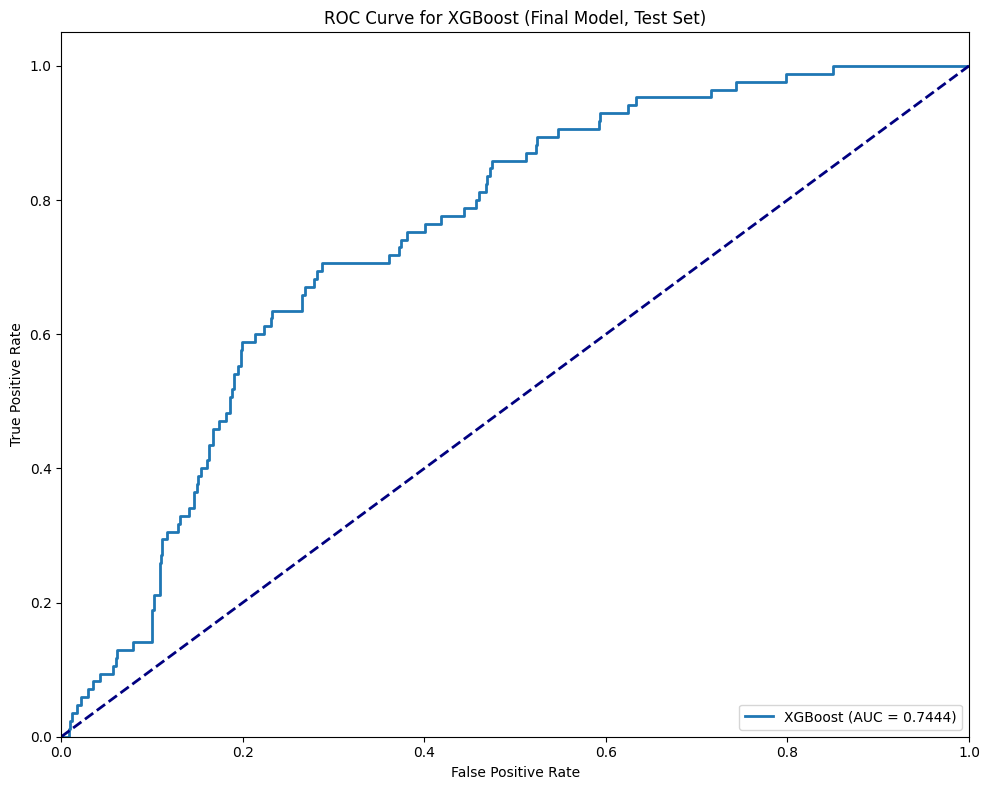

Final XGBoost Optimal ROC threshold: 0.0081
Confusion Matrix for XGBoost (Final Model, Optimal Threshold=0.0081):
[[533 215]
 [ 25  60]]


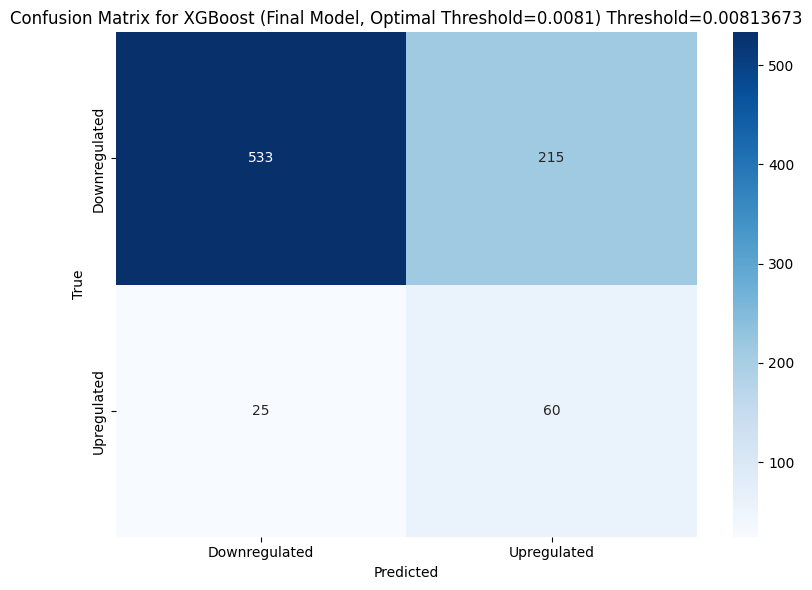

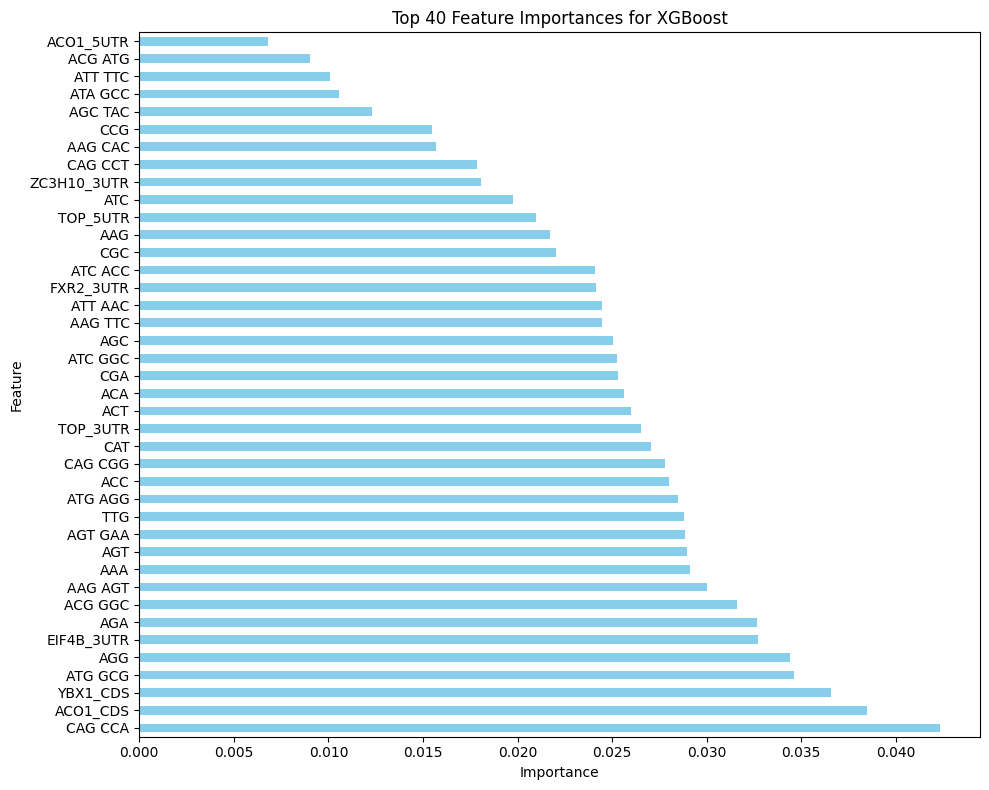

Top 40 feature importances for XGBoost:
CAG CCA        0.042338
ACO1_CDS       0.038462
YBX1_CDS       0.036597
ATG GCG        0.034607
AGG            0.034406
EIF4B_3UTR     0.032720
AGA            0.032642
ACG GGC        0.031590
AAG AGT        0.030002
AAA            0.029097
AGT            0.028952
AGT GAA        0.028877
TTG            0.028817
ATG AGG        0.028501
ACC            0.028031
CAG CGG        0.027805
CAT            0.027070
TOP_3UTR       0.026534
ACT            0.026023
ACA            0.025604
CGA            0.025320
ATC GGC        0.025268
AGC            0.025036
AAG TTC        0.024468
ATT AAC        0.024449
FXR2_3UTR      0.024146
ATC ACC        0.024085
CGC            0.022043
AAG            0.021744
TOP_5UTR       0.021003
ATC            0.019782
ZC3H10_3UTR    0.018059
CAG CCT        0.017831
AAG CAC        0.015707
CCG            0.015501
AGC TAC        0.012317
ATA GCC        0.010543
ATT TTC        0.010062
ACG ATG        0.009023
ACO1_5UTR      0.006828


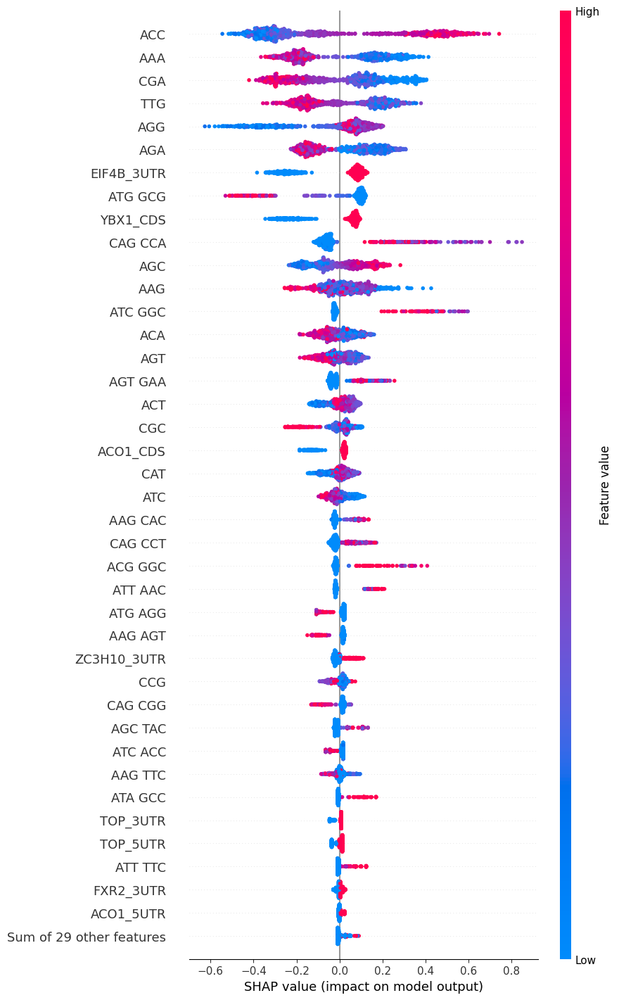

<Figure size 640x480 with 0 Axes>

In [12]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc, precision_score, recall_score, f1_score, matthews_corrcoef, cohen_kappa_score, log_loss, precision_recall_curve
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from joblib import Parallel, delayed
from itertools import chain
from xgboost import XGBClassifier
from scipy.sparse import csr_matrix

# Set up logging
logging.basicConfig(filename='rf_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Consolidated plotting function
def plot_confusion_matrix(y_true, y_pred, title, filename, model_name, threshold=None):
    cm = confusion_matrix(y_true, y_pred)
    print(f"{title}:\n{cm}")
    logging.info(f"{title}:\n{cm}")
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Downregulated', 'Upregulated'],
                yticklabels=['Downregulated', 'Upregulated'])
    plt.title(f"{title}{' Threshold=' + str(threshold) if threshold else ''}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(f'{filename}.png', bbox_inches='tight')
    plt.show()
    plt.close()
    return cm

# Codon tables and utility functions
CODON_TABLE = {
    'TTT': 'F', 'TTC': 'F', 'TTA': 'L', 'TTG': 'L', 'CTT': 'L', 'CTC': 'L', 'CTA': 'L', 'CTG': 'L',
    'ATT': 'I', 'ATC': 'I', 'ATA': 'I', 'ATG': 'M', 'GTT': 'V', 'GTC': 'V', 'GTA': 'V', 'GTG': 'V',
    'TCT': 'S', 'TCC': 'S', 'TCA': 'S', 'TCG': 'S', 'CCT': 'P', 'CCC': 'P', 'CCA': 'P', 'CCG': 'P',
    'ACT': 'T', 'ACC': 'T', 'ACA': 'T', 'ACG': 'T', 'GCT': 'A', 'GCC': 'A', 'GCA': 'A', 'GCG': 'A',
    'TAT': 'Y', 'TAC': 'Y', 'CAT': 'H', 'CAC': 'H', 'CAA': 'Q', 'CAG': 'Q', 'AAT': 'N', 'AAC': 'N',
    'AAA': 'K', 'AAG': 'K', 'GAT': 'D', 'GAC': 'D', 'GAA': 'E', 'GAG': 'E', 'TGT': 'C', 'TGC': 'C',
    'TGG': 'W', 'CGT': 'R', 'CGC': 'R', 'CGA': 'R', 'CGG': 'R', 'AGT': 'S', 'AGC': 'S', 'AGA': 'R',
    'AGG': 'R', 'GGT': 'G', 'GGC': 'G', 'GGA': 'G', 'GGG': 'G'
}
STOP_CODONS = ['TAA', 'TAG', 'TGA']
NON_SYNONYMOUS_CODONS = {codon for codon, aa in CODON_TABLE.items() if sum(1 for c, a in CODON_TABLE.items() if a == aa) == 1}
DESTABILIZING_CODONS = [
    'TTA', 'CTA', 'ATA', 'GTA', 'TCA', 'CGA', 'AGA', 'GGA',
    'TTT', 'CTT', 'ATT', 'GTT', 'TCT', 'CCT', 'ACT', 'GCT',
    'TAT', 'CAT', 'AAT', 'GAT', 'TGT', 'CGT', 'AGT', 'GGT'
]
ALIPHATIC_AAS = {'A', 'I', 'L', 'V'}
AROMATIC_AAS = {'F', 'Y', 'W'}
POLAR_AAS = {'N', 'Q', 'S', 'T'}
CHARGED_AAS = {'D', 'E', 'K', 'R', 'H'}
HYDROPHOBIC_AAS = {'F', 'I', 'L', 'M', 'V'}
HYDROPHILIC_AAS = {'N', 'D', 'Q', 'E', 'K', 'R'}
ALIPHATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in ALIPHATIC_AAS}
AROMATIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in AROMATIC_AAS}
POLAR_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in POLAR_AAS}
CHARGED_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in CHARGED_AAS}
HYDROPHOBIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHOBIC_AAS}
HYDROPHILIC_CODONS = {codon for codon, aa in CODON_TABLE.items() if aa in HYDROPHILIC_AAS}

def geometric_mean(values):
    if not values or any(v <= 0 for v in values):
        return 0.0
    return np.exp(np.mean(np.log(values)))

def _synonymous_codons():
    codons_for_aa = {}
    for codon, aa in CODON_TABLE.items():
        codons_for_aa.setdefault(aa, []).append(codon)
    return {codon: codons_for_aa[aa] for codon in CODON_TABLE}

SYNONYMOUS_CODONS = _synonymous_codons()

def RSCU(sequences):
    if not isinstance(sequences, (list, tuple)) or not sequences:
        raise ValueError("Sequences must be a non-empty list or tuple.")
    for seq in sequences:
        if not seq:
            raise ValueError("Input sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq.upper() for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
    codons = chain.from_iterable(
        (seq[i:i+3].upper() for i in range(0, len(seq), 3))
        for seq in sequences
    )
    counts = Counter(codons)
    for codon in CODON_TABLE:
        if counts[codon] == 0:
            counts[codon] = 0.5
    result = {}
    for codon in CODON_TABLE:
        synonymous = SYNONYMOUS_CODONS[codon]
        total_counts = sum(counts[c] for c in synonymous)
        num_synonymous = len(synonymous)
        expected = total_counts / num_synonymous if total_counts > 0 else 1.0
        result[codon] = counts[codon] / expected
    return result

def relative_adaptiveness(sequences=None, RSCUs=None):
    if sum([bool(sequences), bool(RSCUs)]) != 1:
        raise ValueError("Must provide either sequences or RSCUs, but not both.")
    if sequences:
        RSCUs = RSCU(sequences)
    weights = {}
    for codon in RSCUs:
        synonymous = SYNONYMOUS_CODONS[codon]
        max_rscu = max(RSCUs[c] for c in synonymous)
        weights[codon] = RSCUs[codon] / max_rscu if max_rscu > 0 else 1.0
    return weights

def compute_features(seq, weights):
    try:
        seq = seq.upper()
        if not seq:
            raise ValueError("Sequence cannot be empty.")
        if len(seq) % 3 != 0:
            raise ValueError(f"Sequence length {len(seq)} not divisible by three.")
        if any(base in seq for base in 'NXRYSWKM'):
            raise ValueError(f"Sequence contains ambiguous bases: {seq[:30]}...")
        
        codons = [seq[i:i+3] for i in range(0, len(seq), 3)]
        total_codons = len([c for c in codons if c not in STOP_CODONS])
        
        # CAI
        sequence_weights = [weights[codon] for codon in codons if codon not in STOP_CODONS and codon not in NON_SYNONYMOUS_CODONS]
        cai = geometric_mean(sequence_weights) if sequence_weights else 0.0
        
        # CII
        destabilizing_count = sum(1 for codon in codons if codon in DESTABILIZING_CODONS and codon not in STOP_CODONS)
        cii = destabilizing_count / total_codons if total_codons > 0 else 0.0
        
        # Codon group frequencies
        aliphatic = sum(1 for codon in codons if codon in ALIPHATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        aromatic = sum(1 for codon in codons if codon in AROMATIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        polar = sum(1 for codon in codons if codon in POLAR_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        charged = sum(1 for codon in codons if codon in CHARGED_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophobic = sum(1 for codon in codons if codon in HYDROPHOBIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        hydrophilic = sum(1 for codon in codons if codon in HYDROPHILIC_CODONS and codon not in STOP_CODONS) / total_codons if total_codons > 0 else 0.0
        
        return cai, cii, aliphatic, aromatic, polar, charged, hydrophobic, hydrophilic
    except Exception as e:
        logging.error(f"Error computing features for sequence {seq[:30]}...: {e}")
        return 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0

def load_fasta_sequences(up_file, down_file):
    sequences, labels, gene_ids = [], [], []
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label in [(up_file, 1), (down_file, 0)]:
            try:
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(label)
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                logging.error(f"Error reading {file_path}: {e}")
                return None, None, None
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    return sequences, labels, gene_ids

def load_reference_sequences(ref_file):
    ref_sequences = []
    with open('fasta_warnings.log', 'a') as log_file:
        try:
            for record in SeqIO.parse(ref_file, 'fasta'):
                seq = str(record.seq).upper()
                if len(seq) >= 3:
                    seq = seq[:-3]
                if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                    log_file.write(f"Warning: Skipping reference {record.id} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                    logging.warning(f"Skipping reference {record.id}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                    continue
                ref_sequences.append(seq)
        except Exception as e:
            print(f"Error reading {ref_file}: {e}")
            logging.error(f"Error reading {ref_file}: {e}")
            return None
    return ref_sequences

def load_motif_data(motif_file):
    try:
        motif_df = pd.read_csv(motif_file, sep='\t')
        print(f"Loaded motif data with {len(motif_df)} transcripts")
        print(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        logging.info(f"Loaded motif data with {len(motif_df)} transcripts")
        logging.info(f"Sample of motif_df (first 5 rows):\n{motif_df.head(5).to_string()}")
        print(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        logging.info(f"Sample transcript_ids from motif_df (first 5): {motif_df['transcript_id'].head(5).tolist()}")
        return motif_df
    except Exception as e:
        print(f"Error reading motif data: {e}")
        logging.error(f"Error reading motif data: {e}")
        return None

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

def compute_class_weights(labels):
    n_samples = len(labels)
    n_classes = len(np.unique(labels))
    class_counts = np.bincount(labels.astype(int))
    weights = n_samples / (n_classes * class_counts)
    return {0: weights[0], 1: weights[1]}

# Input file paths
up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'
ref_file = "tgfb_top100_highly_expressed_cds.fasta"
motif_file = "transcript_motif_status_all.txt"

# Load reference sequences
ref_sequences = load_reference_sequences(ref_file)
if ref_sequences is None or len(ref_sequences) == 0:
    print("Failed to load reference sequences. Exiting.")
    logging.error("Failed to load reference sequences. Exiting.")
    exit(1)
print(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")
logging.info(f"Loaded {len(ref_sequences)} reference sequences from {ref_file}")

# Compute CAI weights
try:
    ref_weights = relative_adaptiveness(sequences=ref_sequences)
    print("Reference weights (sample):", {k: ref_weights[k] for k in list(ref_weights.keys())[:5]})
    logging.info("Computed CAI weights successfully")
except ValueError as e:
    print(f"Error computing reference weights: {e}")
    logging.error(f"Error computing reference weights: {e}")
    exit(1)

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(up_file, down_file)
if sequences is None or labels is None or gene_ids is None:
    print("Failed to load FASTA files. Exiting.")
    logging.error("Failed to load FASTA files. Exiting.")
    exit(1)
print(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {sum(labels)} upregulated, {len(labels) - sum(labels)} downregulated")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")
if len(sequences) != 1934:
    print(f"Warning: Expected 1934 sequences, got {len(sequences)}")
    logging.warning(f"Expected 1934 sequences, got {len(sequences)}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Load motif data
motif_df = load_motif_data(motif_file)
if motif_df is None:
    print("Failed to load motif data. Exiting.")
    logging.error("Failed to load motif data. Exiting.")
    exit(1)

# Save motif transcript_ids
with open('motif_transcript_ids.txt', 'w') as f:
    f.write('\n'.join(motif_df['transcript_id'].astype(str)))

# Merge motif data with gene IDs
try:
    motif_df = motif_df.set_index('transcript_id')
    print(f"Motif_df shape before processing: {motif_df.shape}")
    logging.info(f"Motif_df shape before processing: {motif_df.shape}")
    # Drop non-numeric columns and convert to numeric
    motif_features = motif_df.drop(columns=['gene_name'], errors='ignore')
    non_numeric_cols = motif_features.select_dtypes(exclude=['float64', 'int64']).columns
    if non_numeric_cols.any():
        print(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        logging.warning(f"Non-numeric columns detected: {list(non_numeric_cols)}")
        for col in non_numeric_cols:
            try:
                motif_features[col] = pd.to_numeric(motif_features[col], errors='coerce').fillna(0)
            except Exception as e:
                print(f"Error converting column {col} to numeric: {e}")
                logging.error(f"Error converting column {col} to numeric: {e}")
                motif_features = motif_features.drop(columns=[col])
    # Remove duplicates and align with gene_ids
    motif_features = motif_features.loc[~motif_features.index.duplicated(keep='first')]
    common_ids = set(motif_features.index).intersection(set(gene_ids))
    print(f"Number of common transcript IDs: {len(common_ids)}")
    logging.info(f"Number of common transcript IDs: {len(common_ids)}")
    if len(common_ids) < len(gene_ids):
        print(f"Warning: Only {len(common_ids)}/{len(gene_ids)} IDs match")
        logging.warning(f"Only {len(common_ids)}/{len(gene_ids)} IDs match")
        gene_ids_clean = [gid.strip() for gid in gene_ids]
        motif_ids_clean = [str(idx).strip() for idx in motif_features.index]
        common_ids = set(motif_ids_clean).intersection(set(gene_ids_clean))
        print(f"Number of common IDs after cleaning: {len(common_ids)}")
        logging.info(f"Number of common IDs after cleaning: {len(common_ids)}")
        if len(common_ids) == 0:
            raise ValueError("No common transcript IDs after cleaning")
    motif_features = motif_features.loc[list(common_ids)].reindex(gene_ids).fillna(0).astype(np.float32)
    # Save motif_features for inspection
    motif_features.to_csv('motif_features_pre_norm.txt', sep='\t', index_label='transcript_id')
    # Normalize motif features by prevalence
    motif_features = motif_features.div(motif_features.mean() + 1e-6)  # Avoid division by zero
    print(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    logging.info(f"Aligned {len(motif_features)} motif features for {motif_features.shape[1]} motifs")
    # Check for TGFb motifs
    tgfb_motifs = [col for col in motif_features.columns if any(t in col.lower() for t in ['tgfb1', 'tgfb2', 'tgfb3'])]
    if tgfb_motifs:
        print(f"Warning: TGFb1/2/3 motifs detected: {tgfb_motifs}")
        logging.warning(f"TGFb1/2/3 motifs detected: {tgfb_motifs}")
        motif_features = motif_features.drop(columns=tgfb_motifs)
        print(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
        logging.info(f"Removed {len(tgfb_motifs)} TGFb1/2/3 motifs")
    else:
        print("No TGFb1/2/3 motifs detected in motif features")
        logging.info("No TGFb1/2/3 motifs detected in motif features")
    # Compute and display motif feature counts
    feature_counts = pd.DataFrame({
        'Count_NonZero': (motif_features > 0).sum(),
        'Count_Zero': (motif_features == 0).sum(),
        'Prevalence_%': (motif_features > 0).mean() * 100
    })
    print("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    print(feature_counts.to_string())
    logging.info("Feature Counts (non-zero and zero) and Prevalence (% non-zero) after reindexing:")
    logging.info(feature_counts.to_string())
except Exception as e:
    print(f"Error aligning motif data: {e}")
    logging.error(f"Error aligning motif data: {e}")
    exit(1)

# Debug motif features before processing
print("Motif features non-zero counts:", (motif_features != 0).sum().sum())
logging.info(f"Motif features non-zero counts: {(motif_features != 0).sum().sum()}")

# Compute sequence-derived features
try:
    features = Parallel(n_jobs=-1)(delayed(compute_features)(seq, ref_weights) for seq in sequences)
    cai_values, cii_values, aliphatic_freq, aromatic_freq, polar_freq, charged_freq, hydrophobic_freq, hydrophilic_freq = zip(*features)
    cai_values = np.array(cai_values, dtype=np.float32)
    cii_values = np.array(cii_values, dtype=np.float32)
    aliphatic_freq = np.array(aliphatic_freq, dtype=np.float32)
    aromatic_freq = np.array(aromatic_freq, dtype=np.float32)
    polar_freq = np.array(polar_freq, dtype=np.float32)
    charged_freq = np.array(charged_freq, dtype=np.float32)
    hydrophobic_freq = np.array(hydrophobic_freq, dtype=np.float32)
    hydrophilic_freq = np.array(hydrophilic_freq, dtype=np.float32)
except Exception as e:
    print(f"Error computing sequence features: {e}")
    logging.error(f"Error computing sequence features: {e}")
    exit(1)

# Scale sequence-derived features
scaler = StandardScaler()
sequence_features = np.hstack([
    cai_values[:, np.newaxis],
    cii_values[:, np.newaxis],
    aliphatic_freq[:, np.newaxis],
    aromatic_freq[:, np.newaxis],
    polar_freq[:, np.newaxis],
    charged_freq[:, np.newaxis],
    hydrophobic_freq[:, np.newaxis],
    hydrophilic_freq[:, np.newaxis]
])
sequence_features = scaler.fit_transform(sequence_features)
sequence_features = np.nan_to_num(sequence_features, nan=0.0, posinf=0.0, neginf=0.0)
sequence_feature_names = ['CAI', 'CII', 'Aliphatic_Freq', 'Aromatic_Freq', 'Polar_Freq', 'Charged_Freq', 'Hydrophobic_Freq', 'Hydrophilic_Freq']

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]
# Codon frequencies
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out()]
# Normalize codon counts (sparse matrix division)
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / sequence_lengths[:, np.newaxis])  # Keep sparse
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}")
# Convert to dense array for scaling
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)

# Dicodon frequencies
dicodon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False, ngram_range=(2,2))
X_dicodon = dicodon_vectorizer.fit_transform(codon_sequences)  # Sparse matrix
dicodon_feature_names = [f"{d.replace('t', 'u').upper()}" for d in dicodon_vectorizer.get_feature_names_out()]
# Normalize dicodon counts
dicodon_lengths = np.array([max(1, (len(seq) // 3) - 1) for seq in sequences], dtype=np.float32)  # At least 1 to avoid division by zero
X_dicodon_normalized = X_dicodon.multiply(1 / dicodon_lengths[:, np.newaxis])  # Keep sparse
print(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}")
logging.info(f"X_dicodon type: {type(X_dicodon)}, X_dicodon_normalized type: {type(X_dicodon_normalized)}")
# Convert to dense array for scaling
X_dicodon_scaled = scaler.fit_transform(X_dicodon_normalized.toarray())
X_dicodon_scaled = np.nan_to_num(X_dicodon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
# Save dicodon feature names for inspection
with open('dicodon_feature_names.txt', 'w') as f:
    f.write('\n'.join(dicodon_feature_names))

# Combine features (codon, dicodon, sequence, motif)
try:
    print(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    logging.info(f"Shapes before hstack: X_codon_scaled={X_codon_scaled.shape}, X_dicodon_scaled={X_dicodon_scaled.shape}, sequence_features={sequence_features.shape}, motif_features={motif_features.values.shape}")
    X_combined = np.hstack([
        X_codon_scaled,
        X_dicodon_scaled,
        sequence_features,
        motif_features.values
    ], dtype=np.float32)
except Exception as e:
    print(f"Error combining features: {e}")
    logging.error(f"Error combining features: {e}")
    exit(1)

feature_names_combined = codon_feature_names + dicodon_feature_names + sequence_feature_names + list(motif_features.columns)
X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
X_combined_df = pd.DataFrame(X_combined, columns=feature_names_combined, index=gene_ids)

# Debug combined features
print("NaNs in X_combined:", np.any(np.isnan(X_combined)))
print("Infs in X_combined:", np.any(np.isinf(X_combined)))
print("Motif features non-zero counts in X_combined:", (X_combined[:, -len(motif_features.columns):] != 0).sum())
print("Dicodon features non-zero counts in X_combined:", (X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum())
logging.info(f"NaNs in X_combined: {np.any(np.isnan(X_combined))}")
logging.info(f"Infs in X_combined: {np.any(np.isinf(X_combined))}")
logging.info(f"Motif features non-zero counts in X_combined: {(X_combined[:, -len(motif_features.columns):] != 0).sum()}")
logging.info(f"Dicodon features non-zero counts in X_combined: {(X_combined[:, len(codon_feature_names):len(codon_feature_names)+len(dicodon_feature_names)] != 0).sum()}")

# Feature selection with Logistic Regression (L1) and SelectKBest
k_sequence = 50
try:
    # Logistic Regression with L1 regularization
    lr_selector = LogisticRegression(penalty='l1', solver='liblinear', C=1.0, random_state=42, max_iter=1000, class_weight='balanced')
    lr_selector.fit(X_combined[:, :-len(motif_features.columns)], labels)
    lr_coefficients = np.abs(lr_selector.coef_[0])
    lr_selected_indices = np.where(lr_coefficients > 0)[0]
    lr_selected_features = [feature_names_combined[i] for i in lr_selected_indices]
    print(f"Logistic Regression selected {len(lr_selected_features)} features: {lr_selected_features}")
    logging.info(f"Logistic Regression selected {len(lr_selected_features)} features: {lr_selected_features}")
    
    # SelectKBest with f_classif
    selector = SelectKBest(score_func=f_classif, k=min(k_sequence, X_combined.shape[1] - len(motif_features.columns)))
    X_sequence_selected = selector.fit_transform(X_combined[:, :-len(motif_features.columns)], labels)
    skb_selected_indices = selector.get_support(indices=True)
    skb_selected_features = [feature_names_combined[i] for i in skb_selected_indices]
    print(f"SelectKBest selected {len(skb_selected_features)} features: {skb_selected_features}")
    logging.info(f"SelectKBest selected {len(skb_selected_features)} features: {skb_selected_features}")
    
    # Combine features (union of LR and SelectKBest, up to k_sequence)
    combined_indices = list(set(lr_selected_indices).union(set(skb_selected_indices)))
    if len(combined_indices) > k_sequence:
        # Sort by combined importance (sum of normalized LR coefficients and f_classif scores)
        lr_scores = lr_coefficients / (np.max(lr_coefficients) + 1e-6)
        skb_scores = selector.scores_ / (np.max(selector.scores_) + 1e-6)
        combined_scores = lr_scores + skb_scores
        combined_indices = np.argsort(combined_scores[combined_indices])[::-1][:k_sequence]
        combined_indices = [combined_indices[i] for i in range(len(combined_indices))]
    selected_sequence_features = [feature_names_combined[i] for i in combined_indices]
    X_sequence_selected = X_combined[:, combined_indices]
    
    # Append motif features
    selected_features = selected_sequence_features + list(motif_features.columns)
    X_selected = np.hstack([
        X_sequence_selected,
        motif_features.values
    ], dtype=np.float32)
    print(f"Selected {len(selected_features)} features (combined LR and SelectKBest): {selected_features}")
    logging.info(f"Selected {len(selected_features)} features (combined LR and SelectKBest): {selected_features}")
except Exception as e:
    print(f"Error in feature selection: {e}")
    logging.error(f"Error in feature selection: {e}")
    # Fallback to SelectKBest only
    selector = SelectKBest(score_func=f_classif, k=k_sequence)
    X_sequence_selected = selector.fit_transform(X_combined[:, :-len(motif_features.columns)], labels)
    selected_indices = selector.get_support(indices=True)
    selected_sequence_features = [feature_names_combined[i] for i in selected_indices]
    selected_features = selected_sequence_features + list(motif_features.columns)
    X_selected = np.hstack([
        X_sequence_selected,
        motif_features.values
    ], dtype=np.float32)
    print(f"Fallback: Selected {len(selected_features)} features: {selected_features}")
    logging.info(f"Fallback: Selected {len(selected_features)} features: {selected_features}")

# Debug selected features
print("Motif features non-zero counts in X_selected:", (X_selected[:, -len(motif_features.columns):] != 0).sum())
print("Dicodon features in selected features:", [f for f in selected_sequence_features if f in dicodon_feature_names])
logging.info(f"Motif features non-zero counts in X_selected: {(X_selected[:, -len(motif_features.columns):] != 0).sum()}")
logging.info(f"Dicodon features in selected features: {[f for f in selected_sequence_features if f in dicodon_feature_names]}")

# Save feature matrix
try:
    X_selected_df = pd.DataFrame(X_selected, columns=selected_features, index=gene_ids)
    X_selected_df.to_csv('feature_matrix_selected.txt', sep='\t', index_label='transcript_id')
    print("Saved selected feature matrix to feature_matrix_selected.txt")
    logging.info("Saved selected feature matrix to feature_matrix_selected.txt")
except Exception as e:
    print(f"Error saving selected feature matrix: {e}")
    logging.error(f"Error saving selected feature matrix: {e}")

# Validate data
labels = np.array(labels, dtype=np.float32)
if X_selected_df.shape[0] != len(labels):
    raise ValueError(f"Mismatch: X_selected_df rows ({X_selected_df.shape[0]}) != labels ({len(labels)})")

# Compute class weights
class_weights = compute_class_weights(labels)
print(f"Class weights: {class_weights}")
logging.info(f"Class weights: {class_weights}")

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_selected_df, labels, test_size=0.25, random_state=42)
X_train = np.nan_to_num(X_train.values, nan=0.0, posinf=0.0, neginf=0.0)
X_test = np.nan_to_num(X_test.values, nan=0.0, posinf=0.0, neginf=0.0)
y_train = np.array(y_train, dtype=np.float32)
y_test = np.array(y_test, dtype=np.float32)

# Debug data shapes
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
print(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")
logging.info(f"X_train: {X_train.shape}, X_test: {X_test.shape}, y_train: {np.bincount(y_train.astype(int))}")
logging.info(f"Feature names combined length: {len(feature_names_combined)}, Selected features length: {len(selected_features)}")

# Define model configurations
model_config = {
    'DecisionTree': {
        'clf': DecisionTreeClassifier(random_state=42, class_weight='balanced'),
        'param_grid': {
            'max_depth': [5, 10, None],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2],
            'max_features': ['sqrt', None]
        },
        'explainer_type': 'tree'
    },
    'LogisticRegression': {
        'clf': LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced'),
        'param_grid': {
            'penalty': ['l1', 'l2'],
            'C': [0.01, 0.1, 1, 10],
            'solver': ['liblinear']
        },
        'explainer_type': 'linear'
    },
    'SVM_Linear': {
        'clf': SVC(kernel='linear', probability=True, random_state=42, class_weight='balanced'),
        'param_grid': {
            'C': [0.01, 0.1, 1, 10]
        },
        'explainer_type': 'linear'
    },
    'RandomForest': {
        'clf': RandomForestClassifier(random_state=42, class_weight='balanced', n_jobs=-1),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [10, 20],
            'min_samples_split': [2, 5],
            'min_samples_leaf': [1, 2],
            'max_features': ['sqrt']
        },
        'explainer_type': 'tree'
    },
    'XGBoost': {
        'clf': XGBClassifier(random_state=42, n_jobs=-1, scale_pos_weight=class_weights[0]/class_weights[1]),
        'param_grid': {
            'n_estimators': [100],
            'max_depth': [3, 6],
            'learning_rate': [0.1],
            'subsample': [0.8]
        },
        'explainer_type': 'tree'
    }
}

# Train and evaluate models
for model_name in ['DecisionTree', 'LogisticRegression', 'SVM_Linear', 'RandomForest', 'XGBoost']:
    config = model_config[model_name]
    print(f"\n=== Training {model_name} ===")
    logging.info(f"Training {model_name}")

    y_true_all = np.zeros(len(labels), dtype=np.float32)
    y_pred_all = np.zeros(len(labels), dtype=np.float32)
    y_proba_all = np.zeros(len(labels), dtype=np.float32)

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_selected_df, labels), 1):
        print(f"Processing fold {fold}/5")
        X_train_fold = X_selected_df.iloc[train_idx].values.astype(np.float32)
        y_train_fold = labels[train_idx].astype(np.float32)
        X_test_fold = X_selected_df.iloc[test_idx].values.astype(np.float32)
        y_test_fold = labels[test_idx].astype(np.float32)
        
        X_train_fold = np.nan_to_num(X_train_fold, nan=0.0, posinf=0.0, neginf=0.0)
        X_test_fold = np.nan_to_num(X_test_fold, nan=0.0, posinf=0.0, neginf=0.0)
        
        grid_search = RandomizedSearchCV(
            estimator=config['clf'],
            param_distributions=config['param_grid'],
            n_iter=10,
            cv=3,
            scoring='balanced_accuracy',
            n_jobs=-1,
            random_state=42,
            error_score='raise'
        )
        try:
            grid_search.fit(X_train_fold, y_train_fold)
            print(f"Fold {fold} Best Parameters: {grid_search.best_params_}")
            logging.info(f"Fold {fold} parameters: {grid_search.best_params_}")
            model = grid_search.best_estimator_
        except Exception as e:
            print(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            logging.error(f"Error in RandomizedSearchCV for fold {fold}: {e}")
            continue
        
        try:
            model.fit(X_train_fold, y_train_fold)
            y_pred_fold = model.predict(X_test_fold)
            y_proba_fold = model.predict_proba(X_test_fold)[:, 1]
            print(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            print(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
            logging.info(f"Fold {fold} class counts: {np.bincount(y_pred_fold.astype(int))}")
            logging.info(f"Fold {fold} proba range: min={y_proba_fold.min():.4f}, max={y_proba_fold.max():.4f}")
        except Exception as e:
            print(f"Prediction failed for fold {fold}: {e}")
            logging.error(f"Prediction failed for fold {fold}: {e}")
            continue
        
        y_true_all[test_idx] = y_test_fold
        y_pred_all[test_idx] = y_pred_fold
        y_proba_all[test_idx] = y_proba_fold

    # Debug predictions
    print(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    print(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")
    logging.info(f"Final {model_name} CV class counts: {np.bincount(y_pred_all.astype(int))}")
    logging.info(f"Final {model_name} CV proba range: min={y_proba_all.min():.4f}, max={y_proba_all.max():.4f}")

    # Confusion matrix for cross-validation
    plot_confusion_matrix(y_true_all, y_pred_all, 
                          f"Confusion Matrix for {model_name} (Cross-Validation, {len(labels)} samples)",
                          f'confusion_matrix_{model_name.lower()}_cv', model_name)

    # Adjusted threshold confusion matrix (CV)
    y_pred_adjusted_cv = (y_proba_all >= 0.3).astype(np.float32)
    plot_confusion_matrix(y_true_all, y_pred_adjusted_cv,
                          f"Confusion Matrix for {model_name} (Cross-Validation, Threshold=0.3)",
                          f'confusion_matrix_{model_name.lower()}_cv_threshold_0.3', model_name, threshold=0.3)

    # ROC curve for cross-validation
    try:
        fpr, tpr, thresholds = roc_curve(y_true_all, y_proba_all)
        roc_auc = auc(fpr, tpr)
        print(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        logging.info(f"Final {model_name} AUC-ROC: {roc_auc:.4f}")
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]
        print(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        logging.info(f"Optimal ROC threshold ({model_name} CV): {optimal_threshold:.4f}")
        y_pred_optimal = (y_proba_all >= optimal_threshold).astype(np.float32)
        plot_confusion_matrix(y_true_all, y_pred_optimal,
                              f"Confusion Matrix for {model_name} (Cross-Validation, Optimal Threshold={optimal_threshold:.4f})",
                              f'confusion_matrix_{model_name.lower()}_cv_optimal', model_name, threshold=optimal_threshold)
        
        plt.figure(figsize=(10, 8))
        plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.4f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name} (Cross-Validation)')
        plt.legend(loc="lower right")
        plt.tight_layout()
        plt.savefig(f'roc_curve_{model_name.lower()}_cv.png', bbox_inches='tight')
        plt.show()
        plt.close()
    except Exception as e:
        print(f"ROC failed for {model_name} CV: {e}")
        logging.error(f"ROC failed for {model_name} CV: {e}")

    # Final model training
    grid_search = RandomizedSearchCV(
        estimator=config['clf'],
        param_distributions=config['param_grid'],
        n_iter=10,
        cv=3,
        scoring='balanced_accuracy',
        n_jobs=-1,
        random_state=42,
        error_score='raise'
    )
    try:
        grid_search.fit(X_train, y_train)
        final_model = grid_search.best_estimator_
        print(f"Final {model_name} Best Parameters: {grid_search.best_params_}")
        logging.info(f"Final {model_name}: {grid_search.best_params_}")
    except Exception as e:
        print(f"Final {model_name} training failed: {e}")
        logging.error(f"Final {model_name} training failed: {e}")
        final_model = None

    if final_model:
        try:
            final_model.fit(X_train, y_train)
            y_pred_final = final_model.predict(X_test)
            y_proba_final = final_model.predict_proba(X_test)[:, 1]
            print(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            print(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")
            logging.info(f"Final {model_name} test class counts: {np.bincount(y_pred_final.astype(int))}")
            logging.info(f"Final {model_name} test proba range: min={y_proba_final.min():.4f}, max={y_proba_final.max():.4f}")

            # Compute and print additional metrics for final model
            unique_classes = np.unique(y_pred_final)
            if len(unique_classes) < 2:
                print(f"Warning: {model_name} final model predicted only one class. Skipping metrics.")
                logging.warning(f"{model_name} final model predicted only one class. Skipping metrics.")
            else:
                tn, fp, fn, tp = confusion_matrix(y_test, y_pred_final).ravel()
                sensitivity = recall_score(y_test, y_pred_final, pos_label=1)
                specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
                accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0
                mcc = matthews_corrcoef(y_test, y_pred_final)
                precision = precision_score(y_test, y_pred_final, pos_label=1)
                recall = sensitivity
                f1 = f1_score(y_test, y_pred_final, pos_label=1)
                auc_roc = roc_auc_score(y_test, y_proba_final)
                precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_proba_final)
                auc_pr = auc(recall_vals, precision_vals)
                balanced_accuracy = (sensitivity + specificity) / 2
                kappa = cohen_kappa_score(y_test, y_pred_final)
                logloss = log_loss(y_test, y_proba_final)
                
                metrics_str = (f"\nMetrics for {model_name} (Final Model, Test Set):\n"
                              f"Sensitivity (Recall): {sensitivity:.4f}\n"
                              f"Specificity: {specificity:.4f}\n"
                              f"Accuracy: {accuracy:.4f}\n"
                              f"Balanced Accuracy: {balanced_accuracy:.4f}\n"
                              f"MCC: {mcc:.4f}\n"
                              f"Precision: {precision:.4f}\n"
                              f"F1 Score: {f1:.4f}\n"
                              f"AUC-ROC: {auc_roc:.4f}\n"
                              f"AUC-PR: {auc_pr:.4f}\n"
                              f"Cohen’s Kappa: {kappa:.4f}\n"
                              f"Log Loss: {logloss:.4f}")
                print(metrics_str)
                logging.info(metrics_str)

            # Confusion matrix for final model
            plot_confusion_matrix(y_test, y_pred_final, 
                                  f"Confusion Matrix for {model_name} (Final Model, Test Set)",
                                  f'confusion_matrix_{model_name.lower()}_final', model_name)

            # Adjusted threshold confusion matrix (final)
            y_pred_adjusted_final = (y_proba_final >= 0.3).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_adjusted_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Threshold=0.3)",
                                  f'confusion_matrix_{model_name.lower()}_final_threshold_0.3', model_name, threshold=0.3)

            # ROC curve for final model
            fpr_final, tpr_final, thresholds_final = roc_curve(y_test, y_proba_final)
            roc_auc_final = auc(fpr_final, tpr_final)
            print(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            logging.info(f"Final {model_name} AUC-ROC: {roc_auc_final:.4f}")
            
            plt.figure(figsize=(10, 8))
            plt.plot(fpr_final, tpr_final, lw=2, label=f'{model_name} (AUC = {roc_auc_final:.4f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'ROC Curve for {model_name} (Final Model, Test Set)')
            plt.legend(loc="lower right")
            plt.tight_layout()
            plt.savefig(f'roc_curve_{model_name.lower()}_final.png', bbox_inches='tight')
            plt.show()
            plt.close()

            # Optimal threshold confusion matrix (final)
            optimal_idx_final = np.argmax(tpr_final - fpr_final)
            optimal_threshold_final = thresholds_final[optimal_idx_final]
            print(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            logging.info(f"Final {model_name} Optimal ROC threshold: {optimal_threshold_final:.4f}")
            y_pred_optimal_final = (y_proba_final >= optimal_threshold_final).astype(np.float32)
            plot_confusion_matrix(y_test, y_pred_optimal_final,
                                  f"Confusion Matrix for {model_name} (Final Model, Optimal Threshold={optimal_threshold_final:.4f})",
                                  f'confusion_matrix_{model_name.lower()}_final_optimal', model_name, threshold=optimal_threshold_final)

            # Feature importance plot (for tree-based models only)
            if model_name in ['DecisionTree', 'RandomForest', 'XGBoost']:
                try:
                    feature_importance = pd.Series(final_model.feature_importances_, index=selected_features)
                    top_features = feature_importance.nlargest(40)
                    plt.figure(figsize=(10, 8))
                    top_features.plot(kind='barh', color='skyblue')
                    plt.title(f'Top 40 Feature Importances for {model_name}')
                    plt.xlabel('Importance')
                    plt.ylabel('Feature')
                    plt.tight_layout()
                    plt.savefig(f'feature_importance_{model_name.lower()}.png', bbox_inches='tight')
                    plt.show()
                    plt.close()
                    print(f"Top 40 feature importances for {model_name}:")
                    print(top_features.to_string())
                    logging.info(f"Top 40 feature importances for {model_name}:")
                    logging.info(top_features.to_string())
                except Exception as e:
                    print(f"Feature importance plot failed for {model_name}: {e}")
                    logging.error(f"Feature importance plot failed for {model_name}: {e}")

            # SHAP analysis
            try:
                print(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, selected_features length: {len(selected_features)}")
                logging.info(f"SHAP: X_train shape: {X_train.shape}, X_test shape: {X_test.shape}, selected_features length: {len(selected_features)}")
                if config['explainer_type'] == 'tree':
                    explainer = shap.TreeExplainer(final_model, X_train, check_additivity=False)
                    shap_values = explainer.shap_values(X_test)
                    shap_values_class1 = shap_values[1] if isinstance(shap_values, list) else shap_values
                    base_value = explainer.expected_value[1] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value
                elif config['explainer_type'] == 'linear':
                    explainer = shap.LinearExplainer(final_model, X_train)
                    shap_values = explainer.shap_values(X_test)
                    shap_values_class1 = shap_values
                    base_value = explainer.expected_value
                else:
                    raise ValueError(f"Unknown explainer type for {model_name}")
                shap_explanation = shap.Explanation(
                    values=shap_values_class1,
                    base_values=np.full(X_test.shape[0], float(base_value)),
                    data=X_test,
                    feature_names=selected_features
                )
                plt.figure(figsize=(10, 5))
                shap.plots.beeswarm(shap_explanation, max_display=40)
                plt.tight_layout()
                plt.savefig(f'shap_beeswarm_{model_name.lower()}.png', bbox_inches='tight')
                plt.show()
                plt.close()
            except Exception as e:
                print(f"SHAP explainer failed for {model_name}: {e}")
                logging.error(f"SHAP explainer failed for {model_name}: {e}")
                # Fallback to KernelExplainer
                try:
                    print(f"Attempting KernelExplainer for {model_name}...")
                    logging.info(f"Attempting KernelExplainer for {model_name}...")
                    X_test_subset = X_test[:50]  # Reduced for speed
                    def predict_proba(X):
                        return final_model.predict_proba(X)[:, 1]
                    explainer = shap.KernelExplainer(predict_proba, X_train[:50], link="logit")
                    shap_values = explainer.shap_values(X_test_subset, nsamples=50)
                    shap_explanation = shap.Explanation(
                        values=shap_values,
                        base_values=explainer.expected_value,
                        data=X_test_subset,
                        feature_names=selected_features
                    )
                    plt.figure(figsize=(10, 5))
                    shap.plots.beeswarm(shap_explanation, max_display=40)
                    plt.tight_layout()
                    plt.savefig(f'shap_beeswarm_{model_name.lower()}_kernel.png', bbox_inches='tight')
                    plt.show()
                    plt.close()
                except Exception as sub_e:
                    print(f"KernelExplainer failed for {model_name}: {sub_e}")
                    logging.error(f"KernelExplainer failed for {model_name}: {sub_e}")
        except Exception as e:
            print(f"Final {model_name} training or prediction failed: {e}")
            logging.error(f"Final {model_name} training or prediction failed: {e}")

### All codon clustering in PDF format

Loaded 278 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta (TGFb_Up) with label 1
Loaded 3051 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta (TGFb_Down) with label 0
Loaded 771 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta (TGFbCX5461_Up) with label 3
Loaded 162 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta (TGFbCX5461_Down) with label 2
Label distribution: [3051  278  162  771] (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)
Loaded 4262 sequences: 278 TGFb_Up, 3051 TGFb_Down, 771 TGFbCX5461_Up, 162 TGFbCX5461_Down
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
X_codon type: <class 'scipy.sparse._csr.csr_matrix'>, X_codon_normalized type: <class 'scipy.sparse._coo.coo_matrix'>, X_codon_scaled type: <class 'nump

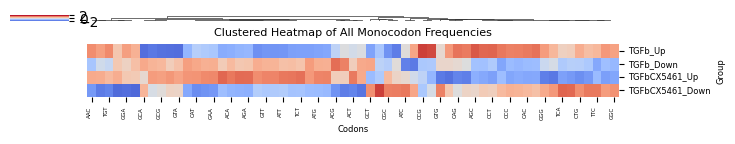

Generated clustered heatmap with shape (4, 61) for heatmap_all_monocodon_clustered (PNG, SVG, PDF)
Saved feature matrix to monocodon_feature_matrix.txt
Total runtime: 0.04 minutes


In [27]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
import time
import os

# Set Matplotlib font settings for PDF and PS to use Type 42 fonts
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Set up logging
logging.basicConfig(filename='heatmap_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Start timing
start_time = time.time()

# Combined heatmap plotting function with enhanced color gradient, no annotations
def plot_combined_heatmap(X, feature_names, labels, filename='heatmap_all_monocodon_clustered'):
    try:
        # Ensure labels is a NumPy array
        labels = np.array(labels, dtype=int)
        group_masks = {
            'TGFb_Up': labels == 1,
            'TGFb_Down': labels == 0,
            'TGFbCX5461_Up': labels == 3,
            'TGFbCX5461_Down': labels == 2
        }
        # Require all groups to have sequences
        missing_groups = [name for name, mask in group_masks.items() if mask.sum() == 0]
        if missing_groups:
            print(f"Error: No sequences for groups {missing_groups}. All groups required for heatmap.")
            logging.error(f"No sequences for groups {missing_groups}. All groups required for heatmap.")
            exit(1)
        for group_name, mask in group_masks.items():
            print(f"{group_name} mask sum: {mask.sum()} sequences")
            logging.info(f"{group_name} mask sum: {mask.sum()} sequences")
        
        # Compute mean feature values for each group
        X_means = []
        for mask in group_masks.values():
            if mask.sum() > 0:
                mean_values = np.mean(X[mask], axis=0)
                mean_values = np.nan_to_num(mean_values, nan=0.0, posinf=0.0, neginf=0.0)
                X_means.append(mean_values)
            else:
                print(f"Warning: Empty group detected after validation.")
                logging.warning(f"Empty group detected after validation.")
                exit(1)
        X_combined = np.vstack(X_means)
        print(f"Combined heatmap data shape: {X_combined.shape}")
        logging.info(f"Combined heatmap data shape: {X_combined.shape}")
        
        # Verify no NaN or Inf values
        if np.any(np.isnan(X_combined)) or np.any(np.isinf(X_combined)):
            print(f"Error: X_combined contains NaN or Inf values: {X_combined}")
            logging.error(f"X_combined contains NaN or Inf values: {X_combined}")
            exit(1)
        
        # Verify all 61 codons are included
        if X_combined.shape[1] != 61:
            print(f"Error: Expected 61 codons in heatmap, got {X_combined.shape[1]}")
            logging.error(f"Expected 61 codons in heatmap, got {X_combined.shape[1]}")
            exit(1)
        
        # Z-score normalization to emphasize small differences
        scaler = StandardScaler()
        X_combined = scaler.fit_transform(X_combined)
        X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Create DataFrame for clustering
        heatmap_df = pd.DataFrame(X_combined, index=list(group_masks.keys()), 
                                columns=feature_names)
        
        # Set color scale to highlight small differences
        data_std = np.std(X_combined)
        vmin, vmax = -2 * data_std, 2 * data_std  # ±2 standard deviations
        center = 0  # Center at zero for standardized data
        
        # Plot clustered heatmap with enhanced gradient, no annotations
        g = sns.clustermap(heatmap_df, col_cluster=True, row_cluster=False, cmap='coolwarm',
                          vmin=vmin, vmax=vmax, center=center, robust=True,
                          figsize=(7.3, 1.5), dendrogram_ratio=0.1, cbar_pos=(0.02, 0.8, 0.05, 0.18),
                          annot=False)
        g.ax_heatmap.set_title('Clustered Heatmap of All Monocodon Frequencies', fontsize=8)
        g.ax_heatmap.set_xlabel('Codons', fontsize=6)
        g.ax_heatmap.set_ylabel('Group', fontsize=6)
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='right', fontsize=4)
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0, va='center', fontsize=6)
        # Adjust layout to fit narrow width
        plt.tight_layout(pad=0.5)
        # Save as PNG, SVG, and PDF without bbox_inches='tight'
        g.savefig(f'{filename}.png')
        g.savefig(f'{filename}.svg')
        g.savefig(f'{filename}.pdf', transparent=True)
        # Log figure size
        fig_width, fig_height = g.fig.get_size_inches()
        print(f"Saved figure with size: {fig_width:.2f} inches wide, {fig_height:.2f} inches tall")
        logging.info(f"Saved figure with size: {fig_width:.2f} inches wide, {fig_height:.2f} inches tall")
        # Log number of codons plotted
        print(f"Plotted {len(feature_names)} codons in heatmap")
        logging.info(f"Plotted {len(feature_names)} codons in heatmap")
        plt.show()
        plt.close()
        print(f"Generated clustered heatmap with shape {X_combined.shape} for {filename} (PNG, SVG, PDF)")
        logging.info(f"Generated clustered heatmap with shape {X_combined.shape} for {filename} (PNG, SVG, PDF)")
    except Exception as e:
        print(f"Clustered heatmap generation failed for {filename}: {e}")
        logging.error(f"Clustered heatmap generation failed for {filename}: {e}")
        raise e

# Codon table
STOP_CODONS = ['TAA', 'TAG', 'TGA']

def load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file):
    sequences, labels, gene_ids = [], [], []
    files_to_load = [
        (tgfb_up_file, 1, 'TGFb_Up'),
        (tgfb_down_file, 0, 'TGFb_Down'),
        (treated_up_file, 3, 'TGFbCX5461_Up'),
        (treated_down_file, 2, 'TGFbCX5461_Down')
    ]
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label, group_name in files_to_load:
            if not os.path.exists(file_path):
                print(f"Error: File {file_path} ({group_name}) not found. All FASTA files are required.")
                logging.error(f"File {file_path} ({group_name}) not found. All FASTA files are required.")
                exit(1)
            try:
                seq_count = 0
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} in {group_name} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id} in {group_name}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(int(label))
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
                    seq_count += 1
                print(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
                logging.info(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
            except Exception as e:
                print(f"Error reading {file_path} ({group_name}): {e}")
                logging.error(f"Error reading {file_path} ({group_name}): {e}")
                exit(1)
    if not sequences:
        print("No sequences loaded from any FASTA files. Exiting.")
        logging.error("No sequences loaded from any FASTA files. Exiting.")
        exit(1)
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    labels = np.array(labels, dtype=int)
    print(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    logging.info(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    # Verify all groups have sequences
    required_labels = [0, 1, 2, 3]
    missing_labels = [lbl for lbl in required_labels if np.sum(labels == lbl) == 0]
    if missing_labels:
        print(f"Error: No sequences for labels {missing_labels}. All groups required.")
        logging.error(f"No sequences for labels {missing_labels}. All groups required.")
        exit(1)
    return sequences, labels, gene_ids

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file)
print(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (61 codons, excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out() if codon.upper() not in STOP_CODONS]
# Filter stop codons from X_codon
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))
# Scale with StandardScaler
scaler = StandardScaler()
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")

# Debug codon features
print("NaNs in X_codon_scaled:", np.any(np.isnan(X_codon_scaled)))
print("Infs in X_codon_scaled:", np.any(np.isinf(X_codon_scaled)))
print("Monocodon features non-zero counts:", (X_codon_scaled != 0).sum())
logging.info(f"NaNs in X_codon_scaled: {np.any(np.isnan(X_codon_scaled))}")
logging.info(f"Infs in X_codon_scaled: {np.any(np.isinf(X_codon_scaled))}")
logging.info(f"Monocodon features non-zero counts: {(X_codon_scaled != 0).sum()}")

# Use all 61 codons for heatmap (no feature selection)
X_selected = X_codon_scaled
selected_feature_names = codon_feature_names
print(f"Using all {len(selected_feature_names)} codons for heatmap: {selected_feature_names}")
logging.info(f"Using all {len(selected_feature_names)} codons for heatmap: {selected_feature_names}")

# Generate clustered heatmap with all 61 codons
try:
    plot_combined_heatmap(X_selected, selected_feature_names, labels, 'heatmap_all_monocodon_clustered')
except Exception as e:
    print(f"Heatmap generation failed: {e}")
    logging.error(f"Heatmap generation failed: {e}")
    raise e

# Save feature matrices
try:
    X_codon_df = pd.DataFrame(X_codon_scaled, columns=codon_feature_names, index=gene_ids)
    X_codon_df.to_csv('monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrix to monocodon_feature_matrix.txt")
    logging.info("Saved feature matrix to monocodon_feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrix: {e}")
    logging.error(f"Error saving feature matrix: {e}")

# Print total runtime
print(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")
logging.info(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")


Loaded 278 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta (TGFb_Up) with label 1
Loaded 3051 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta (TGFb_Down) with label 0
Loaded 771 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta (TGFbCX5461_Up) with label 3
Loaded 162 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta (TGFbCX5461_Down) with label 2
Label distribution: [3051  278  162  771] (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)
Loaded 4262 sequences: 278 TGFb_Up, 3051 TGFb_Down, 771 TGFbCX5461_Up, 162 TGFbCX5461_Down
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
X_codon type: <class 'scipy.sparse._csr.csr_matrix'>, X_codon_normalized type: <class 'scipy.sparse._coo.coo_matrix'>, X_codon_scaled type: <class 'nump

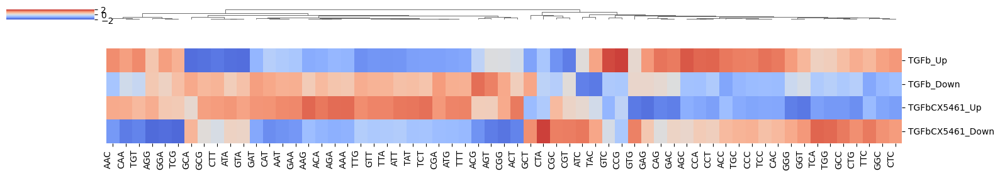

Generated clustered heatmap with shape (4, 61) for heatmap_all_monocodon_clustered (PNG, SVG, PDF)
Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt
Total runtime: 0.06 minutes


In [35]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
import time
import os

# Set Matplotlib font settings for PDF and PS to use Type 42 fonts
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Set up logging
logging.basicConfig(filename='heatmap_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Start timing
start_time = time.time()

# Combined heatmap plotting function with enhanced color gradient, no annotations
def plot_combined_heatmap(X, feature_names, labels, filename='heatmap_all_monocodon_clustered'):
    try:
        # Ensure labels is a NumPy array
        labels = np.array(labels, dtype=int)
        group_masks = {
            'TGFb_Up': labels == 1,
            'TGFb_Down': labels == 0,
            'TGFbCX5461_Up': labels == 3,
            'TGFbCX5461_Down': labels == 2
        }
        # Require all groups to have sequences
        missing_groups = [name for name, mask in group_masks.items() if mask.sum() == 0]
        if missing_groups:
            print(f"Error: No sequences for groups {missing_groups}. All groups required for heatmap.")
            logging.error(f"No sequences for groups {missing_groups}. All groups required for heatmap.")
            exit(1)
        for group_name, mask in group_masks.items():
            print(f"{group_name} mask sum: {mask.sum()} sequences")
            logging.info(f"{group_name} mask sum: {mask.sum()} sequences")
        
        # Compute mean feature values for each group
        X_means = []
        for mask in group_masks.items():
            if mask[1].sum() > 0:
                mean_values = np.mean(X[mask[1]], axis=0)
                mean_values = np.nan_to_num(mean_values, nan=0.0, posinf=0.0, neginf=0.0)
                X_means.append(mean_values)
            else:
                print(f"Warning: Empty group detected after validation.")
                logging.warning(f"Empty group detected after validation.")
                exit(1)
        X_combined = np.vstack(X_means)
        print(f"Combined heatmap data shape: {X_combined.shape}")
        logging.info(f"Combined heatmap data shape: {X_combined.shape}")
        
        # Verify no NaN or Inf values
        if np.any(np.isnan(X_combined)) or np.any(np.isinf(X_combined)):
            print(f"Error: X_combined contains NaN or Inf values: {X_combined}")
            logging.error(f"X_combined contains NaN or Inf values: {X_combined}")
            exit(1)
        
        # Z-score normalization to emphasize small differences
        scaler = StandardScaler()
        X_combined = scaler.fit_transform(X_combined)
        X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Create DataFrame for clustering
        heatmap_df = pd.DataFrame(X_combined, index=list(group_masks.keys()), 
                                columns=feature_names)
        
        # Set color scale to highlight small differences
        data_std = np.std(X_combined)
        vmin, vmax = -2 * data_std, 2 * data_std  # ±2 standard deviations
        center = 0  # Center at zero for standardized data
        
        # Plot clustered heatmap with enhanced gradient, no annotations
        g = sns.clustermap(heatmap_df, col_cluster=True, row_cluster=False, cmap='coolwarm',
                          vmin=vmin, vmax=vmax, center=center, robust=True,
                          figsize=(16, 3), dendrogram_ratio=0.1, cbar_pos=(0.02, 0.8, 0.05, 0.18),
                          annot=False)
        #g.ax_heatmap.set_title('Clustered Heatmap of All Monocodon Frequencies')
        #g.ax_heatmap.set_xlabel('Codons')
        #g.ax_heatmap.set_ylabel('Group')
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='right')
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0, va='center')
        plt.tight_layout()
        # Save as PNG, SVG, and PDF
        g.savefig(f'{filename}.png', bbox_inches='tight')
        g.savefig(f'{filename}.svg', bbox_inches='tight')
        g.savefig(f'{filename}.pdf', bbox_inches='tight', transparent=True)
        fig_width, fig_height = g.fig.get_size_inches()
        plt.show()
        plt.close()
        print(f"Generated clustered heatmap with shape {X_combined.shape} for {filename} (PNG, SVG, PDF)")
        logging.info(f"Generated clustered heatmap with shape {X_combined.shape} for {filename} (PNG, SVG, PDF)")
    except Exception as e:
        print(f"Clustered heatmap generation failed for {filename}: {e}")
        logging.error(f"Clustered heatmap generation failed for {filename}: {e}")
        raise e

# Codon table
STOP_CODONS = ['TAA', 'TAG', 'TGA']

def load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file):
    sequences, labels, gene_ids = [], [], []
    files_to_load = [
        (tgfb_up_file, 1, 'TGFb_Up'),
        (tgfb_down_file, 0, 'TGFb_Down'),
        (treated_up_file, 3, 'TGFbCX5461_Up'),
        (treated_down_file, 2, 'TGFbCX5461_Down')
    ]
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label, group_name in files_to_load:
            if not os.path.exists(file_path):
                print(f"Error: File {file_path} ({group_name}) not found. All FASTA files are required.")
                logging.error(f"File {file_path} ({group_name}) not found. All FASTA files are required.")
                exit(1)
            try:
                seq_count = 0
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} in {group_name} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id} in {group_name}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(int(label))
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
                    seq_count += 1
                print(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
                logging.info(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
            except Exception as e:
                print(f"Error reading {file_path} ({group_name}): {e}")
                logging.error(f"Error reading {file_path} ({group_name}): {e}")
                exit(1)
    if not sequences:
        print("No sequences loaded from any FASTA files. Exiting.")
        logging.error("No sequences loaded from any FASTA files. Exiting.")
        exit(1)
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    labels = np.array(labels, dtype=int)
    print(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    logging.info(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    # Verify all groups have sequences
    required_labels = [0, 1, 2, 3]
    missing_labels = [lbl for lbl in required_labels if np.sum(labels == lbl) == 0]
    if missing_labels:
        print(f"Error: No sequences for labels {missing_labels}. All groups required.")
        logging.error(f"No sequences for labels {missing_labels}. All groups required.")
        exit(1)
    return sequences, labels, gene_ids

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file)
print(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (61 codons, excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out() if codon.upper() not in STOP_CODONS]
# Filter stop codons from X_codon
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))
# Scale with StandardScaler
scaler = StandardScaler()
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")

# Debug codon features
print("NaNs in X_codon_scaled:", np.any(np.isnan(X_codon_scaled)))
print("Infs in X_codon_scaled:", np.any(np.isinf(X_codon_scaled)))
print("Monocodon features non-zero counts:", (X_codon_scaled != 0).sum())
logging.info(f"NaNs in X_codon_scaled: {np.any(np.isnan(X_codon_scaled))}")
logging.info(f"Infs in X_codon_scaled: {np.any(np.isinf(X_codon_scaled))}")
logging.info(f"Monocodon features non-zero counts: {(X_codon_scaled != 0).sum()}")

# Feature selection with LogisticRegression for TGFb Up vs. Down
try:
    k_features = 61
    print("Starting LogisticRegression feature selection on TGFb data...")
    logging.info("Starting LogisticRegression feature selection on TGFb data...")
    tgfb_mask = np.isin(labels, [0, 1])
    X_tgfb = X_codon_scaled[tgfb_mask]
    labels_tgfb = labels[tgfb_mask]
    print(f"TGFb data shape: {X_tgfb.shape}, Labels: {np.bincount(labels_tgfb)}")
    logging.info(f"TGFb data shape: {X_tgfb.shape}, Labels: {np.bincount(labels_tgfb)}")
    if X_tgfb.shape[0] == 0:
        raise ValueError("No TGFb data available for LogisticRegression")
    lr_tgfb = LogisticRegression(penalty='l1', solver='liblinear', C=1.0, random_state=42, max_iter=1000)
    lr_tgfb.fit(X_tgfb, labels_tgfb)
    tgfb_coefs = np.abs(lr_tgfb.coef_[0])
    non_zero_coefs = np.sum(tgfb_coefs != 0)
    print(f"TGFb LogisticRegression non-zero coefficients: {non_zero_coefs}")
    logging.info(f"TGFb LogisticRegression non-zero coefficients: {non_zero_coefs}")
    tgfb_indices = np.argsort(tgfb_coefs)[::-1][:k_features]
    tgfb_selected_features = [codon_feature_names[i] for i in tgfb_indices]
    X_tgfb_selected = X_codon_scaled[:, tgfb_indices]
    print(f"TGFb LogisticRegression selected {len(tgfb_selected_features)} features: {tgfb_selected_features}")
    logging.info(f"TGFb LogisticRegression selected {len(tgfb_selected_features)} features: {tgfb_selected_features}")
    print(f"TGFb LogisticRegression coefficients (top 5): {list(zip(tgfb_selected_features[:5], tgfb_coefs[tgfb_indices][:5]))}")
    logging.info(f"TGFb LogisticRegression coefficients (top 5): {list(zip(tgfb_selected_features[:5], tgfb_coefs[tgfb_indices][:5]))}")
except Exception as e:
    print(f"Error in LogisticRegression feature selection: {e}")
    logging.error(f"Error in LogisticRegression feature selection: {e}")
    exit(1)

# Generate clustered heatmap
try:
    plot_combined_heatmap(X_tgfb_selected, tgfb_selected_features, labels, 'heatmap_all_monocodon_clustered')
except Exception as e:
    print(f"Heatmap generation failed: {e}")
    logging.error(f"Heatmap generation failed: {e}")
    raise e

# Save feature matrices
try:
    X_codon_df = pd.DataFrame(X_codon_scaled, columns=codon_feature_names, index=gene_ids)
    X_codon_df.to_csv('monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    X_tgfb_selected_df = pd.DataFrame(X_tgfb_selected, columns=tgfb_selected_features, index=gene_ids)
    X_tgfb_selected_df.to_csv('tgfb_selected_monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
    logging.info("Saved feature matrices to monocodon_feature_matrix.txt and tgfb_selected_monocodon_feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrices: {e}")
    logging.error(f"Error saving feature matrices: {e}")

# Print total runtime
print(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")
logging.info(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")

Loaded 278 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta (TGFb_Up) with label 1
Loaded 3051 sequences from Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta (TGFb_Down) with label 0
Loaded 771 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta (TGFbCX5461_Up) with label 3
Loaded 162 sequences from Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta (TGFbCX5461_Down) with label 2
Label distribution: [3051  278  162  771] (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)
Loaded 4262 sequences: 278 TGFb_Up, 3051 TGFb_Down, 771 TGFbCX5461_Up, 162 TGFbCX5461_Down
Sample gene_ids (first 5): ['ENSMUST00000094892', 'ENSMUST00000039559', 'ENSMUST00000025844', 'ENSMUST00000043718', 'ENSMUST00000113278']
X_codon type: <class 'scipy.sparse._csr.csr_matrix'>, X_codon_normalized type: <class 'scipy.sparse._coo.coo_matrix'>, X_codon_scaled type: <class 'nump

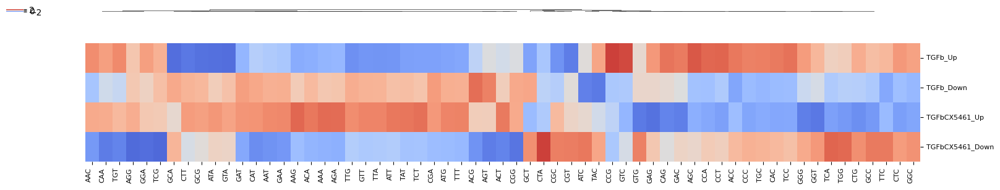

Generated clustered heatmap with shape (4, 61) for heatmap_all_monocodon_clustered (PNG, SVG, PDF)
Saved feature matrix to monocodon_feature_matrix.txt
Total runtime: 0.04 minutes


In [34]:
%matplotlib inline
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from Bio import BiopythonWarning
warnings.simplefilter("ignore", BiopythonWarning)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from Bio import SeqIO
import logging
from sklearn.feature_extraction.text import CountVectorizer
import time
import os

# Set Matplotlib font settings for PDF and PS to use Type 42 fonts
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Set up logging
logging.basicConfig(filename='heatmap_training.log', level=logging.DEBUG, 
                    format='%(asctime)s - %(levelname)s - %(message)s')

# Start timing
start_time = time.time()

# Combined heatmap plotting function with enhanced color gradient, no annotations
def plot_combined_heatmap(X, feature_names, labels, filename='heatmap_all_monocodon_clustered'):
    try:
        # Ensure labels is a NumPy array
        labels = np.array(labels, dtype=int)
        group_masks = {
            'TGFb_Up': labels == 1,
            'TGFb_Down': labels == 0,
            'TGFbCX5461_Up': labels == 3,
            'TGFbCX5461_Down': labels == 2
        }
        # Require all groups to have sequences
        missing_groups = [name for name, mask in group_masks.items() if mask.sum() == 0]
        if missing_groups:
            print(f"Error: No sequences for groups {missing_groups}. All groups required for heatmap.")
            logging.error(f"No sequences for groups {missing_groups}. All groups required for heatmap.")
            exit(1)
        for group_name, mask in group_masks.items():
            print(f"{group_name} mask sum: {mask.sum()} sequences")
            logging.info(f"{group_name} mask sum: {mask.sum()} sequences")
        
        # Compute mean feature values for each group
        X_means = []
        for mask in group_masks.values():
            if mask.sum() > 0:
                mean_values = np.mean(X[mask], axis=0)
                mean_values = np.nan_to_num(mean_values, nan=0.0, posinf=0.0, neginf=0.0)
                X_means.append(mean_values)
            else:
                print(f"Warning: Empty group detected after validation.")
                logging.warning(f"Empty group detected after validation.")
                exit(1)
        X_combined = np.vstack(X_means)
        print(f"Combined heatmap data shape: {X_combined.shape}")
        logging.info(f"Combined heatmap data shape: {X_combined.shape}")
        
        # Verify no NaN or Inf values
        if np.any(np.isnan(X_combined)) or np.any(np.isinf(X_combined)):
            print(f"Error: X_combined contains NaN or Inf values: {X_combined}")
            logging.error(f"X_combined contains NaN or Inf values: {X_combined}")
            exit(1)
        
        # Verify all 61 codons are included
        if X_combined.shape[1] != 61:
            print(f"Error: Expected 61 codons in heatmap, got {X_combined.shape[1]}")
            logging.error(f"Expected 61 codons in heatmap, got {X_combined.shape[1]}")
            exit(1)
        
        # Z-score normalization to emphasize small differences
        scaler = StandardScaler()
        X_combined = scaler.fit_transform(X_combined)
        X_combined = np.nan_to_num(X_combined, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Create DataFrame for clustering
        heatmap_df = pd.DataFrame(X_combined, index=list(group_masks.keys()), 
                                columns=feature_names)
        
        # Set color scale to highlight small differences
        data_std = np.std(X_combined)
        vmin, vmax = -2 * data_std, 2 * data_std  # ±2 standard deviations
        center = 0  # Center at zero for standardized data
        
        # Plot clustered heatmap with minimal dendrogram space
        g = sns.clustermap(heatmap_df, col_cluster=True, row_cluster=False, cmap='coolwarm',
                          vmin=vmin, vmax=vmax, center=center, robust=True,
                          figsize=(16, 3), dendrogram_ratio=0.02, cbar_pos=(0.02, 0.8, 0.05, 0.18),
                          annot=False)
        #g.ax_heatmap.set_title('Clustered Heatmap of All Monocodon Frequencies', fontsize=12)
        #g.ax_heatmap.set_xlabel('Codons', fontsize=10)
        #g.ax_heatmap.set_ylabel('Group', fontsize=10)
        g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, ha='right', fontsize=8)
        g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0, va='center', fontsize=8)
        # Ensure x-axis labels are at the bottom
        g.ax_heatmap.xaxis.set_label_position('bottom')
        g.ax_heatmap.xaxis.set_ticks_position('bottom')
        # Adjust layout with minimal padding
        plt.tight_layout(pad=0.1, h_pad=0.1, w_pad=0.1)
        # Save as PNG, SVG, and PDF without bbox_inches='tight'
        g.savefig(f'{filename}.png')
        g.savefig(f'{filename}.svg')
        g.savefig(f'{filename}.pdf', transparent=True)
        # Log figure size
        fig_width, fig_height = g.fig.get_size_inches()
        print(f"Saved figure with size: {fig_width:.2f} inches wide, {fig_height:.2f} inches tall")
        logging.info(f"Saved figure with size: {fig_width:.2f} inches wide, {fig_height:.2f} inches tall")
        # Log number of codons plotted and their names
        plotted_codons = [label.get_text() for label in g.ax_heatmap.get_xticklabels()]
        print(f"Plotted {len(plotted_codons)} codons in heatmap: {plotted_codons}")
        logging.info(f"Plotted {len(plotted_codons)} codons in heatmap: {plotted_codons}")
        plt.show()
        plt.close()
        print(f"Generated clustered heatmap with shape {X_combined.shape} for {filename} (PNG, SVG, PDF)")
        logging.info(f"Generated clustered heatmap with shape {X_combined.shape} for {filename} (PNG, SVG, PDF)")
    except Exception as e:
        print(f"Clustered heatmap generation failed for {filename}: {e}")
        logging.error(f"Clustered heatmap generation failed for {filename}: {e}")
        raise e

# Codon table
STOP_CODONS = ['TAA', 'TAG', 'TGA']

def load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file):
    sequences, labels, gene_ids = [], [], []
    files_to_load = [
        (tgfb_up_file, 1, 'TGFb_Up'),
        (tgfb_down_file, 0, 'TGFb_Down'),
        (treated_up_file, 3, 'TGFbCX5461_Up'),
        (treated_down_file, 2, 'TGFbCX5461_Down')
    ]
    with open('fasta_warnings.log', 'w') as log_file:
        for file_path, label, group_name in files_to_load:
            if not os.path.exists(file_path):
                print(f"Error: File {file_path} ({group_name}) not found. All FASTA files are required.")
                logging.error(f"File {file_path} ({group_name}) not found. All FASTA files are required.")
                exit(1)
            try:
                seq_count = 0
                for record in SeqIO.parse(file_path, 'fasta'):
                    seq = str(record.seq).upper()
                    if len(seq) >= 3:
                        seq = seq[:-3]
                    if len(seq) % 3 != 0 or any(base in seq for base in 'NXRYSWKM'):
                        log_file.write(f"Warning: Skipping {record.id} in {group_name} (length {len(seq)} not divisible by 3 or contains ambiguous bases)\n")
                        logging.warning(f"Skipping {record.id} in {group_name}: length {len(seq)} not divisible by 3 or contains ambiguous bases")
                        continue
                    sequences.append(seq)
                    labels.append(int(label))
                    gene_id = record.id
                    if '|' in record.id:
                        gene_id = next((part for part in record.id.split('|') if part.startswith('ENSMUST')), record.id)
                    gene_ids.append(gene_id)
                    seq_count += 1
                print(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
                logging.info(f"Loaded {seq_count} sequences from {file_path} ({group_name}) with label {label}")
            except Exception as e:
                print(f"Error reading {file_path} ({group_name}): {e}")
                logging.error(f"Error reading {file_path} ({group_name}): {e}")
                exit(1)
    if not sequences:
        print("No sequences loaded from any FASTA files. Exiting.")
        logging.error("No sequences loaded from any FASTA files. Exiting.")
        exit(1)
    with open('fasta_gene_ids.txt', 'w') as f:
        f.write('\n'.join(gene_ids))
    labels = np.array(labels, dtype=int)
    print(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    logging.info(f"Label distribution: {np.bincount(labels)} (0: TGFb_Down, 1: TGFb_Up, 2: TGFbCX5461_Down, 3: TGFbCX5461_Up)")
    # Verify all groups have sequences
    required_labels = [0, 1, 2, 3]
    missing_labels = [lbl for lbl in required_labels if np.sum(labels == lbl) == 0]
    if missing_labels:
        print(f"Error: No sequences for labels {missing_labels}. All groups required.")
        logging.error(f"No sequences for labels {missing_labels}. All groups required.")
        exit(1)
    return sequences, labels, gene_ids

def sequence_to_codons(seq):
    return ' '.join([seq[i:i+3] for i in range(0, len(seq), 3)])

# Input file paths
tgfb_up_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_up_logFC_0.5.fasta'
tgfb_down_file = 'Riboseq_Total_RNAseq_Davide_Like_unt_vs_tgfb_de_genes_down_logFC_0.5.fasta'
treated_up_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_genes_up_logFC_0.5.fasta'
treated_down_file = 'Riboseq_Total_RNAseq_Davide_Like_CX5461_Vs_TGFb_de_genes_down_logFC_0.5.fasta'

# Load sequences, labels, and gene IDs
sequences, labels, gene_ids = load_fasta_sequences(tgfb_up_file, tgfb_down_file, treated_up_file, treated_down_file)
print(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
print(f"Sample gene_ids (first 5): {gene_ids[:5]}")
logging.info(f"Loaded {len(sequences)} sequences: {np.sum(labels == 1)} TGFb_Up, {np.sum(labels == 0)} TGFb_Down, {np.sum(labels == 3)} TGFbCX5461_Up, {np.sum(labels == 2)} TGFbCX5461_Down")
logging.info(f"Sample gene_ids (first 5): {gene_ids[:5]}")

# Validate consistency
if len(sequences) != len(labels) or len(sequences) != len(gene_ids):
    raise ValueError(f"Mismatch: {len(sequences)} sequences, {len(labels)} labels, {len(gene_ids)} gene IDs")

# Convert sequences to codon sequences
codon_sequences = [sequence_to_codons(seq) for seq in sequences]

# Monocodon frequencies (61 codons, excluding stop codons)
codon_vectorizer = CountVectorizer(analyzer='word', token_pattern=r'\S+', lowercase=False)
X_codon = codon_vectorizer.fit_transform(codon_sequences)
codon_feature_names = [codon.replace('t', 'u').upper() for codon in codon_vectorizer.get_feature_names_out() if codon.upper() not in STOP_CODONS]
# Filter stop codons from X_codon
codon_features = codon_vectorizer.get_feature_names_out()
codon_indices = [i for i, codon in enumerate(codon_features) if codon.upper() not in STOP_CODONS]
X_codon = X_codon[:, codon_indices]
# Verify 61 codons
if len(codon_feature_names) != 61:
    print(f"Error: Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    logging.error(f"Expected 61 codon features, got {len(codon_feature_names)}: {codon_feature_names}")
    exit(1)
# Normalize codon counts
sequence_lengths = np.array([len(seq) // 3 for seq in sequences], dtype=np.float32)
X_codon_normalized = X_codon.multiply(1 / (sequence_lengths[:, np.newaxis] + 1e-6))
# Scale with StandardScaler
scaler = StandardScaler()
X_codon_scaled = scaler.fit_transform(X_codon_normalized.toarray())
X_codon_scaled = np.nan_to_num(X_codon_scaled, nan=0.0, posinf=0.0, neginf=0.0)
print(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")
logging.info(f"X_codon type: {type(X_codon)}, X_codon_normalized type: {type(X_codon_normalized)}, X_codon_scaled type: {type(X_codon_scaled)}")

# Debug codon features
print("NaNs in X_codon_scaled:", np.any(np.isnan(X_codon_scaled)))
print("Infs in X_codon_scaled:", np.any(np.isinf(X_codon_scaled)))
print("Monocodon features non-zero counts:", (X_codon_scaled != 0).sum())
logging.info(f"NaNs in X_codon_scaled: {np.any(np.isnan(X_codon_scaled))}")
logging.info(f"Infs in X_codon_scaled: {np.any(np.isinf(X_codon_scaled))}")
logging.info(f"Monocodon features non-zero counts: {(X_codon_scaled != 0).sum()}")

# Use all 61 codons for heatmap (no feature selection)
X_selected = X_codon_scaled
selected_feature_names = codon_feature_names
print(f"Using all {len(selected_feature_names)} codons for heatmap: {selected_feature_names}")
logging.info(f"Using all {len(selected_feature_names)} codons for heatmap: {selected_feature_names}")

# Generate clustered heatmap with all 61 codons
try:
    plot_combined_heatmap(X_selected, selected_feature_names, labels, 'heatmap_all_monocodon_clustered')
except Exception as e:
    print(f"Heatmap generation failed: {e}")
    logging.error(f"Heatmap generation failed: {e}")
    raise e

# Save feature matrices
try:
    X_codon_df = pd.DataFrame(X_codon_scaled, columns=codon_feature_names, index=gene_ids)
    X_codon_df.to_csv('monocodon_feature_matrix.txt', sep='\t', index_label='transcript_id')
    print("Saved feature matrix to monocodon_feature_matrix.txt")
    logging.info("Saved feature matrix to monocodon_feature_matrix.txt")
except Exception as e:
    print(f"Error saving feature matrix: {e}")
    logging.error(f"Error saving feature matrix: {e}")

# Print total runtime
print(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")
logging.info(f"Total runtime: {(time.time() - start_time) / 60:.2f} minutes")